In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import re
import datetime
from tqdm import tqdm

In [ ]:
from google.colab import drive, files
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
NUM_T = [1_000, 10_000, 100_000, 1_000_000]
T_STRINGS = [r'$10^{3}$', r'$10^{4}$', r'$10^{5}$', r'$10^{6}$']
NUM_K = [20, 50, 100, 200]
ALGOS = ['BanditNAS', 'HyperBand', 'EXP3', 'EXP3_S', 'EXP3_P', 'EXP3_IX', 'Restless']
FIGSIZE = (6,6)
FONTSIZE = 15

In [ ]:
CONFIGS = {
    20: [np.arange(2, 10 + 1, 2), np.arange(2, 8 + 1, 2)],
    50: [np.arange(2, 10 + 1, 2), np.arange(2, 20 + 1, 2)],
    100: [np.arange(2, 20 + 1, 2), np.arange(2, 20 + 1, 2)],
    200: [np.arange(2, 20 + 1, 2), np.arange(2, 40 + 1, 2)]
}

In [ ]:
def PlotSelections(input_string):

    ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
    pulls = extract_float_lists(input_string)
    K = len(pulls[1])
    DATA = np.array(pulls[1])
    T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
    Algo_string = [a for a in ALGORITHMS if a in input_string][0]
    print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
    print(f'Total number of epochs: {DATA.sum()}')
    plt.figure(figsize=(6,6))
    #plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
    plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
    plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

    plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
    plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

    plt.xlabel('Model No.', fontsize=FONTSIZE)
    plt.ylabel('Selections', fontsize=FONTSIZE)
    plt.xticks(fontsize=FONTSIZE)
    plt.yticks(fontsize=FONTSIZE)
    plt.grid()
    plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
    plt.show()

In [ ]:
def PlotExpSelections(input_string):

    EXP_ALGOS = ALGOS[2:]
    pulls = extract_float_lists(input_string)
    #K = len(pulls[1])
    for i in range(len(EXP_ALGOS)):

        DATA = np.array(pulls[i])
        K_string = re.search(r"K\s*=\s*(\d+)", input_string).group(1)
        K = int(K_string)
        T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
        Exp_string = re.search(r"Experiment\s*:\s*(\d+)", input_string).group(1)
        #Algo_string = [a for a in ALGORITHMS if a in input_string][0]
        print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
        print(f'Total number of epochs: {DATA.sum()}')
        plt.figure(figsize=(6,6))
        plt.scatter(np.arange(K), pulls[i], color='black', alpha=0.4, s=2)
        plt.scatter(K - 5, pulls[i][K - 5], color='blue', marker='*', s=50)
        plt.scatter(np.arange(K - 5, K), pulls[i][K - 5 :], color='blue', marker='*', s=20)

        #plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
        #plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

        plt.xlabel('Model No.', fontsize=FONTSIZE)
        plt.ylabel('Selections', fontsize=FONTSIZE)
        plt.xticks(fontsize=FONTSIZE)
        plt.yticks(fontsize=FONTSIZE)
        plt.grid()
        plt.title(f'{EXP_ALGOS[i]}\nExperiment {Exp_string}\nT = {T_string}, K = {K_string}', fontsize=FONTSIZE)
        plt.show()

In [ ]:
def PlotHypSelections(input_string):

    pulls = extract_float_lists(input_string)
    DATA = np.array(pulls[0])
    K_string = re.search(r"K\s*=\s*(\d+)", input_string).group(1)
    K = int(K_string)
    T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
    Exp_string = re.search(r"Experiment\s*:\s*(\d+)", input_string).group(1)
    #Algo_string = [a for a in ALGORITHMS if a in input_string][0]
    print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
    print(f'Total number of epochs: {DATA.sum()}')
    plt.figure(figsize=(6,6))
    plt.scatter(np.arange(K), pulls[0], color='black', alpha=0.4, s=2)
    plt.scatter(K - 5, pulls[0][K - 5], color='blue', marker='*', s=50)
    plt.scatter(np.arange(K - 5, K), pulls[0][K - 5 :], color='blue', marker='*', s=20)

    #plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
    #plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

    plt.xlabel('Model No.', fontsize=FONTSIZE)
    plt.ylabel('Selections', fontsize=FONTSIZE)
    plt.xticks(fontsize=FONTSIZE)
    plt.yticks(fontsize=FONTSIZE)
    plt.grid()
    plt.title(f'HyperBand\nExperiment {Exp_string}\nT = {T_string}, K = {K_string}', fontsize=FONTSIZE)
    plt.show()

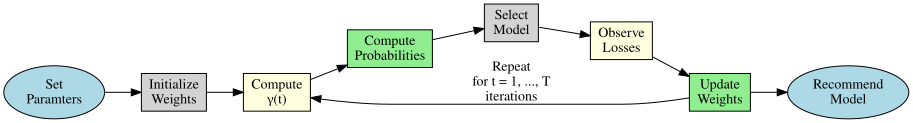

In [ ]:
# Install graphviz in Google Colab
#!apt-get install graphviz -y
#!pip install graphviz

import graphviz
from IPython.display import display, Image

def draw_bandit_nas():
    dot = graphviz.Digraph()

    # Set rank direction to left-to-right
    dot.attr(rankdir='LR')

    # Define nodes
    dot.node('Start', 'Set\nParamters', shape='ellipse', style='filled', fillcolor='lightblue')
    dot.node('Init', 'Initialize\nWeights', shape='box', style='filled', fillcolor='lightgrey')
    dot.node('Gamma', r'Compute\nγ(t)', shape='box', style='filled', fillcolor='lightyellow')
    dot.node('Prob', 'Compute\nProbabilities', shape='box', style='filled', fillcolor='lightgreen')
    dot.node('Select', 'Select\nModel', shape='box', style='filled', fillcolor='lightgrey')
    dot.node('Observe', 'Observe\nLosses', shape='box', style='filled', fillcolor='lightyellow')
    dot.node('Update', 'Update\nWeights', shape='box', style='filled', fillcolor='lightgreen')
    #dot.node('Repeat', 'Repeat for T Iterations', shape='ellipse', style='filled', fillcolor='lightblue')
    dot.node('End', 'Recommend\n Model', shape='ellipse', style='filled', fillcolor='lightblue')

    # Define edges
    dot.edge('Start', 'Init')
    dot.edge('Init', 'Gamma')
    dot.edge('Gamma', 'Prob')
    dot.edge('Prob', 'Select')
    dot.edge('Select', 'Observe')
    dot.edge('Observe', 'Update')
    dot.edge('Update', 'Gamma', label='Repeat\n for t = 1, ..., T\n iterations')
    dot.edge('Update', 'End')

    display(dot)
    output_path = dot.render("/drive/MyDrive/BanditNAS_graph", format="png")
    Image(output_path)

# Render the diagram
draw_bandit_nas()


In [ ]:
def compute_relative_difference(arr1, arr2):
    """
    Compute how much bigger the elements of arr1 are than arr2.

    Args:
        arr1 (np.ndarray): First NumPy array.
        arr2 (np.ndarray): Second NumPy array.

    Returns:
        np.ndarray: Relative difference (arr1 - arr2) / arr2
    """
    # Avoid division by zero
    with np.errstate(divide='ignore', invalid='ignore'):
        relative_difference = np.where(arr2 != 0, (arr1 - arr2) / arr2, np.nan)

    return relative_difference

## Example usage
#arr1 = np.array([10, 20, 30, 40])
#arr2 = np.array([2, 5, 10, 0])  # Includes a zero to demonstrate handling
#result = compute_relative_difference(arr1, arr2)
#print(result)

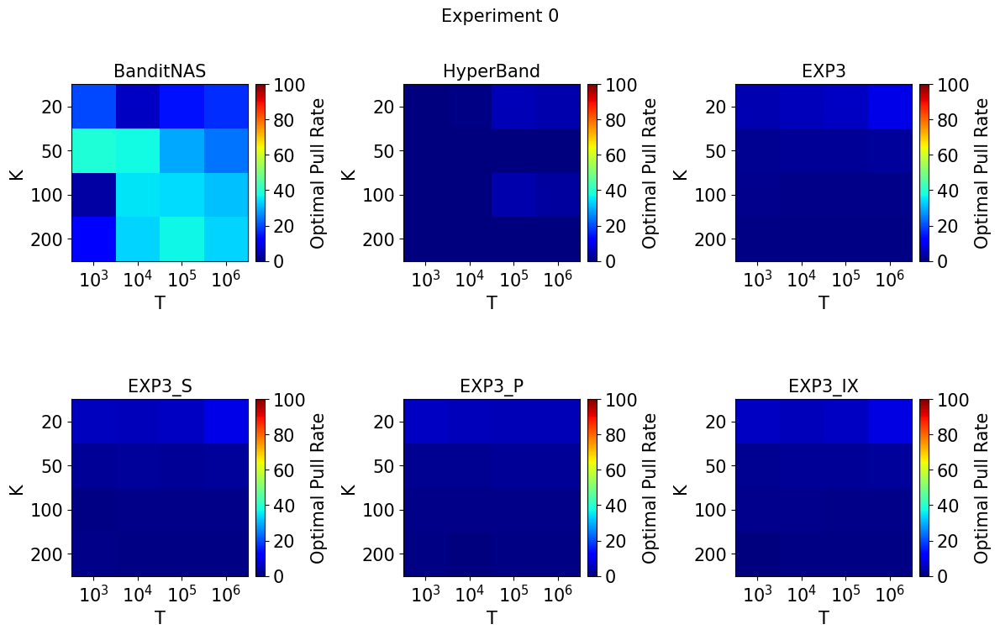

BanditNAS: 1.0000
HyperBand: 0.0436
EXP3: 0.0998
EXP3_S: 0.1033
EXP3_P: 0.0853
EXP3_IX: 0.1018


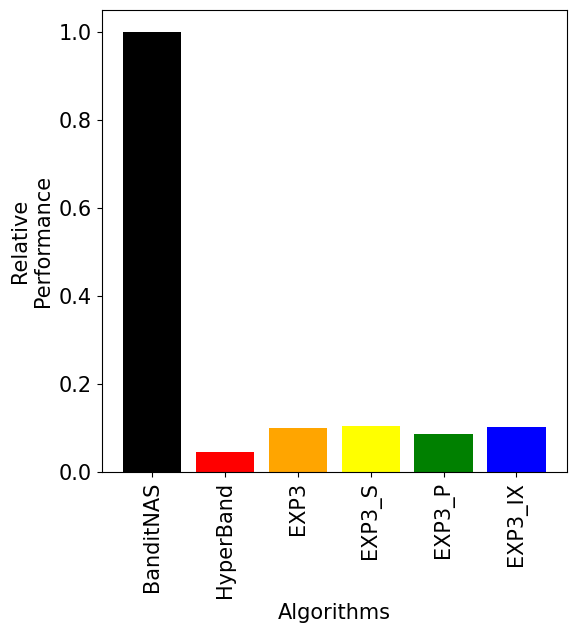

In [ ]:
PLOT = True
if PLOT:
  NUM_K = [20, 50, 100, 200]
  NUM_T = [1_000, 10_000, 100_000, 1_000_000]

  EXPERIMENT_NUM = 0
  VMIN, VMAX = 0, 100

  if EXPERIMENT_NUM == 0:
    BANDITNAS = [
        [11.867, 33.271, 36.780, 33.318],
        [3.245, 35.072, 34.241, 31.411],
        [38.829, 37.209, 28.948, 24.073],
        [19.765, 6.227, 14.352, 17.049]
    ]

    HYPERBAND = [
        [0.008, 0.017, 0.024, 0.025],
        [0.008, 0.053, 4.020, 3.095],
        [0.057, 0.078, 0.146, 0.188],
        [0.280, 0.534, 5.064, 4.087]
    ]

    EXP3 = [
        [0.7500, 0.5686, 0.5070, 0.5366],
        [1.5455, 1.0594, 1.0360, 1.1334],
        [1.8095, 2.2388, 2.0790, 2.5865],
        [4.3137, 5.0998, 6.0078, 9.2120]
    ]

    EXP3_S = [
        [0.8333, 0.4608, 0.5060, 0.5301],
        [0.5455, 1.0198, 1.0899, 1.1471],
        [2.2857, 2.5274, 2.1639, 2.5827],
        [5.4902, 5.4291, 6.0768, 9.2005]
    ]

    EXP3_P = [
        [0.5833, 0.3627, 0.5170, 0.5046],
        [1.0000, 1.0396, 1.0020, 0.9985],
        [1.6190, 1.9403, 1.9880, 1.9937],
        [5.8824, 5.2994, 4.8690, 5.0148]
    ]

    EXP3_IX = [
        [0.3333, 0.4118, 0.4880, 0.5182],
        [1.2727, 1.2178, 1.1039, 1.1083],
        [1.9048, 2.1493, 2.2519, 2.5803],
        [5.8824, 5.0798, 6.0428, 8.9635]
    ]

  DATA_LABEL = 'Optimal Pull Rate'
  EXPERIMENT_DATA = [BANDITNAS, HYPERBAND, EXP3, EXP3_S, EXP3_P, EXP3_IX]
  DATA_LABELS = ['BanditNAS', 'HyperBand', 'EXP3', 'EXP3_S', 'EXP3_P', 'EXP3_IX']

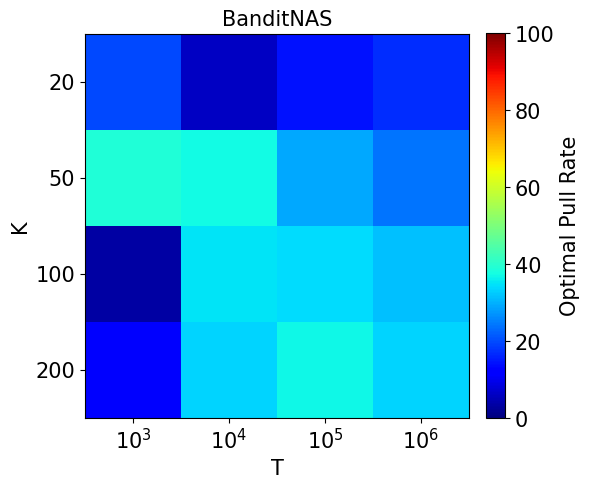

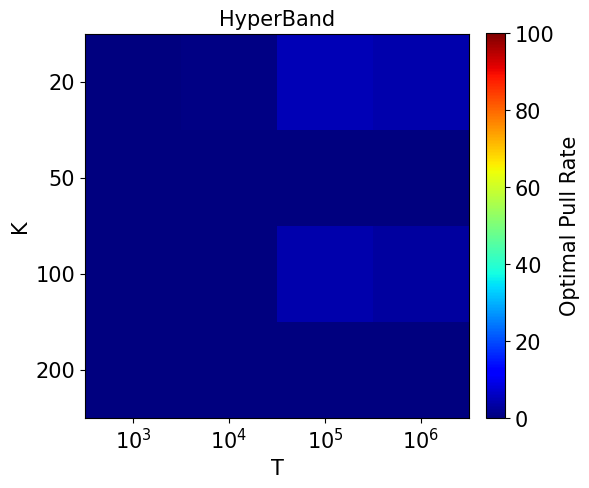

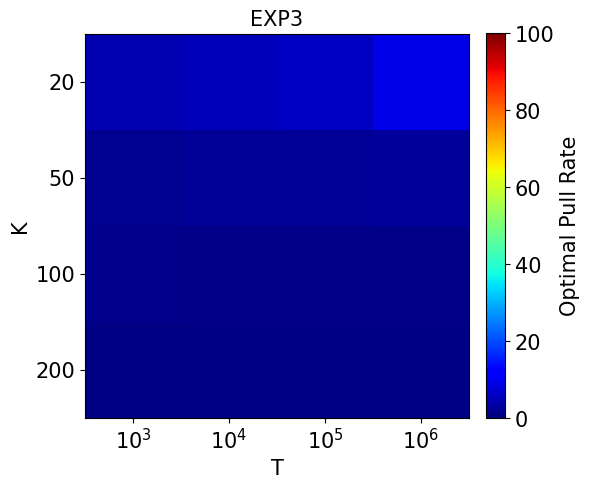

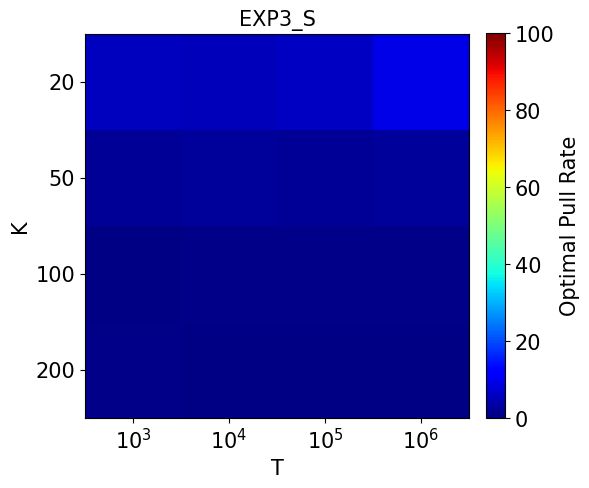

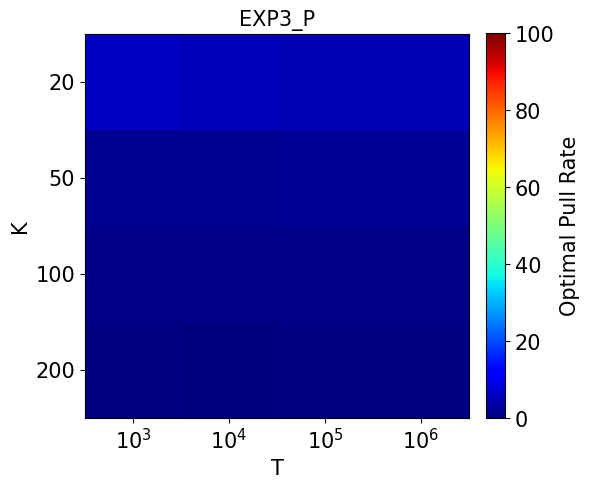

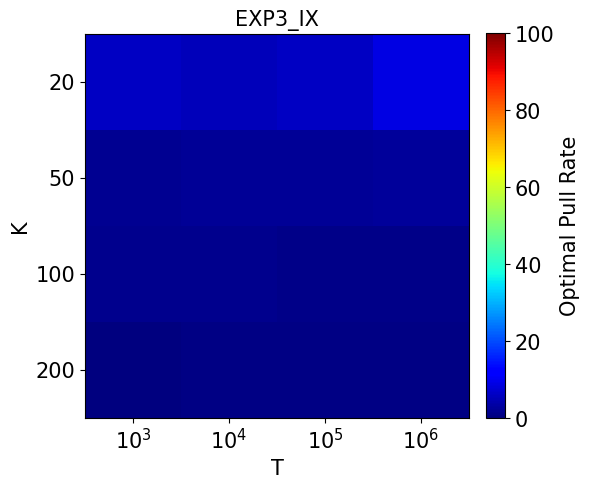

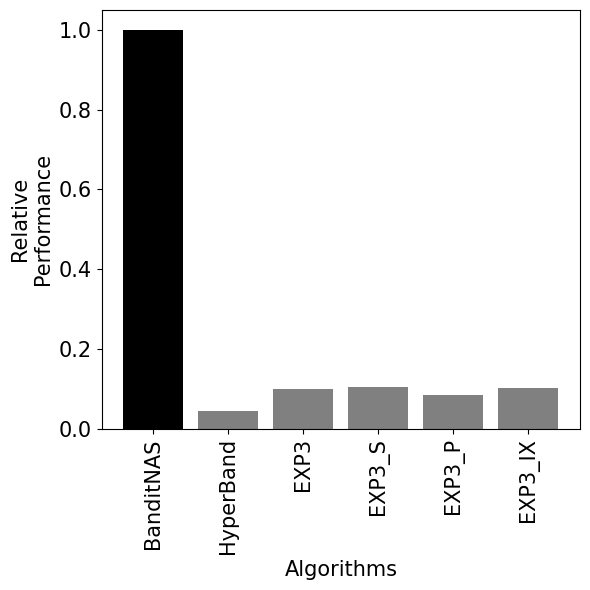

In [ ]:
for i in range(len(EXPERIMENT_DATA)):
  plt.figure(figsize=(6,6))
  DATA = np.array(EXPERIMENT_DATA[i])
  plt.imshow(np.array(DATA), origin='lower', cmap='jet', vmin=VMIN, vmax=VMAX)
  plt.xlabel('T', fontsize=15)
  plt.ylabel('K', fontsize=15)
  plt.tick_params(axis="x", labelsize=15, rotation=90) # Call tick_params on the respective Axes object
  plt.tick_params(axis="y", labelsize=15)
  plt.xticks(np.arange(len(NUM_T)), [r'$10^{3}$', r'$10^{4}$', r'$10^{5}$', r'$10^{6}$'], fontsize=15, rotation=0)
  plt.yticks(np.arange(len(NUM_K)), [20, 50, 100, 200][::-1], fontsize=15)
  plt.title(f'{DATA_LABELS[i]}', fontsize=15)
  cb = plt.colorbar(fraction=0.0458, pad=0.04)
  cb.set_label(label=f'{DATA_LABEL}', size=15)
  cb.ax.tick_params(labelsize=15)
  plt.tight_layout()
  plt.savefig(f"drive/MyDrive/BanditNAS_{DATA_LABELS[i]}_opt_pulls_Experiment_{EXPERIMENT_NUM}", format="png", dpi=300)
  plt.show()


plt.figure(figsize=(6,6))
data = [np.mean(model) / np.mean(BANDITNAS) for model in EXPERIMENT_DATA]
colors = ['black', 'grey', 'grey', 'grey', 'grey', 'grey']
plt.bar(DATA_LABELS, data, color=colors)
plt.xlabel('Algorithms', fontsize=15)
plt.ylabel('Relative\nPerformance', fontsize=15)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.tight_layout()
plt.savefig(f"drive/MyDrive/BanditNAS_Relative_Performance_Experiment_{EXPERIMENT_NUM}", format="png", dpi=300)
plt.show()

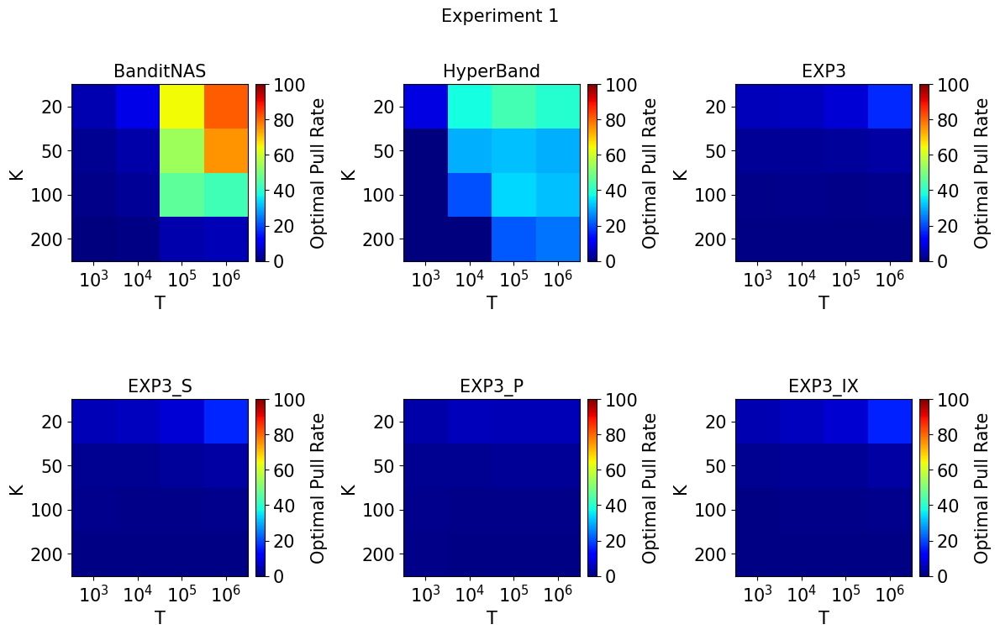

BanditNAS: 1.0000
HyperBand: 0.8878
EXP3: 0.1311
EXP3_S: 0.1279
EXP3_P: 0.0839
EXP3_IX: 0.1244


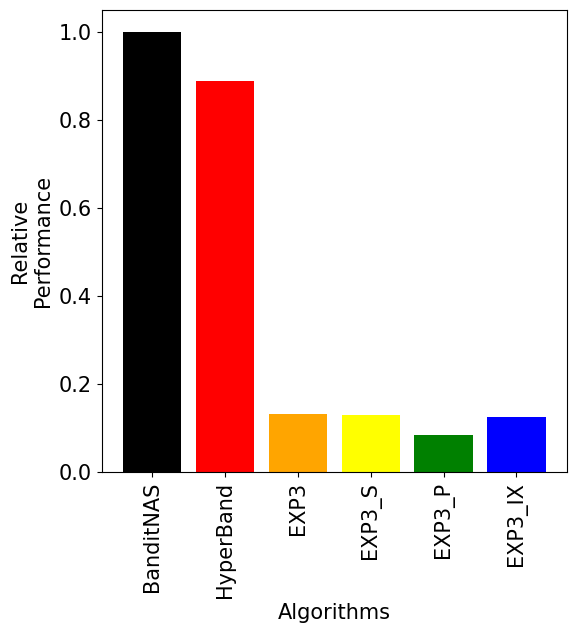

In [ ]:
PLOT = True
if PLOT:
  NUM_K = [20, 50, 100, 200]
  NUM_T = [1_000, 10_000, 100_000, 1_000_000]

  EXPERIMENT_NUM = 1
  VMIN, VMAX = 0, 100

  if EXPERIMENT_NUM == 1:
    BANDITNAS = [
        [0.250, 0.594, 3.939, 5.012],
        [1.000, 1.979, 46.434, 42.758],
        [1.714, 3.659, 54.190, 75.013],
        [4.510, 9.041, 64.391, 81.166]
    ]

    HYPERBAND = [
        [0.008, 0.017, 21.154, 24.153],
        [0.008, 20.670, 33.798, 31.266],
        [0.057, 29.714, 31.312, 29.822],
        [8.750, 37.502, 43.223, 39.796]
    ]

    EXP3 = [
        [0.6667, 0.5392, 0.5230, 0.5643],
        [0.8182, 1.1881, 1.1309, 1.3156],
        [2.0952, 2.1791, 2.4208, 3.3938],
        [5.2941, 5.6088, 7.5135, 16.6106]
    ]

    EXP3_S = [
        [0.6667, 0.5098, 0.5409, 0.5494],
        [1.1818, 1.1089, 1.0909, 1.2812],
        [1.6190, 1.9502, 2.3908, 3.3225],
        [5.0000, 5.6786, 7.5585, 16.1723]
    ]

    EXP3_P = [
        [0.8333, 0.5000, 0.5100, 0.4966],
        [1.4545, 0.9604, 1.0070, 1.0021],
        [1.6190, 1.9502, 2.0020, 1.9848],
        [3.7255, 5.1796, 4.9950, 4.9911]
    ]

    EXP3_IX = [
        [0.5833, 0.5784, 0.5130, 0.5381],
        [0.6364, 1.0297, 1.0589, 1.2464],
        [1.6190, 2.2289, 2.3068, 3.2629],
        [4.6078, 5.8383, 7.2226, 15.9334]
    ]

  DATA_LABEL = 'Optimal Pull Rate'
  EXPERIMENT_DATA = [BANDITNAS, HYPERBAND, EXP3, EXP3_S, EXP3_P, EXP3_IX]
  DATA_LABELS = ['BanditNAS', 'HyperBand', 'EXP3', 'EXP3_S', 'EXP3_P', 'EXP3_IX']

  NROWS, NCOLS = 2, 3
  FIGURE_DIM = 4
  idx = np.arange(NROWS * NCOLS).reshape(NROWS,NCOLS)

  fig, ax = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(NCOLS * FIGURE_DIM, NROWS * FIGURE_DIM))

  for i, DATA in enumerate(EXPERIMENT_DATA):

    ind = np.where(idx == i)
    idx1, idx2 = ind[0][0], ind[1][0]

    ax[idx1, idx2].imshow(np.array(DATA), origin='lower', cmap='jet', vmin=VMIN, vmax=VMAX)

    ax[idx1, idx2].set_aspect('equal')
    ax[idx1, idx2].set_xlabel('T', fontsize=15)
    ax[idx1, idx2].set_ylabel('K', fontsize=15)
    ax[idx1, idx2].tick_params(axis="x", labelsize=15, rotation=90) # Call tick_params on the respective Axes object
    ax[idx1, idx2].tick_params(axis="y", labelsize=15)
    ax[idx1, idx2].set_xticks(np.arange(len(NUM_T)), [r'$10^{3}$', r'$10^{4}$', r'$10^{5}$', r'$10^{6}$'], fontsize=15, rotation=0)
    ax[idx1, idx2].set_yticks(np.arange(len(NUM_K)), [20, 50, 100, 200][::-1], fontsize=15)
    ax[idx1, idx2].set_title(f'{DATA_LABELS[i]}', fontsize=15)
    cb = plt.colorbar(ax[idx1, idx2].images[0], ax=ax[idx1, idx2], fraction=0.0458, pad=0.04)
    cb.set_label(label=f'{DATA_LABEL}', size=15)
    cb.ax.tick_params(labelsize=15)

  fig.suptitle(f'Experiment {EXPERIMENT_NUM}', fontsize=15)
  plt.tight_layout()
  plt.show()

for i, model in enumerate(EXPERIMENT_DATA):

  print(f'{DATA_LABELS[i]}: {np.mean(model) / np.mean(BANDITNAS):.4f}')

plt.figure(figsize=(6,6))
data = [np.mean(model) / np.mean(BANDITNAS) for model in EXPERIMENT_DATA]
colors = ['black', 'red', 'orange', 'yellow', 'green', 'blue']
plt.bar(DATA_LABELS, data, color=colors)
plt.xlabel('Algorithms', fontsize=15)
plt.ylabel('Relative\nPerformance', fontsize=15)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.show()

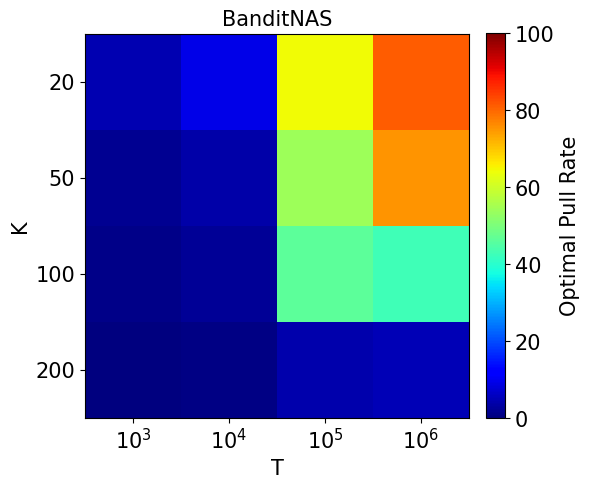

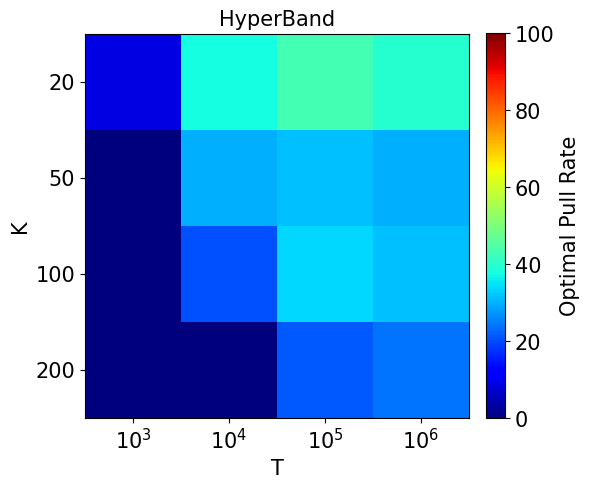

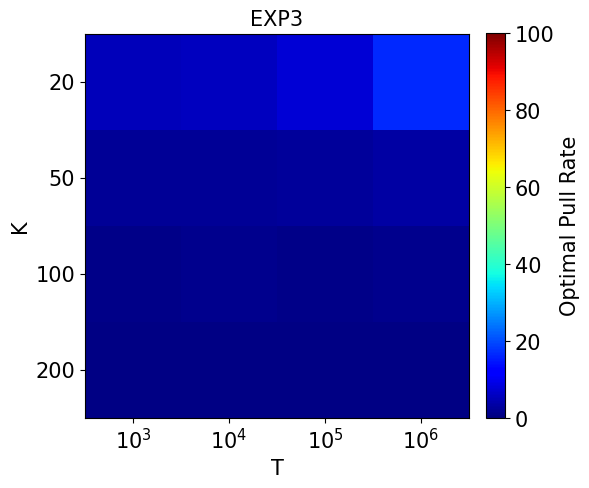

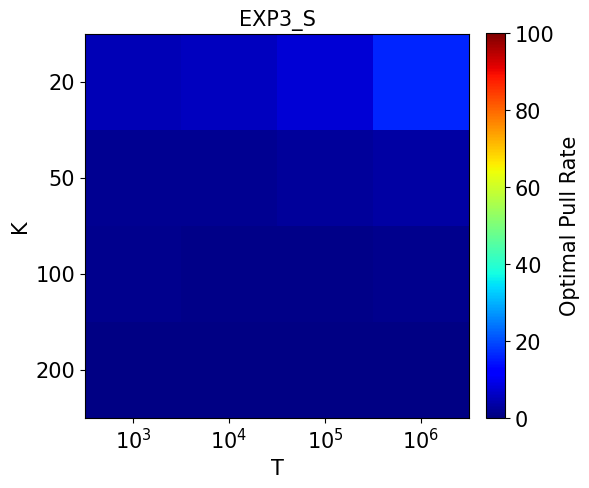

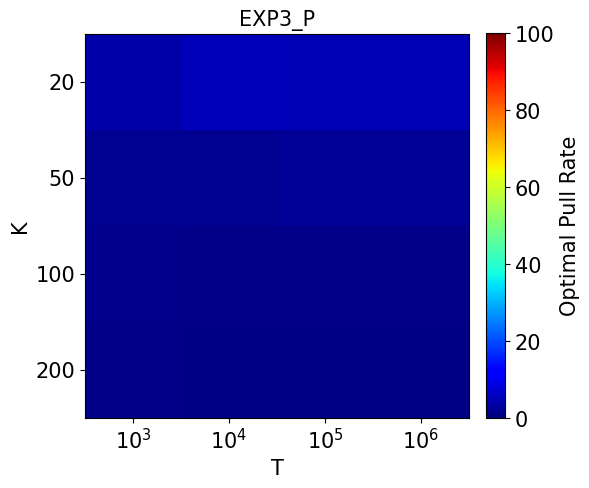

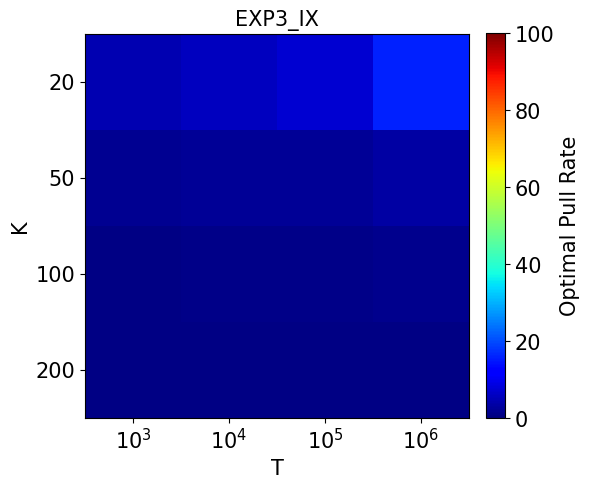

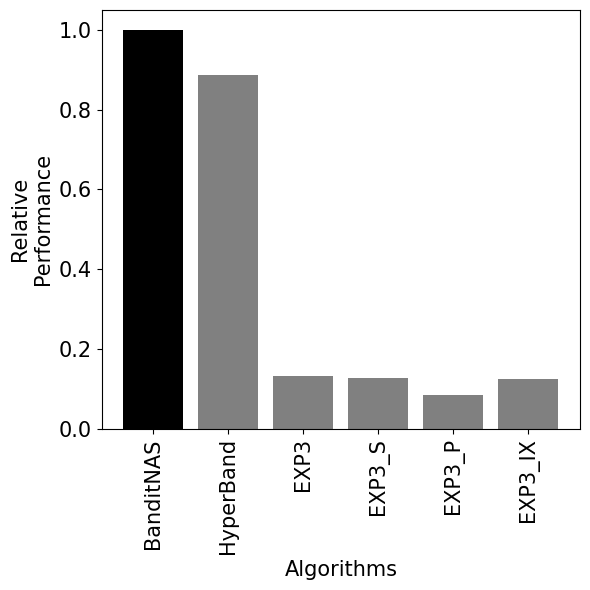

In [ ]:
for i in range(len(EXPERIMENT_DATA)):
  plt.figure(figsize=(6,6))
  DATA = np.array(EXPERIMENT_DATA[i])
  plt.imshow(np.array(DATA), origin='lower', cmap='jet', vmin=VMIN, vmax=VMAX)
  plt.xlabel('T', fontsize=15)
  plt.ylabel('K', fontsize=15)
  plt.tick_params(axis="x", labelsize=15, rotation=90) # Call tick_params on the respective Axes object
  plt.tick_params(axis="y", labelsize=15)
  plt.xticks(np.arange(len(NUM_T)), [r'$10^{3}$', r'$10^{4}$', r'$10^{5}$', r'$10^{6}$'], fontsize=15, rotation=0)
  plt.yticks(np.arange(len(NUM_K)), [20, 50, 100, 200][::-1], fontsize=15)
  plt.title(f'{DATA_LABELS[i]}', fontsize=15)
  cb = plt.colorbar(fraction=0.0458, pad=0.04)
  cb.set_label(label=f'{DATA_LABEL}', size=15)
  cb.ax.tick_params(labelsize=15)
  plt.tight_layout()
  plt.savefig(f"drive/MyDrive/BanditNAS_{DATA_LABELS[i]}_opt_pulls_Experiment_{EXPERIMENT_NUM}", format="png", dpi=300)
  plt.show()


plt.figure(figsize=(6,6))
data = [np.mean(model) / np.mean(BANDITNAS) for model in EXPERIMENT_DATA]
colors = ['black', 'grey', 'grey', 'grey', 'grey', 'grey']
plt.bar(DATA_LABELS, data, color=colors)
plt.xlabel('Algorithms', fontsize=15)
plt.ylabel('Relative\nPerformance', fontsize=15)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.tight_layout()
plt.savefig(f"drive/MyDrive/BanditNAS_Relative_Performance_Experiment_{EXPERIMENT_NUM}", format="png", dpi=300)
plt.show()

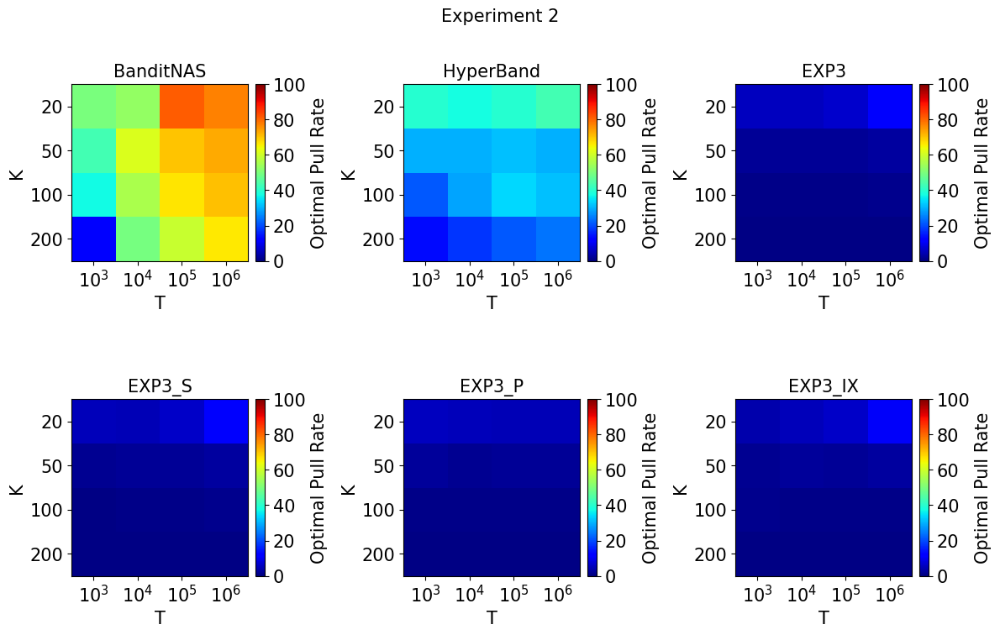

BanditNAS: 1.0000
HyperBand: 0.5099
EXP3: 0.0485
EXP3_S: 0.0464
EXP3_P: 0.0387
EXP3_IX: 0.0468


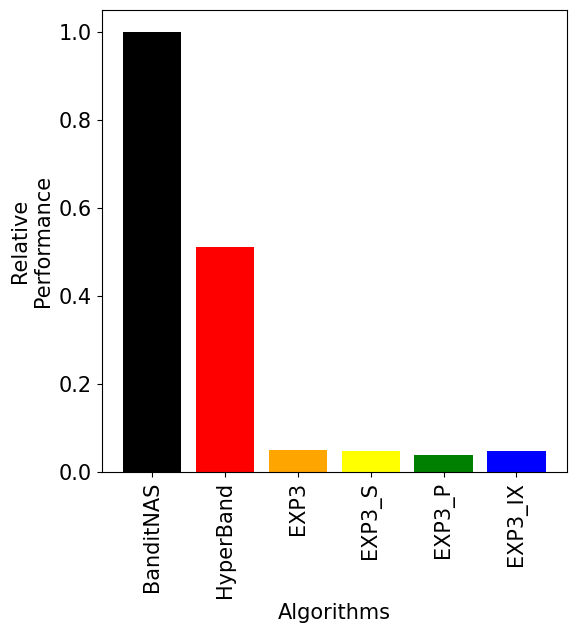

In [ ]:
PLOT = True
if PLOT:
  NUM_K = [20, 50, 100, 200]
  NUM_T = [1_000, 10_000, 100_000, 1_000_000]

  EXPERIMENT_NUM = 2
  VMIN, VMAX = 0, 100

  if EXPERIMENT_NUM == 2:
    BANDITNAS = [
        [11.867, 49.516, 59.254, 66.113],
        [37.409, 55.739, 66.779, 70.540],
        [43.219, 61.411, 70.1752, 72.838],
        [49.882, 52.814, 81.158, 77.164]
    ]

    HYPERBAND = [
        [13.354, 17.815, 21.154, 24.153], #K = 200
        [21.151, 28.687, 33.798, 31.266], #K = 100
        [29.733, 29.714, 31.312, 29.822], #K = 50
        [39.605, 37.502, 39.796, 43.223]  #K = 20
    ]

    EXP3 = [
        [0.5833, 0.4608, 0.5060, 0.5499], #K = 200
        [1.0000, 1.0792, 1.1069, 1.1862], #K = 100
        [2.0952, 2.1294, 2.1169, 2.8341], #K = 50
        [5.7843, 5.5689, 6.6407, 11.2497]  #K = 20
    ]

    EXP3_S = [
        [0.5000, 0.5294, 0.5170, 0.5345], #K = 200
        [0.6364, 0.9109, 1.0360, 1.1810], #K = 100
        [1.9048, 2.3184, 2.2809, 2.8484], #K = 50
        [5.0980, 4.9501, 6.4797, 11.2361]  #K = 20
    ]

    EXP3_P = [
        [0.7500, 0.5098, 0.4840, 0.5026], #K = 200
        [0.8182, 1.0990, 1.0400, 0.9976], #K = 100
        [2.5714, 1.8607, 1.9720, 2.0009], #K = 50
        [5.7843, 5.3792, 5.0280, 4.9903]  #K = 20
    ]

    EXP3_IX = [
        [0.5000, 0.5000, 0.5279, 0.5449], #K = 200
        [1.5455, 1.0396, 1.0959, 1.1602], #K = 100
        [1.9048, 2.5373, 2.2459, 2.7753], #K = 50
        [4.2157, 5.4291, 6.4847, 10.8210]  #K = 20
    ]

  DATA_LABEL = 'Optimal Pull Rate'
  EXPERIMENT_DATA = [BANDITNAS, HYPERBAND, EXP3, EXP3_S, EXP3_P, EXP3_IX]
  DATA_LABELS = ['BanditNAS', 'HyperBand', 'EXP3', 'EXP3_S', 'EXP3_P', 'EXP3_IX']

  NROWS, NCOLS = 2, 3
  FIGURE_DIM = 4
  idx = np.arange(NROWS * NCOLS).reshape(NROWS,NCOLS)

  fig, ax = plt.subplots(nrows=NROWS, ncols=NCOLS, figsize=(NCOLS * FIGURE_DIM, NROWS * FIGURE_DIM))

  for i, DATA in enumerate(EXPERIMENT_DATA):

    ind = np.where(idx == i)
    idx1, idx2 = ind[0][0], ind[1][0]

    ax[idx1, idx2].imshow(np.array(DATA), origin='lower', cmap='jet', vmin=VMIN, vmax=VMAX)

    ax[idx1, idx2].set_aspect('equal')
    ax[idx1, idx2].set_xlabel('T', fontsize=15)
    ax[idx1, idx2].set_ylabel('K', fontsize=15)
    ax[idx1, idx2].tick_params(axis="x", labelsize=15, rotation=90) # Call tick_params on the respective Axes object
    ax[idx1, idx2].tick_params(axis="y", labelsize=15)
    ax[idx1, idx2].set_xticks(np.arange(len(NUM_T)), [r'$10^{3}$', r'$10^{4}$', r'$10^{5}$', r'$10^{6}$'], fontsize=15, rotation=0)
    ax[idx1, idx2].set_yticks(np.arange(len(NUM_K)), [20, 50, 100, 200][::-1], fontsize=15)
    ax[idx1, idx2].set_title(f'{DATA_LABELS[i]}', fontsize=15)
    cb = plt.colorbar(ax[idx1, idx2].images[0], ax=ax[idx1, idx2], fraction=0.0458, pad=0.04)
    cb.set_label(label=f'{DATA_LABEL}', size=15)
    cb.ax.tick_params(labelsize=15)

  fig.suptitle(f'Experiment {EXPERIMENT_NUM}', fontsize=15)
  plt.tight_layout()
  plt.show()

for i, model in enumerate(EXPERIMENT_DATA):

  print(f'{DATA_LABELS[i]}: {np.mean(model) / np.mean(BANDITNAS):.4f}')

plt.figure(figsize=(6,6))
data = [np.mean(model) / np.mean(BANDITNAS) for model in EXPERIMENT_DATA]
colors = ['black', 'red', 'orange', 'yellow', 'green', 'blue']
plt.bar(DATA_LABELS, data, color=colors)
plt.xlabel('Algorithms', fontsize=15)
plt.ylabel('Relative\nPerformance', fontsize=15)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.show()

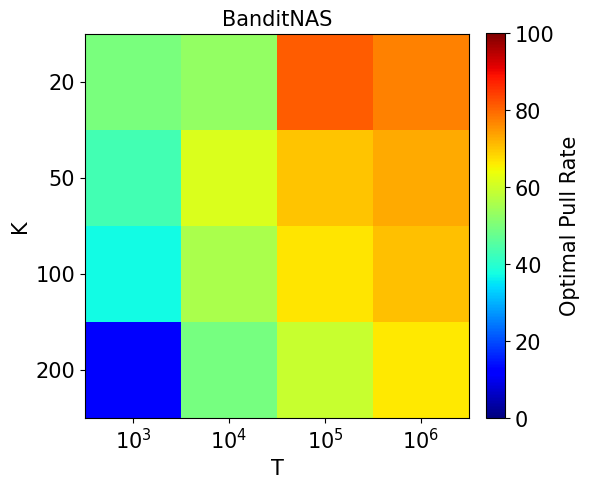

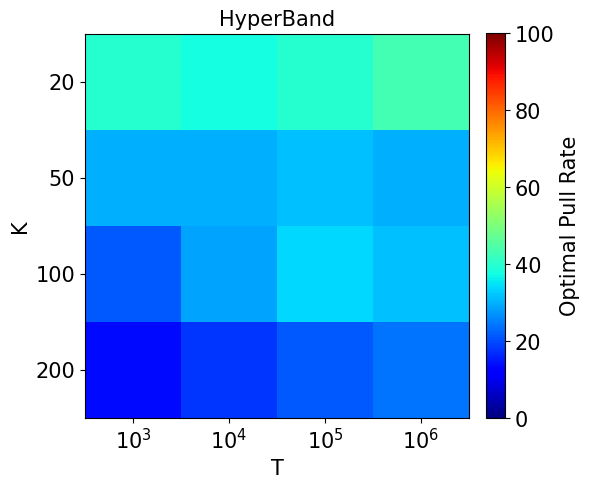

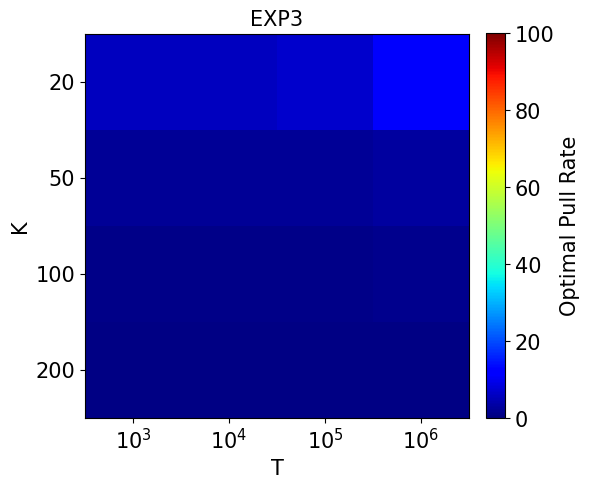

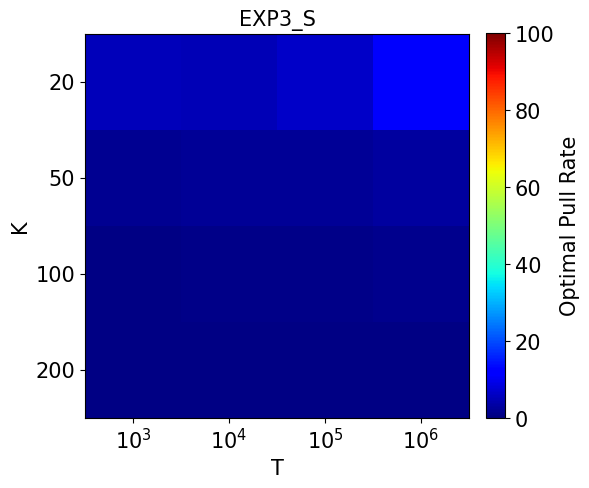

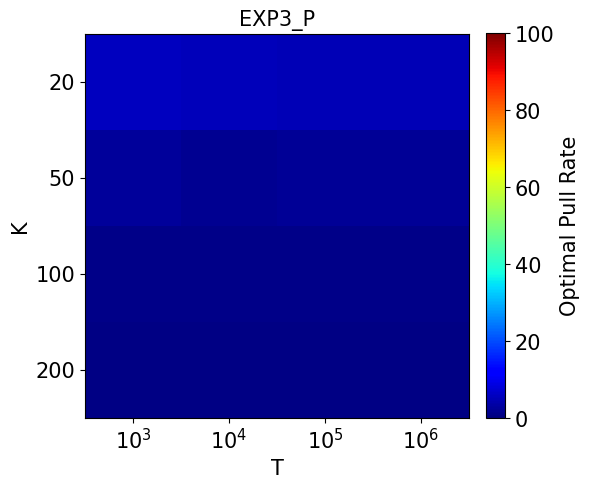

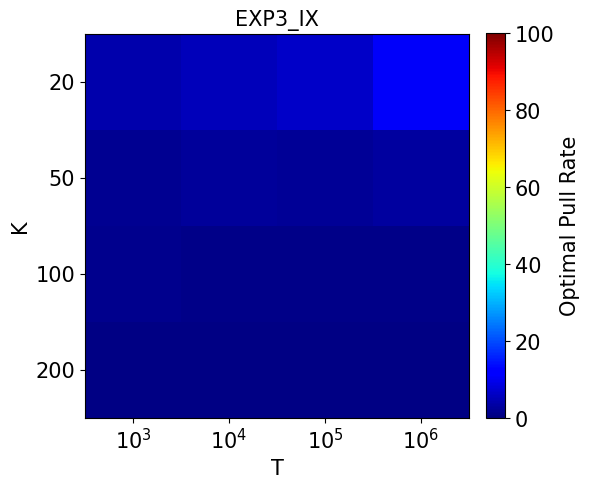

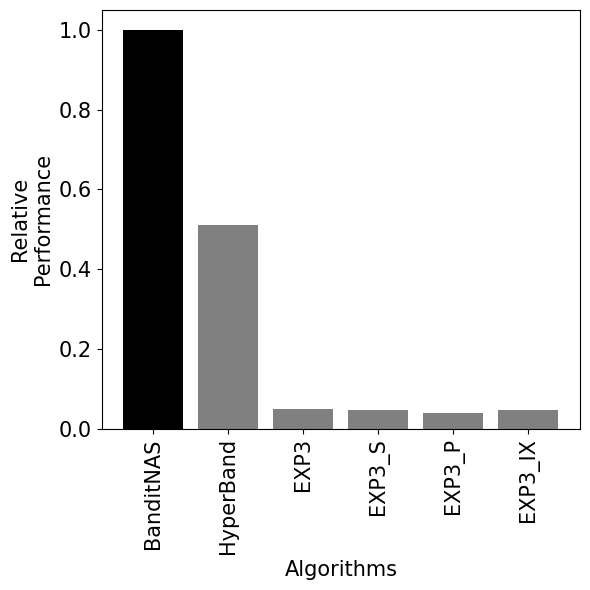

In [ ]:
for i in range(len(EXPERIMENT_DATA)):
  plt.figure(figsize=(6,6))
  DATA = np.array(EXPERIMENT_DATA[i])
  plt.imshow(np.array(DATA), origin='lower', cmap='jet', vmin=VMIN, vmax=VMAX)
  plt.xlabel('T', fontsize=15)
  plt.ylabel('K', fontsize=15)
  plt.tick_params(axis="x", labelsize=15, rotation=90) # Call tick_params on the respective Axes object
  plt.tick_params(axis="y", labelsize=15)
  plt.xticks(np.arange(len(NUM_T)), [r'$10^{3}$', r'$10^{4}$', r'$10^{5}$', r'$10^{6}$'], fontsize=15, rotation=0)
  plt.yticks(np.arange(len(NUM_K)), [20, 50, 100, 200][::-1], fontsize=15)
  plt.title(f'{DATA_LABELS[i]}', fontsize=15)
  cb = plt.colorbar(fraction=0.0458, pad=0.04)
  cb.set_label(label=f'{DATA_LABEL}', size=15)
  cb.ax.tick_params(labelsize=15)
  plt.tight_layout()
  plt.savefig(f"drive/MyDrive/BanditNAS_{DATA_LABELS[i]}_opt_pulls_Experiment_{EXPERIMENT_NUM}", format="png", dpi=300)
  plt.show()


plt.figure(figsize=(6,6))
data = [np.mean(model) / np.mean(BANDITNAS) for model in EXPERIMENT_DATA]
colors = ['black', 'grey', 'grey', 'grey', 'grey', 'grey']
plt.bar(DATA_LABELS, data, color=colors)
plt.xlabel('Algorithms', fontsize=15)
plt.ylabel('Relative\nPerformance', fontsize=15)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.tight_layout()
plt.savefig(f"drive/MyDrive/BanditNAS_Relative_Performance_Experiment_{EXPERIMENT_NUM}", format="png", dpi=300)
plt.show()

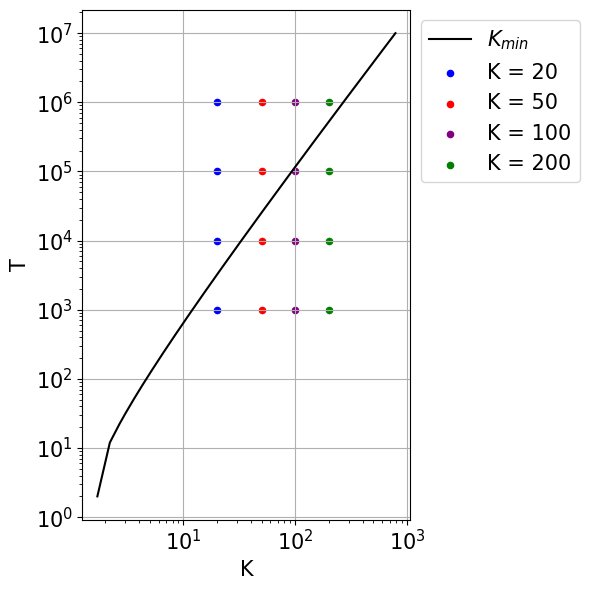

In [ ]:
T_VALS = np.arange(2, 10_000_001, 10)
K_MIN = np.divide(T_VALS, (1 * np.sqrt(np.multiply(T_VALS, np.log(T_VALS)))))

plt.figure(figsize=(6,6))
plt.plot(K_MIN, T_VALS, color='black', label=r'$K_{min}$')

i = 0
plt.scatter(np.ones(len(NUM_T)) * NUM_K[i], NUM_T, color='blue', s=20, label=f'K = {NUM_K[i]}')
i = 1
plt.scatter(np.ones(len(NUM_T)) * NUM_K[i], NUM_T, color='red', s=20, label=f'K = {NUM_K[i]}')
i = 2
plt.scatter(np.ones(len(NUM_T)) * NUM_K[i], NUM_T, color='purple', s=20, label=f'K = {NUM_K[i]}')
i = 3
plt.scatter(np.ones(len(NUM_T)) * NUM_K[i], NUM_T, color='green', s=20, label=f'K = {NUM_K[i]}')

plt.xlabel('K', fontsize=15)
plt.ylabel('T', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xscale('log')
plt.yscale('log')
plt.legend(bbox_to_anchor=(1,1), fontsize=15)
#plt.xlim([1e1, 1e3])
#plt.ylim([1e0, 1e3])
#plt.axis('scaled')
plt.grid()
plt.tight_layout()
plt.savefig(f"drive/MyDrive/BanditNAS_Theoretical_Performance.png", format="png", dpi=300)
plt.show()

In [ ]:
def genORIGINALLOSSES1(K, T):

    LOSSES = np.zeros([K, T])
    NUM_LAYERS, NUM_NEURONS = CONFIGS[K]

    count = 0
    for N_LAYERS in NUM_LAYERS:

        for N_NEURONS in NUM_NEURONS:

            # Train model for T epochs
            ValLosses = TrainModel(N_LAYERS, N_NEURONS, T)
            LOSSES[count, :] = ValLosses
            count += 1

    return LOSSES

def genORIGINALLOSSES(K, T):

    LOSSES = np.zeros([K, T])
    NUM_LAYERS, NUM_NEURONS = CONFIGS[K]

    count = 0
    for N_LAYERS in NUM_LAYERS:

        for N_NEURONS in NUM_NEURONS:

            # Train model for T epochs
            ValLosses = TrainModel(N_LAYERS, N_NEURONS, T)
            LOSSES[count, :] = ValLosses
            count += 1

    return LOSSES

def genLOSSES(K, T):

    LOSSES = np.zeros([K, T])
    NUM_LAYERS, NUM_NEURONS = CONFIGS[K]

    count = 0
    for N_LAYERS in NUM_LAYERS:

        for N_NEURONS in NUM_NEURONS:

            # Train model for T epochs
            ValLosses = TrainModel(N_LAYERS, N_NEURONS, T)
            LOSSES[count, :] = ValLosses
            count += 1

    return LOSSES

In [ ]:
import re

def extract_float_lists(s):
    # Regex pattern to match float numbers (including standard notation)
    float_pattern = r'-?\d+(?:\.\d+)?(?:[eE][-+]?\d+)?'

    # Find all list-like sections in the string
    list_matches = re.findall(r'\[([^\]]+)\]', s, re.DOTALL)

    # Convert matches to lists of floats
    float_lists = []
    for match in list_matches:
        # Extract all float numbers from the list
        floats = [float(num) for num in re.findall(float_pattern, match)]
        if floats:
            float_lists.append(floats)

    return float_lists

In [ ]:
def exp3(T, K, eta, gamma):
    """
    EXP3 algorithm for multi-armed bandit.

    Parameters:
    - T (int): Number of rounds.
    - K (int): Number of arms.
    - eta (float): Learning rate.
    - gamma (float): Exploration parameter.

    Returns:
    - rewards (list): List of observed rewards per round.
    """
    PROBS = np.zeros([K, T])
    EPOCHS = np.zeros(K)
    w = np.ones(K)  # Initial weights
    N = np.ones(K)  # Number of times each arm has been pulled
    rewards = []  # Store observed rewards

    for t in range(1, T + 1):
        # Probability distribution for arm selection
        p = (1 - gamma) * (w / w.sum()) + gamma / K
        p = np.clip(p, 0, 1)  # Ensure probabilities are within [0, 1]
        PROBS[:, t - 1] = p

        # Choose an arm based on probabilities
        #np.random.seed(t)
        I_t = np.random.choice(K, p=p)

        N[I_t] += 1
        EPOCHS[I_t] = t

        # Simulate or observe reward
        #r_t = np.random.uniform(0, 1)  # Example: Simulated reward in [0, 1]
        r_t = LOSSES[I_t, t - 1]
        rewards.append(r_t)

        # Update weights
        hat_r = r_t / p[I_t]
        w[I_t] *= np.exp(eta * hat_r)

    return rewards, PROBS, N, EPOCHS

def exp3_s(T, K, eta, gamma, beta):
    """
    EXP3.S algorithm with reward-dependent exploration.

    Parameters:
    - T (int): Number of rounds.
    - K (int): Number of arms.
    - eta (float): Learning rate.
    - gamma (float): Base exploration parameter.
    - beta (float): Scaling factor for exploration.

    Returns:
    - rewards (list): List of observed rewards per round.
    """
    PROBS = np.zeros([K, T])
    EPOCHS = np.zeros(K)
    w = np.ones(K)  # Initial weights
    N = np.ones(K)  # Number of times each arm has been pulled
    rewards = []  # Store observed rewards
    cumulative_rewards = np.zeros(K)  # Cumulative rewards for arms

    for t in range(1, T + 1):
        # Exploration rate
        gamma_t = gamma + beta / np.sqrt(t)

        # Probability distribution
        p = (1 - gamma_t) * (w / w.sum()) + gamma_t / K
        p = np.clip(p, 0, 1)  # Ensure probabilities are within [0, 1]
        PROBS[:, t - 1] = p

        # Choose an arm
        #np.random.seed(t)
        I_t = np.random.choice(K, p=p)

        N[I_t] += 1
        EPOCHS[I_t] = t

        # Simulate or observe reward
        #r_t = np.random.uniform(0, 1)  # Example: Simulated reward
        r_t = LOSSES[I_t, t - 1]
        rewards.append(r_t)

        # Update cumulative rewards
        cumulative_rewards[I_t] += r_t

        # Update weights
        hat_r = r_t / p[I_t]
        w[I_t] *= np.exp(eta * hat_r)

    return rewards, PROBS, N, EPOCHS

def exp3_p(T, K, eta, gamma, alpha):
    """
    EXP3.P algorithm with adaptive learning.

    Parameters:
    - T (int): Number of rounds.
    - K (int): Number of arms.
    - eta (float): Base learning rate.
    - gamma (float): Exploration parameter.
    - alpha (float): Learning adjustment factor.

    Returns:
    - rewards (list): List of observed rewards per round.
    """
    PROBS = np.zeros([K, T])
    EPOCHS = np.zeros(K)
    w = np.ones(K)  # Initial weights
    N = np.ones(K)  # Number of times each arm has been pulled
    rewards = []  # Store observed rewards
    losses = np.zeros(K)  # Losses for arms

    for t in range(1, T + 1):
        # Probability distribution
        p = (1 - gamma) * (w / w.sum()) + gamma / K
        p = np.clip(p, 0, 1)  # Ensure probabilities are within [0, 1]
        PROBS[:, t - 1] = p

        # Choose an arm
        #np.random.seed(t)
        I_t = np.random.choice(K, p=p)

        N[I_t] += 1
        EPOCHS[I_t] = t

        # Simulate or observe reward
        #r_t = np.random.uniform(0, 1)  # Example: Simulated reward
        r_t = LOSSES[I_t, t - 1]
        rewards.append(r_t)

        # Update losses
        losses[I_t] += r_t

        # Adjust eta based on losses
        eta_t = eta / (1 + alpha * losses.sum())

        # Update weights
        hat_r = r_t / p[I_t]
        w[I_t] *= np.exp(eta_t * hat_r)

    return rewards, PROBS, N, EPOCHS

def exp3_ix(T, K, eta, gamma):
    """
    EXP3-IX algorithm for multi-armed bandit with implicit exploration.

    Parameters:
    - T (int): Number of rounds.
    - K (int): Number of arms.
    - eta (float): Learning rate.
    - gamma (float): Exploration parameter.

    Returns:
    - rewards (list): List of observed rewards per round.
    """
    PROBS = np.zeros([K, T])
    EPOCHS = np.zeros(K)
    w = np.ones(K)  # Initial weights
    N = np.ones(K)  # Number of times each arm has been pulled
    rewards = []  # Store observed rewards

    for t in range(1, T + 1):
        # Probability distribution
        p = (1 - gamma) * (w / w.sum()) + gamma / K
        p = np.clip(p, 0, 1)  # Ensure probabilities are within [0, 1]
        PROBS[:, t - 1] = p

        # Choose an arm
        #np.random.seed(t)
        I_t = np.random.choice(K, p=p)

        N[I_t] += 1
        EPOCHS[I_t] = t

        # Simulate or observe reward
        #r_t = np.random.uniform(0, 1)  # Example: Simulated reward
        r_t = LOSSES[I_t, t - 1]
        rewards.append(r_t)

        # Update weights with implicit exploration
        implicit_r = r_t + gamma * (1 - r_t) / p[I_t]
        hat_r = implicit_r / p[I_t]
        w[I_t] *= np.exp(eta * hat_r)

    return rewards, PROBS, N, EPOCHS

class RestlessBandit:
    def __init__(self, learning_curves, budget, discount=0.95):
        """
        Initialize the restless bandit environment.
        Args:
            learning_curves (list of np.array): Accuracy curves for each architecture.
            budget (int): Number of arms (architectures) that can be trained per round.
            discount (float): Discount factor for future rewards.
        """
        self.learning_curves = learning_curves
        self.K = len(learning_curves)
        self.T = len(learning_curves[0])
        self.budget = budget
        self.discount = discount
        self.current_time = 0
        self.states = np.zeros(self.K, dtype=int)  # Start at epoch 0 for all arms

    def step(self, actions):
        """
        Execute a step in the environment.
        Args:
            actions (list): Indices of architectures to train this round.
        Returns:
            rewards (list): Accuracy gains for the selected architectures.
        """
        rewards = []
        for i in actions:
            state = self.states[i]
            if state < self.T - 1:  # Ensure we're within bounds
                reward = self.learning_curves[i][state + 1] - self.learning_curves[i][state]
                self.states[i] += 1  # Advance to the next epoch
            else:
                reward = 0  # No gain if the curve is exhausted
            rewards.append(reward)
        self.current_time += 1
        return rewards

    def whittle_index(self, arm):
        """
        Compute a heuristic index for an arm.
        Args:
            arm (int): Index of the arm (architecture).
        Returns:
            float: Whittle index value.
        """
        state = self.states[arm]
        if state >= self.T - 1:
            return 0  # No index for exhausted arms
        gain = self.learning_curves[arm][state + 1] - self.learning_curves[arm][state]
        cost = 1  # Assume unit cost for training each arm
        return gain / cost  # Reward-to-cost ratio

    def select_arms(self):
        """
        Select arms based on the Whittle index.
        Returns:
            list: Indices of selected arms.
        """
        indices = [(self.whittle_index(arm), arm) for arm in range(self.K)]
        indices.sort(reverse=True, key=lambda x: x[0])  # Sort by index value
        return [arm for _, arm in indices[:self.budget]]

In [ ]:
def plotResults(rewards, PROBS, N):

  MARKEVERY = 10
  FIGURE_DIM = 6
  NUM_FIGS = 2
  COLORS = ['blue', 'red', 'purple', 'black']
  MARKERS = ['s', 'o', 'd', '^']
  XTICK_SPACE = K//10

  fig, ax = plt.subplots(nrows=1, ncols=NUM_FIGS, figsize=(NUM_FIGS * FIGURE_DIM, FIGURE_DIM))

  for k in range(K - 5):
    ax[0].plot(PROBS[k, :], color='black', alpha=0.2)
  for k in range(1, 5):
    ax[0].plot(PROBS[K - 5 + k, :], color='blue', alpha=0.2)
  ax[0].plot(PROBS[K - 5, :], color='blue')

  ax[1].scatter(np.arange(K - 5), N[:-5], color='black', alpha=0.2)
  for k in range(1, 5):
    ax[1].scatter(K - 5 + k, N[K - 5 + k], color='blue', alpha=0.2, marker='x')
  ax[1].scatter(K - 5, N[K - 5], color='blue', marker='*')

  ax[0].grid()
  ax[0].set_xlabel('Round', fontsize=15)
  ax[0].set_ylabel('Probability', fontsize=15)

  ax[1].set_xlabel('Arm', fontsize=15)
  ax[1].set_ylabel('Number of pulls', fontsize=15)
  ax[1].set_xticks(np.arange(0, K, XTICK_SPACE))
  ax[1].set_xticklabels(np.arange(0, K, XTICK_SPACE).astype(str))
  ax[1].grid()

  ax[0].tick_params(axis="x", labelsize=15)
  ax[0].tick_params(axis="y", labelsize=15)

  ax[1].tick_params(axis="x", labelsize=15)
  ax[1].tick_params(axis="y", labelsize=15)

  #plt.suptitle(f'DeepOresJet Model Emissions\n', fontsize=15)
  plt.tight_layout()
  plt.show()

In [ ]:
def hyperband_learning_curves(learning_curves, R, eta=3):
    """
    Hyperband for selecting the best learning curve based on highest accuracy.

    Parameters:
    - learning_curves (ndarray): A (K, T) array where each row is a learning curve of length T.
    - R (int): Maximum number of iterations (T must be >= R).
    - eta (float): Proportion of configurations to keep after each round (default: 3).

    Returns:
    - best_curve (ndarray): The learning curve with the highest final accuracy.
    - best_accuracy (float): The highest final accuracy observed.
    """
    # Validate inputs
    K, T = learning_curves.shape
    N = np.zeros(K)
    RECOMMEND = np.zeros(K)
    PULLS = np.zeros(K)
    if R > T:
        raise ValueError(f"R ({R}) must be <= T ({T})")

    # Total number of brackets
    s_max = int(np.log(R) / np.log(eta))
    B = (s_max + 1) * R

    best_curve = None
    best_accuracy = -float('inf')  # Assuming higher accuracy is better

    # Iterate through each bracket
    for s in reversed(range(s_max + 1)):
        pulls = np.zeros(K)
        n = int(np.ceil(B / R * eta ** s / (s + 1)))  # Initial number of configurations
        r = int(R * eta ** (-s))  # Initial number of iterations per configuration

        # Generate initial indices for configurations
        np.random.seed(s)
        indices = np.random.choice(range(K), size=min(n, K), replace=False)

        for i in range(s + 1):
            n_i = int(n * eta ** (-i))  # Number of configurations to evaluate in this round
            r_i = int(r * eta ** i)  # Number of iterations for each configuration in this round

            # Evaluate all selected configurations up to r_i iterations
            accuracies = [(idx, learning_curves[idx, r_i - 1]) for idx in indices]
            accuracies.sort(key=lambda x: x[1], reverse=True)  # Sort by accuracy (descending)

            # Keep the top-performing configurations
            top_indices = [idx for idx, acc in accuracies[:max(1, n_i // eta)]]
            indices = top_indices

            pulls[indices] = r_i

            #if i == 0:
            #  print('')
            #  print(f"Round {i + 1}: n_i = {n_i}, r_i = {r_i}, indices: {sorted(indices)}")
            #else:
            #  print(f"Round {i + 1}: n_i = {n_i}, r_i = {r_i}, indices: {sorted(indices)}")

            N[indices] += r_i
            if i == s:
              RECOMMEND[indices] += 1

            # Update the learning curves for the selected configurations

            # Update the best curve and accuracy
            if accuracies[0][1] > best_accuracy:
                best_accuracy = accuracies[0][1]
                best_curve = learning_curves[accuracies[0][0]]
            #print('Accuracies:', print(accuracies[0][0]))

        PULLS += pulls

    return best_curve, best_accuracy, N, RECOMMEND, s_max, PULLS

In [ ]:
EXPERIMENT_NUM = 1
#NUM_K, NUM_T = [20, 50, 100, 200], [1_000, 10_000, 100_000, 1_000_000]
NUM_K, NUM_T = [20], [1_000]
NUM_SAMPLES = 10
MEAN_N = [[] for _ in range(NUM_SAMPLES)]
#RANDOM_RUN_NUM = 3
delta, alpha, eta, a = 0.01, 7, 1.75e-6, 0

OPT_PULLS = np.zeros([len(NUM_K), len(NUM_T)])
SUM_N = np.zeros([len(NUM_K), len(NUM_T)])
TIME = np.zeros([len(NUM_K), len(NUM_T)])
OPT_PULL_MEAN = np.zeros(NUM_SAMPLES)
for RANDOM_RUN_NUM in tqdm(range(NUM_SAMPLES)):

  OPT_PULLS = np.zeros([len(NUM_K), len(NUM_T)])

  for idy, T in enumerate(NUM_T):
    for idx, K in enumerate(NUM_K):

      PROBS = np.zeros([K, T])
      ALPHA = np.log(T) / np.log(K)
      GAMMA = np.exp(-(np.linspace(0, ALPHA, T)) ** ALPHA)
      if EXPERIMENT_NUM == 0:
        WEIGHT = T
        losses = genORIGINALLOSSES1(K, T)
      if EXPERIMENT_NUM == 1:
        WEIGHT = T
        losses = genLOSSES(K, T)
      if EXPERIMENT_NUM == 2:
        WEIGHT = T
        losses = genORIGINALLOSSES(K, T)

      LOSSES = losses

      ALGO = 'BanditNAS'
      PULLS = np.zeros([K, T])
      EPOCHS = np.zeros(K)
      w = np.ones(K)  # Weights for each arm
      N = np.ones(K)  # Number of times each arm has been pulled

      # Run the algorithm for T iterations
      start = datetime.datetime.now()
      for t in range(1, T + 1):

          # Calculate gamma dynamically for this iteration
          gamma = GAMMA[t - 1]

          # Compute probabilities p_t for each arm
          total_weight = np.sum(w)

          p = (1 - gamma) * (w / total_weight) + gamma / K

          p = np.clip(p, 0, 1)  # Ensure probabilities are within [0, 1]
          PROBS[:, t - 1] = p

          # Choose an arm based on the probabilities
          np.random.seed(t + RANDOM_RUN_NUM)
          I_t = np.random.choice(K, p=p)
          PULLS[I_t, t - 1] = 1
          EPOCHS[I_t] = t

          # Simulate or observe the reward for the chosen arm
          r_t = losses[I_t, t - 1]

          # Update counts
          N[I_t] += 1

          # Estimate and adjust reward
          hat_r = r_t / p[I_t]
          tilde_r = (hat_r + alpha) / np.sqrt(K * N[I_t])

          # Update weights
          if np.exp(eta * tilde_r * WEIGHT) < np.inf:
            w[I_t] *= np.exp(eta * tilde_r * WEIGHT)
            w /= w.sum()

      end = datetime.datetime.now()
      MEAN_N[RANDOM_RUN_NUM] = N
      OPT_PULL_MEAN[RANDOM_RUN_NUM] = N[K - 5] / N.sum()


      if RANDOM_RUN_NUM == None:
        
        #ALGO = 'HyperBand'
        #start = datetime.datetime.now()
        #R = T  # Maximum number of iterations (resources)
        #eta_ = 3
        #best_curve, best_accuracy, N, HB_RECOMMEND, s_max, PULLS = hyperband_learning_curves(losses, R, eta_)
        #end = datetime.datetime.now()
        ##OPTIMAL_PULLS[np.where(np.array(ALGOS) == ALGO)[0][0]] = PULLS[K - 5] / PULLS.sum()
        #print(f'{ALGO}\nOptimal Pulls: {(PULLS[K - 5] / PULLS.sum()) * 100:.4f}%\nTime: {(end - start).total_seconds():.4f}s\nNumber of HyperBand Rounds: {s_max+1}\nAverage Epochs: {(PULLS / (s_max + 1))}')
        ###print('')

        ALGO = 'EXP3'
        start = datetime.datetime.now()
        _, PROBS, N, EPOCHS = exp3(
            T,
            K,
            eta=1 / (2 * K * np.sqrt(T * np.log(T))),
            gamma=0.001
            )
        end = datetime.datetime.now()
        #OPTIMAL_PULLS[np.where(np.array(ALGOS) == ALGO)[0][0]] = N[K - 5] / sum(N)
        print(f'{ALGO}\nOptimal Pulls: {N[K - 5] / sum(N) * 100:.4f}%\nPulls: {N}\nTime: {(end - start).total_seconds():.4f}s\n')

        ALGO = 'EXP3_S'
        start = datetime.datetime.now()
        _, PROBS, N, EPOCHS = exp3_s(
            T,
            K,
            eta=1 / (2 * K * np.sqrt(T * np.log(T))),
            gamma=0.001,
            beta=0.1
            )
        end = datetime.datetime.now()
        print(f'{ALGO}\nOptimal Pulls: {N[K - 5] / sum(N) * 100:.4f}%\nPulls: {N}\nTime: {(end - start).total_seconds():.4f}s\n')

        ALGO = 'EXP3_P'
        start = datetime.datetime.now()
        _, PROBS, N, EPOCHS = exp3_p(
            T,
            K,
            eta=1 / (2 * K * np.sqrt(T * np.log(T))),
            gamma=0.001,
            alpha = 2 * np.sqrt(np.log(3 * K / 0.01))
            )
        end = datetime.datetime.now()
        #OPTIMAL_PULLS[np.where(np.array(ALGOS) == ALGO)[0][0]] = N[K - 5] / sum(N)
        print(f'{ALGO}\nOptimal Pulls: {N[K - 5] / sum(N) * 100:.4f}%\nPulls: {N}\nTime: {(end - start).total_seconds():.4f}s\n')

        ALGO = 'EXP3_IX'
        start = datetime.datetime.now()
        _, PROBS, N, EPOCHS = exp3_ix(
            T,
            K,
            eta=1 / (2 * K * np.sqrt(T * np.log(T))),
            gamma=0.001,
            )
        end = datetime.datetime.now()

        print(f'{ALGO}\nOptimal Pulls: {N[K - 5] / sum(N) * 100:.4f}%\nPulls: {N}\nTime: {(end - start).total_seconds():.4f}s\n')

print(ALGO)
print('')
print(np.array(MEAN_N).mean(axis=0))
#print('')
#print(np.array(MEAN_N).std(axis=0))
print('')
print(f'Optimal Pull Rate: {100 * OPT_PULL_MEAN.mean():.3f}%, sigma = {OPT_PULL_MEAN.std():.3f}')
#print(OPT_PULL_MEAN.mean() * 100, OPT_PULL_MEAN.std())
print(f'T = {T}, K = {K}, Experiment: {EXPERIMENT_NUM}')

100%|██████████| 10/10 [00:00<00:00, 16.45it/s]

BanditNAS

[56.5 59.6 57.9 44.  55.5 53.  51.9 44.  54.3 52.  48.3 46.  43.3 54.5
 50.4 45.  59.  53.7 49.7 41.4]

Optimal Pull Rate: 4.412%, sigma = 0.000
T = 1000, K = 20, Experiment: 1


In [ ]:
INPUT_STRING0 = '''
BanditNAS

[  1681.    1653.    1658.5   1716.4   1670.    1744.    1730.8   1752.2
   1660.    1782.    1735.    1678.    1714.    1668.    1729.9   1681.8
   1699.    1694.    1725.1   1726.9   1773.    1645.    1715.2   1676.1
   1763.8   1737.2   1687.7   1653.    1679.8  21131.8   1689.7   1718.7
   1743.3   1702.1   1685.9   1660.3   1659.8   1777.9   1668.4   1686.1
   1696.7   1729.4   1657.7   1627.7   1667.9   1730.2   1746.9   1658.6
   1711.9   1696.3   1641.8   1711.2   1726.7   1615.1   1715.6   1678.6
   1725.7   1706.8   1810.1   1736.3   1669.    1689.9   1689.4   1653.6
   1680.4   1625.2   1736.3   1665.7   1719.2   1689.8   1673.5   1667.2
   1825.7   1642.    1685.2  88293.3   1728.7   1667.8   1702.4   1759.6
   1664.8   1667.2   1709.3   1740.2   1725.2   1656.2   1733.8   1757.3
   1665.9   1759.3   1738.5   1771.3   1698.5   1659.    1752.2   1651.4
   1657.2   1743.1   1745.9   1658.7   1714.5   1641.2   1706.9   1611.6
   1648.6   1711.4   1733.5   1676.7   1643.9  11173.6   1660.6   1658.7
   1817.    1710.4   1793.    1667.9   1719.6   1764.1   1708.7   1790.4
   1647.    1613.8   1758.2   1714.5   1747.8   1738.2   1697.4   1758.8
   1697.    1697.5   1793.5   1699.2   1759.7   1735.8   1713.4   1699.6
   1722.5   1721.5   1703.8   1704.8   1662.9   1697.1   1673.8   1716.6
   1701.5   1742.2   1660.4   1691.7   1666.6   1697.1   1679.6   1768.1
   1724.7   1713.1   1650.5   1738.3   1712.1   1641.9   1688.6   1713.9
   1692.3   1731.3   1746.2   1737.3   1689.6   1648.1   1727.3   1698.3
   1718.2   1718.5   1680.4   1671.3   1707.7   1645.1   1669.5   1639.9
   1673.3   1714.5   1722.6   1733.5   1693.6  83791.8   1660.8   1658.
   1743.5   1767.4   1628.7   1702.4   1731.    1767.    1653.4   1793.3
   1674.    1788.9   1719.7  10221.4   1703.2   1728.3 109786.3 347040.9]

Optimal Pull Rate: 1.022%, sigma = 0.000
T = 1000000, K = 200, Experiment: 1
'''

INPUT_STRING1 = '''
BanditNAS

[  187.    208.    233.9   194.1   285.9   213.8   270.1   217.    210.1
   213.5   204.4   199.    350.5   227.2   216.7   220.2   227.1   215.7
   244.1   250.1   247.2   199.5   216.9   206.3   325.9   196.1   292.3
   297.8   189.5   284.4   219.7   201.3   198.5   172.1   278.1   192.1
   349.9   202.5   189.6   259.4   203.8   363.5   216.1   800.5   204.4
   258.7   173.4   209.2   180.4   197.9   207.8   208.6   205.5   307.6
   212.5   193.5   337.1   214.7   226.6   246.7   229.9   310.7   239.8
   218.5   202.2   242.7   220.7   234.4   279.1   194.1   230.9   213.4
   231.2   213.8   290.4   173.8   218.    191.9   207.2   228.5   361.6
   224.3   241.7   218.4   336.3   209.    232.2   252.9   259.4   254.8
   223.5   220.9   205.1   252.4   200.    219.2   194.6   219.6   224.
   210.2   201.9   232.4   232.2   219.2   221.7   206.7   198.5   313.3
   259.    237.5   282.    198.1   379.    191.1   270.9   199.9   192.6
   266.    221.3   219.4   273.8   201.4   217.4   282.1   261.    459.7
   205.2   206.3   239.5   215.7   204.5   209.4   192.8   195.1   233.4
   262.8   263.2   194.9   227.8   377.7   202.6   211.3   287.7   210.9
   254.5   237.7   257.3   261.3   246.    198.8   233.7   273.4   410.6
   241.7   207.9   202.7   205.2   206.5   224.1   194.    236.3   241.4
   220.2   255.    222.3   189.2   208.5   218.    205.1   198.6   298.8
   270.2   211.4   238.    212.1   243.4   192.6   197.7   200.5   196.6
   207.    194.2   295.    208.5   217.7   209.9   238.1   179.3   204.9
   227.8   210.5   220.9   230.1   206.6   213.4  3946.9 48245.    252.8
   888.    905.9]

Optimal Pull Rate: 3.939%, sigma = 0.003
T = 100000, K = 200, Experiment: 1
'''

INPUT_STRING2 = '''
[41.  64.2 54.9 65.9 38.9 45.8 59.1 51.2 53.9 74.8 48.3 36.5 49.1 49.9
 53.  46.6 66.1 52.  63.2 62.3 45.5 55.8 48.8 45.  47.6 64.4 56.3 41.4
 55.9 71.1 50.9 64.1 35.6 50.2 49.9 56.1 44.1 46.1 36.4 46.6 42.9 35.6
 47.9 38.3 76.2 50.5 45.8 42.8 48.5 56.5 49.5 60.6 47.9 62.5 40.6 52.4
 43.6 44.4 60.  46.3 41.9 50.8 57.7 56.5 56.  46.5 54.7 43.1 51.1 49.5
 49.1 51.7 38.4 40.2 40.  42.6 49.7 46.3 43.8 59.3 44.4 59.2 58.1 57.4
 58.1 70.1 62.2 47.7 46.9 60.3 62.2 48.5 46.1 47.2 34.5 46.4 41.1 45.7
 55.9 44.8 40.6 57.3 44.8 38.8 53.4 27.7 32.9 41.1 39.1 48.3 61.3 59.7
 45.3 42.9 42.6 48.8 39.5 59.5 61.1 47.4 37.5 52.  61.7 50.9 42.6 41.1
 32.5 57.  61.6 53.1 58.6 45.8 54.6 43.3 67.2 50.4 55.6 58.2 76.7 52.
 42.  42.5 49.3 49.6 42.  67.6 40.5 54.8 54.8 32.7 57.7 61.9 43.6 51.3
 60.7 42.2 52.1 49.4 58.3 47.1 66.7 61.2 34.3 46.3 59.7 48.4 63.3 41.1
 48.7 68.  81.1 29.9 40.3 55.2 48.8 57.4 42.6 49.6 50.6 64.  52.2 46.1
 49.  41.2 61.1 45.6 48.1 28.8 65.8 61.3 64.4 53.1 41.9 47.6 54.1 60.6
 60.2 65.1 65.  60. ]

Optimal Pull Rate: 0.594%, sigma = 0.000
T = 10000, K = 200, Experiment: 1
'''

INPUT_STRING3 = '''
BanditNAS

[ 3.   7.   6.9 10.   3.   5.   6.   7.6  5.  12.   6.   8.   5.   4.
  5.   6.7 10.   6.  10.   8.   5.  10.   9.   9.   3.   6.8  7.   5.
  5.9  6.1 10.   6.   3.   5.   6.   5.   6.   4.   2.   6.  10.   6.
 11.   5.   6.5  7.   4.   5.   3.   7.   4.   6.   7.   6.5  4.5  6.
  8.   4.  12.   5.   8.   8.9  6.   7.   9.   3.   3.   8.   4.   3.
  4.   6.   6.   8.   6.   8.   4.   2.   4.   5.   4.   5.   6.   9.1
 10.   8.   6.   6.2  4.   5.  11.   7.   6.   5.   4.   6.3  3.7  4.
  7.   7.   6.   7.   8.   8.  10.   2.   3.   4.   5.   4.3  6.3  9.
  4.   2.   4.   4.   4.  10.   7.   4.7  1.   7.   7.3  4.   5.   1.
  4.   8.  10.   5.   9.   6.5  5.   8.   4.   4.   6.  10.   8.   4.
  9.   6.   4.   5.   3.   7.   5.   6.   7.4  6.   7.   6.   4.   4.
  7.   3.   9.   7.   4.   4.   8.   9.   6.   7.   6.   6.   7.   5.
  3.  10.   8.   3.   7.   6.   6.8  8.   4.   9.   6.6  5.   4.   5.
  3.   8.   7.   7.   5.   3.   9.   7.   7.   5.   5.   5.4  4.   3.
  5.   4.   6.   6. ]

Optimal Pull Rate: 0.250%, sigma = 0.000
T = 1000, K = 200, Experiment: 1
'''

INPUT_STRING4 = '''
BanditNAS

[  2934.8   2930.1   2955.    3067.    2998.4   2987.3   2957.2   2981.5
   2974.8   2932.5   3029.1   2977.5   3067.8   2974.    2895.5   3003.1
 332306.5   2940.1   3006.4   2936.8   2988.1   2967.7   2906.4   2958.
   2997.4   2939.1   2986.3   2924.    3036.2   3006.7   2950.8   2966.6
   2900.9   2934.8   3042.    2916.7   2870.1   2943.8   2877.2   3003.6
   2980.1   3141.9   2968.    3040.    2957.3   3069.    2812.9   2893.
   3004.    3011.6   2933.2   2956.    2912.6   2969.6   2954.5   2944.7
   2976.5   3073.5   3062.6   2987.2   2903.3   2965.    3083.2   2992.8
   2939.    3051.5   3017.7   3033.7   2962.3   2945.8   3004.4   2974.4
   3009.9   2950.3   2870.7   3079.6   2919.9   2932.6   2956.5   3001.5
   2997.9   2961.5   2989.5   2952.1   2987.2   3002.8   3025.5   2862.1
   2938.6   3018.6   2853.9   2991.1   3071.4   2933.    2966.1 376330.2
   2975.4   3051.    3008.    2970. ]

Optimal Pull Rate: 37.629%, sigma = 0.000
T = 1000000, K = 100, Experiment: 1
'''

INPUT_STRING5 = '''
BanditNAS

[  351.    365.9   369.    359.    380.2   361.8   335.    355.7   360.3
   372.3   374.1   347.6   373.4   340.3   368.    366.    345.2   310.5
   351.5   458.9   310.2   329.1   362.4   340.4   351.1   344.    347.2
   322.3   376.4   344.5   683.    346.3   347.1   351.9   361.1   368.9
   344.9   315.1   353.1   391.9   358.1   357.8   380.7   371.7   339.4
   905.6   374.3   345.7   336.1   336.7   354.9   340.8   545.1  1749.6
   347.6  1260.6   921.4  1156.3   373.4  1658.6   341.9   358.7   353.5
   337.4   345.5   581.9   367.6   381.8   345.6   380.7   353.9   360.6
   367.7   380.1   357.5   362.6   366.3   341.7   360.8   353.8   388.8
   340.    363.2   349.4   809.4   381.    373.8   382.6   344.3   443.9
  2743.4   331.1   365.1   317.9   370.2 46480.1   352.    374.5   969.2
  8869.5]

Optimal Pull Rate: 46.434%, sigma = 0.017
T = 100000, K = 100, Experiment: 1
'''

INPUT_STRING6 = '''
BanditNAS

[110.  105.   80.3 117.1 105.1 106.6  92.9 103.2 114.7 130.1  91.2  89.3
  96.5  99.5 125.  108.9  97.3  95.4  93.1  79.6  85.9  81.2 123.1  79.6
 101.5 108.1 116.4  81.7 100.1 104.7  85.9 104.2 110.7  80.2 100.4 101.9
  93.1  77.1  75.4 102.5  96.5 128.  118.3 116.7  93.8 116.1 109.5  74.1
 100.   86.8  96.7  89.5  78.4  66.9  86.7 103.6 102.4  73.4 115.9  99.
  89.2 112.7  82.3  90.4 121.9 103.8  92.8 103.8 111.9 118.1 105.7  73.6
 113.3  97.1  93.2 107.3  99.8 101.5  97.8  84.6 124.2 106.7  79.4 109.7
 105.7 103.5  93.4  96.1 108.5 101.7  88.7 103.   96.3  86.8 100.1 199.9
 106.9 112.8 147.9 121.1]

Optimal Pull Rate: 1.979%, sigma = 0.000
T = 10000, K = 100, Experiment: 1

'''

INPUT_STRING7 = '''
BanditNAS

[ 9.  15.9  7.  12.6 16.  13.   8.  10.7 15.  17.  14.  17.   8.9 10.9
 11.  15.   7.  10.   9.   7.3 14.7 15.  12.5  8.   9.   9.  12.1  9.9
 11.3 15.7 15.9 12.  11.  10.   6.   9.  13.  13.   5.   8.   8.  14.1
 17.  11.2  8.  17.  10.  10.   6.  13.  12.  15.  11.   6.   8.3 14.3
  5.   7.  13.  10.7  7.  10.3  5.  11.  14.  14.5 12.   7.  15.  11.
 14.   8.   9.  10.  12.4 12.   7.   9.  15.   7.  16.  12.  10.  12.
 12.  10.  12.  13.8 12.  10.6  8.  10.  13.   7.  15.  11.   9.4  6.
  8.  11. ]

Optimal Pull Rate: 1.000%, sigma = 0.000
T = 1000, K = 100, Experiment: 1
'''

INPUT_STRING8 = '''
BanditNAS

[  5040.6   5163.3   5088.    5090.7   4988.    5129.3   5145.7   5084.2
   5172.8   5007.9   5090.7   5023.3   5092.6   5002.4   5165.8   5137.6
   5094.8   5216.    5057.4   4923.8   5146.8   5133.7   5106.2   4995.8
   5156.8   5008.6   5142.6   5098.5   5027.8   5181.1   5140.4   5160.6
   5163.6   5181.2   5082.7   5147.2   5196.8   5100.6   5095.    5021.2
   5079.1   5010.1   5128.3   4951.    5189.3 750163.7   5154.2   5110.8
   5178.4   5083. ]

Optimal Pull Rate: 75.013%, sigma = 0.000
T = 1000000, K = 50, Experiment: 1
'''

INPUT_STRING9 = '''
BanditNAS

[  604.9   654.    602.3   658.4   611.1   598.    647.1   592.8   596.9
   570.9  3798.3   586.8  3758.7   587.9  3675.5   578.4  6791.8   621.8
   562.1   799.8   629.9   636.2   617.6   593.3   593.    557.3   569.7
   741.2   593.2   666.5   612.2   595.3   604.8   602.5   637.8   597.9
   626.1   603.8   612.8   637.9   586.5   614.6   649.8   640.5   605.5
 54217.5   640.7   616.    612.3   640.1]

Optimal Pull Rate: 54.190%, sigma = 0.160
T = 100000, K = 50, Experiment: 1
'''

INPUT_STRING10 = '''
BanditNAS

[213.2 173.1 218.9 180.1 216.3 196.1 207.  230.9 194.2 179.4 151.2 159.1
 199.3 201.3 192.  196.6 196.5 180.5 171.5 158.4 183.1 254.8 198.2 175.2
 182.3 203.4 163.  154.1 178.1 213.1 158.7 162.7 215.7 171.2 247.6 157.7
 161.6 232.4 199.1 191.1 198.8 233.5 204.2 165.9 198.5 367.7 293.  289.9
 252.8 227. ]

Optimal Pull Rate: 3.659%, sigma = 0.000
T = 10000, K = 50, Experiment: 1
'''

INPUT_STRING11 = '''
BanditNAS

[23.9 18.6 28.  17.7 31.  30.  18.8 25.  16.  15.  29.  19.5 17.  21.
 25.1 27.8 19.4 14.6 24.  13.  20.5 27.8 24.  18.  19.  26.  15.3 21.3
 11.  23.7 16.3 14.  28.  18.5 24.8 21.2 18.  23.4 15.  20.  28.  21.
 20.  24.8 21.6 18.  19.  25.  14.4 18. ]

Optimal Pull Rate: 1.714%, sigma = 0.000
T = 1000, K = 50, Experiment: 1
'''

INPUT_STRING12 = '''
BanditNAS

[  9953.9   9782.7   9898.    9836.    9818.3   9886.    9950.8   9797.5
   9952.3   9918.6   9776.6  10061.    9966.6  10136.9   9940.1 811677.1
   9915.5   9866.4   9969.3   9916.4]

Optimal Pull Rate: 81.166%, sigma = 0.000
T = 1000000, K = 20, Experiment: 1
'''

INPUT_STRING13 = '''
BanditNAS

[ 1201.9  1179.3  1180.8  1113.4  1152.6  1165.1  1183.1  1153.6  1216.1
  1160.9 44377.4  1165.4  1171.4  1185.6  1188.9 34397.4  1237.   1182.3
  1198.9  1208.9]

Optimal Pull Rate: 34.391%, sigma = 0.216
T = 100000, K = 20, Experiment: 1

'''

INPUT_STRING14 = '''
BanditNAS

[491.5 435.5 494.  470.4 381.6 469.1 470.3 454.1 435.1 458.2 382.  421.5
 377.1 397.2 493.  905.9 770.1 531.6 550.5 631.3]

Optimal Pull Rate: 9.041%, sigma = 0.000
T = 10000, K = 20, Experiment: 1
'''

INPUT_STRING15 = '''
BanditNAS

[56.5 59.6 57.9 44.  55.5 53.  51.9 44.  54.3 52.  48.3 46.  43.3 54.5
 50.4 45.  59.  53.7 49.7 41.4]

Optimal Pull Rate: 4.412%, sigma = 0.000
T = 1000, K = 20, Experiment: 1
'''

In [ ]:
#plt.savefig(f"drive/MyDrive/HOBAND_Relative_Performance_Experiment_{EXPERIMENT_NUM}.png", format="png", dpi=300)

Optimal model recommended 81.891 times more often than sub-optimal models on average
Average number of sub-optimal epochs per model per epoch: 0.18834290000000015
Total number of epochs: 1000020.0000000001


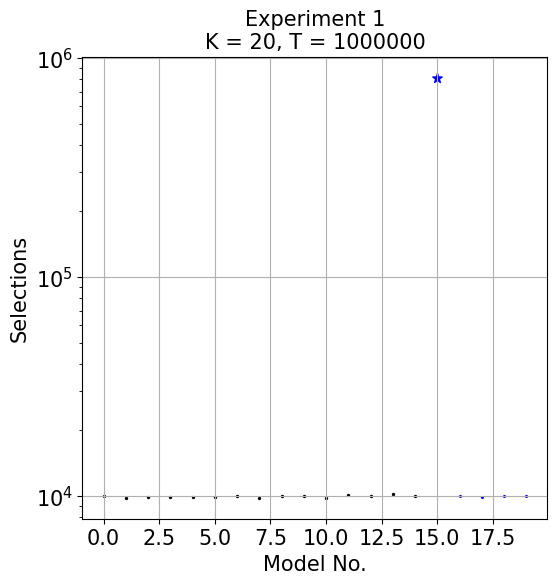

In [ ]:
FONTSIZE = 15
data_string = INPUT_STRING12
T_string = re.search(r'T\s*=\s*(\d+)', data_string).group(1)
DATA = np.array(extract_float_lists(data_string)[0])
K_string = len(DATA)
print(f'Optimal model recommended {DATA[K_string - 5] / DATA[: K_string - 5].mean():.3f} times more often than sub-optimal models on average')
print(f'Average number of sub-optimal epochs per model per epoch: {(DATA.sum() - DATA[K_string - 5]) / int(T_string)}')
print(f'Total number of epochs: {DATA.sum()}')
plt.figure(figsize=(6,6))
plt.scatter(np.arange(len(DATA) - 5), DATA[: K_string - 5], color='black', s=2, marker='o')
plt.scatter(np.arange(K_string - 5, K_string), DATA[K_string - 5 :], color='blue', s=2, marker='*')
plt.scatter([K_string - 5], DATA[K_string - 5], color='blue', s=50, marker='*')
plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.yscale('log')
plt.title(f'Experiment 1\nK = {K_string}, T = {T_string}', fontsize=FONTSIZE)
plt.grid()
plt.show()

Optimal model recommended 26.659 times more often than sub-optimal models on average
Total number of epochs: 1200.0


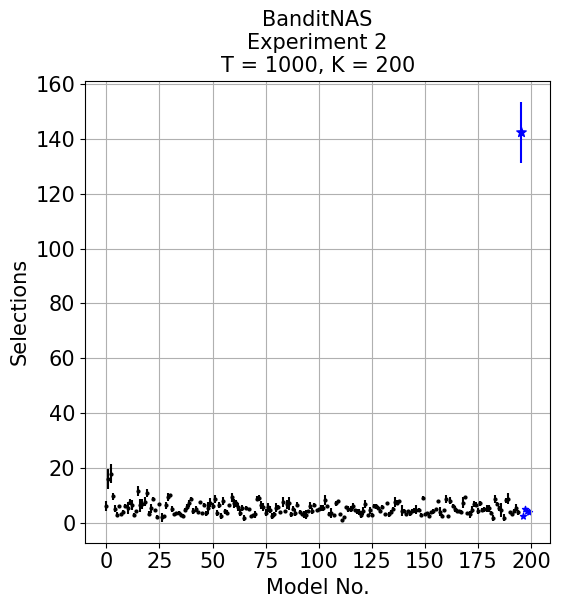

(26.794251134644483, 6.0)

In [ ]:
input_string = '''100%|██████████| 10/10 [00:01<00:00,  6.91it/s]BanditNAS

[  6.2  16.1  18.    9.7   5.2   3.    6.2   3.2   4.    6.3   5.6   7.7
   6.5   2.9   4.4  11.7   6.4   6.8   7.8  10.9   3.4   5.3   8.7   4.6
   2.3   6.9   2.    2.5   6.5   9.4  10.2   5.2   3.1   3.7   3.6   2.8
   2.7   4.9   5.9   7.1   8.9   4.3   5.2   4.    7.7   3.7   6.7   3.5
   5.4   7.4   6.2   8.9   3.7   6.6   2.4   8.    4.3   3.7   6.6   9.3
   7.1   7.2   5.7   3.8   5.3   1.7   5.6   5.2   2.4   2.8   3.2   8.8
   9.1   6.4   5.9   3.7   5.7   4.9   2.5   3.2   5.6   5.9   3.9   7.6
   4.2   6.8   7.1   3.2   5.2   3.8   6.6   3.9   3.1   3.    3.    4.3
   6.3   4.4   6.5   4.7   5.2   5.4   5.5   8.5   6.    3.4   3.6   2.9
   7.2   7.9   3.1   1.    2.    5.7   5.    5.    6.1   4.6   4.2   4.1
   3.    4.3   6.9   3.    4.6   3.    6.2   6.1   5.5   4.4   5.8   3.1
   7.3   3.2   4.    5.1   7.6   7.4   7.9   4.5   4.2   3.3   4.3   3.6
   4.4   4.7   4.9   4.8   3.    9.2   3.3   3.7   2.7   4.1   4.2   5.1
   8.    4.1   2.6   4.9   8.8   2.5   8.1   6.1   5.1   4.4   4.2   4.
   7.4   9.3   3.5   3.2   4.8   7.    6.7   4.5   7.2   4.7   5.    5.2
   5.3   3.6   1.8   8.7   6.8   5.3   4.8   1.9   8.3   8.8   3.9   3.1
   4.5   5.6   3.9 142.4   2.7   5.    4.3   4. ]

[ 1.83303028  3.67287353  3.46410162  1.18743421  1.2489996   0.89442719
  0.4         0.4         0.63245553  0.45825757  2.15406592  1.18743421
  1.80277564  0.7         0.48989795  1.9         2.4979992   1.77763888
  1.66132477  1.3         0.8         1.67630546  0.78102497  0.66332496
  0.78102497  0.3         1.54919334  0.5         1.28452326  1.56204994
  0.4         1.07703296  0.7         0.45825757  0.66332496  0.74833148
  0.64031242  0.7         1.04403065  1.37477271  0.53851648  1.1
  1.07703296  0.          0.45825757  0.45825757  0.45825757  0.80622577
  2.05912603  1.62480768  1.07703296  1.44568323  1.18743421  1.0198039
  1.11355287  1.4832397   0.9         0.9         0.48989795  1.61554944
  1.5132746   1.32664992  1.41774469  1.2489996   1.1         1.1
  0.66332496  0.4         0.66332496  0.6         1.32664992  0.9797959
  1.22065556  1.42828569  1.37477271  1.3453624   1.73493516  1.37477271
  1.02469508  0.87177979  1.62480768  0.53851648  0.53851648  1.95959179
  0.4         1.6         2.21133444  0.87177979  0.9797959   1.32664992
  0.91651514  0.7         0.3         1.26491106  1.61245155  0.45825757
  1.26885775  1.2         0.80622577  0.45825757  0.4         1.11355287
  1.11803399  1.85741756  0.          0.48989795  1.74355958  0.3
  0.87177979  0.53851648  0.7         0.          0.          0.64031242
  1.09544512  1.          1.13578167  0.48989795  0.87177979  1.13578167
  1.18321596  1.3453624   1.37477271  0.          1.356466    0.4472136
  0.74833148  0.94339811  0.5         0.8         0.74833148  0.3
  0.45825757  0.87177979  0.63245553  0.83066239  1.8         1.0198039
  0.53851648  2.10950231  0.74833148  0.45825757  0.45825757  0.91651514
  0.8         0.9         1.57797338  0.74833148  0.77459667  0.74833148
  0.45825757  0.45825757  0.78102497  0.3         0.87177979  0.3
  0.4472136   1.7         0.66332496  0.3         1.4         0.5
  1.22065556  0.83066239  1.04403065  0.8         0.4         0.89442719
  1.9078784   0.64031242  0.5         1.2489996   1.2489996   1.18321596
  0.78102497  1.11803399  0.87177979  0.64031242  0.89442719  1.32664992
  1.41774469  0.66332496  0.9797959   1.3453624   0.74833148  0.78102497
  2.48193473  1.3         0.9         1.93907194  0.53851648  0.7
  0.5         1.28062485  0.83066239 11.10135127  0.45825757  0.
  0.45825757  0.        ]
T = 1000, K = 200, Experiment: 2
'''

if input_string:
    ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
    pulls = extract_float_lists(input_string)
    K = len(pulls[1])
    DATA = np.array(pulls[1])
    T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
    Algo_string = [a for a in ALGORITHMS if a in input_string][0]
    print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
    print(f'Total number of epochs: {DATA.sum()}')
    plt.figure(figsize=(6,6))
    #plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
    plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
    plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

    plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
    plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

    plt.xlabel('Model No.', fontsize=FONTSIZE)
    plt.ylabel('Selections', fontsize=FONTSIZE)
    plt.xticks(fontsize=FONTSIZE)
    plt.yticks(fontsize=FONTSIZE)
    plt.grid()
    plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
    plt.show()

pulls[1][K - 5] / ((np.sum(pulls[1][: K - 5]) + np.sum(pulls[1][K - 5 + 1 :])) / (K - 1)), np.mean(pulls[1])

Optimal model recommended 0.015 times more often than sub-optimal models on average
Total number of epochs: 1819.7142860300003


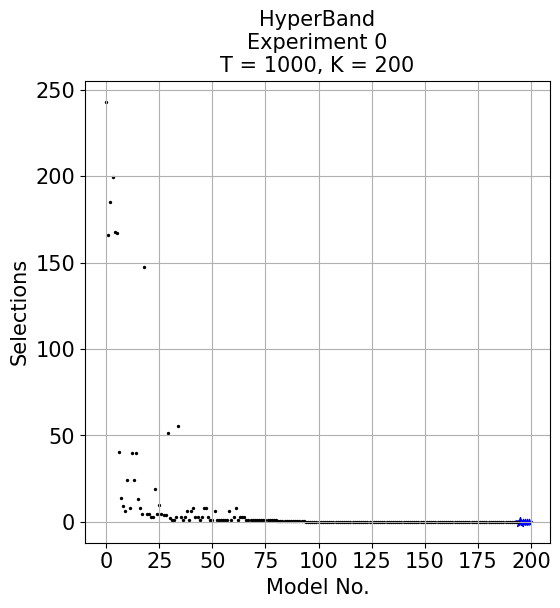

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0079%
Time: 0.0027s
Number of HyperBand Rounds: 7
Average Epochs: [2.43000000e+02 1.65857143e+02 1.85142857e+02 1.99285714e+02
1.67571429e+02 1.67285714e+02 4.02857143e+01 1.41428571e+01
9.00000000e+00 6.42857143e+00 2.40000000e+01 8.14285714e+00
3.98571429e+01 2.40000000e+01 3.98571429e+01 1.34285714e+01
8.14285714e+00 4.71428571e+00 1.47571429e+02 4.71428571e+00
4.71428571e+00 3.00000000e+00 3.00000000e+00 1.88571429e+01
4.71428571e+00 1.00000000e+01 4.71428571e+00 3.85714286e+00
3.85714286e+00 5.14285714e+01 2.14285714e+00 1.00000000e+00
1.00000000e+00 2.71428571e+00 5.55714286e+01 2.71428571e+00
1.00000000e+00 2.71428571e+00 6.28571429e+00 1.00000000e+00
6.28571429e+00 8.00000000e+00 2.71428571e+00 2.71428571e+00
1.00000000e+00 2.71428571e+00 8.00000000e+00 8.00000000e+00
2.71428571e+00 1.00000000e+00 1.00000000e+00 6.28571429e+00
1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
1.00000000e+00 1.00000000e+00 6.28571429e+00 1.00000000e+00
2.71428571e+00 8.00000000e+00 1.00000000e+00 2.71428571e+00
2.71428571e+00 2.71428571e+00 1.00000000e+00 1.00000000e+00
1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
1.00000000e+00 7.14285714e-01 7.14285714e-01 7.14285714e-01
7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
7.14285714e-01 7.14285714e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01]
100%|██████████| 10/10 [00:01<00:00,  7.08it/s]
11.866666666666665 0.009251126057585279
T = 1000, K = 200, Experiment: 0'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[0])
DATA = np.array(pulls[0])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Exp_string = re.search(r"Experiment\s*:\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
print(f'Total number of epochs: {DATA.sum()}')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[0][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[0][K - 5 :], color='blue', marker='*', s=20)
plt.scatter(np.arange(K - 5), pulls[0][: K - 5], color='black', marker='o', s=2)

#plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
#plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {Exp_string}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5833%
Pulls: [ 7.  2.  7.  5.  6.  5.  4.  5.  6.  6.  9.  6.  3.  8. 11.  5.  7.  6.
  8.  3.  7.  5.  9.  7.  4.  5.  7.  3.  4.  8.  9.  8.  5.  7.  7.  6.
  7.  4.  8.  8.  7.  6.  6.  7.  8.  5.  8.  6.  6.  4.  7.  4.  7.  5.
  5.  7. 11.  2.  2. 12.  5.  9.  9.  2.  5.  7.  4.  6.  8.  7.  5.  9.
  2.  6.  7.  4.  4.  2.  2.  8.  4.  8.  4.  7.  4.  4.  8.  8.  8.  6.
  7.  5.  9.  5.  4.  5.  5.  6.  3.  4.  9. 11.  3.  5.  3.  7.  3.  8.
  1.  8.  5.  6.  8.  5.  5.  2.  4.  2.  4.  6.  4.  6.  7.  6.  7.  7.
  8.  4.  8.  8.  3.  5.  8.  4.  2.  9.  6. 12.  7.  8.  4.  4.  6.  7.
  4.  6.  5.  5.  3.  8.  5.  5.  6.  6.  4.  5.  4.  5. 10.  4.  6.  5.
  8. 12.  7. 10. 13. 11.  1.  4.  4.  5.  9. 10.  6.  6.  5.  7.  7.  9.
  7.  8.  9.  5.  7.  6.  6.  4.  4.  8.  9.  4.  3.  7.  3.  7.  7.  7.
  4.  3.]
Time: 0.1788s

EXP3_S
Optimal Pulls: 0.5000%
Pulls: [ 5.  3. 12.  7.  4.  6.  4. 10.  7.  5.  8.  7.  6.  5.  6.  6.  5.  7.
  7.  6.  8.  4.  4.  7.  4.  8.  5.  3.  4.  9.  6. 11.  5.  5.  9.  8.
  7.  7.  7.  6.  5.  9.  8.  4. 10.  4.  4.  5.  6.  4.  8.  4.  7. 10.
 11.  6.  5.  7.  8.  8.  8.  6.  6.  5.  7.  6.  5.  9.  8.  3.  6.  4.
  6. 10.  8.  8.  3.  7.  4.  8.  7.  6.  3.  6.  6.  6.  8.  6.  3.  6.
  1.  7.  5.  4.  6. 10.  1.  6.  6.  6.  2.  6.  8.  6. 10.  4.  6.  4.
  4.  3. 11.  8.  6.  9.  2.  3.  3.  8.  5.  2.  3.  5.  3. 10.  3.  3.
  6.  8.  1.  5.  5.  5.  6.  5.  7.  9.  4.  3.  6.  6.  7.  9.  9.  6.
  6.  4.  6.  4.  6.  5.  8.  6.  2.  3.  6.  8.  5.  5.  4.  5.  6.  9.
  4.  7.  3.  4.  8.  8.  7.  9.  7.  5.  7.  4.  2.  6.  6.  4.  6.  8.
  8.  3.  9.  4.  9.  6.  4.  6. 11.  6.  8.  5. 10.  8.  3.  6.  7.  6.
  5.  7.]
Time: 0.1023s

EXP3_P
Optimal Pulls: 0.7500%
Pulls: [ 5.  9.  5.  2.  4.  6.  5.  7.  5.  5.  6.  6.  4.  7.  5.  3.  7.  7.
  7.  5.  7.  7.  7.  6.  6.  7.  5.  5. 11.  4.  9.  5.  5.  6.  3.  6.
  6.  7.  5.  7.  3.  3.  3.  4.  7.  9.  5.  3.  4.  5.  4. 10.  5. 12.
  5.  7.  4.  4.  4.  6.  6.  6.  3.  7.  7.  8.  6.  6.  5.  9.  3.  2.
 10.  6.  5.  6.  7.  9.  3.  8.  4.  4.  7.  6. 10.  6.  5.  8.  9.  7.
  6.  5.  5.  6.  5.  3.  5.  9. 15.  7.  9.  5.  7.  6.  7.  2.  9.  1.
  6.  6.  6.  5.  4.  5.  5.  6.  4.  8.  5.  4.  5.  7.  7.  5.  4.  8.
  6.  8.  4. 11.  8.  5.  7.  4.  4.  4.  9.  8. 14.  7.  5.  7.  8.  4.
  7.  5.  6.  9.  4.  6.  6.  8.  7.  4.  6.  6.  6.  9.  3.  7.  8.  3.
  9.  8.  9.  8.  5.  4.  7.  3.  5.  6.  3. 10.  7.  5.  7. 10.  5.  4.
  5.  7.  4.  7.  5.  5.  6.  6.  4.  7.  7.  4.  6.  2.  5.  9.  3.  8.
  6.  5.]
Time: 0.1333s

EXP3_IX
Optimal Pulls: 0.5000%
Pulls: [ 4.  5.  8. 11.  9.  5.  5.  7.  4.  2.  7.  3.  6.  8.  5. 12.  5.  7.
  3.  7.  7.  4.  2.  6.  8.  6.  4.  5.  7.  7.  4.  5.  9. 10.  4.  4.
  9.  5.  4.  8.  5.  8.  6.  3.  4.  1.  2.  5.  6.  6. 10.  7. 12.  8.
  4.  8.  3. 10.  7.  7.  6.  3.  1. 10.  8. 10.  5.  4.  3. 10.  7.  5.
 10.  9.  7.  5.  6.  7.  5. 10.  2.  3.  5.  5.  4.  1.  5.  9.  6.  7.
  8.  8.  4. 10.  4.  8.  6.  4.  7.  5.  8.  5.  8.  6.  7.  5.  5.  4.
  5.  7.  6.  6.  7.  9.  4.  6.  2.  4.  9.  3.  8.  3.  8.  7.  8.  8.
  4.  8. 12.  4.  7.  5.  3.  7.  5.  6.  5.  4.  4. 10.  6.  6.  3.  2.
  6.  8.  2.  4.  8.  8.  8.  3.  8.  5.  5.  6.  5.  5.  5.  5.  2. 13.
  5.  8.  6.  7.  3.  6.  6.  4.  8.  5.  7.  5.  7.  4.  5.  4.  6.  7.
  6.  7.  6.  7.  5.  9.  4.  6.  6.  4.  8.  6. 11.  7.  2.  6.  4.  6.
  7. 10.]
Time: 0.1138s


T = 1000, K = 200, Experiment: 2'''



Optimal model recommended 26.659 times more often than sub-optimal models on average
Total number of epochs: 1200.0


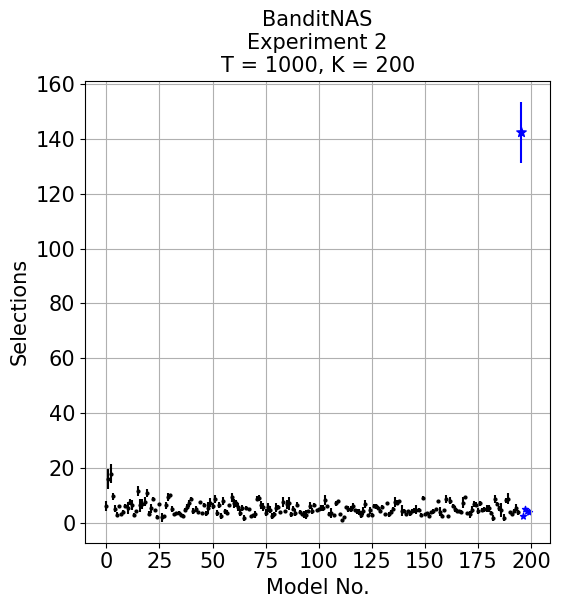

In [ ]:
input_string = '''100%|██████████| 10/10 [00:01<00:00,  6.91it/s]BanditNAS

[  6.2  16.1  18.    9.7   5.2   3.    6.2   3.2   4.    6.3   5.6   7.7
   6.5   2.9   4.4  11.7   6.4   6.8   7.8  10.9   3.4   5.3   8.7   4.6
   2.3   6.9   2.    2.5   6.5   9.4  10.2   5.2   3.1   3.7   3.6   2.8
   2.7   4.9   5.9   7.1   8.9   4.3   5.2   4.    7.7   3.7   6.7   3.5
   5.4   7.4   6.2   8.9   3.7   6.6   2.4   8.    4.3   3.7   6.6   9.3
   7.1   7.2   5.7   3.8   5.3   1.7   5.6   5.2   2.4   2.8   3.2   8.8
   9.1   6.4   5.9   3.7   5.7   4.9   2.5   3.2   5.6   5.9   3.9   7.6
   4.2   6.8   7.1   3.2   5.2   3.8   6.6   3.9   3.1   3.    3.    4.3
   6.3   4.4   6.5   4.7   5.2   5.4   5.5   8.5   6.    3.4   3.6   2.9
   7.2   7.9   3.1   1.    2.    5.7   5.    5.    6.1   4.6   4.2   4.1
   3.    4.3   6.9   3.    4.6   3.    6.2   6.1   5.5   4.4   5.8   3.1
   7.3   3.2   4.    5.1   7.6   7.4   7.9   4.5   4.2   3.3   4.3   3.6
   4.4   4.7   4.9   4.8   3.    9.2   3.3   3.7   2.7   4.1   4.2   5.1
   8.    4.1   2.6   4.9   8.8   2.5   8.1   6.1   5.1   4.4   4.2   4.
   7.4   9.3   3.5   3.2   4.8   7.    6.7   4.5   7.2   4.7   5.    5.2
   5.3   3.6   1.8   8.7   6.8   5.3   4.8   1.9   8.3   8.8   3.9   3.1
   4.5   5.6   3.9 142.4   2.7   5.    4.3   4. ]

[ 1.83303028  3.67287353  3.46410162  1.18743421  1.2489996   0.89442719
  0.4         0.4         0.63245553  0.45825757  2.15406592  1.18743421
  1.80277564  0.7         0.48989795  1.9         2.4979992   1.77763888
  1.66132477  1.3         0.8         1.67630546  0.78102497  0.66332496
  0.78102497  0.3         1.54919334  0.5         1.28452326  1.56204994
  0.4         1.07703296  0.7         0.45825757  0.66332496  0.74833148
  0.64031242  0.7         1.04403065  1.37477271  0.53851648  1.1
  1.07703296  0.          0.45825757  0.45825757  0.45825757  0.80622577
  2.05912603  1.62480768  1.07703296  1.44568323  1.18743421  1.0198039
  1.11355287  1.4832397   0.9         0.9         0.48989795  1.61554944
  1.5132746   1.32664992  1.41774469  1.2489996   1.1         1.1
  0.66332496  0.4         0.66332496  0.6         1.32664992  0.9797959
  1.22065556  1.42828569  1.37477271  1.3453624   1.73493516  1.37477271
  1.02469508  0.87177979  1.62480768  0.53851648  0.53851648  1.95959179
  0.4         1.6         2.21133444  0.87177979  0.9797959   1.32664992
  0.91651514  0.7         0.3         1.26491106  1.61245155  0.45825757
  1.26885775  1.2         0.80622577  0.45825757  0.4         1.11355287
  1.11803399  1.85741756  0.          0.48989795  1.74355958  0.3
  0.87177979  0.53851648  0.7         0.          0.          0.64031242
  1.09544512  1.          1.13578167  0.48989795  0.87177979  1.13578167
  1.18321596  1.3453624   1.37477271  0.          1.356466    0.4472136
  0.74833148  0.94339811  0.5         0.8         0.74833148  0.3
  0.45825757  0.87177979  0.63245553  0.83066239  1.8         1.0198039
  0.53851648  2.10950231  0.74833148  0.45825757  0.45825757  0.91651514
  0.8         0.9         1.57797338  0.74833148  0.77459667  0.74833148
  0.45825757  0.45825757  0.78102497  0.3         0.87177979  0.3
  0.4472136   1.7         0.66332496  0.3         1.4         0.5
  1.22065556  0.83066239  1.04403065  0.8         0.4         0.89442719
  1.9078784   0.64031242  0.5         1.2489996   1.2489996   1.18321596
  0.78102497  1.11803399  0.87177979  0.64031242  0.89442719  1.32664992
  1.41774469  0.66332496  0.9797959   1.3453624   0.74833148  0.78102497
  2.48193473  1.3         0.9         1.93907194  0.53851648  0.7
  0.5         1.28062485  0.83066239 11.10135127  0.45825757  0.
  0.45825757  0.        ]
T = 1000, K = 200, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
print(f'Total number of epochs: {DATA.sum()}')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 195.201 times more often than sub-optimal models on average
Total number of epochs: 10200.0


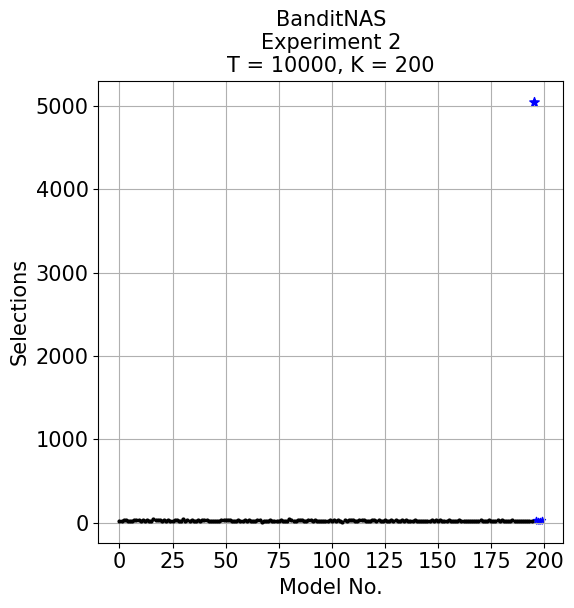

In [ ]:
input_string = '''100%|██████████| 10/10 [00:12<00:00,  1.23s/it]BanditNAS

[  25.    25.3   35.6   29.    26.8   21.2   20.    32.1   27.8   35.7
   26.8   27.2   19.    28.    20.1   27.    39.2   27.4   35.3   33.8
   24.3   33.2   26.1   31.5   26.1   21.1   29.9   27.5   25.6   23.8
   42.6   20.3   30.6   22.2   27.4   22.    23.1   27.4   25.8   35.1
   32.7   30.4   26.6   26.    23.6   24.    24.5   20.8   34.    29.3
   32.4   28.6   27.2   19.5   20.8   25.1   32.    15.1   26.5   32.9
   22.2   29.    26.6   21.    24.9   30.4   29.1   13.7   21.5   23.7
   26.8   27.3   20.4   26.2   23.4   22.1   27.6   22.4   23.    24.4
   40.7   28.7   23.4   17.8   30.7   31.2   29.5   21.4   26.8   27.6
   28.2   23.1   29.3   26.2   20.6   19.6   24.3   17.    23.3   32.7
   27.    30.5   25.6   27.5   25.5   14.1   31.3   23.2   30.6   27.3
   28.6   24.3   22.4   28.8   27.3   27.2   23.9   20.3   26.8   27.9
   27.6   22.4   27.4   19.1   24.6   31.    23.    25.7   31.8   22.3
   27.4   25.5   16.9   31.5   24.7   29.5   19.9   25.6   20.9   30.5
   23.4   24.4   21.2   19.5   27.    24.    26.    34.6   22.8   31.5
   23.    28.6   18.7   25.5   20.9   31.5   24.3   17.4   25.6   25.6
   33.4   21.8   26.1   24.5   20.5   26.8   25.6   23.    19.2   24.6
   32.9   24.7   25.    26.7   30.2   24.7   22.1   23.6   30.    19.9
   33.5   16.9   22.8   27.    20.3   27.9   22.    27.    24.3   26.5
   25.5   24.7   22.    23.6   25.5 5050.6   32.    24.7   19.3   28. ]

[ 0.          0.45825757  0.66332496  0.          0.4         0.4
  0.          0.3         0.4         9.23092628  0.87177979  0.4
  0.89442719  1.67332005  3.4190642   2.48997992  1.83303028  0.48989795
  0.45825757  0.9797959   1.61554944  0.4         0.94339811  1.36014705
  1.57797338  1.13578167  1.04403065  1.02469508  2.00997512  0.9797959
 10.0518655   1.00498756  0.8         0.74833148  0.48989795  0.63245553
  0.3         0.48989795  1.46969385  0.94339811  0.9         0.8
  0.48989795  0.89442719  1.2         0.4472136   2.01246118  1.88679623
  1.          1.26885775  1.42828569  1.0198039   1.32664992  1.28452326
  0.6         1.86815417  1.94935887  1.04403065  0.5         0.3
  0.9797959   0.89442719  0.91651514  0.89442719  0.83066239  1.9078784
  1.22065556  1.26885775  1.62788206  1.48660687  1.4         0.9
  1.42828569  1.2489996   1.2         0.94339811  0.66332496  0.8
  0.4472136   2.10713075  1.41774469  1.61554944  0.66332496  0.9797959
  1.84661853  0.74833148  1.5         1.28062485  0.74833148  2.87054002
  2.44131112  0.53851648  0.45825757  0.87177979  0.48989795  1.2
  0.78102497  0.77459667  1.00498756  2.79463772  2.68328157  0.5
  1.0198039   1.56524758  1.02469508  0.83066239  1.79164729  1.16619038
  0.8         2.19317122  1.8547237   1.55241747  0.66332496  0.74833148
  0.78102497  0.87177979  1.3         1.41774469  1.2489996   1.75783958
  1.68522995  1.0198039   1.11355287  0.83066239  1.0198039   1.26491106
  2.64575131  3.46554469  2.52190404  2.05182845  1.8         1.28452326
  0.94339811  0.92195445  1.67630546  1.43178211  1.13578167  1.0198039
  1.64012195  1.11803399  1.74355958  1.56204994  1.16619038  1.36014705
  0.63245553  1.4832397   1.84390889  1.2         1.53622915  1.02469508
  1.34164079  1.0198039   0.64031242  0.67082039  0.83066239  1.20415946
  1.61554944  2.41660919  2.45764115  2.57681975  1.62480768  0.74833148
  1.04403065  1.85741756  1.80277564  1.07703296  1.56204994  2.32379001
  1.46969385  1.2         0.83066239  0.64031242  0.77459667  1.18743421
  1.07703296  1.3453624   0.7         2.05912603  1.67332005  1.5132746
  2.29128785  2.16564078  1.16619038  2.          1.18743421  1.97230829
  1.34164079  1.94935887  0.64031242  2.41867732  1.20415946  0.64031242
  0.89442719  1.11355287  2.80178515  1.68522995  0.          0.45825757
  0.45825757  0.        ]
T = 10000, K = 200, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
print(f'Total number of epochs: {DATA.sum()}')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 289.778 times more often than sub-optimal models on average


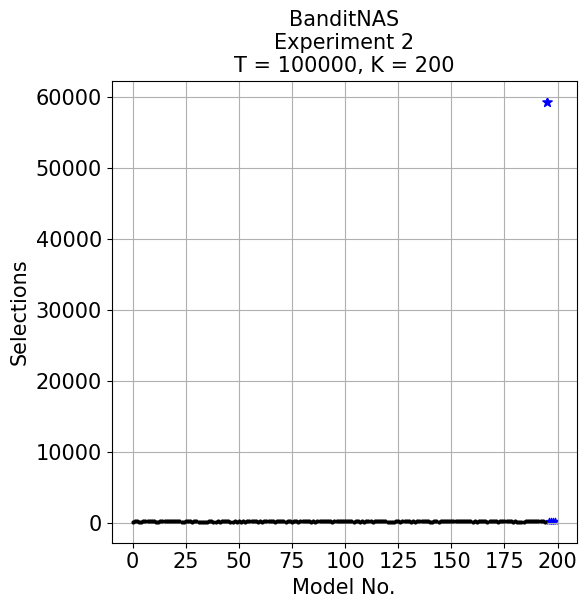

In [ ]:
input_string = '''
100%|██████████| 10/10 [01:34<00:00,  9.43s/it]BanditNAS

[  187.    212.    231.9   193.    195.2   208.3   216.5   224.    217.8
   205.2   213.8   191.2   173.1   226.9   203.7   223.    201.    225.8
   210.    221.5   205.4   202.3   206.7   195.8   185.5   204.    217.1
   200.9   173.    220.1   223.4   191.7   195.2   192.2   167.3   189.9
   220.2   208.8   174.    195.3   214.6   168.8   203.6   207.    209.3
   199.4   175.6   188.7   201.9   167.4   200.1   196.    206.7   186.5
   227.1   210.7   199.9   205.1   224.7   182.5   198.    190.    204.5
   203.2   201.7   208.9   199.    169.7   231.9   217.5   216.5   202.3
   196.7   211.8   206.3   177.9   217.1   199.8   181.2   219.7   200.
   207.9   233.2   197.4   193.8   231.    190.1   224.4   245.7   212.
   220.8   200.1   208.5   206.1   169.2   203.8   200.9   201.8   234.8
   213.5   197.2   202.5   213.7   209.6   173.3   198.5   210.3   190.2
   208.5   178.1   213.5   199.2   211.2   188.8   198.5   210.6   203.6
   219.6   221.    208.4   185.9   195.1   194.2   193.6   203.6   222.
   187.2   206.5   220.    223.    205.9   197.    200.8   195.6   202.
   236.2   202.6   225.1   223.6   208.1   196.8   186.6   213.9   228.3
   190.3   220.7   228.7   208.3   229.3   226.3   211.5   203.9   203.9
   211.7   218.    203.3   204.6   202.2   209.7   197.6   192.9   213.3
   184.4   207.7   212.5   212.6   224.4   195.5   212.3   218.3   199.4
   207.9   186.4   226.5   218.2   229.4   232.3   203.1   198.8   194.3
   217.8   184.6   191.7   195.8   192.6   208.7   207.5   200.9   204.
   199.4   210.3   209.2   210.1   217.3   179.5 59372.5   212.    226.
   204.    232. ]

[0.         0.         0.3        0.         0.4        0.78102497
 0.5        0.         0.4        0.4        0.9797959  0.9797959
 0.3        0.3        0.45825757 0.4472136  0.63245553 0.4
 0.77459667 0.5        0.8        1.1        0.45825757 0.4
 0.5        0.77459667 0.53851648 0.94339811 0.         1.04403065
 0.66332496 1.18743421 0.4        0.4        0.78102497 0.53851648
 0.6        0.87177979 0.         0.64031242 0.66332496 0.4
 0.48989795 0.63245553 1.00498756 0.48989795 0.48989795 0.9
 1.44568323 1.62480768 0.3        1.         0.9        0.5
 0.3        0.78102497 0.3        0.3        1.18743421 1.02469508
 0.77459667 0.77459667 1.80277564 0.9797959  1.1        1.04403065
 0.63245553 1.18743421 1.04403065 1.20415946 1.02469508 0.64031242
 1.3453624  1.98997487 1.18743421 0.7        0.83066239 1.6
 0.74833148 1.55241747 1.09544512 0.53851648 1.32664992 0.91651514
 1.32664992 1.4832397  0.53851648 1.0198039  0.64031242 1.
 1.32664992 0.94339811 0.5        0.94339811 1.07703296 1.07703296
 0.94339811 1.2489996  0.87177979 1.36014705 0.9797959  0.92195445
 1.61554944 1.356466   1.1        1.20415946 2.00249844 0.6
 0.67082039 0.83066239 1.62788206 1.6        1.16619038 0.6
 0.67082039 0.91651514 1.49666295 1.49666295 2.23606798 1.2
 0.94339811 1.04403065 0.87177979 2.24499443 1.2        1.18321596
 0.87177979 1.80277564 1.34164079 1.41421356 1.7        0.89442719
 2.8213472  1.11355287 1.4832397  1.16619038 1.68522995 1.57797338
 1.8547237  0.7        1.2489996  1.68522995 1.44568323 1.79164729
 2.49198716 2.14709106 1.3453624  1.41774469 1.26885775 1.1
 1.62788206 0.7        0.7        0.45825757 0.89442719 0.9
 0.91651514 2.6        3.49428104 1.62480768 0.7        0.78102497
 1.42828569 1.67630546 2.06155281 2.65329983 2.37486842 1.74642492
 2.05182845 2.96816442 5.35163526 1.44568323 1.95959179 1.80277564
 1.16619038 0.91651514 1.41774469 1.13578167 2.27156334 0.45825757
 1.98997487 1.28062485 0.78102497 1.2489996  1.68522995 0.45825757
 3.77491722 1.57797338 0.89442719 1.49666295 1.41774469 1.32664992
 0.94339811 1.1        1.80277564 1.43178211 0.         0.
 0.         0.        ]
T = 100000, K = 200, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 388.302 times more often than sub-optimal models on average


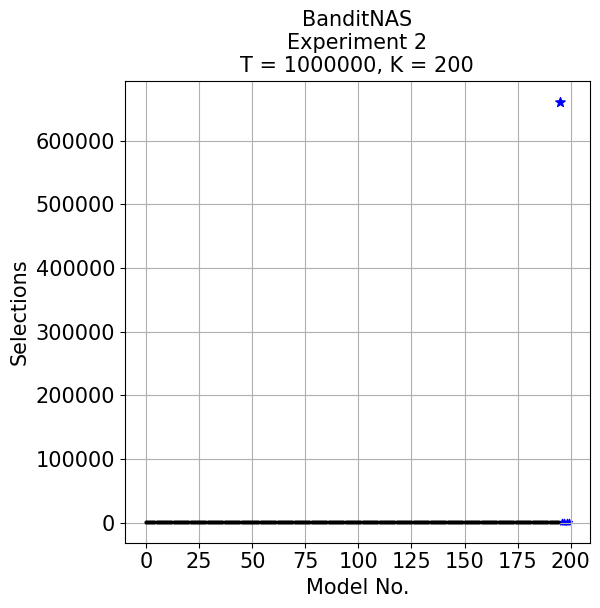

In [ ]:
input_string = '''
100%|██████████| 10/10 [15:10<00:00, 91.00s/it]BanditNAS

[  1681.    1653.    1658.5   1716.4   1670.    1744.    1730.8   1752.2
   1660.    1782.    1735.    1678.    1714.    1668.    1730.9   1680.8
   1699.    1694.    1725.1   1726.9   1773.    1645.    1715.2   1676.1
   1763.8   1737.2   1687.7   1653.    1680.8   1739.    1690.2   1719.7
   1742.3   1702.1   1685.9   1660.3   1659.8   1777.9   1668.4   1686.6
   1696.2   1730.4   1656.7   1627.7   1667.9   1730.2   1746.9   1658.6
   1711.9   1696.3   1642.3   1711.2   1726.7   1615.6   1714.1   1679.1
   1725.7   1708.8   1808.1   1736.8   1669.    1688.9   1689.4   1654.1
   1679.9   1625.7   1736.3   1665.2   1719.2   1689.8   1673.5   1667.2
   1637.2   1642.    1684.7   1743.    1728.7   1667.3   1702.3   1759.6
   1665.8   1667.7   1709.8   1740.2   1725.2   1656.2   1733.8   1756.8
   1665.4   1759.3   1739.5   1773.8   1697.5   1660.5   1756.2   1648.4
   1654.7   1746.1   1745.4   1657.7   1713.5   1645.2   1707.9   1608.6
   1648.1   1713.9   1731.5   1676.7   1644.4   1760.6   1658.6   1660.2
   1821.    1707.9   1792.5   1671.4   1715.6   1763.1   1710.2   1786.9
   1650.    1618.3   1754.2   1715.5   1746.3   1739.2   1695.4   1758.8
   1696.5   1699.5   1793.5   1698.2   1760.7   1733.8   1714.9   1700.6
   1722.5   1722.    1703.3   1709.8   1657.9   1696.1   1673.8   1719.6
   1703.    1741.2   1657.9   1691.7   1668.6   1697.1   1678.6   1767.1
   1727.2   1711.6   1652.    1740.3   1709.6   1641.4   1687.6   1717.4
   1688.3   1733.3   1750.2   1731.8   1690.6   1650.1   1725.3   1701.3
   1715.2   1721.    1678.9   1672.8   1707.7   1641.1   1670.5   1638.4
   1678.3   1714.    1724.6   1728.5   1694.6   1686.6   1662.8   1653.5
   1744.    1769.9   1623.7   1704.4   1733.    1766.    1652.4   1791.3
   1677.    1784.4   1721.7 661259.5   1756.3   1714.7   1682.    1712. ]

[0.         0.         0.5        0.48989795 0.         0.
 0.4        0.4        0.         0.         0.         0.
 0.         0.         0.3        0.6        0.         0.
 0.3        0.83066239 0.89442719 0.         0.4        0.3
 0.4        0.87177979 0.64031242 0.63245553 0.87177979 0.77459667
 0.4        0.45825757 0.45825757 0.3        0.3        0.9
 0.87177979 0.3        0.48989795 0.48989795 2.03960781 1.74355958
 0.45825757 0.45825757 0.53851648 0.6        0.94339811 1.28062485
 0.53851648 0.64031242 0.64031242 0.87177979 0.9        0.66332496
 0.7        0.83066239 0.45825757 0.6        0.83066239 0.6
 0.63245553 0.3        0.48989795 1.13578167 1.81383571 0.9
 0.78102497 0.87177979 1.46969385 0.87177979 0.92195445 0.6
 0.74833148 0.4472136  0.64031242 0.77459667 1.18743421 1.1
 1.3453624  0.66332496 0.6        0.9        0.6        0.4
 0.74833148 0.74833148 1.07703296 0.6        0.66332496 0.9
 0.80622577 0.4        0.67082039 2.6925824  2.22710575 1.0198039
 0.9        1.97230829 1.0198039  1.41774469 0.5        1.77763888
 1.81383571 0.66332496 1.97230829 1.75783958 0.5        1.3453624
 1.11355287 1.11355287 0.66332496 0.9797959  0.89442719 1.7
 1.74642492 1.11355287 1.49666295 1.22065556 1.4        3.36005952
 1.8973666  1.26885775 1.07703296 1.56524758 1.73493516 0.87177979
 1.11355287 1.83303028 2.15638587 0.67082039 1.36014705 1.32664992
 1.41774469 0.6        1.81383571 1.74355958 1.11803399 1.
 1.3453624  0.87177979 1.22065556 0.7        0.6        2.45764115
 3.52136337 1.07703296 1.3        1.48660687 1.42828569 0.94339811
 0.66332496 0.83066239 2.4        3.52703842 2.32379001 0.78102497
 2.37486842 0.91651514 1.8        3.41174442 1.41774469 0.9
 1.07703296 0.6        0.8        0.83066239 1.61554944 1.67630546
 1.46969385 1.41421356 2.91376046 0.9797959  1.18743421 0.7
 0.67082039 1.42828569 1.67630546 0.4472136  1.28062485 2.61725047
 1.2        1.0198039  1.66132477 1.6881943  1.34164079 0.7
 2.1        1.356466   1.73205081 2.32379001 2.61533937 1.9
 1.26491106 0.8        2.19317122 1.5        0.9        0.9
 0.         0.        ]
T = 1000000, K = 200, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 58.460 times more often than sub-optimal models on average


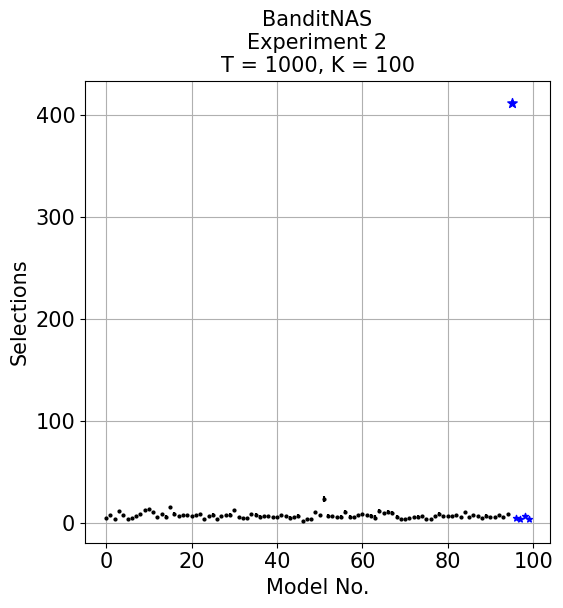

In [ ]:
input_string = '''100%|██████████| 10/10 [00:01<00:00,  8.13it/s]BanditNAS

[  5.    7.9   3.4  11.6   8.    4.    4.1   6.9   8.8  12.7  13.2  10.3
   5.7   8.4   5.7  15.3   8.5   6.7   7.7   7.3   6.6   7.2   8.8   3.5
   6.5   7.6   3.9   6.5   7.3   8.   12.5   5.8   4.6   4.3   8.5   7.8
   6.    6.7   6.2   5.4   5.2   7.6   6.4   5.    5.8   7.    1.8   3.9
   3.9  10.    7.7  23.1   6.5   6.1   5.7   5.9  10.8   5.9   5.3   7.6
   8.8   7.8   6.3   4.9  11.8   9.2  10.7   9.5   5.2   3.7   3.3   4.2
   5.5   5.7   6.4   3.6   3.3   6.8   8.7   6.8   6.1   6.3   8.    5.7
  10.3   5.6   7.5   6.8   4.8   6.8   5.2   5.3   7.2   5.9   8.9 411.5
   4.8   4.    7.    4. ]

[0.         0.3        0.48989795 0.48989795 0.         0.
 0.3        0.94339811 0.87177979 0.64031242 0.6        1.26885775
 0.64031242 1.28062485 1.41774469 0.9        1.56524758 0.9
 0.64031242 0.45825757 0.91651514 0.9797959  0.74833148 0.67082039
 0.5        1.49666295 0.94339811 0.80622577 1.61554944 1.09544512
 0.92195445 1.07703296 1.2        0.9        1.02469508 1.32664992
 1.41421356 1.00498756 0.6        0.66332496 0.9797959  0.8
 0.8        1.09544512 1.07703296 1.54919334 0.87177979 0.3
 0.3        0.77459667 1.18743421 2.84429253 1.80277564 0.7
 0.78102497 1.3        1.98997487 1.7        1.61554944 1.11355287
 1.07703296 0.9797959  1.84661853 2.16564078 1.46969385 0.9797959
 1.41774469 2.06155281 1.83303028 0.78102497 0.64031242 0.87177979
 0.67082039 2.00249844 0.66332496 1.0198039  0.78102497 0.74833148
 1.73493516 0.6        1.13578167 0.9        0.89442719 0.78102497
 1.3453624  0.66332496 1.20415946 0.6        0.74833148 1.32664992
 0.74833148 0.64031242 1.6        1.04403065 0.7        1.11803399
 0.9797959  0.         0.         0.        ]
T = 1000, K = 100, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 124.755 times more often than sub-optimal models on average


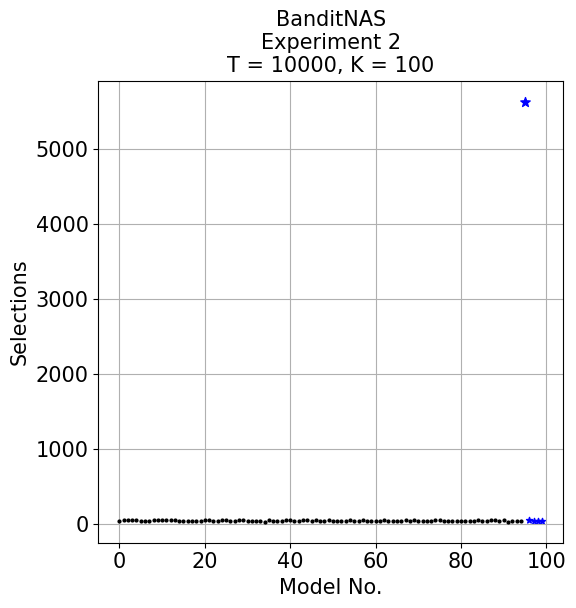

In [ ]:
input_string = '''100%|██████████| 10/10 [00:11<00:00,  1.12s/it]BanditNAS

[  44.    51.9   51.    48.    54.    39.8   40.2   42.7   51.    54.2
   51.7   56.1   49.    56.    41.4   44.9   39.7   37.    43.1   45.6
   53.9   49.7   46.9   46.7   49.3   51.8   43.3   41.    48.6   53.1
   41.7   42.5   43.    43.1   34.    49.7   47.    39.1   39.3   48.9
   48.9   36.5   45.2   52.4   52.5   39.6   47.5   43.1   43.7   48.1
   46.6   47.    37.6   41.7   52.6   41.9   41.2   51.1   42.    42.
   47.1   44.2   50.5   39.9   41.7   46.2   41.1   51.8   41.3   49.6
   34.1   41.1   41.5   38.8   49.3   47.6   39.5   46.6   46.3   43.9
   44.    40.3   44.6   35.    49.4   40.    46.4   53.    50.4   46.2
   50.7   32.    40.    34.3   43.4 5629.6   53.2   44.3   42.    44. ]

[0.         0.3        0.         0.         0.         0.4
 0.4        0.45825757 0.         0.74833148 0.64031242 0.3
 0.         0.         0.91651514 0.53851648 0.45825757 0.4472136
 0.3        0.66332496 0.83066239 0.78102497 0.83066239 0.78102497
 0.78102497 0.4        0.64031242 1.         0.91651514 0.3
 1.26885775 0.80622577 0.4472136  0.94339811 1.         0.78102497
 0.63245553 0.83066239 0.64031242 0.94339811 1.13578167 0.67082039
 0.6        1.2        1.11803399 0.48989795 0.92195445 0.94339811
 1.84661853 2.3        2.57681975 1.84390889 1.42828569 1.48660687
 1.11355287 1.13578167 1.46969385 1.92093727 0.89442719 1.
 1.5132746  0.74833148 1.6881943  1.37477271 1.61554944 2.67581763
 2.16564078 3.51567917 2.19317122 2.15406592 2.9816103  2.62488095
 0.80622577 2.13541565 2.23830293 0.8        1.28452326 0.8
 2.1        3.20780299 2.0976177  1.61554944 1.2        1.09544512
 1.62480768 0.89442719 0.66332496 2.14476106 2.90516781 0.74833148
 1.67630546 0.63245553 1.67332005 3.13209195 1.56204994 0.48989795
 0.4        0.45825757 0.         0.        ]
T = 10000, K = 100, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 182.409 times more often than sub-optimal models on average


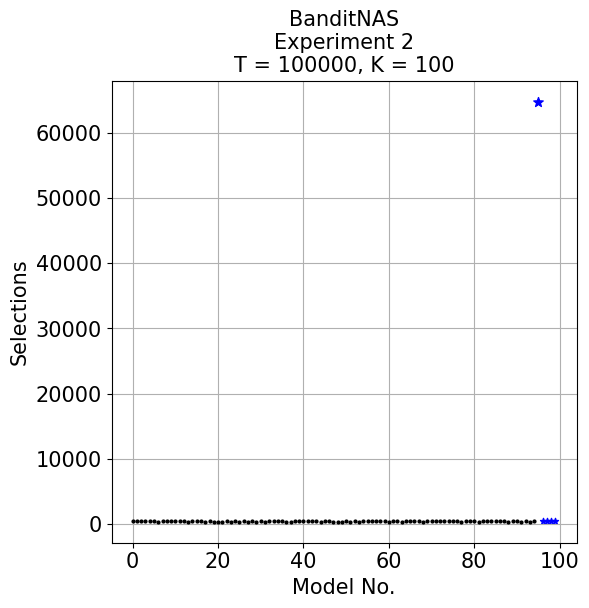

In [ ]:
input_string = '''100%|██████████| 10/10 [01:24<00:00,  8.48s/it]BanditNAS

[  351.    365.9   368.    361.    381.1   361.9   333.    357.7   361.3
   373.3   371.1   349.5   369.7   341.7   370.4   363.6   345.6   311.5
   349.3   333.2   311.8   331.    358.5   344.2   350.7   344.3   346.
   323.8   375.9   343.6   351.3   344.9   345.    350.1   362.8   368.1
   344.8   312.6   356.8   368.    359.8   358.4   380.5   368.8   341.8
   388.3   373.8   341.5   333.7   337.1   355.    341.9   360.1   324.1
   350.6   380.9   347.    371.5   375.    363.9   340.5   360.8   352.2
   338.9   350.4   368.4   367.    382.3   340.9   381.7   354.1   362.
   368.5   379.9   355.2   360.9   367.4   341.    365.6   350.4   390.1
   339.2   364.1   348.7   373.    380.1   376.3   380.7   343.7   353.
   345.3   329.5   363.6   318.2   369.6 64843.3   352.8   375.    376.7
   381.3]

[0.         0.3        0.         0.         0.3        0.3
 0.         0.45825757 0.45825757 0.45825757 0.7        0.67082039
 0.45825757 0.45825757 0.48989795 1.0198039  0.48989795 0.67082039
 0.64031242 0.4        0.4        0.         0.5        1.53622915
 1.41774469 0.45825757 1.18321596 1.2489996  1.81383571 1.11355287
 1.18743421 1.22065556 0.77459667 0.83066239 0.4        0.3
 0.6        1.2        1.46969385 1.54919334 0.9797959  1.74355958
 2.41867732 0.74833148 1.6        1.3453624  0.87177979 0.67082039
 0.64031242 1.22065556 1.67332005 1.7        0.83066239 0.94339811
 1.28062485 1.44568323 1.18321596 1.5        1.61245155 2.80891438
 2.97489496 2.22710575 1.66132477 0.94339811 0.48989795 1.0198039
 1.78885438 1.1        1.86815417 2.00249844 1.22065556 0.63245553
 1.80277564 1.13578167 1.53622915 1.22065556 1.28062485 0.77459667
 1.11355287 1.42828569 1.5132746  2.0880613  3.6180105  2.57099203
 1.41421356 1.7        1.00498756 1.67630546 1.61554944 1.
 0.64031242 2.15638587 1.68522995 1.4        2.76405499 1.1
 0.4        0.         0.45825757 0.45825757]
T = 100000, K = 100, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 237.138 times more often than sub-optimal models on average


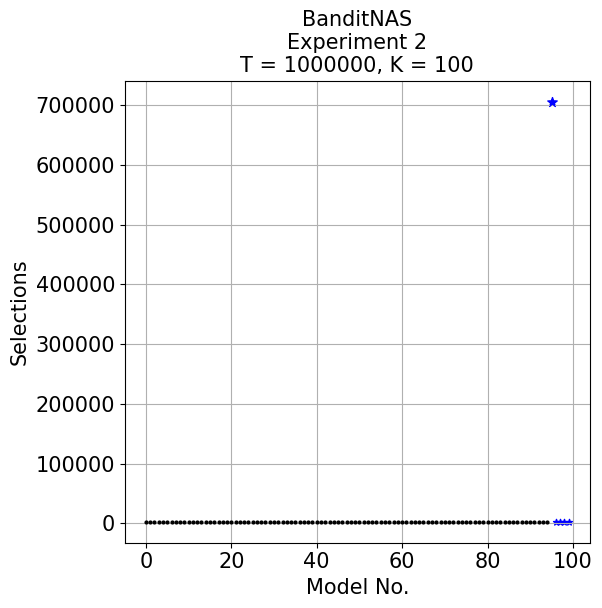

In [ ]:
input_string = '''100%|██████████| 10/10 [12:49<00:00, 76.99s/it]BanditNAS

[  2944.8   2940.1   2949.    3074.    3005.1   2991.6   2962.2   2975.5
   2981.    2941.3   3020.1   2987.9   3076.9   2976.5   2885.4   3003.7
   3007.5   2946.1   3002.9   2946.3   2980.1   2959.7   2925.4   2945.
   3001.9   2951.9   2984.    2931.    3045.5   2990.4   2954.7   2965.6
   2918.    2914.8   3060.5   2919.2   2870.1   2938.8   2867.2   3003.6
   3011.1   3135.9   2953.5   3052.5   2955.3   3074.    2799.1   2904.8
   2997.4   3034.2   2925.2   2960.1   2919.5   2958.6   2965.5   2963.9
   2972.3   3052.    3066.1   2994.2   2910.3   2948.    3095.7   2994.3
   2955.    3039.1   3025.7   3026.1   2956.2   2976.5   2988.8   2973.6
   3018.7   2934.4   2880.6   3078.6   2935.2   2933.3   2967.4   3001.
   2985.1   2964.9   2977.7   2968.9   2989.2   3012.2   3008.8   2864.2
   2961.8   2980.6   2858.2   3032.8   3047.5   2941.9   2946.6 705471.7
   2975.9   3049.    3013.    2971. ]

[0.4        0.53851648 0.         0.         0.7        0.48989795
 0.4        0.5        0.4472136  0.64031242 0.7        0.7
 0.94339811 0.5        0.8        1.26885775 0.5        1.22065556
 0.94339811 0.64031242 0.3        0.45825757 0.66332496 0.
 1.44568323 1.13578167 0.63245553 0.4472136  1.02469508 1.0198039
 0.45825757 1.0198039  1.18321596 0.4        0.92195445 1.07703296
 0.83066239 0.6        0.87177979 0.48989795 0.7        1.04403065
 0.92195445 1.20415946 1.84661853 1.18321596 0.94339811 1.4
 1.49666295 1.07703296 0.6        1.5132746  1.62788206 1.2
 1.20415946 0.83066239 1.41774469 0.63245553 0.7        1.93907194
 2.1        2.14476106 1.95192213 1.73493516 1.61245155 1.3
 1.48660687 2.84429253 1.98997487 3.38378486 0.87177979 1.2
 1.3453624  1.9078784  1.8        1.11355287 1.53622915 1.41774469
 0.91651514 0.89442719 0.94339811 1.5132746  2.49198716 1.75783958
 2.44131112 1.16619038 1.46969385 0.6        1.88679623 1.9078784
 1.07703296 1.16619038 0.92195445 1.13578167 1.2        2.1
 0.83066239 0.         0.         0.        ]
T = 1000000, K = 100, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 36.544 times more often than sub-optimal models on average


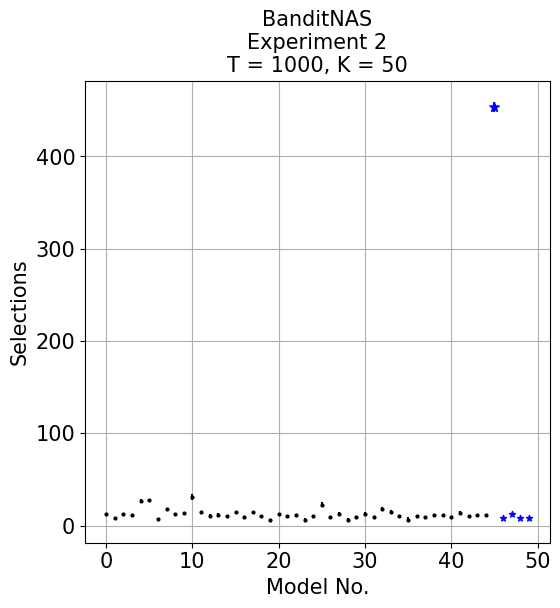

In [ ]:
input_string = '''100%|██████████| 10/10 [00:00<00:00, 10.93it/s]BanditNAS

[ 12.9   7.9  12.7  10.9  26.5  28.1   7.2  18.3  12.5  13.4  31.   14.2
  10.5  11.5   9.9  14.7   8.9  14.4  10.7   5.9  12.6  10.   11.1   6.3
   9.8  22.4   8.7  12.4   6.3   8.8  12.9   8.7  17.8  15.2  10.3   6.5
  10.4   8.9  11.5  10.9   8.8  13.9   9.9  11.5  11.1 453.8   8.6  12.8
   8.    8. ]

[0.3        0.3        0.64031242 0.83066239 1.91049732 0.3
 0.4        1.1        1.36014705 1.0198039  3.2249031  0.6
 1.80277564 1.80277564 1.22065556 1.3453624  0.7        1.11355287
 1.00498756 1.37477271 1.42828569 1.54919334 1.7        1.41774469
 1.07703296 2.65329983 1.55241747 1.8547237  1.67630546 1.46969385
 1.22065556 1.1        1.83303028 1.98997487 1.55241747 2.37697286
 1.42828569 1.04403065 0.92195445 0.83066239 0.87177979 1.57797338
 0.83066239 0.67082039 1.64012195 5.5641711  0.48989795 0.9797959
 0.89442719 0.        ]
T = 1000, K = 50, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 78.197 times more often than sub-optimal models on average


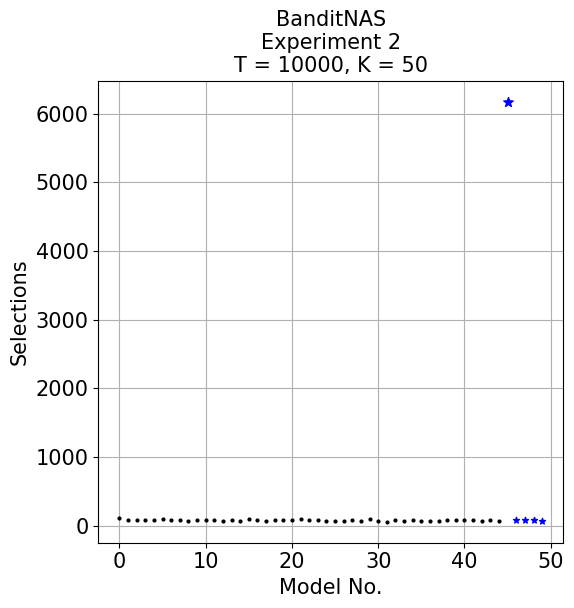

In [ ]:
input_string = '''100%|██████████| 10/10 [00:07<00:00,  1.38it/s]BanditNAS

[ 119.    85.6   87.2   81.9   78.   100.8   89.4   85.7   74.5   76.
   80.3   80.4   74.9   76.4   73.    91.6   78.7   72.3   84.    76.3
   79.2   98.1   79.7   79.9   72.4   65.6   64.3   81.1   70.3   92.
   62.7   59.5   76.3   65.    80.5   66.7   65.6   69.9   82.2   80.8
   87.3   82.7   71.6   82.9   69.4 6171.8   89.5   86.4   77.6   73. ]

[8.19756061 3.13687743 1.88679623 3.93573373 0.89442719 1.77763888
 1.2        1.61554944 1.6881943  1.         0.45825757 1.8
 1.57797338 1.56204994 1.54919334 1.62480768 1.00498756 3.52278299
 1.61245155 1.9        4.06939799 2.58650343 1.26885775 0.94339811
 2.05912603 2.15406592 1.9        3.7        0.9        1.09544512
 1.00498756 1.5        2.1        0.77459667 1.91049732 1.26885775
 2.05912603 1.64012195 1.77763888 1.72046505 2.1        0.9
 1.0198039  1.44568323 1.74355958 2.18174242 0.5        0.48989795
 0.48989795 0.        ]
T = 10000, K = 50, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 115.599 times more often than sub-optimal models on average


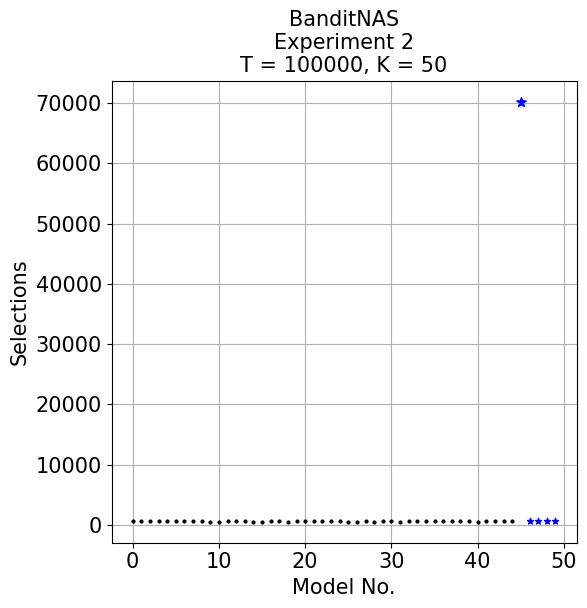

In [ ]:
input_string = '''100%|██████████| 10/10 [01:11<00:00,  7.13s/it]BanditNAS

[  623.8   663.9   602.8   601.    638.8   595.7   647.9   593.8   597.7
   552.    572.    588.4   615.4   592.8   582.6   576.1   631.    599.6
   555.9   597.4   641.9   621.9   620.1   589.9   590.8   553.4   582.1
   597.5   577.6   677.9   614.7   586.    620.8   608.3   632.8   596.9
   627.3   610.4   617.6   640.    567.4   626.1   665.3   617.8   618.2
 70210.4   639.9   616.    609.4   643. ]

[0.6        0.3        0.87177979 1.18321596 0.6        0.64031242
 0.3        0.9797959  2.1        1.         1.54919334 1.28062485
 0.48989795 1.93907194 2.2        0.7        0.4472136  1.49666295
 0.83066239 0.8        0.7        1.37477271 1.5132746  0.94339811
 1.07703296 1.68522995 1.5132746  1.11803399 1.356466   1.3
 0.9        1.         1.2489996  1.18743421 1.46969385 1.3
 1.18743421 0.91651514 1.8        1.61245155 1.49666295 1.22065556
 1.67630546 1.77763888 1.4        1.42828569 0.3        0.
 1.0198039  0.63245553]
T = 100000, K = 50, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 131.353 times more often than sub-optimal models on average


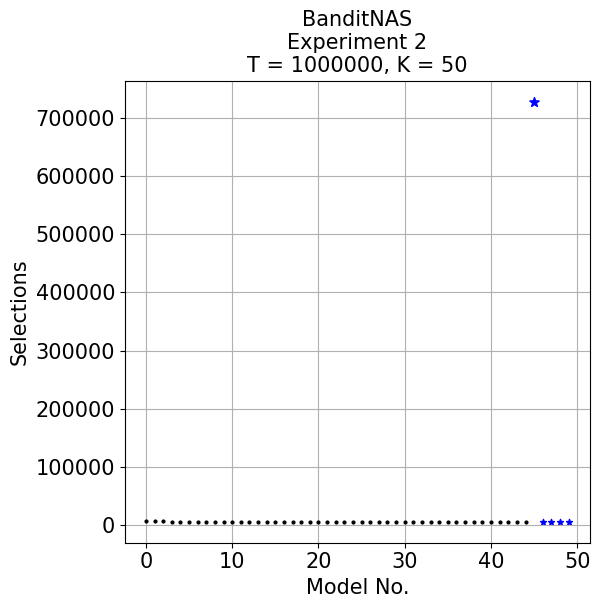

In [ ]:
input_string = '''100%|██████████| 10/10 [11:59<00:00, 71.99s/it]BanditNAS

[  6202.3   5838.5   5826.1   5714.3   5543.    5519.    5632.1   5670.7
   5557.5   5515.4   5421.1   5489.1   5537.5   5415.    5512.2   5551.
   5446.3   5670.8   5590.9   5358.1   5566.1   5518.4   5549.3   5362.2
   5555.1   5432.1   5504.5   5597.2   5588.5   5583.6   5415.4   5380.9
   5540.3   5510.9   5588.4   5476.7   5671.3   5457.2   5395.8   5533.1
   5440.3   5495.8   5500.9   5426.4   5444.1 728413.6   5493.6   5543.4
   5533.    5521. ]

[0.45825757 0.5        0.83066239 0.45825757 0.         0.
 0.3        0.9        0.80622577 0.91651514 1.37477271 1.22065556
 1.85741756 2.7202941  2.44131112 2.32379001 1.9        0.9797959
 0.53851648 1.13578167 1.57797338 1.28062485 2.72213152 1.72046505
 1.97230829 1.81383571 2.29128785 1.07703296 1.43178211 1.74355958
 1.2        1.75783958 2.86530976 1.81383571 2.00997512 1.48660687
 0.9        1.07703296 1.16619038 2.58650343 3.40734501 2.44131112
 2.25610283 1.356466   2.16564078 3.38230691 0.48989795 0.48989795
 0.         0.        ]
T = 1000000, K = 50, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 18.004 times more often than sub-optimal models on average


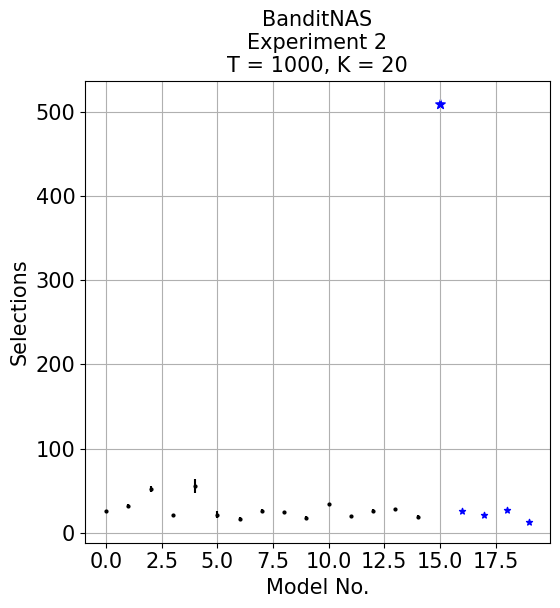

In [ ]:
input_string = '''100%|██████████| 10/10 [00:01<00:00,  8.34it/s]BanditNAS

[ 26.4  32.4  52.6  21.   55.7  21.8  16.8  25.7  24.9  18.3  34.7  19.7
  26.3  28.6  19.  508.8  25.7  21.4  26.8  13.4]

[0.48989795 2.28910463 3.49857114 1.18321596 7.93788385 4.5563143
 2.31516738 2.49198716 0.7        1.73493516 1.41774469 1.84661853
 2.05182845 1.42828569 1.78885438 2.85657137 0.64031242 1.68522995
 1.6        0.48989795]
T = 1000, K = 20, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 20.703 times more often than sub-optimal models on average


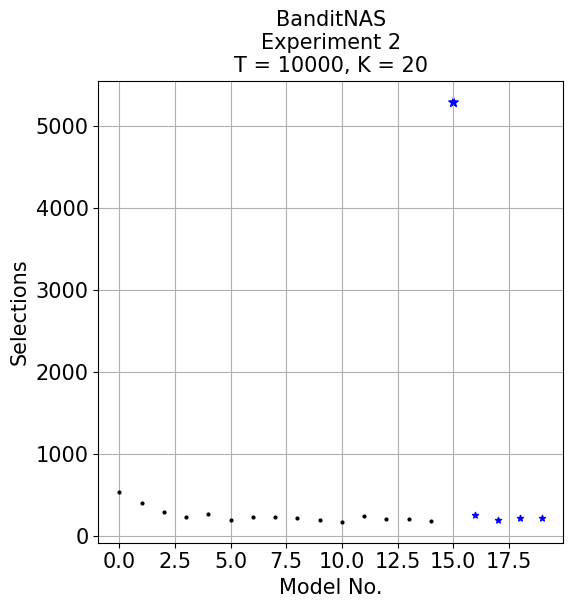

In [ ]:
input_string = '''100%|██████████| 10/10 [00:09<00:00,  1.11it/s]BanditNAS

[ 540.6  404.2  298.8  233.1  269.9  199.5  235.6  226.3  225.6  192.2
  176.1  239.3  201.9  208.4  182.7 5292.   253.   194.5  223.5  222.8]

[2.24499443 2.0880613  2.74954542 2.07123152 2.07123152 1.02469508
 0.91651514 1.18743421 1.28062485 1.07703296 1.64012195 1.95192213
 1.7        2.4979992  2.1        3.28633535 0.         0.92195445
 0.5        0.9797959 ]
T = 10000, K = 20, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 64.511 times more often than sub-optimal models on average


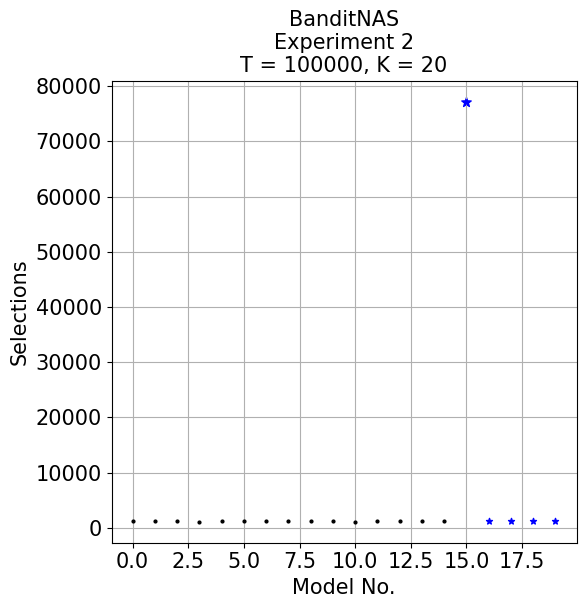

In [ ]:
input_string = '''100%|██████████| 10/10 [01:14<00:00,  7.43s/it]BanditNAS

[ 1252.   1213.1  1225.   1116.4  1164.9  1193.7  1223.5  1156.3  1252.9
  1183.3  1109.1  1237.5  1166.6  1276.4  1174.9 77179.4  1260.5  1201.1
  1212.4  1221. ]

[0.77459667 0.94339811 1.         0.8        1.37477271 1.48660687
 0.92195445 1.79164729 2.16564078 1.18743421 1.04403065 0.80622577
 0.91651514 0.91651514 1.44568323 1.74355958 1.11803399 0.83066239
 0.48989795 0.        ]
T = 100000, K = 20, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 81.845 times more often than sub-optimal models on average


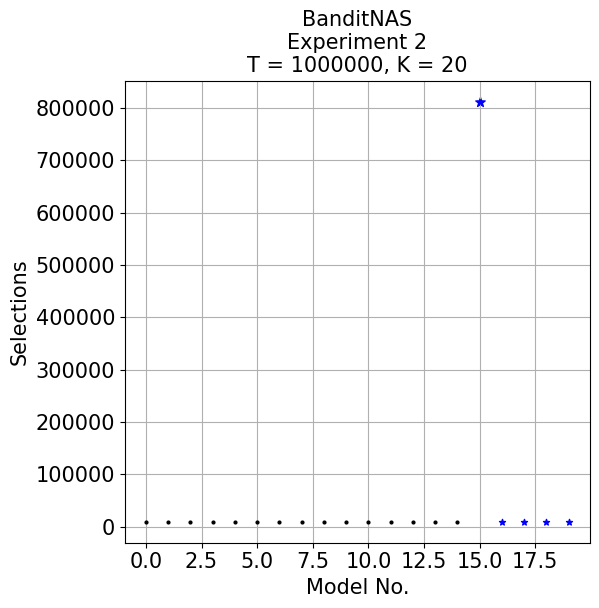

In [ ]:
input_string = '''100%|██████████| 10/10 [11:55<00:00, 71.51s/it]BanditNAS

[  9985.9   9792.6   9885.1   9844.4   9816.9   9887.    9956.8   9802.5
   9954.3   9925.6   9772.6  10061.    9969.6  10159.9   9929.6 811600.6
   9920.5   9861.4   9975.3   9918.4]

[0.3        0.66332496 0.7        0.66332496 0.7        0.77459667
 0.4        0.5        0.78102497 0.66332496 1.2        1.09544512
 0.8        0.94339811 0.91651514 0.48989795 0.67082039 1.0198039
 1.00498756 0.48989795]
T = 1000000, K = 20, Experiment: 2
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 26.659 times more often than sub-optimal models on average


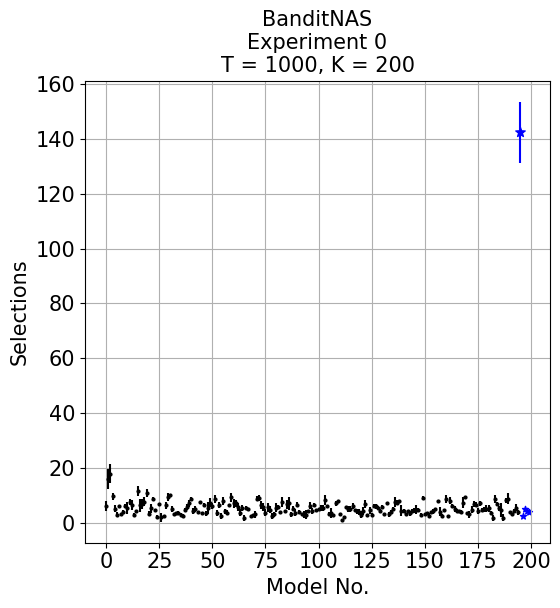

In [ ]:
input_string = '''100%|██████████| 10/10 [00:01<00:00,  6.32it/s]BanditNAS

[  6.2  16.1  18.    9.7   5.2   3.    6.2   3.2   4.    6.3   5.6   7.7
   6.5   2.9   4.4  11.7   6.4   6.8   7.8  10.9   3.4   5.3   8.7   4.6
   2.3   6.9   2.    2.5   6.5   9.4  10.2   5.2   3.1   3.7   3.6   2.8
   2.7   4.9   5.9   7.1   8.9   4.3   5.2   4.    7.7   3.7   6.7   3.5
   5.4   7.4   6.2   8.9   3.7   6.6   2.4   8.    4.3   3.7   6.6   9.3
   7.1   7.2   5.7   3.8   5.3   1.7   5.6   5.2   2.4   2.8   3.2   8.8
   9.1   6.4   5.9   3.7   5.7   4.9   2.5   3.2   5.6   5.9   3.9   7.6
   4.2   6.8   7.1   3.2   5.2   3.8   6.6   3.9   3.1   3.    3.    4.3
   6.3   4.4   6.5   4.7   5.2   5.4   5.5   8.5   6.    3.4   3.6   2.9
   7.2   7.9   3.1   1.    2.    5.7   5.    5.    6.1   4.6   4.2   4.1
   3.    4.3   6.9   3.    4.6   3.    6.2   6.1   5.5   4.4   5.8   3.1
   7.3   3.2   4.    5.1   7.6   7.4   7.9   4.5   4.2   3.3   4.3   3.6
   4.4   4.7   4.9   4.8   3.    9.2   3.3   3.7   2.7   4.1   4.2   5.1
   8.    4.1   2.6   4.9   8.8   2.5   8.1   6.1   5.1   4.4   4.2   4.
   7.4   9.3   3.5   3.2   4.8   7.    6.7   4.5   7.2   4.7   5.    5.2
   5.3   3.6   1.8   8.7   6.8   5.3   4.8   1.9   8.3   8.8   3.9   3.1
   4.5   5.6   3.9 142.4   2.7   5.    4.3   4. ]

[ 1.83303028  3.67287353  3.46410162  1.18743421  1.2489996   0.89442719
  0.4         0.4         0.63245553  0.45825757  2.15406592  1.18743421
  1.80277564  0.7         0.48989795  1.9         2.4979992   1.77763888
  1.66132477  1.3         0.8         1.67630546  0.78102497  0.66332496
  0.78102497  0.3         1.54919334  0.5         1.28452326  1.56204994
  0.4         1.07703296  0.7         0.45825757  0.66332496  0.74833148
  0.64031242  0.7         1.04403065  1.37477271  0.53851648  1.1
  1.07703296  0.          0.45825757  0.45825757  0.45825757  0.80622577
  2.05912603  1.62480768  1.07703296  1.44568323  1.18743421  1.0198039
  1.11355287  1.4832397   0.9         0.9         0.48989795  1.61554944
  1.5132746   1.32664992  1.41774469  1.2489996   1.1         1.1
  0.66332496  0.4         0.66332496  0.6         1.32664992  0.9797959
  1.22065556  1.42828569  1.37477271  1.3453624   1.73493516  1.37477271
  1.02469508  0.87177979  1.62480768  0.53851648  0.53851648  1.95959179
  0.4         1.6         2.21133444  0.87177979  0.9797959   1.32664992
  0.91651514  0.7         0.3         1.26491106  1.61245155  0.45825757
  1.26885775  1.2         0.80622577  0.45825757  0.4         1.11355287
  1.11803399  1.85741756  0.          0.48989795  1.74355958  0.3
  0.87177979  0.53851648  0.7         0.          0.          0.64031242
  1.09544512  1.          1.13578167  0.48989795  0.87177979  1.13578167
  1.18321596  1.3453624   1.37477271  0.          1.356466    0.4472136
  0.74833148  0.94339811  0.5         0.8         0.74833148  0.3
  0.45825757  0.87177979  0.63245553  0.83066239  1.8         1.0198039
  0.53851648  2.10950231  0.74833148  0.45825757  0.45825757  0.91651514
  0.8         0.9         1.57797338  0.74833148  0.77459667  0.74833148
  0.45825757  0.45825757  0.78102497  0.3         0.87177979  0.3
  0.4472136   1.7         0.66332496  0.3         1.4         0.5
  1.22065556  0.83066239  1.04403065  0.8         0.4         0.89442719
  1.9078784   0.64031242  0.5         1.2489996   1.2489996   1.18321596
  0.78102497  1.11803399  0.87177979  0.64031242  0.89442719  1.32664992
  1.41774469  0.66332496  0.9797959   1.3453624   0.74833148  0.78102497
  2.48193473  1.3         0.9         1.93907194  0.53851648  0.7
  0.5         1.28062485  0.83066239 11.10135127  0.45825757  0.
  0.45825757  0.        ]
T = 1000, K = 200, Experiment: 0
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 99.103 times more often than sub-optimal models on average


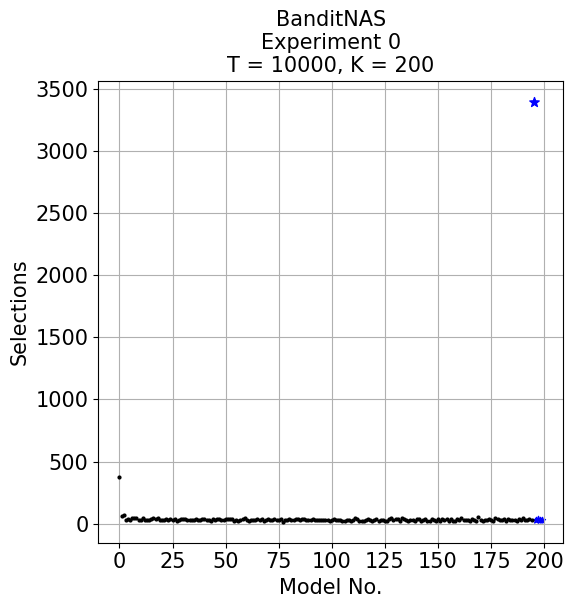

In [ ]:
input_string = '''100%|██████████| 10/10 [00:11<00:00,  1.13s/it]BanditNAS

[ 376.8   60.9   68.8   31.4   35.1   31.    46.2   43.2   48.6   29.2
   29.8   45.8   27.2   33.    30.1   34.7   42.5   40.7   43.3   31.1
   31.6   32.8   36.    31.8   39.4   33.7   36.8   25.    31.4   40.
   38.2   39.4   28.7   27.6   30.9   29.4   40.5   32.3   28.5   40.1
   34.2   27.3   32.1   22.8   41.6   32.8   41.    39.1   27.2   30.6
   35.5   34.9   40.1   36.2   21.9   26.7   24.    33.    40.8   42.6
   28.    22.2   29.8   28.6   30.4   35.6   27.8   39.    24.2   26.5
   36.2   27.1   32.2   39.5   27.9   27.2   36.7   17.6   28.7   32.5
   34.7   33.5   30.1   37.    38.1   32.4   37.9   36.9   29.8   27.5
   33.2   34.1   26.4   32.7   27.9   26.9   29.5   28.8   30.6   22.4
   33.2   36.9   32.6   26.3   28.2   24.5   24.1   33.2   26.6   20.8
   32.8   42.6   34.    25.5   22.4   23.8   33.1   41.6   32.    20.9
   30.2   36.7   25.3   27.6   27.8   24.1   21.5   40.    44.8   31.8
   34.3   36.6   22.7   42.2   34.5   27.3   24.9   31.9   29.8   25.4
   36.7   35.7   23.8   28.9   36.5   24.5   25.9   41.    29.1   25.7
   36.    25.6   41.3   27.9   34.7   22.8   36.4   25.8   25.5   34.6
   33.9   46.3   28.3   31.5   31.7   23.1   37.2   31.4   25.8   53.2
   31.9   23.2   31.9   32.    38.6   27.2   24.4   47.7   34.    29.8
   33.7   35.1   20.1   34.3   31.1   33.9   30.    20.3   40.7   30.7
   46.1   31.6   28.3   37.    32.5 3393.6   32.    41.    26.    30. ]

[0.9797959  4.25323406 3.99499687 3.03973683 2.07123152 1.61245155
 2.27156334 1.6        1.9078784  1.2489996  1.32664992 1.6
 0.74833148 0.89442719 1.04403065 1.00498756 2.94108823 2.1
 0.9        0.94339811 0.48989795 0.87177979 1.73205081 2.8213472
 1.56204994 1.1        2.27156334 2.36643191 1.356466   1.34164079
 1.66132477 1.62480768 1.3453624  0.8        0.83066239 1.28062485
 0.5        1.00498756 2.10950231 2.7        2.48193473 0.78102497
 0.3        1.16619038 1.9078784  1.07703296 1.8973666  1.44568323
 1.6        1.11355287 0.92195445 1.37477271 1.44568323 1.16619038
 1.44568323 1.79164729 1.         0.4472136  1.2489996  1.62480768
 0.77459667 1.2489996  0.9797959  0.48989795 1.11355287 1.0198039
 0.6        1.26491106 0.87177979 3.26343377 2.31516738 0.94339811
 1.98997487 1.11803399 1.04403065 1.07703296 1.1        1.49666295
 0.9        1.20415946 2.32594067 3.35410197 1.22065556 1.26491106
 0.83066239 1.8        1.37477271 1.97230829 1.98997487 3.1701735
 1.72046505 1.97230829 1.49666295 1.00498756 1.97230829 1.3
 1.20415946 1.2489996  0.8        2.37486842 1.66132477 1.22065556
 0.48989795 1.73493516 1.16619038 2.57875939 1.44568323 0.74833148
 2.00997512 0.4        0.87177979 0.48989795 0.77459667 0.80622577
 0.66332496 0.87177979 1.13578167 2.76405499 1.8973666  1.5132746
 0.9797959  1.79164729 1.00498756 1.56204994 1.07703296 1.13578167
 0.92195445 0.63245553 1.98997487 1.93907194 0.78102497 0.91651514
 1.18743421 1.77763888 1.28452326 0.9        1.3        1.04403065
 1.2489996  1.0198039  1.61554944 1.79164729 0.4        2.3
 2.20227155 2.01246118 0.94339811 2.19089023 1.13578167 2.23830293
 4.7116876  1.8547237  1.26885775 1.13578167 0.45825757 0.87177979
 1.28062485 1.4        0.92195445 1.68522995 2.02237484 1.9
 1.3453624  2.20227155 1.1        0.83066239 1.07703296 1.11355287
 1.32664992 1.46969385 2.07123152 0.87177979 0.94339811 2.40831892
 2.00997512 0.4        2.69072481 2.41039416 1.41421356 0.6
 1.61554944 1.92093727 1.04403065 2.00249844 1.3        1.22065556
 0.77459667 0.9        1.3453624  1.00498756 1.44568323 1.0198039
 1.18743421 2.40831892 1.36014705 3.00665928 0.         0.
 0.         0.        ]
T = 10000, K = 200, Experiment: 0
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 115.667 times more often than sub-optimal models on average


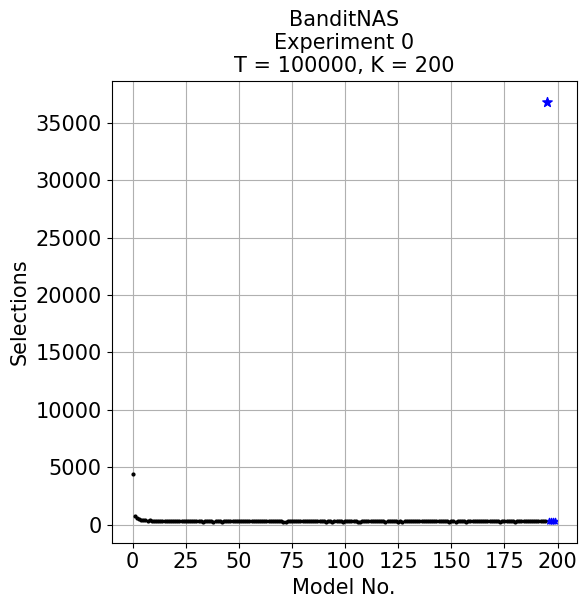

In [ ]:
input_string = '''100%|██████████| 10/10 [01:32<00:00,  9.29s/it]BanditNAS

[ 4436.    773.9   561.8   504.2   396.7   385.8   413.8   328.7   360.9
   339.8   291.9   297.7   310.    317.9   290.2   295.    285.4   277.1
   302.8   315.2   332.8   268.3   307.4   277.    310.    314.9   299.9
   307.4   291.7   298.4   278.8   291.3   317.9   244.5   283.5   289.1
   302.9   294.7   245.8   279.    275.8   286.3   261.1   267.6   315.6
   301.7   284.6   285.2   307.2   308.4   300.    297.1   311.1   305.3
   314.1   303.3   311.1   288.4   288.6   280.2   277.3   285.7   278.3
   290.1   275.7   320.4   325.4   330.2   303.6   264.5   288.9   254.2
   258.3   276.3   299.    299.9   304.5   267.5   290.7   301.5   307.8
   266.    321.5   281.1   281.1   287.9   279.1   298.9   293.    329.6
   343.3   260.7   277.6   305.    261.    300.    268.1   280.8   297.
   257.2   279.3   296.7   285.9   297.1   288.1   296.8   253.1   259.6
   278.4   280.9   305.3   279.4   283.5   273.6   298.4   299.9   264.4
   276.6   276.8   252.5   275.9   333.    294.    297.    307.    244.3
   283.1   252.    270.7   310.7   348.9   313.    335.9   323.4   312.9
   280.1   282.    282.1   274.6   320.8   271.3   263.2   293.    320.6
   277.4   295.1   283.4   289.5   295.    259.    291.    265.9   260.1
   275.    285.1   288.4   281.9   251.9   326.7   293.    270.    316.
   279.6   293.4   281.    288.7   295.1   312.2   277.1   311.6   314.5
   288.8   282.6   257.9   283.1   282.2   273.6   304.3   300.4   281.4
   260.    294.9   269.    277.    301.1   310.9   299.8   297.7   279.3
   295.    292.2   276.9   265.7   291.7   290.1 36853.5   307.    283.8
   289.2   336. ]

[0.         1.37477271 1.32664992 0.4        1.1        2.67581763
 2.0880613  2.00249844 0.94339811 0.74833148 0.83066239 0.45825757
 3.16227766 3.33016516 1.2489996  1.61245155 1.28062485 1.04403065
 0.74833148 1.72046505 1.72046505 1.18743421 0.8        0.89442719
 0.77459667 0.7        1.04403065 1.2        1.55241747 1.356466
 0.4        0.45825757 1.3        1.5        1.36014705 0.7
 1.37477271 0.64031242 0.6        1.61245155 1.53622915 0.78102497
 0.83066239 1.356466   1.49666295 1.26885775 1.28062485 0.4
 1.2489996  1.0198039  1.         0.94339811 0.53851648 1.00498756
 0.7        1.1        0.53851648 0.66332496 1.28062485 1.2489996
 1.18743421 0.45825757 0.45825757 1.13578167 0.64031242 0.48989795
 0.66332496 0.4        0.66332496 0.67082039 0.94339811 1.07703296
 0.45825757 0.45825757 0.77459667 0.7        0.5        0.92195445
 1.1        1.28452326 1.4        0.4472136  0.5        0.3
 0.7        0.7        0.3        0.3        0.63245553 0.91651514
 0.9        1.1        1.2        0.4472136  0.77459667 0.4472136
 0.53851648 0.87177979 0.77459667 1.16619038 0.9        0.64031242
 0.3        0.3        0.53851648 0.4        0.3        0.48989795
 0.48989795 0.3        0.45825757 0.8        0.67082039 1.2
 1.2        0.3        0.48989795 0.8        0.87177979 0.5
 0.3        0.         0.         0.         0.         0.9
 0.53851648 0.89442719 0.64031242 0.45825757 1.57797338 1.41421356
 0.83066239 0.48989795 0.3        0.3        0.         0.3
 0.48989795 0.4        1.26885775 0.9797959  0.         0.66332496
 0.66332496 0.3        0.66332496 0.67082039 0.         0.
 0.         0.53851648 0.53851648 0.         0.53851648 0.66332496
 0.83066239 0.7        0.45825757 0.         0.4472136  0.4472136
 0.48989795 0.48989795 0.         0.45825757 0.94339811 0.9797959
 0.3        0.66332496 0.5        0.6        1.0198039  1.22065556
 1.04403065 0.4        0.48989795 0.45825757 0.8        0.8
 0.         0.3        0.         0.         1.13578167 1.13578167
 0.9797959  0.9        0.64031242 0.63245553 0.4        0.83066239
 0.45825757 0.9        0.3        2.87228132 0.         0.4
 0.4        0.        ]
T = 100000, K = 200, Experiment: 0
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 99.539 times more often than sub-optimal models on average
Total number of epochs: 1000200.0


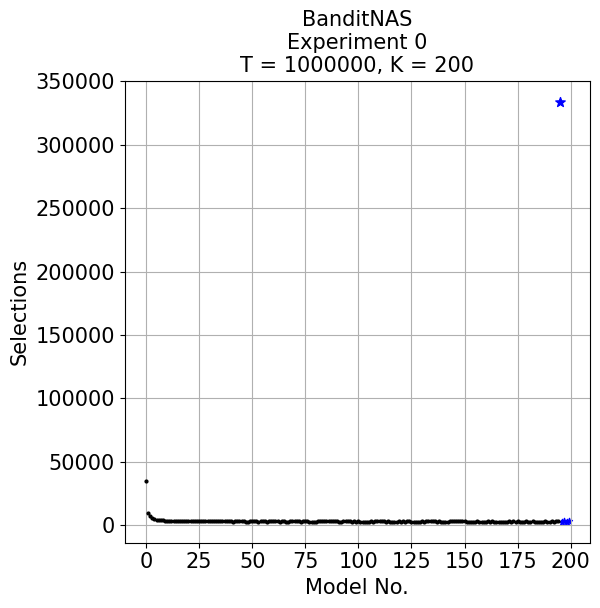

In [ ]:
input_string = '''100%|██████████| 10/10 [15:15<00:00, 91.54s/it]BanditNAS

[ 34920.    9663.    7012.4   5558.1   4904.1   4236.4   4203.7   3870.1
   3904.5   3798.8   3601.2   3688.6   3598.8   3537.4   3482.1   3477.4
   3405.8   3360.2   3259.    3376.8   3388.9   3301.1   3243.2   3146.6
   3288.8   3315.6   3109.    3266.9   3087.5   3221.5   3247.2   3296.9
   3267.    3156.4   3142.7   3159.4   3155.4   3210.1   3106.4   3151.5
   3135.4   2968.4   3185.4   3125.6   3089.2   3112.9   3117.4   2923.9
   3013.6   3076.3   3128.7   3111.    3165.8   2930.6   3059.4   3124.4
   3070.9   3001.3   3171.8   3116.5   3131.4   3121.2   3203.4   2974.3
   3082.    3105.3   3008.4   3043.2   3112.2   3103.9   3082.5   3106.3
   3277.5   3010.6   3065.1   3181.6   3144.4   2976.8   3041.8   3039.6
   2955.6   3105.    3194.    3153.2   3044.    3066.8   3067.5   3135.9
   3065.3   3088.6   3176.8   3011.1   2936.7   3113.2   3064.7   3055.4
   3044.1   3032.3   3184.5   2953.1   3079.    2972.3   2999.9   2906.
   3029.6   3016.2   3101.1   2963.3   3101.9   3148.1   3143.3   3130.7
   3045.7   3030.3   3118.1   2972.5   3020.9   3033.    2989.8   3066.4
   2981.9   3052.5   2915.    3056.9   3146.8   2872.8   2962.6   2984.9
   3031.    3015.4   3137.6   2940.    3107.4   3165.    3190.9   3122.
   3055.9   2948.9   3148.    3031.7   3015.2   2950.1   3035.8   3047.
   3144.1   3139.5   3050.4   3061.1   3152.9   3141.1   3112.3   2997.6
   3003.    2957.2   3019.9   3022.9   3159.4   2989.2   2989.4   2926.
   3009.1   3154.    2965.    3048.9   2968.    3018.5   2961.5   3022.2
   2960.9   2925.9   2994.1   3106.9   2869.2   3081.9   2936.7   3123.2
   2938.8   3010.2   2978.5   3050.9   2990.3   2988.7   3097.1   3030.9
   3038.2   2903.6   2955.2   2987.    3112.4   3020.6   2956.    3070.8
   3035.2   3045.8   3061.6 333875.5   3039.    3163.    2987.    3060. ]

[0.         3.         1.8547237  0.53851648 2.91376046 3.55527777
 0.45825757 0.83066239 1.56524758 1.2489996  0.6        0.91651514
 0.87177979 1.74355958 1.86815417 0.91651514 0.9797959  0.9797959
 1.34164079 0.74833148 0.7        0.3        0.74833148 1.11355287
 0.6        0.66332496 0.89442719 0.3        1.02469508 0.92195445
 0.9797959  1.92093727 1.54919334 0.48989795 1.3453624  1.2
 0.66332496 0.83066239 1.2        0.67082039 0.66332496 0.48989795
 0.66332496 0.91651514 0.87177979 0.53851648 1.11355287 1.3
 1.0198039  0.45825757 0.9        1.18321596 0.9797959  1.8
 2.97321375 1.2        1.13578167 1.18743421 0.87177979 1.43178211
 1.8        0.87177979 1.11355287 1.48660687 0.         0.78102497
 0.48989795 1.46969385 1.53622915 0.3        0.80622577 0.78102497
 1.28452326 1.42828569 0.3        0.66332496 0.66332496 1.46969385
 1.2489996  0.66332496 0.91651514 0.4472136  0.4472136  2.44131112
 1.8973666  0.74833148 0.5        0.53851648 1.26885775 1.74355958
 2.18174242 0.3        1.18743421 1.07703296 0.78102497 0.66332496
 0.94339811 0.9        0.80622577 1.04403065 0.77459667 0.64031242
 0.3        1.09544512 1.0198039  0.6        0.83066239 0.64031242
 0.3        0.3        0.78102497 0.9        0.9        0.9
 0.3        0.67082039 0.3        0.4472136  0.6        0.66332496
 0.94339811 1.02469508 0.         0.3        1.2489996  0.4
 0.66332496 0.3        0.63245553 0.8        0.8        0.
 0.48989795 1.18321596 1.44568323 0.63245553 0.7        0.83066239
 0.4472136  0.64031242 0.4        0.3        0.4        0.63245553
 0.3        0.5        1.42828569 1.13578167 0.3        0.3
 0.45825757 0.48989795 0.         0.6        0.53851648 0.53851648
 0.8        0.4        0.8        0.         0.3        0.
 0.         0.3        0.         1.02469508 1.02469508 0.6
 0.3        0.3        0.3        0.3        0.4        0.3
 0.45825757 0.87177979 0.87177979 0.6        1.02469508 0.3
 0.64031242 0.64031242 0.3        0.3        0.6        0.48989795
 0.6        0.         0.8        0.8        0.         0.6
 0.6        0.9797959  0.8        2.87228132 0.         0.
 0.         0.        ]
T = 1000000, K = 200, Experiment: 0
'''

ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
pulls = extract_float_lists(input_string)
K = len(pulls[1])
DATA = np.array(pulls[1])
T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
Algo_string = [a for a in ALGORITHMS if a in input_string][0]
print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
print(f'Total number of epochs: {DATA.sum()}')
plt.figure(figsize=(6,6))
#plt.scatter(np.arange(K), pulls[1], color='black', alpha=0.4, s=2)
plt.scatter(K - 5, pulls[1][K - 5], color='blue', marker='*', s=50)
plt.scatter(np.arange(K - 5, K), pulls[1][K - 5 :], color='blue', marker='*', s=20)

plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

plt.xlabel('Model No.', fontsize=FONTSIZE)
plt.ylabel('Selections', fontsize=FONTSIZE)
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.grid()
plt.title(f'{Algo_string}\nExperiment {input_string[-2]}\nT = {T_string}, K = {K}', fontsize=FONTSIZE)
plt.show()

Optimal model recommended 3.271 times more often than sub-optimal models on average


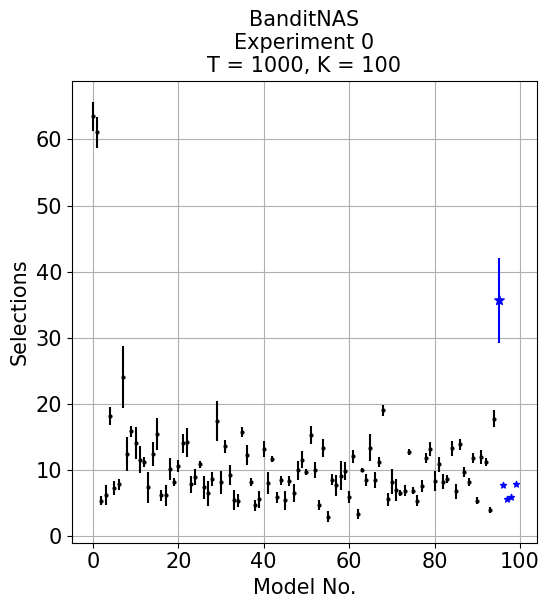

In [ ]:
input_string = '''100%|██████████| 10/10 [00:01<00:00,  6.76it/s]BanditNAS

[63.5 61.1  5.4  6.3 18.2  7.3  7.9 24.1 12.5 15.9 14.1 11.6 11.3  7.4
 12.5 15.5  6.2  6.2 10.2  8.2 10.6 14.1 14.2  7.9  9.  10.9  7.4  6.5
  8.7 17.5  8.2 13.6  9.3  5.5  5.4 15.8 12.3  8.2  4.7  5.6 13.2  8.1
 11.7  5.9  8.5  5.5  8.4  6.5 10.  11.6  9.7 15.4 10.1  4.8 13.4  3.
  8.6  7.7  9.2  9.9  6.  12.1  3.4 10.1  8.5 13.4  8.5 11.3 19.1  5.6
  8.3  7.   6.6  6.9 12.7  6.9  5.4  7.6 11.8 13.2  8.4 10.9  8.3  8.7
 13.3  6.8 13.9  9.8  8.2 11.8  5.4 12.  11.2  4.  17.8 35.7  7.8  5.6
  6.   8. ]

[2.20227155 2.3430749  0.66332496 1.48660687 1.32664992 1.00498756
 0.83066239 4.63573079 2.53968502 0.83066239 2.38537209 2.00997512
 0.78102497 2.28910463 1.80277564 2.37697286 0.87177979 1.6
 1.6        0.6        0.91651514 1.44568323 2.18174242 1.3
 1.26491106 0.53851648 1.8        1.91049732 1.00498756 3.00832179
 1.72046505 1.0198039  1.55241747 1.5        1.0198039  0.74833148
 1.48660687 0.6        0.78102497 1.28062485 1.2489996  1.7
 0.45825757 0.83066239 0.67082039 1.43178211 0.8        1.36014705
 1.41421356 1.28062485 0.45825757 1.356466   1.22065556 0.74833148
 1.356466   0.77459667 0.8        1.55241747 2.22710575 1.3
 0.89442719 0.94339811 0.8        0.3        0.92195445 2.00997512
 1.20415946 0.78102497 0.83066239 1.0198039  1.9        1.61245155
 0.48989795 0.83066239 0.45825757 0.53851648 0.8        0.91651514
 0.74833148 1.07703296 1.56204994 1.13578167 1.18743421 0.64031242
 1.18743421 1.16619038 0.83066239 0.74833148 0.6        0.74833148
 0.48989795 1.         0.6        0.4472136  1.2489996  6.40390506
 0.9797959  0.48989795 0.         0.        ]
T = 1000, K = 100, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 53.388 times more often than sub-optimal models on average


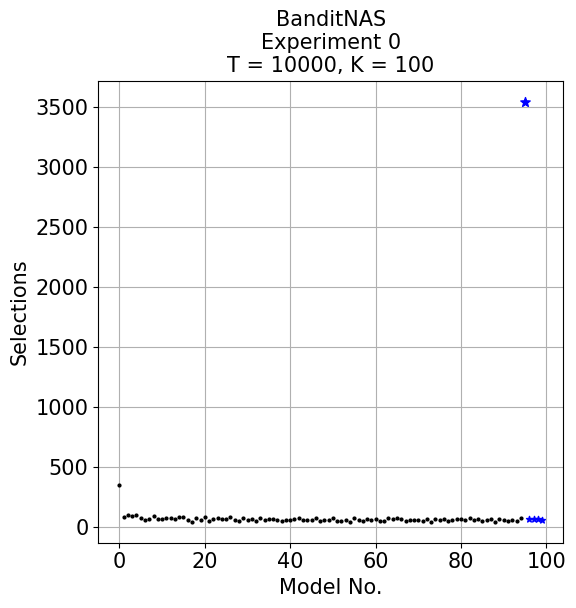

In [ ]:
input_string = '''100%|██████████| 10/10 [00:10<00:00,  1.06s/it]BanditNAS

[ 350.    80.9   96.6   95.2  100.5   71.    55.4   69.3   88.6   67.1
   67.    71.4   75.5   65.2   83.5   80.    59.6   45.5   73.3   58.1
   79.2   47.7   64.    73.1   62.6   63.3   80.    61.6   48.1   75.
   59.    64.8   53.6   70.9   54.5   65.2   65.1   58.8   53.7   56.
   56.1   68.9   76.5   60.5   57.7   59.8   70.9   47.4   58.5   57.9
   71.1   51.5   46.1   55.4   45.4   76.1   54.1   53.4   69.6   60.3
   64.    51.7   48.9   71.3   64.9   73.1   64.1   52.5   59.6   55.
   57.5   46.    65.    44.2   62.4   56.    66.8   50.5   62.1   68.9
   68.1   56.3   76.9   58.3   67.5   50.1   61.8   65.6   45.    68.5
   59.6   49.    60.6   51.5   72.9 3542.3   70.4   63.    67.    54. ]

[0.         0.3        1.74355958 1.93907194 0.80622577 0.77459667
 1.11355287 0.45825757 1.56204994 1.7        1.73205081 1.28062485
 0.92195445 1.2489996  1.56524758 1.73205081 0.48989795 0.92195445
 0.45825757 0.3        0.6        0.45825757 1.         0.7
 0.8        0.9        0.4472136  0.66332496 0.94339811 0.89442719
 0.89442719 0.4        1.68522995 1.5132746  0.5        0.87177979
 1.3        0.4        0.78102497 0.77459667 1.04403065 0.7
 0.67082039 1.02469508 0.64031242 0.4        0.83066239 0.91651514
 2.10950231 2.3        1.64012195 0.5        0.3        0.66332496
 0.66332496 0.7        0.3        0.48989795 0.48989795 0.64031242
 0.77459667 1.26885775 0.94339811 0.45825757 0.7        0.7
 1.04403065 0.92195445 0.8        0.4472136  0.67082039 0.4472136
 0.4472136  0.4        0.66332496 0.89442719 0.74833148 1.02469508
 1.37477271 0.3        0.3        1.73493516 0.83066239 0.9
 1.02469508 0.3        0.74833148 0.91651514 0.4472136  0.5
 0.48989795 0.63245553 0.8        0.92195445 1.5132746  2.60959767
 0.48989795 0.         0.         0.        ]
T = 10000, K = 100, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 51.332 times more often than sub-optimal models on average


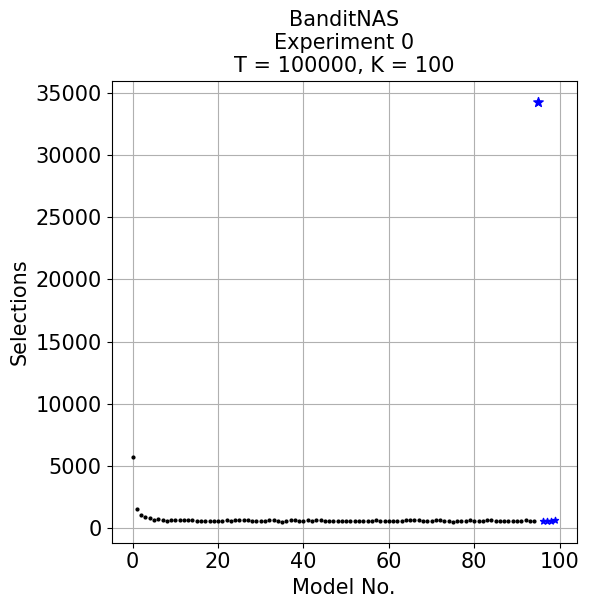

In [ ]:
input_string = '''100%|██████████| 10/10 [01:18<00:00,  7.86s/it]BanditNAS

[ 5712.8  1534.3  1039.8   918.2   821.6   651.1   702.2   638.5   601.7
   665.4   667.4   617.4   641.8   605.9   639.6   591.8   599.5   586.9
   597.3   560.8   556.6   539.3   675.5   588.8   613.5   632.3   644.7
   614.5   592.9   574.4   559.    583.7   644.6   676.9   567.3   506.4
   549.8   626.7   605.8   590.2   567.3   627.    567.4   624.9   615.
   602.7   589.3   586.7   526.5   591.3   584.1   576.6   595.6   522.6
   559.3   568.3   562.7   605.1   555.6   570.8   590.1   586.    539.9
   555.5   618.6   656.4   660.4   627.    573.    583.4   549.3   609.4
   633.3   576.1   585.3   520.9   564.4   553.8   534.5   623.2   587.3
   575.6   563.6   622.6   605.4   595.    540.9   564.    587.8   568.5
   565.    571.1   622.1   594.3   594.  34275.6   563.2   590.8   602.
   635. ]

[20.17820606  3.1         3.42928564  2.03960781  3.41174442  4.18210473
  2.52190404  4.47772264  7.25327512  2.45764115  4.88262225  3.7469988
  3.15594677  5.26212885  2.83548938  2.78567766  5.12347538  3.3
  2.96816442  4.23792402  0.66332496  2.64764046  3.23264598  3.45832329
  4.9244289   2.00249844  4.83838816  4.54422711  2.11896201  1.2
  3.25576412  3.95094925  2.2         3.44818793  2.57099203  1.9078784
  2.89136646  3.40734501  0.74833148  2.52190404  5.53263048  3.16227766
  3.13687743  1.37477271  3.76828874  3.0016662   3.66196668  2.23830293
  4.80104155  3.74299345  4.32319326  5.85149554  3.00665928  3.69323706
  6.22976725  4.02616443  4.60543158  7.14772691  1.356466    2.31516738
  5.31883446  3.84707681  2.38537209  2.57875939  3.87814389  2.10713075
  2.61533937  1.09544512  2.89827535  4.2708313   1.1         4.31740663
  1.95192213  2.07123152  2.83019434  3.38969025  5.35163526  2.44131112
  1.74642492  3.21869539  4.56179789  4.29418211  2.8         2.41660919
  2.83548938  4.87852437  2.3430749   2.44948974  3.42928564  1.5
  1.34164079  2.73678644  3.01496269  4.5177428   7.70713955 30.53260552
  1.16619038  0.4         0.          0.        ]
T = 100000, K = 100, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 45.070 times more often than sub-optimal models on average


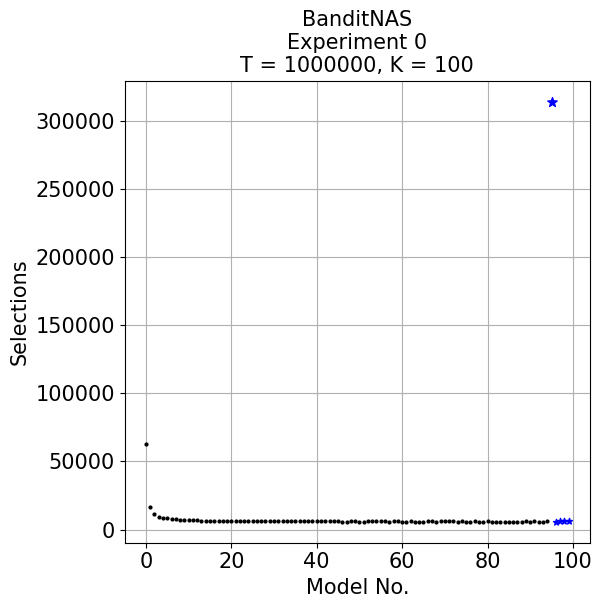

In [ ]:
input_string = '''100%|██████████| 10/10 [12:49<00:00, 76.91s/it]BanditNAS

[ 62793.   16837.9  11364.5   9462.    8753.4   8184.    7888.5   7442.4
   7012.3   6979.    6882.5   6672.1   6732.8   6398.6   6572.5   6542.4
   6630.3   6415.7   6269.1   6408.5   6211.2   6140.3   6129.6   6196.6
   5950.5   6272.    5973.7   6096.9   6220.7   6150.3   6237.2   6229.6
   5937.5   6092.6   6171.4   6325.    6090.1   6184.3   5953.2   6003.9
   6106.3   6077.6   6104.7   6229.9   6003.8   6242.    5857.3   5886.5
   5933.3   6069.3   5754.3   5864.5   5958.5   6097.9   6233.2   6034.7
   5981.    5903.8   6051.    5983.4   5845.1   5814.5   5940.1   5772.9
   5874.2   5875.8   6167.4   6052.6   5888.8   6081.2   6014.    5934.9
   6162.1   5907.2   6204.8   5891.5   5887.6   5969.4   5873.9   5744.7
   6014.5   5874.8   5745.5   5846.    5768.6   5833.9   5874.6   5868.8
   5801.7   5985.8   5808.3   6019.8   5837.2   5769.8   6017.  314140.5
   5900.4   5950.    6032.    5927. ]

[0.         0.3        2.06155281 1.67332005 3.26190129 0.89442719
 0.5        1.28062485 1.18743421 0.89442719 1.5        2.38537209
 1.07703296 1.0198039  0.80622577 1.68522995 1.3453624  0.78102497
 0.53851648 0.92195445 0.4        0.45825757 2.24499443 2.10713075
 0.80622577 1.94935887 1.9        0.53851648 0.9        1.1
 1.16619038 2.61533937 2.10950231 0.66332496 0.91651514 1.8973666
 1.3        2.23830293 1.53622915 1.37477271 2.19317122 1.8
 1.61554944 1.37477271 0.74833148 0.         1.18743421 0.92195445
 1.84661853 2.28254244 0.45825757 0.80622577 0.67082039 0.3
 0.9797959  1.1        0.         0.4        0.         1.74355958
 1.22065556 0.92195445 0.3        0.3        0.4        0.6
 0.48989795 0.48989795 1.2489996  1.07703296 0.4472136  0.3
 0.3        0.4        0.4        1.5        1.42828569 0.66332496
 0.53851648 0.45825757 0.5        0.6        1.02469508 1.09544512
 0.91651514 1.13578167 0.48989795 0.4        1.79164729 2.13541565
 0.78102497 0.87177979 0.4        0.4        0.         2.87228132
 0.48989795 0.         0.         0.        ]
T = 1000000, K = 100, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 30.481 times more often than sub-optimal models on average


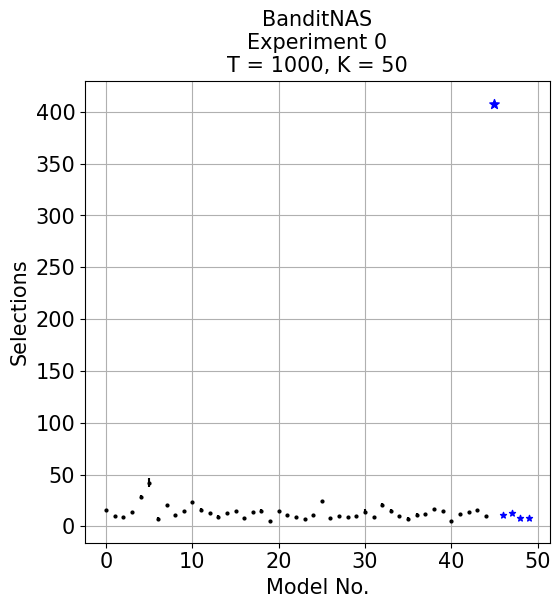

In [ ]:
input_string = '''100%|██████████| 10/10 [00:01<00:00,  8.42it/s]BanditNAS

[ 16.1   9.8   9.1  13.6  28.8  42.3   7.2  20.2  10.5  14.4  23.2  15.9
  12.9   9.5  12.6  14.6   8.1  14.3  15.1   5.4  14.6  10.6   8.7   7.5
  10.6  24.3   7.8   9.9   8.9   9.7  14.1   8.6  20.7  15.2  10.4   7.
  10.8  11.6  16.4  14.5   5.5  12.1  13.6  15.5   9.7 407.7  11.   13.2
   8.2   8. ]

[0.53851648 0.4        0.3        0.66332496 1.4        4.47325385
 1.66132477 0.74833148 1.85741756 1.28062485 0.74833148 1.81383571
 0.94339811 1.6881943  1.2        1.11355287 0.7        0.64031242
 1.22065556 0.91651514 1.2        1.2        0.64031242 0.80622577
 0.8        1.00498756 0.6        0.83066239 1.37477271 0.9
 2.25610283 1.42828569 1.73493516 1.16619038 0.48989795 2.23606798
 1.72046505 1.0198039  1.68522995 1.6881943  0.80622577 0.7
 0.91651514 1.02469508 1.18743421 2.1        0.         0.4
 0.74833148 0.        ]
T = 1000, K = 50, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 28.834 times more often than sub-optimal models on average


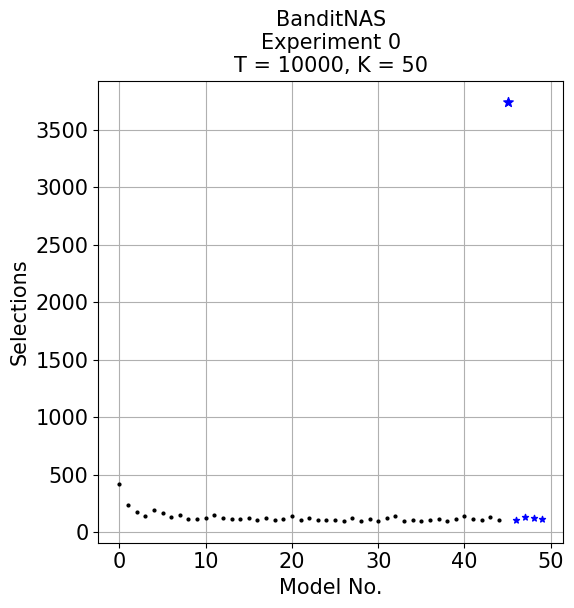

In [ ]:
input_string = '''100%|██████████| 10/10 [00:10<00:00,  1.07s/it]BanditNAS

[ 415.   238.1  175.9  138.5  190.4  164.3  133.3  153.7  111.9  111.
  125.2  153.4  119.3  118.3  114.6  119.5  106.   122.7  105.9  112.1
  136.9  108.   127.6  101.8  107.3  105.5  100.3  126.5   95.4  117.7
   93.4  125.1  137.2   96.7  102.7   94.2  107.7  118.3  100.7  114.9
  137.8  110.9  107.4  129.6  103.4 3739.5  103.2  132.8  123.4  115. ]

[2.68328157 1.22065556 2.07123152 2.83725219 0.8        4.75499737
 1.9        2.1        1.3        1.78885438 0.74833148 2.65329983
 1.3453624  1.9        2.45764115 1.62788206 4.2661458  1.48660687
 2.25610283 4.32319326 0.83066239 2.64575131 1.0198039  1.2489996
 1.3453624  1.91049732 1.9        0.80622577 0.8        1.1
 2.45764115 2.38537209 0.6        1.79164729 3.43656806 2.27156334
 2.68514432 1.00498756 0.64031242 1.22065556 0.74833148 2.25610283
 5.57135531 4.82078832 0.8        4.5        0.74833148 0.74833148
 0.48989795 0.        ]
T = 10000, K = 50, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 19.704 times more often than sub-optimal models on average


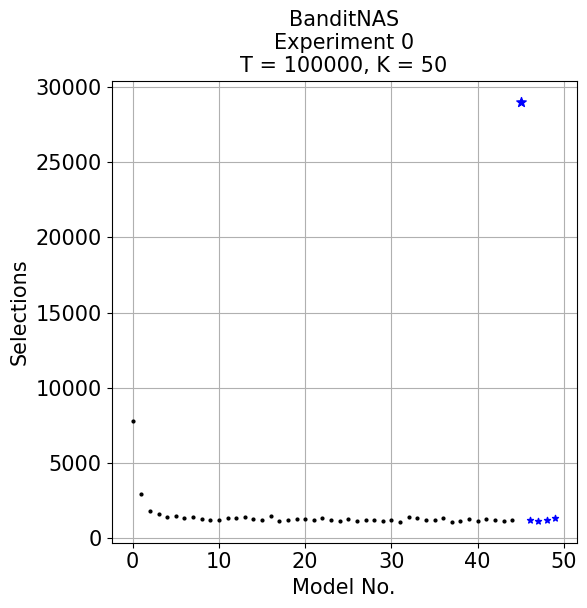

In [ ]:
input_string = '''100%|██████████| 10/10 [01:15<00:00,  7.58s/it]BanditNAS

[ 7802.   2923.7  1805.7  1631.5  1438.1  1508.1  1355.7  1406.7  1296.7
  1230.9  1188.2  1373.   1327.5  1408.5  1254.2  1208.2  1459.5  1132.9
  1251.5  1307.2  1291.6  1236.9  1342.7  1246.8  1182.7  1254.1  1165.6
  1192.3  1238.8  1164.9  1244.6  1109.4  1390.   1371.   1225.2  1198.5
  1324.1  1114.1  1177.4  1262.1  1182.8  1282.2  1237.8  1164.3  1233.9
 28962.8  1249.6  1178.6  1196.   1319.4]

[32.49615362  3.40734501  8.17373843  0.92195445  9.01609672 11.64001718
  2.23830293  4.47325385  4.45084262  5.1273775   5.15363949  5.69209979
  3.87943295  6.11964051  4.48998886  3.78945906  4.90407993  2.84429253
  4.75920161  3.24961536  2.83548938  1.5132746   4.73392015  9.08625335
  1.67630546  4.01123422  2.45764115  1.73493516  3.76297754  4.13400532
  4.1761226   4.12795349  2.48997992  3.97492138  2.13541565  1.6881943
  2.25610283  2.73678644  3.85227206  3.91024296  4.8948953   3.34065862
  5.49181209  1.26885775  3.23882695 50.04557923  1.68522995  0.48989795
  1.09544512  0.66332496]
T = 100000, K = 50, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 15.316 times more often than sub-optimal models on average


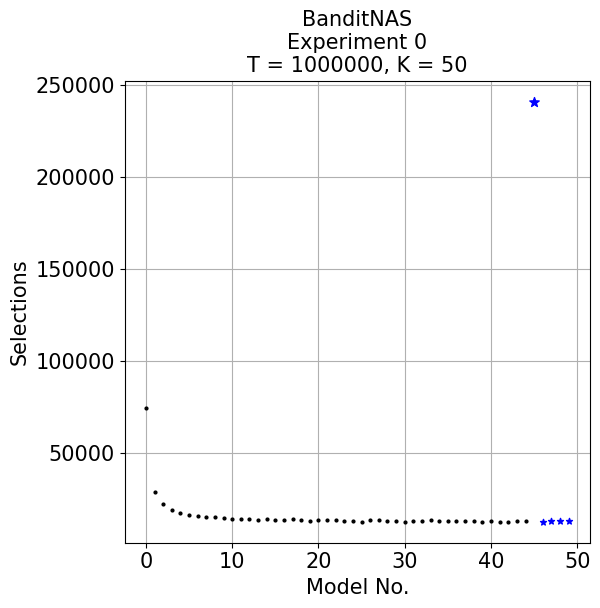

In [ ]:
input_string = '''100%|██████████| 10/10 [12:05<00:00, 72.53s/it]BanditNAS

[ 74223.4  28765.9  22455.2  19030.   17330.9  16397.5  15717.7  15418.7
  15368.5  14593.1  14080.7  14143.   14024.5  13694.8  14147.   13768.1
  13544.   14232.8  13646.4  13341.   13650.9  13917.9  13687.2  13020.8
  13329.6  12810.4  13402.   13688.1  13120.6  13307.   12827.3  12974.9
  12883.8  13592.   13170.2  13106.5  13338.7  13297.5  13029.   12762.6
  13145.   12784.8  12729.9  12930.7  12923.5 240744.5  12731.   13106.6
  12982.8  13131. ]

[4.52106182 6.75943785 8.76127845 3.09838668 1.13578167 2.65518361
 5.27351875 4.29068759 3.10644491 1.75783958 0.78102497 1.18321596
 0.67082039 2.56124969 2.79284801 1.3        1.26491106 1.83303028
 1.42828569 1.18321596 1.5132746  1.86815417 1.77763888 1.93907194
 2.2        1.62480768 0.77459667 1.13578167 0.66332496 1.78885438
 1.95192213 0.53851648 0.9797959  3.09838668 1.98997487 1.56524758
 0.78102497 2.97489496 2.64575131 2.65329983 3.31662479 2.18174242
 1.57797338 1.9        2.10950231 4.65295605 0.         0.48989795
 0.9797959  0.        ]
T = 1000000, K = 50, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 4.084 times more often than sub-optimal models on average


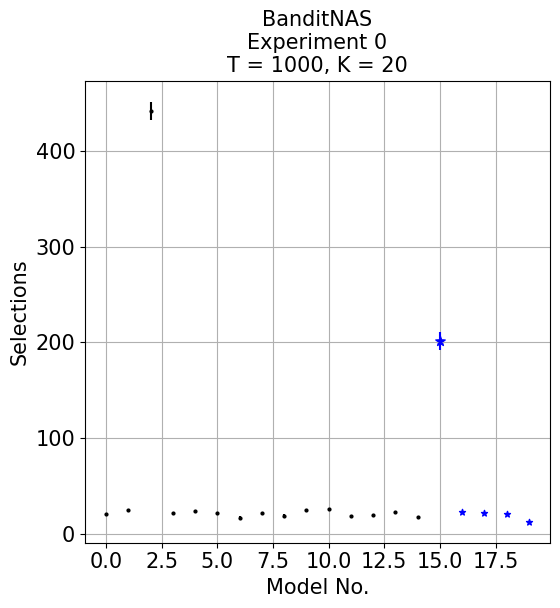

In [ ]:
input_string = '''100%|██████████| 10/10 [00:01<00:00,  8.02it/s]BanditNAS

[ 20.5  24.8 441.7  21.8  23.4  21.6  17.1  21.5  18.7  24.8  25.9  18.8
  19.5  22.6  17.8 201.6  22.4  22.1  20.7  12.7]

[0.67082039 0.74833148 9.71648084 1.32664992 1.28062485 0.66332496
 1.3        1.80277564 2.41039416 1.16619038 1.04403065 0.6
 0.67082039 0.66332496 0.6        9.06862724 1.2        1.5132746
 0.45825757 0.45825757]
T = 1000, K = 20, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 1.255 times more often than sub-optimal models on average


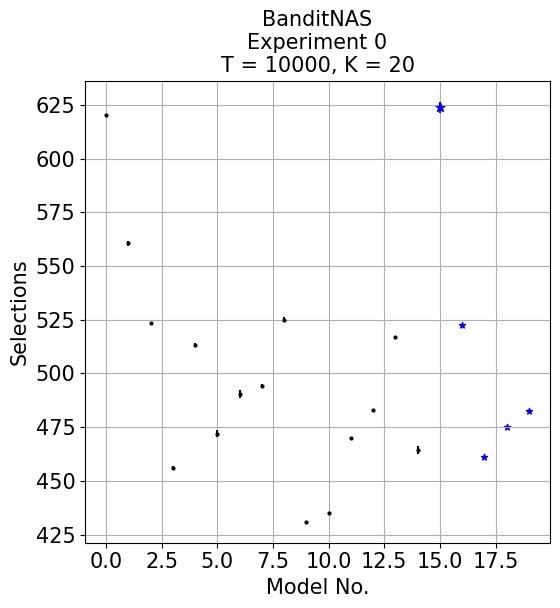

In [ ]:
input_string = '''100%|██████████| 10/10 [00:10<00:00,  1.05s/it]BanditNAS

[620.4 560.5 523.3 455.9 513.1 471.9 490.5 494.  525.1 431.  435.  469.9
 483.  516.9 464.5 623.9 522.5 461.1 475.1 482.4]

[0.48989795 1.02469508 0.78102497 0.83066239 0.94339811 1.57797338
 1.91049732 1.         1.13578167 0.         0.         0.53851648
 0.         0.3        1.85741756 2.54754784 0.5        1.37477271
 1.22065556 0.48989795]
T = 10000, K = 20, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 3.040 times more often than sub-optimal models on average


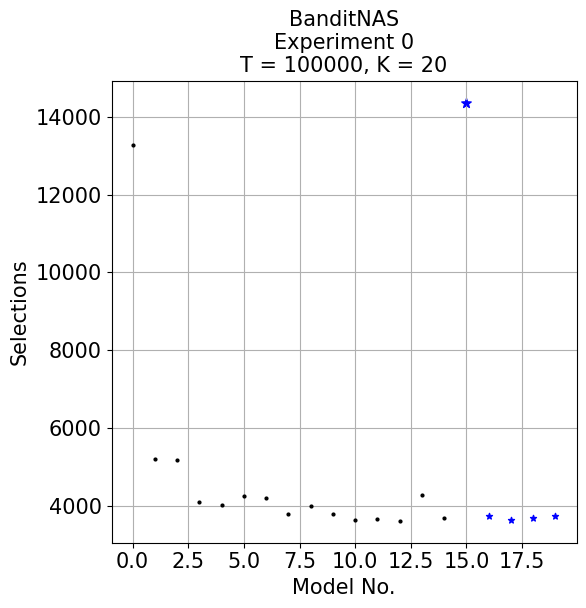

In [ ]:
input_string = '''100%|██████████| 10/10 [01:17<00:00,  7.73s/it]BanditNAS

[13282.2  5224.2  5191.9  4104.2  4040.3  4253.3  4212.2  3800.2  3995.2
  3804.6  3639.3  3681.7  3608.2  4285.4  3709.8 14355.3  3745.5  3653.2
  3694.   3739.3]

[12.32720568  5.61782876  6.71490879  8.66948672  6.37259759  6.27773845
  5.32541078  2.44131112  5.58211429  5.85149554 10.79861102  3.0016662
  5.96322061  2.93938769  3.65513338 28.13556468  0.67082039  0.9797959
  0.          0.45825757]
T = 100000, K = 20, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 3.684 times more often than sub-optimal models on average


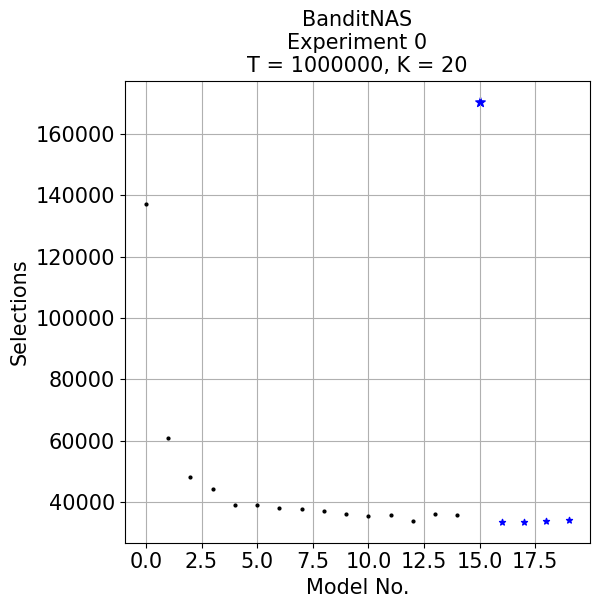

In [ ]:
input_string = '''100%|██████████| 10/10 [11:22<00:00, 68.28s/it]BanditNAS

[137097.4  60871.7  48024.9  44278.6  38962.9  39073.1  38198.3  37780.6
  37196.9  35978.2  35331.3  35750.2  33691.3  36066.5  35896.1 170491.2
  33629.4  33593.   33988.   34120.4]

[5.71314274 3.1638584  1.22065556 8.81135631 8.04300939 4.54862617
 2.45153013 4.43170396 2.42693222 2.18174242 0.9        2.48193473
 1.73493516 4.56618002 5.53985559 1.88679623 2.61533937 3.25576412
 0.         0.48989795]
T = 1000000, K = 20, Experiment: 0
'''

PlotSelections(input_string)

Optimal model recommended 1.165 times more often than sub-optimal models on average


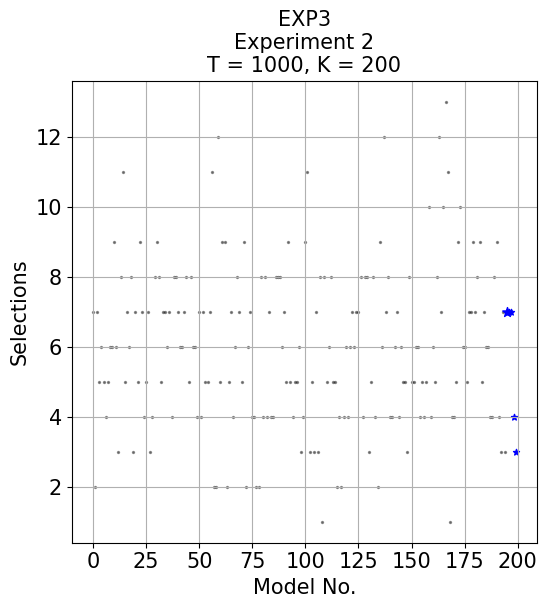

Optimal model recommended 1.001 times more often than sub-optimal models on average


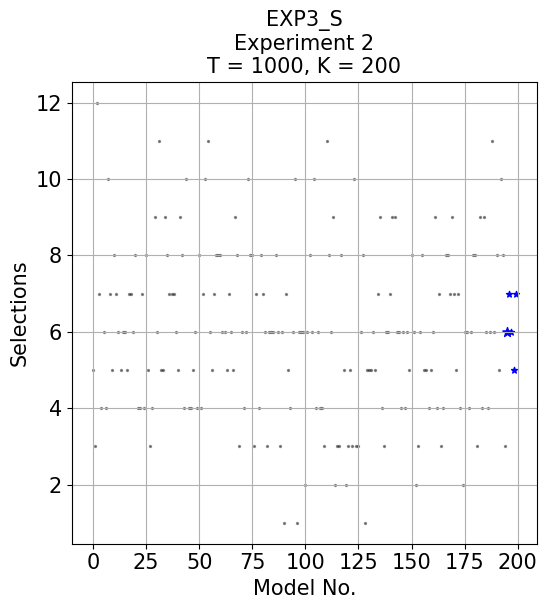

Optimal model recommended 1.501 times more often than sub-optimal models on average


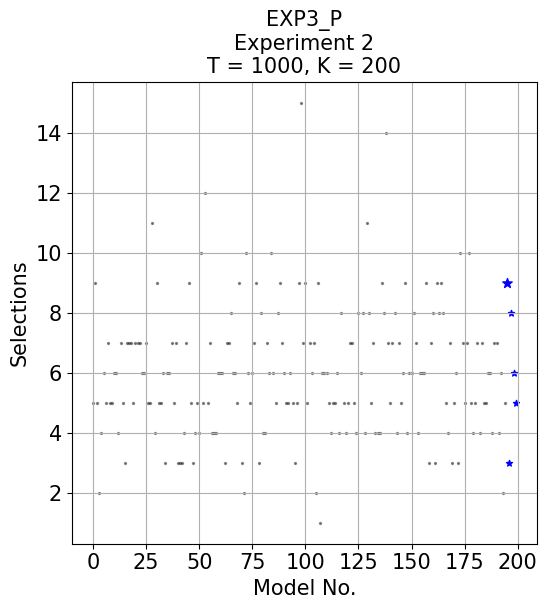

Optimal model recommended 1.003 times more often than sub-optimal models on average


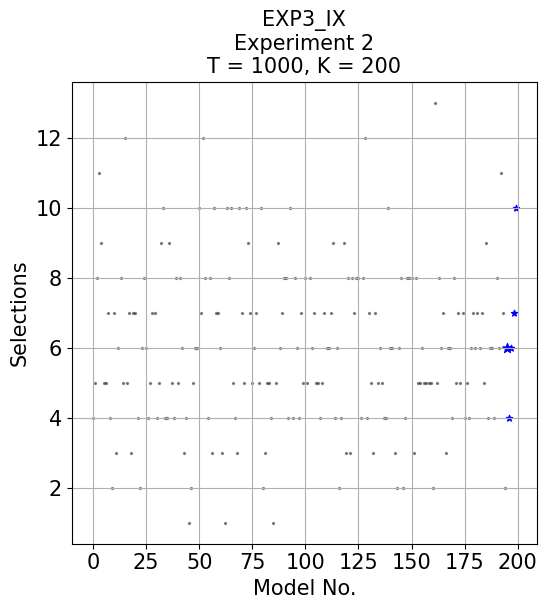

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5833%
Pulls: [ 7.  2.  7.  5.  6.  5.  4.  5.  6.  6.  9.  6.  3.  8. 11.  5.  7.  6.
  8.  3.  7.  5.  9.  7.  4.  5.  7.  3.  4.  8.  9.  8.  5.  7.  7.  6.
  7.  4.  8.  8.  7.  6.  6.  7.  8.  5.  8.  6.  6.  4.  7.  4.  7.  5.
  5.  7. 11.  2.  2. 12.  5.  9.  9.  2.  5.  7.  4.  6.  8.  7.  5.  9.
  2.  6.  7.  4.  4.  2.  2.  8.  4.  8.  4.  7.  4.  4.  8.  8.  8.  6.
  7.  5.  9.  5.  4.  5.  5.  6.  3.  4.  9. 11.  3.  5.  3.  7.  3.  8.
  1.  8.  5.  6.  8.  5.  5.  2.  4.  2.  4.  6.  4.  6.  7.  6.  7.  7.
  8.  4.  8.  8.  3.  5.  8.  4.  2.  9.  6. 12.  7.  8.  4.  4.  6.  7.
  4.  6.  5.  5.  3.  8.  5.  5.  6.  6.  4.  5.  4.  5. 10.  4.  6.  5.
  8. 12.  7. 10. 13. 11.  1.  4.  4.  5.  9. 10.  6.  6.  5.  7.  7.  9.
  7.  8.  9.  5.  7.  6.  6.  4.  4.  8.  9.  4.  3.  7.  3.  7.  7.  7.
  4.  3.]
Time: 0.1788s

EXP3_S
Optimal Pulls: 0.5000%
Pulls: [ 5.  3. 12.  7.  4.  6.  4. 10.  7.  5.  8.  7.  6.  5.  6.  6.  5.  7.
  7.  6.  8.  4.  4.  7.  4.  8.  5.  3.  4.  9.  6. 11.  5.  5.  9.  8.
  7.  7.  7.  6.  5.  9.  8.  4. 10.  4.  4.  5.  6.  4.  8.  4.  7. 10.
 11.  6.  5.  7.  8.  8.  8.  6.  6.  5.  7.  6.  5.  9.  8.  3.  6.  4.
  6. 10.  8.  8.  3.  7.  4.  8.  7.  6.  3.  6.  6.  6.  8.  6.  3.  6.
  1.  7.  5.  4.  6. 10.  1.  6.  6.  6.  2.  6.  8.  6. 10.  4.  6.  4.
  4.  3. 11.  8.  6.  9.  2.  3.  3.  8.  5.  2.  3.  5.  3. 10.  3.  3.
  6.  8.  1.  5.  5.  5.  6.  5.  7.  9.  4.  3.  6.  6.  7.  9.  9.  6.
  6.  4.  6.  4.  6.  5.  8.  6.  2.  3.  6.  8.  5.  5.  4.  5.  6.  9.
  4.  7.  3.  4.  8.  8.  7.  9.  7.  5.  7.  4.  2.  6.  6.  4.  6.  8.
  8.  3.  9.  4.  9.  6.  4.  6. 11.  6.  8.  5. 10.  8.  3.  6.  7.  6.
  5.  7.]
Time: 0.1023s

EXP3_P
Optimal Pulls: 0.7500%
Pulls: [ 5.  9.  5.  2.  4.  6.  5.  7.  5.  5.  6.  6.  4.  7.  5.  3.  7.  7.
  7.  5.  7.  7.  7.  6.  6.  7.  5.  5. 11.  4.  9.  5.  5.  6.  3.  6.
  6.  7.  5.  7.  3.  3.  3.  4.  7.  9.  5.  3.  4.  5.  4. 10.  5. 12.
  5.  7.  4.  4.  4.  6.  6.  6.  3.  7.  7.  8.  6.  6.  5.  9.  3.  2.
 10.  6.  5.  6.  7.  9.  3.  8.  4.  4.  7.  6. 10.  6.  5.  8.  9.  7.
  6.  5.  5.  6.  5.  3.  5.  9. 15.  7.  9.  5.  7.  6.  7.  2.  9.  1.
  6.  6.  6.  5.  4.  5.  5.  6.  4.  8.  5.  4.  5.  7.  7.  5.  4.  8.
  6.  8.  4. 11.  8.  5.  7.  4.  4.  4.  9.  8. 14.  7.  5.  7.  8.  4.
  7.  5.  6.  9.  4.  6.  6.  8.  7.  4.  6.  6.  6.  9.  3.  7.  8.  3.
  9.  8.  9.  8.  5.  4.  7.  3.  5.  6.  3. 10.  7.  5.  7. 10.  5.  4.
  5.  7.  4.  7.  5.  5.  6.  6.  4.  7.  7.  4.  6.  2.  5.  9.  3.  8.
  6.  5.]
Time: 0.1333s

EXP3_IX
Optimal Pulls: 0.5000%
Pulls: [ 4.  5.  8. 11.  9.  5.  5.  7.  4.  2.  7.  3.  6.  8.  5. 12.  5.  7.
  3.  7.  7.  4.  2.  6.  8.  6.  4.  5.  7.  7.  4.  5.  9. 10.  4.  4.
  9.  5.  4.  8.  5.  8.  6.  3.  4.  1.  2.  5.  6.  6. 10.  7. 12.  8.
  4.  8.  3. 10.  7.  7.  6.  3.  1. 10.  8. 10.  5.  4.  3. 10.  7.  5.
 10.  9.  7.  5.  6.  7.  5. 10.  2.  3.  5.  5.  4.  1.  5.  9.  6.  7.
  8.  8.  4. 10.  4.  8.  6.  4.  7.  5.  8.  5.  8.  6.  7.  5.  5.  4.
  5.  7.  6.  6.  7.  9.  4.  6.  2.  4.  9.  3.  8.  3.  8.  7.  8.  8.
  4.  8. 12.  4.  7.  5.  3.  7.  5.  6.  5.  4.  4. 10.  6.  6.  3.  2.
  6.  8.  2.  4.  8.  8.  8.  3.  8.  5.  5.  6.  5.  5.  5.  5.  2. 13.
  5.  8.  6.  7.  3.  6.  6.  4.  8.  5.  7.  5.  7.  4.  5.  4.  6.  7.
  6.  7.  6.  7.  5.  9.  4.  6.  6.  4.  8.  6. 11.  7.  2.  6.  4.  6.
  7. 10.]
Time: 0.1138s

T = 1000, K = 200, Experiment: 2'''

#ALGORITHMS = ['BanditNAS'] + ALGOS[1:]
EXP_ALGOS = ALGOS[2:]
pulls = extract_float_lists(input_string)
#K = len(pulls[1])
for i in range(len(EXP_ALGOS)):

    DATA = np.array(pulls[i])
    K_string = re.search(r"K\s*=\s*(\d+)", input_string).group(1)
    T_string = re.search(r"T\s*=\s*(\d+)", input_string).group(1)
    Exp_string = re.search(r"Experiment\s*:\s*(\d+)", input_string).group(1)
    #Algo_string = [a for a in ALGORITHMS if a in input_string][0]
    print(f'Optimal model recommended {DATA[K - 5] / DATA[: K - 5].mean():.3f} times more often than sub-optimal models on average')
    plt.figure(figsize=(6,6))
    plt.scatter(np.arange(K), pulls[i], color='black', alpha=0.4, s=2)
    plt.scatter(K - 5, pulls[i][K - 5], color='blue', marker='*', s=50)
    plt.scatter(np.arange(K - 5, K), pulls[i][K - 5 :], color='blue', marker='*', s=20)

    #plt.errorbar(np.arange(K - 5), pulls[1][: K - 5], yerr=pulls[2][: K - 5], color='black', fmt='o', markersize=2)
    #plt.errorbar(K - 5, pulls[1][K - 5], yerr=pulls[2][K - 5], color='blue', fmt='*', markersize=5)

    plt.xlabel('Model No.', fontsize=FONTSIZE)
    plt.ylabel('Selections', fontsize=FONTSIZE)
    plt.xticks(fontsize=FONTSIZE)
    plt.yticks(fontsize=FONTSIZE)
    plt.grid()
    plt.title(f'{EXP_ALGOS[i]}\nExperiment {Exp_string}\nT = {T_string}, K = {K_string}', fontsize=FONTSIZE)
    plt.show()

Optimal model recommended 0.919 times more often than sub-optimal models on average


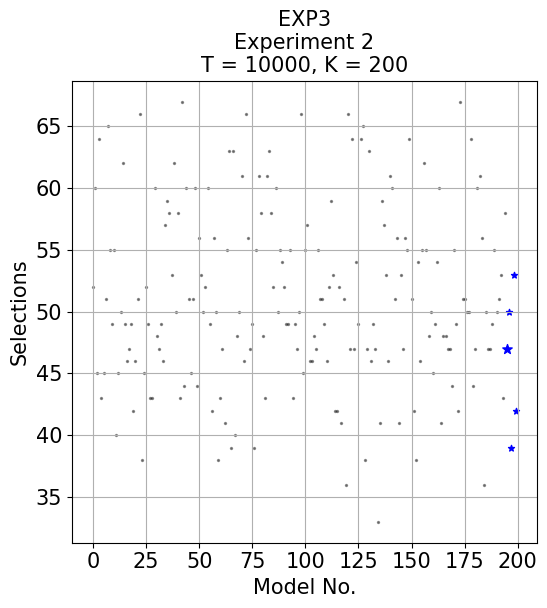

Optimal model recommended 1.063 times more often than sub-optimal models on average


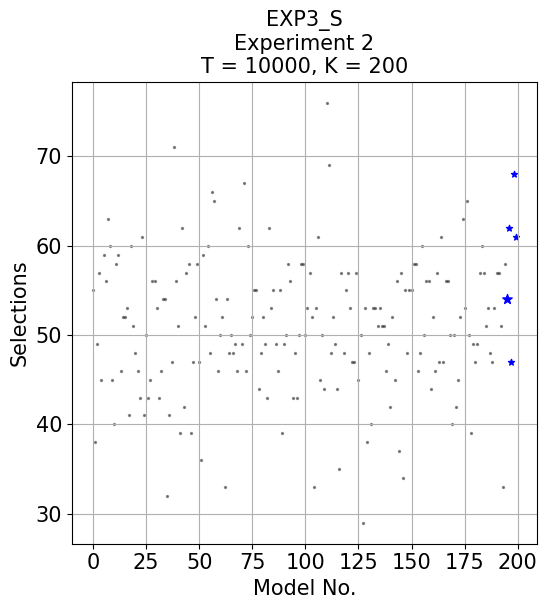

Optimal model recommended 1.017 times more often than sub-optimal models on average


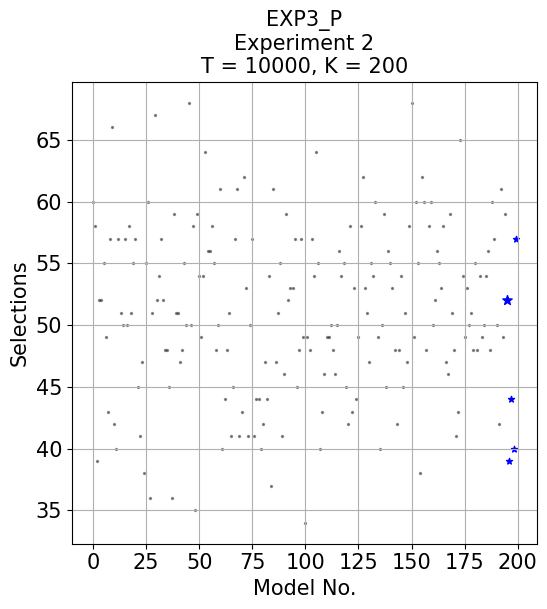

Optimal model recommended 1.000 times more often than sub-optimal models on average


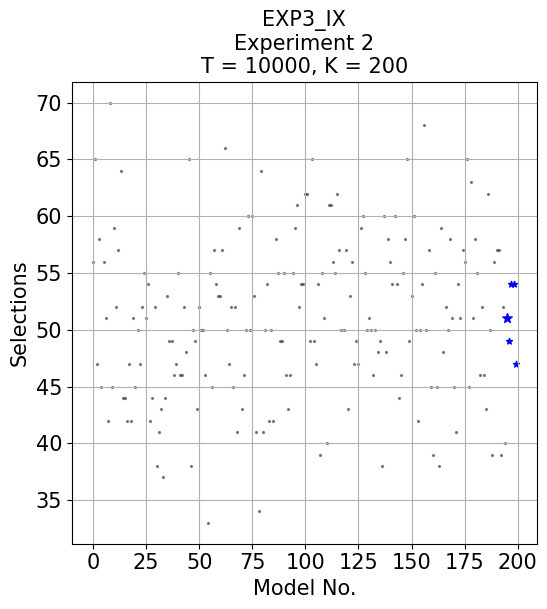

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.4608%
Pulls: [52. 60. 45. 64. 43. 45. 51. 65. 55. 49. 55. 40. 45. 50. 62. 49. 46. 47.
 49. 42. 46. 51. 66. 38. 45. 52. 49. 43. 43. 60. 48. 47. 49. 46. 57. 59.
 58. 53. 62. 50. 58. 43. 67. 44. 60. 51. 45. 51. 60. 44. 56. 53. 50. 52.
 60. 49. 42. 56. 50. 38. 43. 47. 41. 55. 63. 39. 63. 40. 48. 50. 61. 46.
 66. 56. 47. 49. 39. 55. 61. 58. 48. 43. 61. 63. 58. 52. 60. 50. 55. 54.
 52. 49. 49. 55. 43. 49. 47. 50. 66. 45. 55. 57. 46. 46. 48. 47. 55. 51.
 51. 49. 46. 52. 59. 53. 42. 42. 52. 41. 51. 36. 66. 47. 64. 47. 54. 49.
 64. 65. 38. 47. 63. 46. 49. 47. 33. 41. 59. 57. 53. 46. 61. 60. 51. 56.
 41. 53. 47. 56. 55. 64. 51. 42. 38. 54. 46. 55. 62. 55. 48. 50. 45. 49.
 54. 60. 41. 48. 48. 47. 47. 44. 55. 49. 42. 67. 51. 51. 50. 50. 64. 44.
 47. 60. 61. 56. 36. 50. 47. 47. 49. 55. 50. 51. 53. 43. 58. 47. 50. 39.
 53. 42.]
Time: 1.7721s

EXP3_S
Optimal Pulls: 0.5294%
Pulls: [55. 38. 49. 57. 45. 59. 56. 63. 60. 45. 40. 58. 59. 46. 52. 52. 53. 41.
 60. 51. 48. 46. 43. 61. 41. 50. 43. 45. 56. 56. 53. 43. 46. 54. 54. 32.
 41. 47. 71. 56. 51. 39. 62. 42. 57. 58. 39. 47. 52. 58. 47. 36. 59. 51.
 60. 48. 66. 65. 54. 46. 50. 52. 33. 54. 48. 50. 48. 49. 46. 62. 49. 67.
 46. 60. 50. 52. 55. 55. 44. 48. 52. 49. 43. 62. 53. 55. 49. 46. 55. 39.
 49. 50. 58. 56. 43. 48. 43. 50. 58. 58. 50. 53. 57. 52. 33. 53. 61. 45.
 50. 44. 76. 69. 48. 52. 49. 44. 35. 57. 48. 55. 57. 53. 47. 47. 57. 45.
 50. 29. 53. 38. 48. 40. 53. 53. 51. 53. 51. 51. 46. 49. 42. 52. 45. 56.
 37. 57. 34. 55. 48. 55. 55. 58. 58. 46. 48. 60. 50. 56. 56. 44. 52. 46.
 57. 47. 61. 47. 56. 56. 50. 40. 50. 42. 45. 52. 63. 53. 65. 50. 39. 49.
 47. 49. 57. 60. 57. 51. 53. 48. 47. 53. 57. 57. 51. 33. 58. 54. 62. 47.
 68. 61.]
Time: 1.0861s

EXP3_P
Optimal Pulls: 0.5098%
Pulls: [60. 58. 39. 52. 52. 55. 49. 43. 57. 66. 42. 40. 57. 51. 50. 57. 50. 58.
 51. 55. 57. 45. 41. 47. 38. 55. 60. 36. 51. 67. 52. 54. 57. 52. 48. 48.
 45. 36. 59. 51. 51. 47. 48. 55. 50. 68. 50. 58. 35. 59. 54. 49. 54. 64.
 56. 56. 58. 55. 48. 50. 61. 40. 44. 48. 51. 41. 45. 57. 61. 41. 43. 62.
 53. 41. 50. 57. 41. 44. 44. 40. 42. 47. 44. 54. 37. 61. 47. 51. 55. 41.
 46. 59. 52. 53. 53. 57. 45. 48. 57. 49. 34. 49. 48. 57. 54. 64. 55. 40.
 43. 46. 49. 49. 50. 48. 46. 50. 56. 54. 55. 45. 42. 58. 43. 53. 44. 49.
 58. 62. 53. 51. 47. 55. 54. 60. 49. 40. 50. 59. 45. 56. 55. 53. 48. 42.
 48. 54. 45. 51. 47. 58. 68. 49. 60. 55. 38. 62. 60. 48. 58. 60. 50. 52.
 56. 55. 53. 58. 47. 46. 59. 51. 48. 41. 43. 65. 54. 49. 53. 50. 51. 48.
 55. 48. 54. 49. 50. 54. 56. 48. 60. 57. 50. 42. 61. 49. 59. 52. 39. 44.
 40. 57.]
Time: 0.9470s

EXP3_IX
Optimal Pulls: 0.5000%
Pulls: [56. 65. 47. 58. 45. 56. 51. 42. 70. 45. 59. 52. 57. 64. 44. 44. 42. 47.
 42. 51. 45. 50. 47. 52. 55. 51. 54. 42. 44. 52. 38. 41. 43. 37. 44. 53.
 49. 49. 46. 47. 55. 46. 46. 52. 48. 65. 38. 50. 49. 43. 52. 50. 50. 46.
 33. 55. 45. 57. 54. 53. 53. 57. 66. 50. 47. 52. 45. 52. 41. 59. 43. 46.
 50. 60. 50. 60. 53. 41. 34. 64. 41. 50. 54. 42. 50. 42. 58. 55. 49. 49.
 55. 46. 43. 46. 55. 59. 61. 52. 54. 54. 62. 62. 49. 65. 49. 47. 54. 39.
 55. 51. 40. 61. 61. 56. 55. 62. 57. 50. 50. 57. 43. 53. 56. 47. 49. 47.
 59. 60. 55. 50. 51. 50. 46. 50. 48. 49. 38. 60. 48. 58. 56. 54. 60. 54.
 44. 46. 55. 58. 65. 49. 53. 60. 50. 42. 50. 54. 68. 50. 57. 45. 39. 55.
 45. 38. 59. 48. 52. 50. 58. 51. 45. 41. 54. 51. 57. 56. 65. 45. 63. 51.
 58. 55. 46. 52. 46. 43. 62. 50. 39. 56. 57. 57. 39. 52. 40. 51. 49. 54.
 54. 47.]
Time: 0.7944s


T = 10000, K = 200, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.013 times more often than sub-optimal models on average


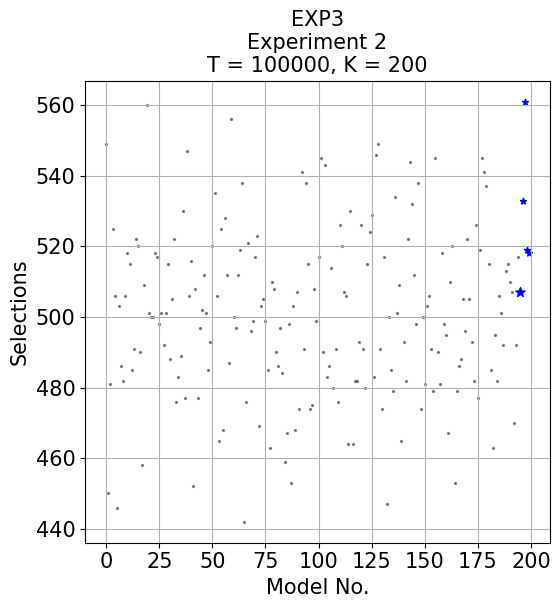

Optimal model recommended 1.034 times more often than sub-optimal models on average


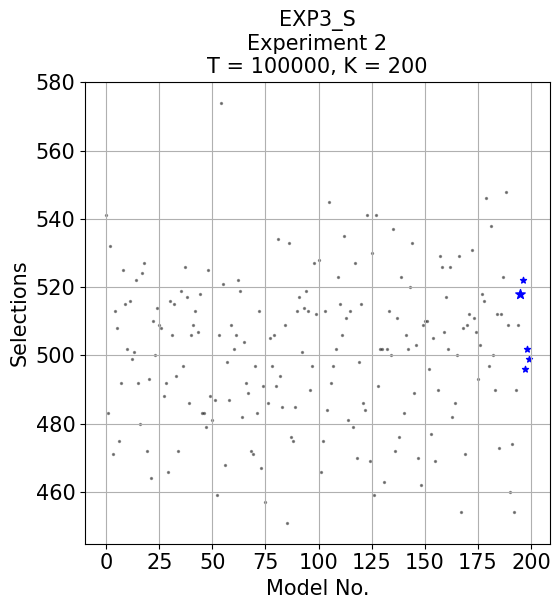

Optimal model recommended 0.968 times more often than sub-optimal models on average


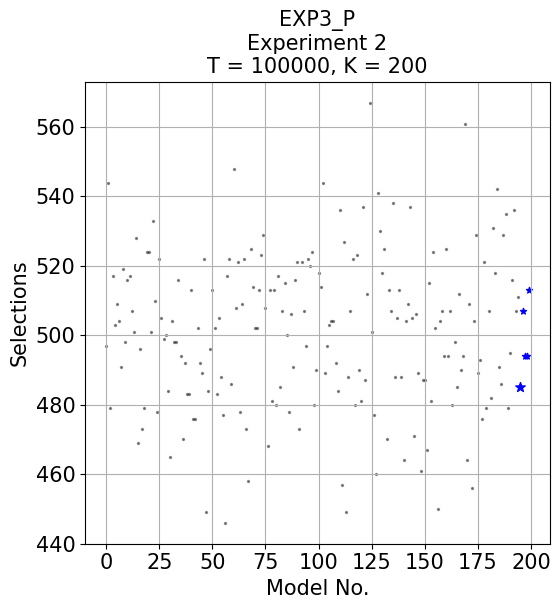

Optimal model recommended 1.056 times more often than sub-optimal models on average


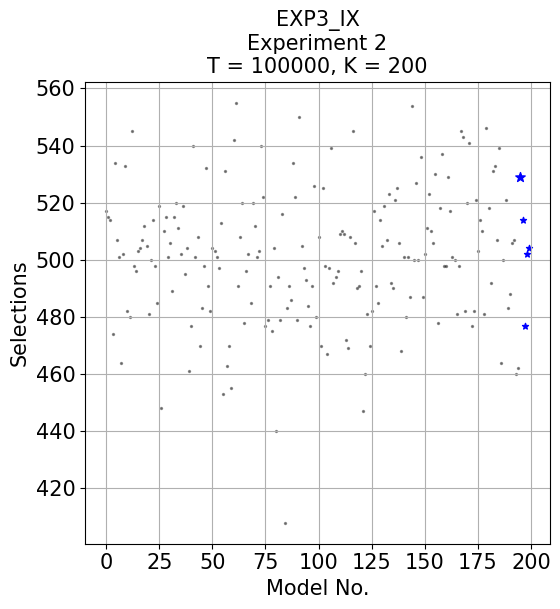

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5060%
Pulls: [549. 450. 481. 525. 506. 446. 503. 486. 482. 506. 518. 515. 485. 491.
 522. 520. 490. 458. 509. 560. 501. 500. 500. 518. 517. 498. 501. 492.
 501. 515. 488. 505. 522. 476. 483. 489. 530. 477. 547. 506. 516. 452.
 508. 477. 497. 502. 512. 501. 485. 493. 520. 535. 506. 465. 525. 468.
 528. 512. 487. 556. 500. 497. 512. 519. 538. 442. 476. 521. 496. 499.
 517. 523. 469. 503. 505. 499. 485. 463. 510. 508. 490. 486. 497. 484.
 459. 467. 498. 453. 503. 468. 507. 474. 541. 491. 538. 515. 474. 475.
 508. 499. 517. 545. 490. 543. 483. 486. 514. 480. 491. 476. 526. 520.
 507. 506. 464. 530. 464. 482. 482. 493. 526. 491. 480. 515. 524. 529.
 483. 546. 549. 491. 474. 517. 447. 500. 485. 479. 534. 501. 509. 465.
 493. 482. 522. 544. 532. 512. 498. 538. 474. 500. 481. 503. 506. 491.
 479. 545. 490. 481. 518. 498. 495. 467. 510. 520. 453. 479. 486. 488.
 505. 496. 522. 505. 493. 482. 526. 477. 519. 545. 541. 537. 515. 485.
 463. 495. 482. 506. 501. 492. 513. 515. 510. 507. 470. 492. 517. 507.
 533. 561. 519. 518.]
Time: 7.2093s

EXP3_S
Optimal Pulls: 0.5170%
Pulls: [541. 483. 532. 471. 513. 508. 475. 492. 525. 515. 502. 516. 499. 501.
 522. 492. 480. 524. 527. 472. 493. 464. 510. 500. 514. 509. 508. 488.
 492. 466. 516. 506. 515. 494. 472. 519. 497. 526. 517. 486. 506. 509.
 513. 507. 518. 483. 483. 479. 525. 488. 481. 487. 459. 506. 574. 521.
 468. 498. 487. 509. 502. 506. 522. 519. 482. 504. 492. 489. 472. 471.
 497. 483. 513. 467. 491. 457. 486. 505. 497. 506. 491. 534. 494. 485.
 509. 451. 533. 476. 475. 485. 513. 517. 501. 514. 519. 513. 490. 497.
 527. 512. 528. 466. 475. 513. 484. 545. 492. 497. 502. 523. 515. 506.
 535. 511. 481. 513. 479. 527. 470. 498. 515. 486. 484. 541. 469. 530.
 459. 541. 491. 502. 502. 463. 502. 513. 500. 537. 472. 511. 476. 523.
 483. 506. 502. 520. 533. 489. 503. 470. 462. 509. 510. 510. 496. 477.
 505. 469. 490. 529. 526. 507. 517. 502. 526. 482. 486. 500. 529. 454.
 508. 471. 509. 512. 531. 511. 507. 493. 503. 518. 516. 546. 497. 538.
 500. 490. 512. 473. 512. 523. 548. 509. 460. 474. 454. 490. 509. 518.
 522. 496. 502. 499.]
Time: 6.4960s

EXP3_P
Optimal Pulls: 0.4840%
Pulls: [497. 544. 479. 517. 503. 509. 504. 491. 519. 498. 516. 517. 507. 501.
 528. 469. 496. 473. 479. 524. 524. 501. 533. 510. 478. 522. 505. 499.
 500. 484. 465. 504. 498. 498. 516. 494. 470. 492. 483. 483. 513. 476.
 476. 502. 492. 489. 522. 449. 484. 496. 513. 502. 483. 505. 488. 477.
 446. 517. 522. 486. 548. 508. 521. 478. 509. 522. 473. 458. 525. 514.
 502. 502. 513. 523. 529. 508. 468. 513. 481. 513. 480. 517. 485. 507.
 515. 500. 478. 506. 491. 516. 521. 473. 521. 507. 497. 522. 520. 524.
 480. 490. 518. 514. 544. 489. 497. 503. 504. 504. 492. 484. 536. 457.
 527. 449. 488. 507. 522. 480. 523. 490. 481. 537. 487. 512. 567. 501.
 477. 460. 541. 530. 518. 525. 470. 513. 507. 538. 488. 505. 513. 488.
 464. 504. 509. 537. 505. 471. 506. 489. 461. 487. 487. 467. 515. 481.
 524. 502. 450. 504. 507. 494. 525. 494. 507. 480. 498. 485. 512. 490.
 494. 561. 464. 509. 456. 504. 529. 489. 493. 476. 521. 479. 507. 482.
 531. 518. 542. 491. 486. 529. 535. 479. 495. 516. 536. 507. 511. 485.
 507. 494. 494. 513.]
Time: 5.6446s

EXP3_IX
Optimal Pulls: 0.5279%
Pulls: [517. 515. 514. 474. 534. 507. 501. 464. 502. 533. 482. 480. 545. 498.
 496. 503. 504. 507. 512. 505. 481. 500. 514. 498. 485. 519. 448. 510.
 515. 501. 506. 489. 515. 520. 511. 502. 519. 495. 504. 461. 477. 540.
 501. 508. 470. 483. 498. 532. 491. 482. 504. 503. 501. 497. 513. 453.
 531. 463. 470. 455. 542. 555. 491. 508. 520. 478. 496. 502. 485. 520.
 512. 501. 503. 540. 522. 477. 479. 491. 475. 504. 440. 494. 479. 516.
 408. 483. 491. 486. 534. 522. 479. 550. 505. 497. 493. 484. 477. 491.
 526. 480. 508. 470. 525. 498. 467. 497. 539. 492. 494. 496. 509. 510.
 509. 472. 469. 508. 545. 506. 490. 491. 496. 447. 460. 481. 470. 482.
 517. 491. 485. 514. 505. 519. 507. 523. 492. 490. 521. 525. 506. 468.
 501. 480. 501. 487. 554. 500. 527. 500. 536. 487. 502. 511. 523. 510.
 506. 530. 478. 518. 537. 498. 498. 529. 517. 501. 500. 481. 498. 545.
 543. 482. 520. 541. 477. 482. 521. 503. 514. 510. 481. 546. 518. 492.
 531. 533. 507. 539. 464. 500. 521. 483. 488. 506. 507. 460. 462. 529.
 514. 477. 502. 504.]
Time: 6.2771s


T = 100000, K = 200, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.100 times more often than sub-optimal models on average


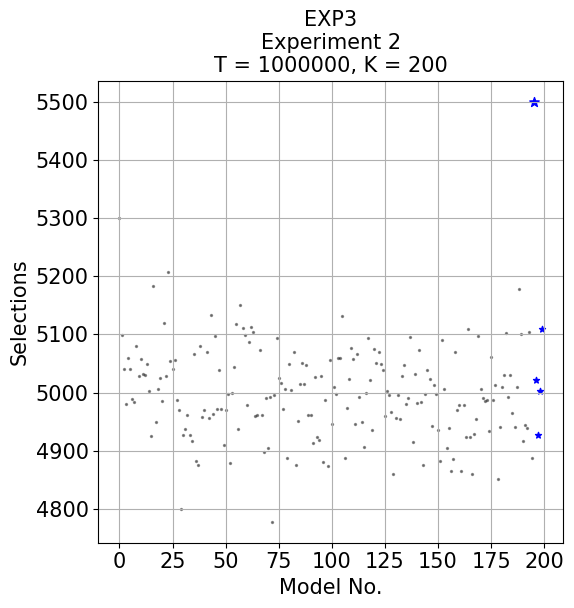

Optimal model recommended 1.070 times more often than sub-optimal models on average


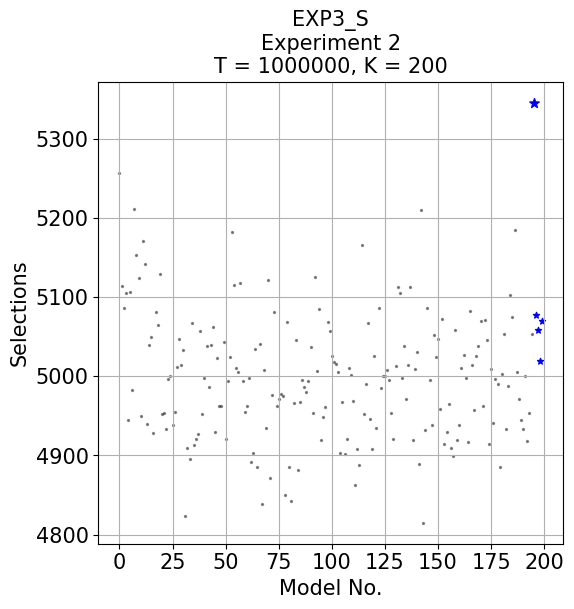

Optimal model recommended 1.005 times more often than sub-optimal models on average


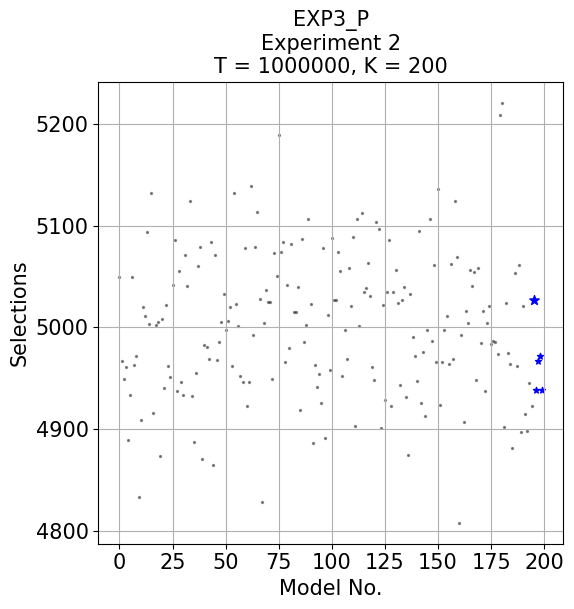

Optimal model recommended 1.090 times more often than sub-optimal models on average


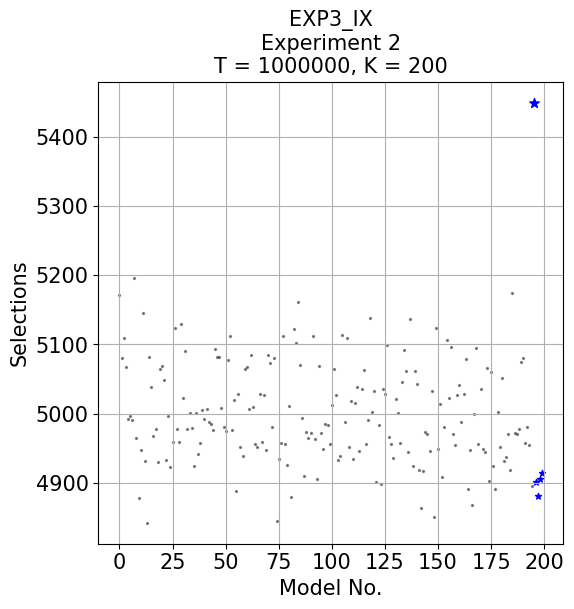

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5499%
Pulls: [5300. 5099. 5041. 4981. 5060. 5040. 4989. 4983. 5080. 5029. 5058. 5032.
 5030. 5049. 5003. 4926. 5183. 4950. 5007. 5025. 4985. 5119. 5028. 5207.
 5054. 5041. 5056. 4988. 4970. 4800. 4927. 4938. 4961. 4927. 4917. 5066.
 4883. 4876. 5080. 4958. 4970. 5069. 4957. 5133. 4963. 5098. 4972. 5039.
 4972. 4910. 4970. 4997. 4879. 4999. 5044. 5118. 4938. 5151. 5111. 5099.
 4978. 5087. 5113. 5105. 4960. 4961. 5073. 4961. 4898. 4990. 4905. 4993.
 4778. 4995. 5094. 5025. 5016. 4972. 5006. 4887. 5049. 5005. 5069. 4875.
 4951. 5014. 5051. 5014. 5047. 4961. 4962. 4913. 5026. 4924. 4919. 5028.
 4880. 4988. 4874. 5056. 4946. 5009. 4997. 5060. 5059. 5131. 4888. 4974.
 5023. 5076. 5057. 4946. 5067. 4992. 4949. 4907. 5000. 5094. 5022. 4935.
 5075. 5050. 5069. 5049. 5038. 4960. 5002. 4996. 4967. 4860. 4957. 4996.
 4955. 5028. 5047. 4981. 4990. 5096. 4915. 5032. 4982. 5073. 4984. 4875.
 4998. 5038. 5024. 4942. 5013. 4997. 4935. 4882. 5090. 5007. 4904. 4939.
 4865. 4886. 5069. 4970. 4979. 4866. 4979. 4924. 5110. 4924. 4860. 4928.
 4954. 5098. 5007. 4990. 4986. 4987. 4934. 5062. 4987. 5013. 4851. 4941.
 5010. 5030. 5103. 4993. 5031. 4965. 4941. 5009. 5178. 5100. 4917. 4945.
 4939. 5105. 4888. 5500. 5021. 4927. 5002. 5110.]
Time: 58.1555s

EXP3_S
Optimal Pulls: 0.5345%
Pulls: [5257. 5114. 5086. 5105. 4945. 5107. 4983. 5212. 5154. 5124. 4950. 5171.
 5142. 4940. 5040. 5050. 4928. 5081. 5065. 5130. 4953. 4954. 4934. 4997.
 5000. 4938. 4955. 5012. 5047. 5015. 5034. 4824. 4909. 4896. 5068. 4913.
 4921. 4927. 5057. 4952. 4998. 5039. 4986. 5040. 5062. 4930. 5023. 4962.
 4963. 5044. 4921. 4994. 5024. 5182. 5116. 5011. 5005. 5118. 4994. 4955.
 4962. 4998. 4892. 4903. 5035. 4886. 5041. 4839. 5008. 4935. 5122. 4872.
 4977. 5081. 4962. 4971. 4978. 4975. 4850. 5069. 4886. 4843. 4966. 5046.
 4882. 4967. 4996. 4987. 4980. 4994. 5037. 4954. 5126. 5007. 5085. 4919.
 4949. 4961. 5069. 5057. 5026. 5018. 5016. 5005. 4903. 4967. 4902. 4921.
 5010. 5002. 4969. 4863. 4908. 4888. 5166. 4952. 4991. 5067. 4946. 4908.
 5026. 4935. 5086. 4985. 5000. 5001. 5008. 4996. 4954. 4921. 5013. 5113.
 5106. 4998. 5039. 4972. 5015. 5113. 4919. 5009. 5031. 4889. 5211. 4815.
 4932. 5086. 4995. 4938. 5052. 5024. 5047. 4959. 5072. 4914. 4930. 4965.
 4910. 4899. 5059. 4919. 4939. 5010. 5027. 4998. 4917. 5083. 5014. 4957.
 5026. 5039. 5070. 4963. 5071. 5046. 4915. 5009. 4941. 4997. 4990. 4886.
 5003. 5053. 4934. 4988. 5103. 5075. 5185. 5005. 4972. 4945. 4934. 5000.
 4918. 4954. 5053. 5346. 5078. 5059. 5019. 5070.]
Time: 62.1007s

EXP3_P
Optimal Pulls: 0.5026%
Pulls: [5050. 4967. 4949. 4961. 4889. 4934. 5050. 4963. 4972. 4833. 4909. 5020.
 5011. 5094. 5003. 5132. 4916. 5002. 5005. 4874. 5008. 4940. 5022. 4962.
 4951. 5042. 5086. 4938. 5056. 4946. 4934. 5071. 5041. 5124. 4933. 4887.
 4955. 5060. 5079. 4871. 4983. 4981. 4969. 5084. 4865. 5071. 4968. 4986.
 5005. 5033. 4998. 5006. 5020. 4962. 5132. 5023. 5001. 4952. 4946. 5078.
 4923. 4946. 5139. 4993. 5079. 5114. 5028. 4828. 5004. 5037. 5025. 5025.
 4949. 5073. 5051. 5189. 5074. 5084. 4966. 5042. 4980. 5082. 5015. 5015.
 5040. 4919. 5087. 4986. 5002. 5107. 5023. 4886. 4963. 4941. 4954. 4926.
 5078. 4891. 5012. 4958. 5088. 5027. 5027. 5074. 5056. 4952. 4998. 4969.
 5058. 5021. 5089. 4903. 5107. 5001. 5113. 5035. 5039. 5063. 5031. 4961.
 4948. 5104. 5097. 4901. 5022. 4929. 5035. 5086. 4923. 5035. 5057. 5024.
 4943. 5027. 5040. 4932. 4875. 5033. 4991. 4972. 4947. 5095. 4926. 4976.
 4913. 4998. 5107. 4987. 5061. 4966. 5136. 4924. 4966. 4998. 5011. 4964.
 5062. 4969. 5124. 5069. 4808. 4993. 4907. 5016. 5004. 5057. 5041. 5055.
 4948. 5058. 4985. 5016. 4938. 5004. 5021. 4984. 4987. 4986. 4974. 5209.
 5221. 4902. 5024. 4975. 4964. 4881. 5054. 4962. 5061. 4897. 5021. 4915.
 4898. 4945. 4923. 5027. 4939. 4967. 4972. 4939.]
Time: 60.2951s

EXP3_IX
Optimal Pulls: 0.5449%
Pulls: [5172. 5081. 5110. 5067. 4992. 4996. 4990. 5196. 4964. 4878. 4947. 5145.
 4931. 4842. 5082. 5038. 4967. 4978. 4930. 5065. 5069. 5048. 4933. 4996.
 4922. 4959. 5124. 4978. 4959. 5130. 5022. 5091. 4977. 5001. 4979. 4924.
 5001. 4942. 4957. 5005. 4992. 5007. 4988. 4985. 4976. 5093. 5082. 5082.
 5008. 4980. 4975. 5077. 5113. 4976. 5019. 4888. 5029. 4951. 4939. 5065.
 5068. 5007. 5085. 5010. 4956. 4951. 5029. 4959. 5027. 4947. 5085. 5073.
 4980. 5080. 4845. 4934. 4958. 5113. 4956. 4926. 5011. 4879. 5122. 5102.
 5162. 5070. 4993. 4909. 4974. 4965. 4972. 5113. 4963. 4905. 5069. 4972.
 4949. 4985. 4983. 4956. 5013. 5065. 5027. 4933. 4938. 5114. 4988. 5110.
 4952. 5018. 4934. 5016. 5038. 4946. 5036. 5063. 4956. 4991. 5139. 5003.
 5032. 4901. 4983. 4898. 5036. 5028. 5099. 4966. 4956. 4935. 5021. 5001.
 4958. 5045. 5092. 5061. 4944. 5137. 4924. 5062. 5043. 4918. 4864. 4917.
 4973. 4970. 4946. 5032. 4851. 5124. 4949. 5014. 4908. 4981. 5106. 5022.
 5096. 4970. 4955. 5027. 5042. 4988. 5028. 5079. 4891. 4947. 4868. 5000.
 5095. 4956. 5036. 4948. 4944. 5066. 4903. 5060. 4924. 4891. 5002. 4952.
 5052. 4932. 4937. 4971. 4919. 5175. 4972. 4970. 4977. 5075. 5080. 4957.
 4981. 4955. 4895. 5450. 4901. 4881. 4905. 4914.]
Time: 58.4671s


T = 1000000, K = 200, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 0.998 times more often than sub-optimal models on average


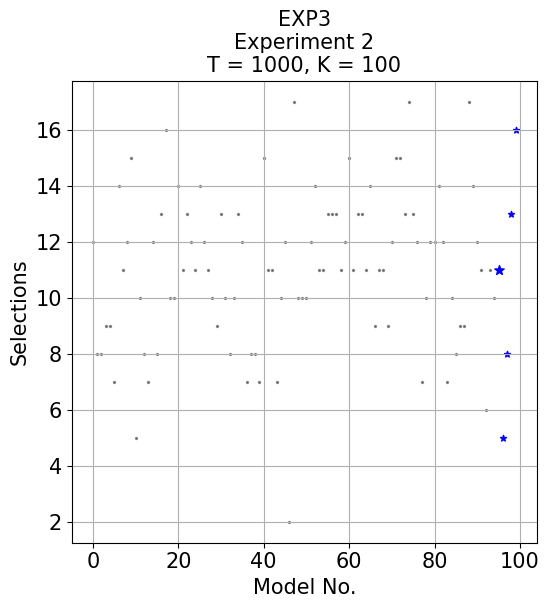

Optimal model recommended 0.635 times more often than sub-optimal models on average


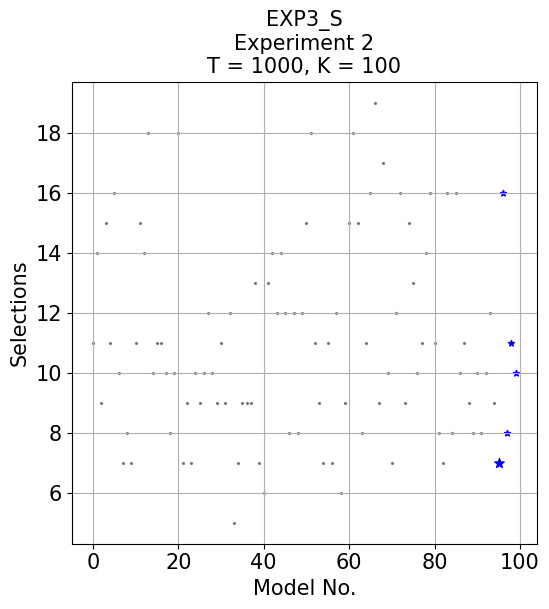

Optimal model recommended 0.821 times more often than sub-optimal models on average


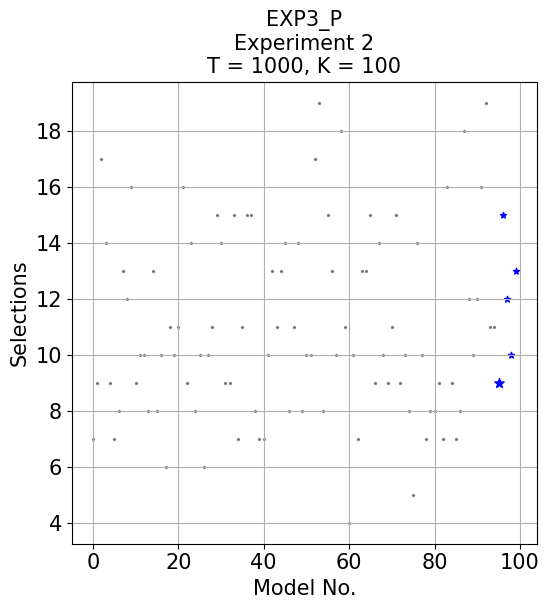

Optimal model recommended 1.551 times more often than sub-optimal models on average


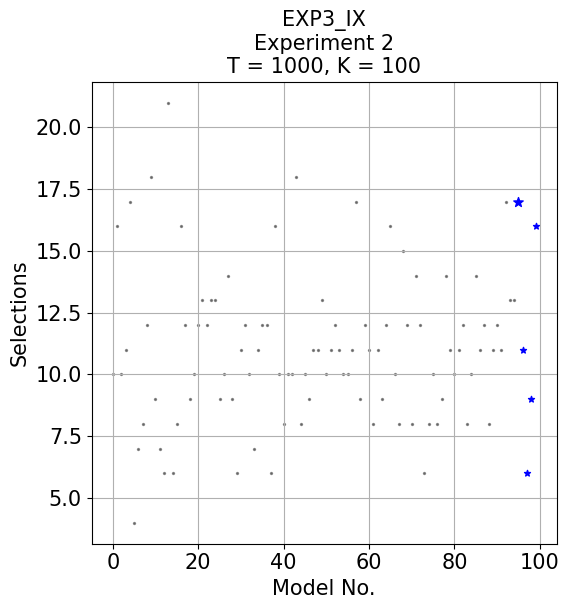

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.0000%
Pulls: [12.  8.  8.  9.  9.  7. 14. 11. 12. 15.  5. 10.  8.  7. 12.  8. 13. 16.
 10. 10. 14. 11. 13. 12. 11. 14. 12. 11. 10.  9. 13. 10.  8. 10. 13. 12.
  7.  8.  8.  7. 15. 11. 11.  7. 10. 12.  2. 17. 10. 10. 10. 12. 14. 11.
 11. 13. 13. 13. 11. 12. 15. 11. 13. 13. 11. 14.  9. 11. 11.  9. 12. 15.
 15. 13. 17. 13. 12.  7. 10. 12. 12. 14. 12.  7. 10.  8.  9.  9. 17. 14.
 12. 11.  6. 11. 10. 11.  5.  8. 13. 16.]
Time: 0.0661s

EXP3_S
Optimal Pulls: 0.6364%
Pulls: [11. 14.  9. 15. 11. 16. 10.  7.  8.  7. 11. 15. 14. 18. 10. 11. 11. 10.
  8. 10. 18.  7.  9.  7. 10.  9. 10. 12. 10.  9. 11.  9. 12.  5.  7.  9.
  9.  9. 13.  7.  6. 13. 14. 12. 14. 12.  8. 12.  8. 12. 15. 18. 11.  9.
  7. 11.  7. 12.  6.  9. 15. 18. 15.  8. 11. 16. 19.  9. 17. 10.  7. 12.
 16.  9. 15. 13. 10. 11. 14. 16. 11.  8.  7. 16.  8. 16. 10. 11.  9.  8.
 10.  8. 10. 12.  9.  7. 16.  8. 11. 10.]
Time: 0.1831s

EXP3_P
Optimal Pulls: 0.8182%
Pulls: [ 7.  9. 17. 14.  9.  7.  8. 13. 12. 16.  9. 10. 10.  8. 13.  8. 10.  6.
 11. 10. 11. 16.  9. 14.  8. 10.  6. 10. 11. 15. 14.  9.  9. 15.  7. 11.
 15. 15.  8.  7.  7. 10. 13. 11. 13. 14.  8. 11. 14.  8. 10. 10. 17. 19.
  8. 15. 13. 10. 18. 11.  4. 10.  7. 13. 13. 15.  9. 14. 10.  9. 11. 15.
  9. 10.  8.  5. 14. 10.  7.  8.  8.  9.  7. 16.  9.  7.  8. 18. 12. 10.
 12. 16. 19. 11. 11.  9. 15. 12. 10. 13.]
Time: 0.1925s

EXP3_IX
Optimal Pulls: 1.5455%
Pulls: [10. 16. 10. 11. 17.  4.  7.  8. 12. 18.  9.  7.  6. 21.  6.  8. 16. 12.
  9. 10. 12. 13. 12. 13. 13.  9. 10. 14.  9.  6. 11. 12. 10.  7. 11. 12.
 12.  6. 16. 10.  8. 10. 10. 18.  8. 10.  9. 11. 11. 13. 10. 11. 12. 11.
 10. 10. 11. 17.  9. 12. 11.  8. 11.  9. 12. 16. 10.  8. 15. 12.  8. 14.
 12.  6.  8. 10.  8.  9. 14. 11. 10. 11. 12.  8. 10. 14. 11. 12.  8. 11.
 12. 11. 17. 13. 13. 17. 11.  6.  9. 16.]
Time: 0.1853s


T = 1000, K = 100, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.078 times more often than sub-optimal models on average


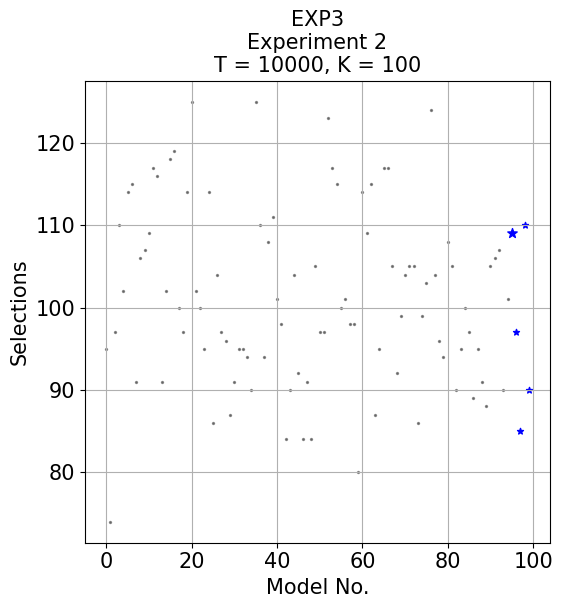

Optimal model recommended 0.909 times more often than sub-optimal models on average


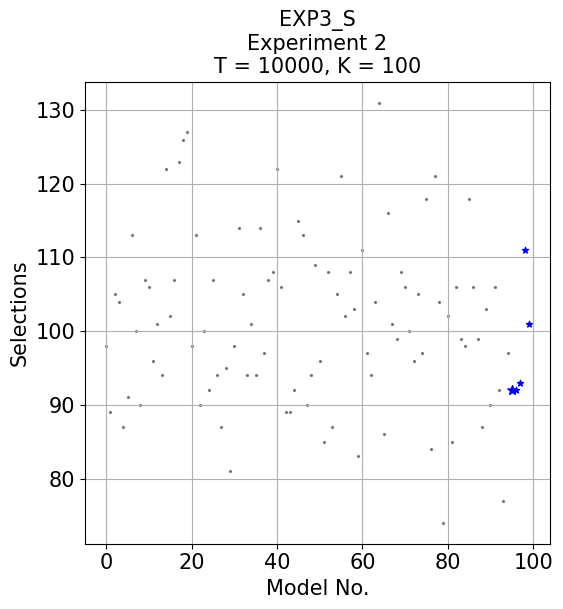

Optimal model recommended 1.099 times more often than sub-optimal models on average


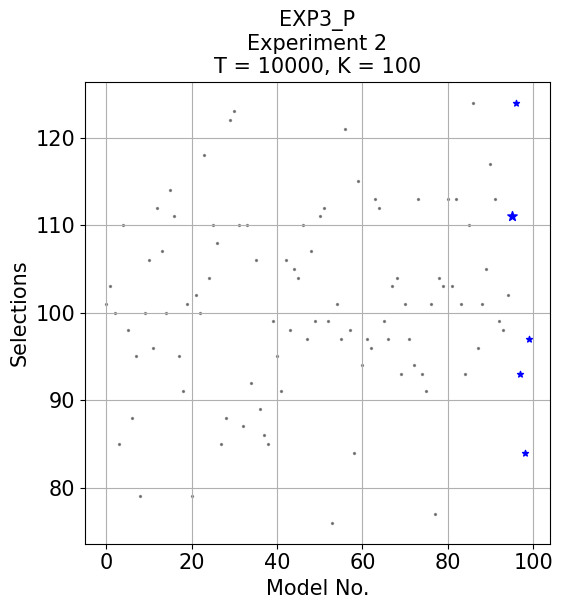

Optimal model recommended 1.041 times more often than sub-optimal models on average


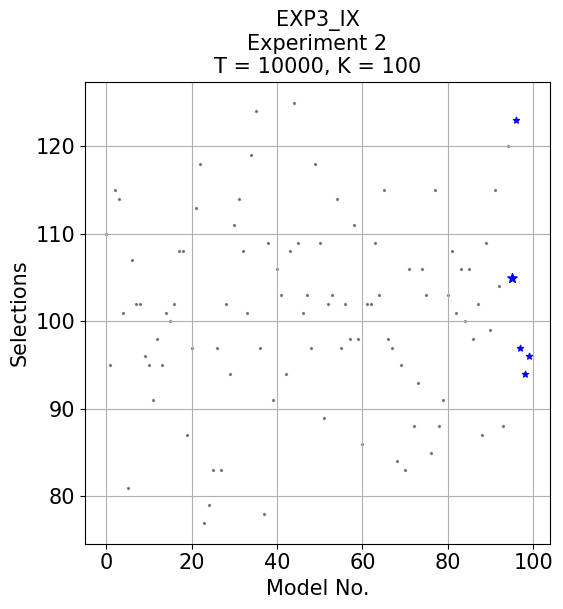

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.0792%
Pulls: [ 95.  74.  97. 110. 102. 114. 115.  91. 106. 107. 109. 117. 116.  91.
 102. 118. 119. 100.  97. 114. 125. 102. 100.  95. 114.  86. 104.  97.
  96.  87.  91.  95.  95.  94.  90. 125. 110.  94. 108. 111. 101.  98.
  84.  90. 104.  92.  84.  91.  84. 105.  97.  97. 123. 117. 115. 100.
 101.  98.  98.  80. 114. 109. 115.  87.  95. 117. 117. 105.  92.  99.
 104. 105. 105.  86.  99. 103. 124. 104.  96.  94. 108. 105.  90.  95.
 100.  97.  89.  95.  91.  88. 105. 106. 107.  90. 101. 109.  97.  85.
 110.  90.]
Time: 0.7320s

EXP3_S
Optimal Pulls: 0.9109%
Pulls: [ 98.  89. 105. 104.  87.  91. 113. 100.  90. 107. 106.  96. 101.  94.
 122. 102. 107. 123. 126. 127.  98. 113.  90. 100.  92. 107.  94.  87.
  95.  81.  98. 114. 105.  94. 101.  94. 114.  97. 107. 108. 122. 106.
  89.  89.  92. 115. 113.  90.  94. 109.  96.  85. 108.  87. 105. 121.
 102. 108. 103.  83. 111.  97.  94. 104. 131.  86. 116. 101.  99. 108.
 106. 100.  96. 105.  97. 118.  84. 121. 104.  74. 102.  85. 106.  99.
  98. 118. 106.  99.  87. 103.  90. 106.  92.  77.  97.  92.  92.  93.
 111. 101.]
Time: 0.7806s

EXP3_P
Optimal Pulls: 1.0990%
Pulls: [101. 103. 100.  85. 110.  98.  88.  95.  79. 100. 106.  96. 112. 107.
 100. 114. 111.  95.  91. 101.  79. 102. 100. 118. 104. 110. 108.  85.
  88. 122. 123. 110.  87. 110.  92. 106.  89.  86.  85.  99.  95.  91.
 106.  98. 105. 104. 110.  97. 107.  99. 111. 112.  99.  76. 101.  97.
 121.  98.  84. 115.  94.  97.  96. 113. 112.  99.  97. 103. 104.  93.
 101.  97.  94. 113.  93.  91. 101.  77. 104. 103. 113. 103. 113. 101.
  93. 110. 124.  96. 101. 105. 117. 113.  99.  98. 102. 111. 124.  93.
  84.  97.]
Time: 0.7678s

EXP3_IX
Optimal Pulls: 1.0396%
Pulls: [110.  95. 115. 114. 101.  81. 107. 102. 102.  96.  95.  91.  98.  95.
 101. 100. 102. 108. 108.  87.  97. 113. 118.  77.  79.  83.  97.  83.
 102.  94. 111. 114. 108. 101. 119. 124.  97.  78. 109.  91. 106. 103.
  94. 108. 125. 109. 101. 103.  97. 118. 109.  89. 102. 103. 114.  97.
 102.  98. 111.  98.  86. 102. 102. 109. 103. 115.  98.  97.  84.  95.
  83. 106.  88.  93. 106. 103.  85. 115.  88.  91. 103. 108. 101. 106.
 100. 106.  98. 102.  87. 109.  99. 115. 104.  88. 120. 105. 123.  97.
  94.  96.]
Time: 0.7162s


T = 10000, K = 100, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.109 times more often than sub-optimal models on average


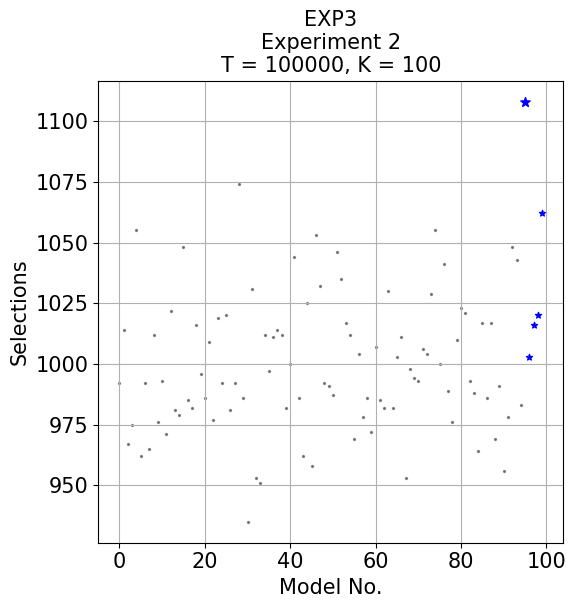

Optimal model recommended 1.036 times more often than sub-optimal models on average


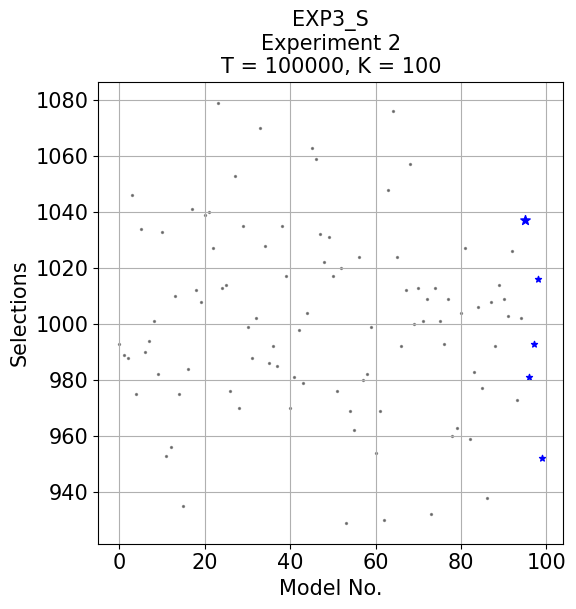

Optimal model recommended 1.040 times more often than sub-optimal models on average


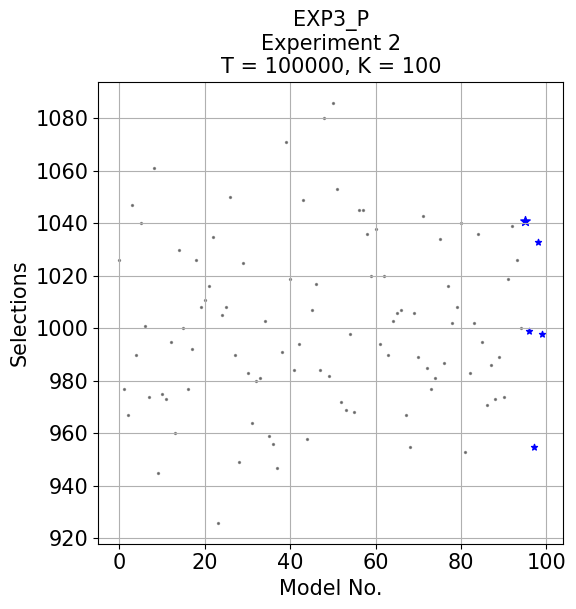

Optimal model recommended 1.097 times more often than sub-optimal models on average


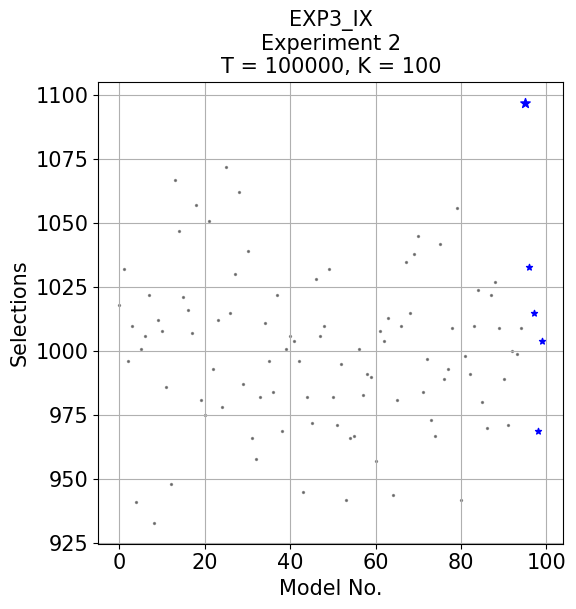

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.1069%
Pulls: [ 992. 1014.  967.  975. 1055.  962.  992.  965. 1012.  976.  993.  971.
 1022.  981.  979. 1048.  985.  982. 1016.  996.  986. 1009.  977. 1019.
  992. 1020.  981.  992. 1074.  986.  935. 1031.  953.  951. 1012.  997.
 1011. 1014. 1012.  982. 1000. 1044.  986.  962. 1025.  958. 1053. 1032.
  992.  991.  987. 1046. 1035. 1017. 1012.  969. 1004.  978.  986.  972.
 1007.  985.  982. 1030.  982. 1003. 1011.  953.  998.  994.  993. 1006.
 1004. 1029. 1055. 1000. 1041.  989.  976. 1010. 1023. 1021.  993.  988.
  964. 1017.  986. 1017.  969.  991.  956.  978. 1048. 1043.  983. 1108.
 1003. 1016. 1020. 1062.]
Time: 6.5422s

EXP3_S
Optimal Pulls: 1.0360%
Pulls: [ 993.  989.  988. 1046.  975. 1034.  990.  994. 1001.  982. 1033.  953.
  956. 1010.  975.  935.  984. 1041. 1012. 1008. 1039. 1040. 1027. 1079.
 1013. 1014.  976. 1053.  970. 1035.  999.  988. 1002. 1070. 1028.  986.
  992.  985. 1035. 1017.  970.  981.  998.  979. 1004. 1063. 1059. 1032.
 1022. 1031. 1017.  976. 1020.  929.  969.  962. 1024.  980.  982.  999.
  954.  969.  930. 1048. 1076. 1024.  992. 1012. 1057. 1000. 1013. 1001.
 1009.  932. 1013. 1001.  993. 1009.  960.  963. 1004. 1027.  959.  983.
 1006.  977.  938. 1008.  992. 1014. 1009. 1003. 1026.  973. 1002. 1037.
  981.  993. 1016.  952.]
Time: 5.1463s

EXP3_P
Optimal Pulls: 1.0400%
Pulls: [1026.  977.  967. 1047.  990. 1040. 1001.  974. 1061.  945.  975.  973.
  995.  960. 1030. 1000.  977.  992. 1026. 1008. 1011. 1016. 1035.  926.
 1005. 1008. 1050.  990.  949. 1025.  983.  964.  980.  981. 1003.  959.
  956.  947.  991. 1071. 1019.  984.  994. 1049.  958. 1007. 1017.  984.
 1080.  982. 1086. 1053.  972.  969.  998.  968. 1045. 1045. 1036. 1020.
 1038.  994. 1020.  990. 1003. 1006. 1007.  967.  955. 1006.  989. 1043.
  985.  977.  981. 1034.  987. 1016. 1002. 1008. 1040.  953.  983. 1002.
 1036.  995.  971.  986.  973.  989.  974. 1019. 1039. 1026. 1000. 1041.
  999.  955. 1033.  998.]
Time: 4.7265s

EXP3_IX
Optimal Pulls: 1.0959%
Pulls: [1018. 1032.  996. 1010.  941. 1001. 1006. 1022.  933. 1012. 1008.  986.
  948. 1067. 1047. 1021. 1016. 1007. 1057.  981.  975. 1051.  993. 1012.
  978. 1072. 1015. 1030. 1062.  987. 1039.  966.  958.  982. 1011.  996.
  984. 1022.  969. 1001. 1006. 1004.  996.  945.  982.  972. 1028. 1006.
 1010. 1032.  982.  971.  995.  942.  966.  967. 1001.  983.  991.  990.
  957. 1008. 1004. 1013.  944.  981. 1010. 1035. 1015. 1038. 1045.  984.
  997.  973.  967. 1042.  989.  993. 1009. 1056.  942.  998.  991. 1010.
 1024.  980.  970. 1022. 1027. 1009.  989.  971. 1000.  999. 1009. 1097.
 1033. 1015.  969. 1004.]
Time: 5.5749s


T = 100000, K = 100, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.188 times more often than sub-optimal models on average


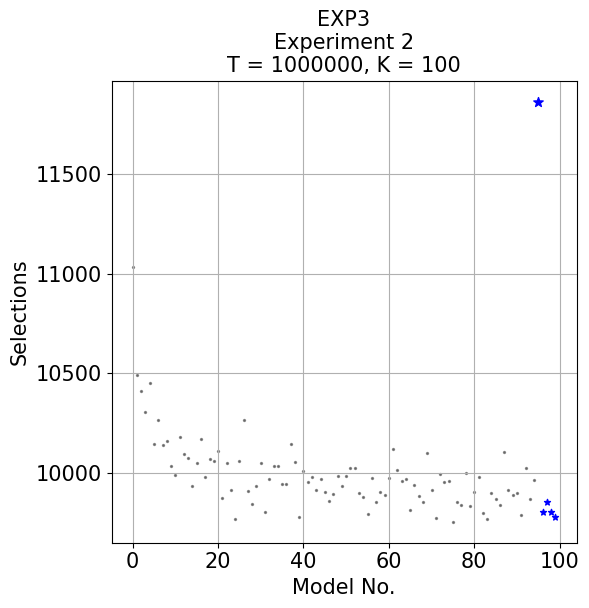

Optimal model recommended 1.183 times more often than sub-optimal models on average


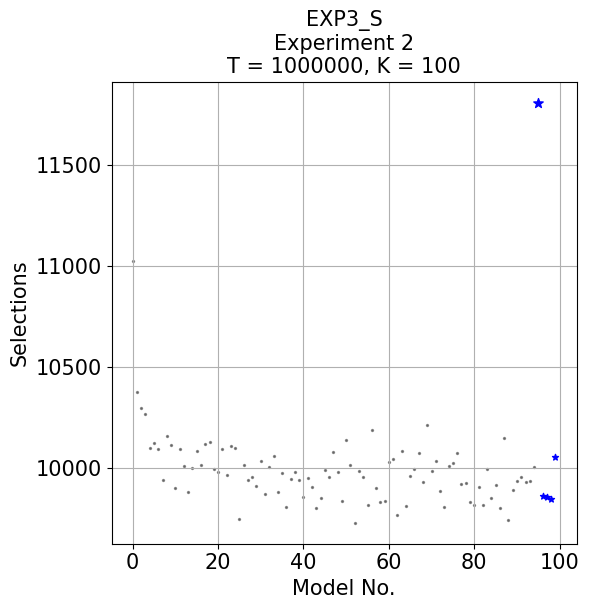

Optimal model recommended 0.998 times more often than sub-optimal models on average


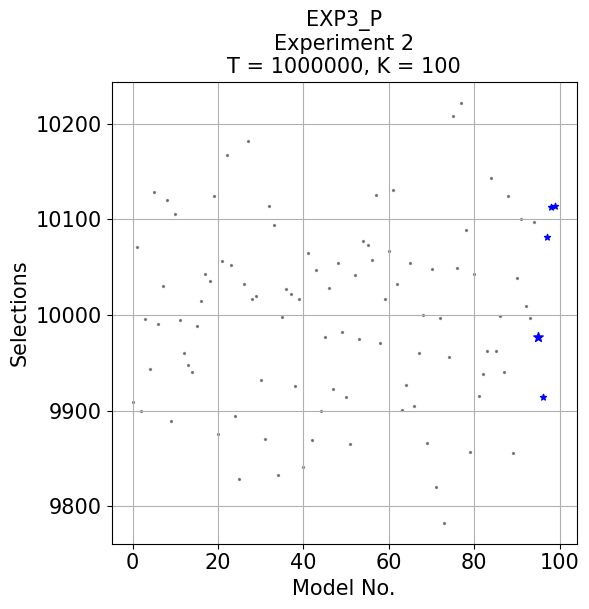

Optimal model recommended 1.161 times more often than sub-optimal models on average


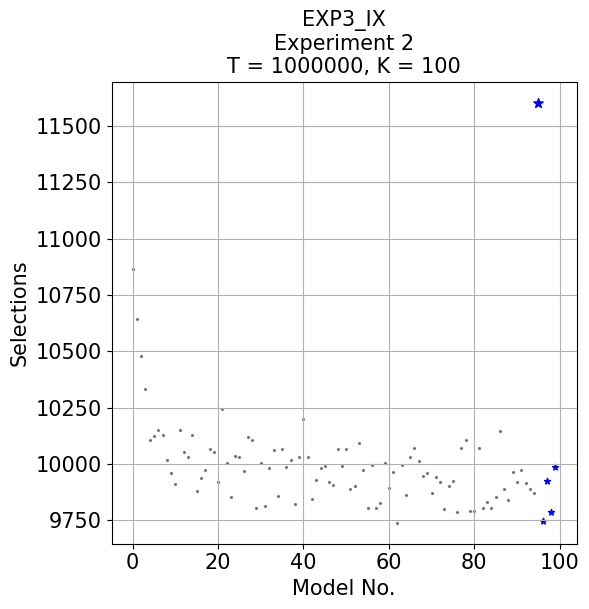

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.1862%
Pulls: [11032. 10491. 10411. 10304. 10450. 10145. 10262. 10136. 10159. 10033.
  9988. 10178. 10093. 10074.  9932. 10047. 10170.  9978. 10066. 10056.
 10107.  9872. 10047.  9910.  9766. 10057. 10262.  9905.  9840.  9930.
 10050.  9803.  9969. 10031. 10034.  9943.  9945. 10144. 10051.  9776.
 10010.  9954.  9977.  9912.  9969.  9903.  9856.  9890.  9984.  9930.
  9985. 10024. 10021.  9899.  9879.  9794.  9971.  9853.  9903.  9887.
  9973. 10116. 10015.  9958.  9967.  9814.  9937.  9881.  9853. 10098.
  9910.  9773.  9991.  9954.  9959.  9753.  9853.  9839.  9996.  9831.
  9903.  9976.  9797.  9769.  9895.  9865.  9835. 10105.  9914.  9885.
  9899.  9785. 10025.  9867.  9964. 11863.  9802.  9851.  9802.  9779.]
Time: 48.9466s

EXP3_S
Optimal Pulls: 1.1810%
Pulls: [11026. 10375. 10297. 10269. 10101. 10125. 10095.  9942. 10157. 10114.
  9899. 10093. 10011.  9878. 10000. 10085. 10013. 10119. 10130.  9995.
  9979. 10096.  9967. 10108. 10098.  9745. 10016.  9940.  9956.  9910.
 10036.  9871. 10005. 10058.  9880.  9975.  9805.  9944.  9979.  9938.
  9858.  9952.  9905.  9800.  9849.  9991.  9956. 10079.  9978.  9836.
 10140. 10012.  9728.  9986.  9954.  9815. 10186.  9900.  9833.  9834.
 10028. 10045.  9767. 10083.  9811.  9960.  9993. 10076.  9932. 10213.
  9985. 10035.  9884.  9804. 10010. 10023. 10076.  9922.  9924.  9829.
  9817.  9907.  9816.  9995.  9853.  9917.  9802. 10149.  9740.  9890.
  9935.  9957.  9929.  9936. 10006. 11811.  9862.  9855.  9846. 10055.]
Time: 55.2538s

EXP3_P
Optimal Pulls: 0.9976%
Pulls: [ 9909. 10071.  9900.  9996.  9944. 10129.  9991. 10030. 10120.  9889.
 10106.  9995.  9960.  9948.  9941.  9989. 10015. 10043. 10036. 10124.
  9876. 10057. 10167. 10052.  9895.  9829. 10033. 10182. 10017. 10020.
  9932.  9870. 10114. 10094.  9833.  9998. 10027. 10022.  9926. 10017.
  9841. 10065.  9869. 10047.  9900.  9977. 10028.  9923. 10054.  9982.
  9914.  9865. 10042.  9975. 10077. 10073. 10058. 10126.  9971. 10017.
 10067. 10131. 10032.  9901.  9927. 10054.  9905.  9960. 10000.  9866.
 10048.  9820.  9997.  9783.  9956. 10208. 10049. 10222. 10089.  9857.
 10043.  9915.  9938.  9962. 10143.  9963.  9999.  9941. 10124.  9856.
 10039. 10100. 10010.  9997. 10097.  9977.  9914. 10082. 10113. 10114.]
Time: 52.6189s

EXP3_IX
Optimal Pulls: 1.1602%
Pulls: [10867. 10643. 10477. 10331. 10104. 10123. 10152. 10128. 10016.  9959.
  9912. 10150. 10052. 10030. 10127.  9880.  9938.  9975. 10065. 10052.
  9918. 10243. 10006.  9853. 10037. 10032.  9968. 10120. 10106.  9804.
 10002.  9815.  9981. 10060.  9859. 10065.  9987. 10019.  9823. 10032.
 10198. 10029.  9846.  9930.  9980.  9991.  9921.  9906. 10064.  9992.
 10065.  9889.  9903. 10095.  9974.  9803.  9995.  9804.  9828. 10004.
  9895.  9962.  9739.  9997.  9860. 10029. 10072. 10011.  9946.  9958.
  9870.  9940.  9918.  9798.  9900.  9924.  9786. 10069. 10106.  9791.
  9792. 10069.  9806.  9830.  9804.  9854. 10146.  9888.  9839.  9962.
  9920.  9972.  9915.  9890.  9873. 11603.  9745.  9922.  9785.  9986.]
Time: 50.6629s


T = 1000000, K = 100, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.054 times more often than sub-optimal models on average


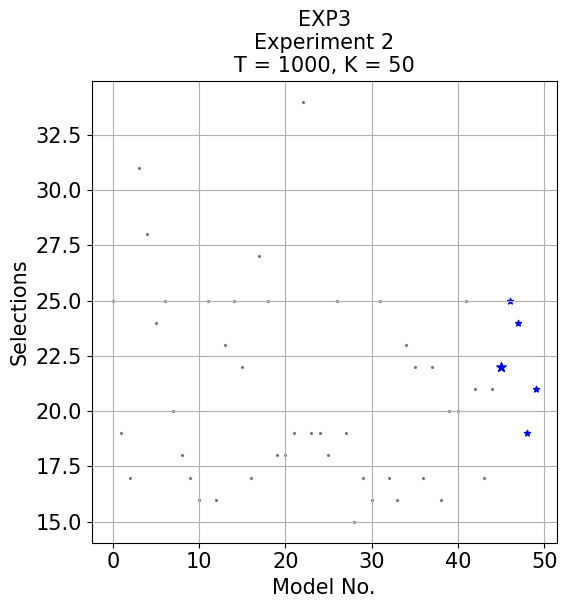

Optimal model recommended 0.962 times more often than sub-optimal models on average


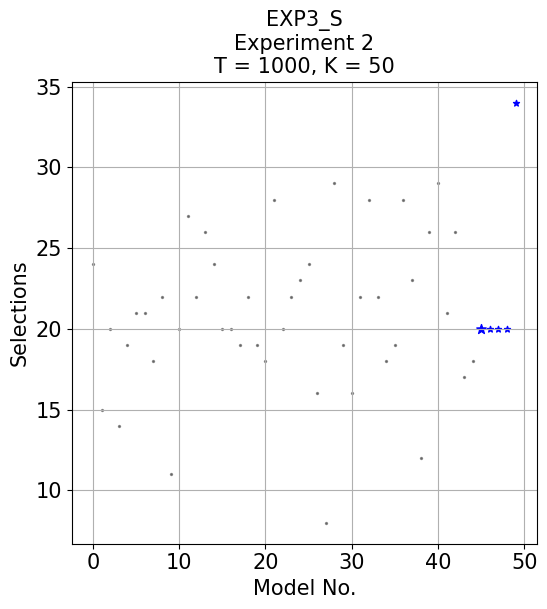

Optimal model recommended 1.290 times more often than sub-optimal models on average


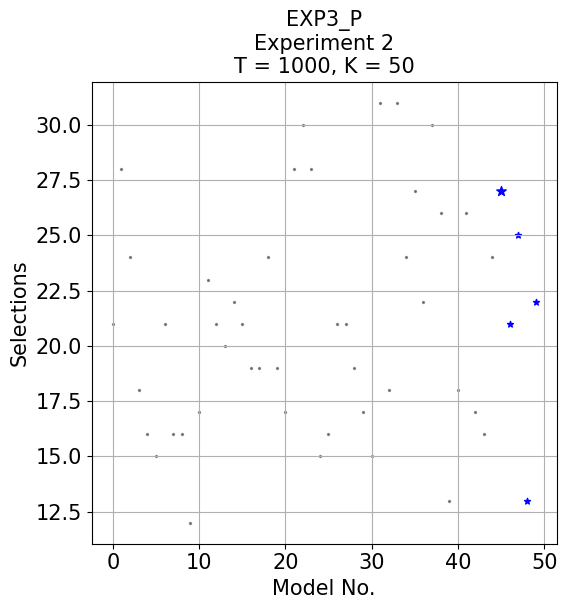

Optimal model recommended 0.947 times more often than sub-optimal models on average


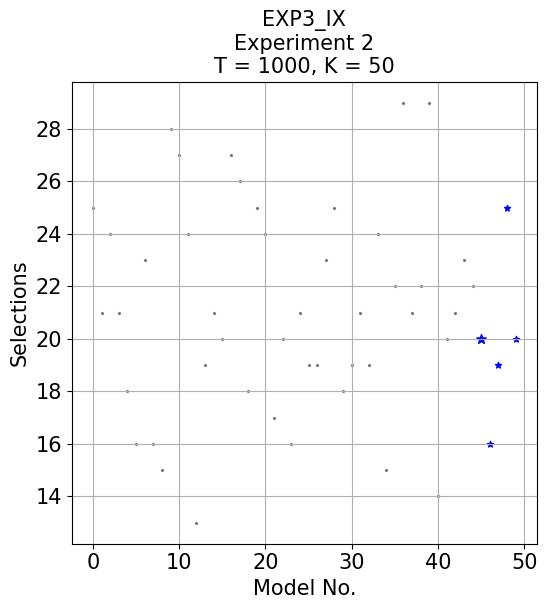

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.0952%
Pulls: [25. 19. 17. 31. 28. 24. 25. 20. 18. 17. 16. 25. 16. 23. 25. 22. 17. 27.
 25. 18. 18. 19. 34. 19. 19. 18. 25. 19. 15. 17. 16. 25. 17. 16. 23. 22.
 17. 22. 16. 20. 20. 25. 21. 17. 21. 22. 25. 24. 19. 21.]
Time: 0.0899s

EXP3_S
Optimal Pulls: 1.9048%
Pulls: [24. 15. 20. 14. 19. 21. 21. 18. 22. 11. 20. 27. 22. 26. 24. 20. 20. 19.
 22. 19. 18. 28. 20. 22. 23. 24. 16.  8. 29. 19. 16. 22. 28. 22. 18. 19.
 28. 23. 12. 26. 29. 21. 26. 17. 18. 20. 20. 20. 20. 34.]
Time: 0.0784s

EXP3_P
Optimal Pulls: 2.5714%
Pulls: [21. 28. 24. 18. 16. 15. 21. 16. 16. 12. 17. 23. 21. 20. 22. 21. 19. 19.
 24. 19. 17. 28. 30. 28. 15. 16. 21. 21. 19. 17. 15. 31. 18. 31. 24. 27.
 22. 30. 26. 13. 18. 26. 17. 16. 24. 27. 21. 25. 13. 22.]
Time: 0.0886s

EXP3_IX
Optimal Pulls: 1.9048%
Pulls: [25. 21. 24. 21. 18. 16. 23. 16. 15. 28. 27. 24. 13. 19. 21. 20. 27. 26.
 18. 25. 24. 17. 20. 16. 21. 19. 19. 23. 25. 18. 19. 21. 19. 24. 15. 22.
 29. 21. 22. 29. 14. 20. 21. 23. 22. 20. 16. 19. 25. 20.]
Time: 0.0942s


T = 1000, K = 50, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.058 times more often than sub-optimal models on average


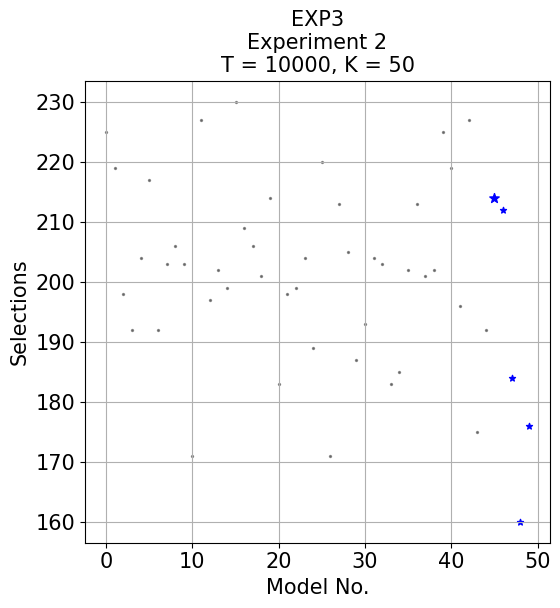

Optimal model recommended 1.156 times more often than sub-optimal models on average


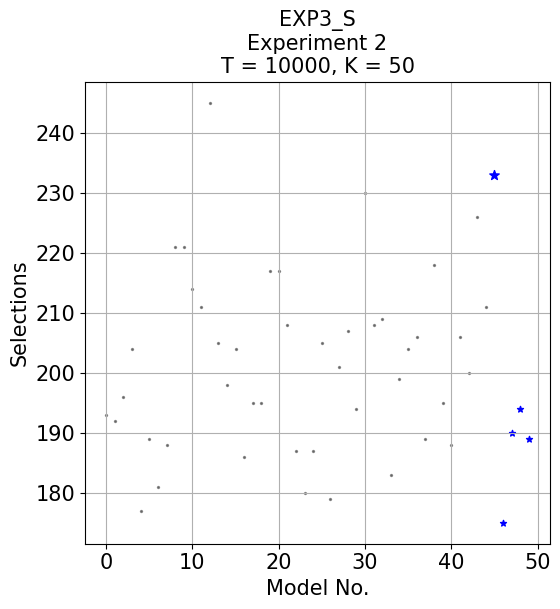

Optimal model recommended 0.927 times more often than sub-optimal models on average


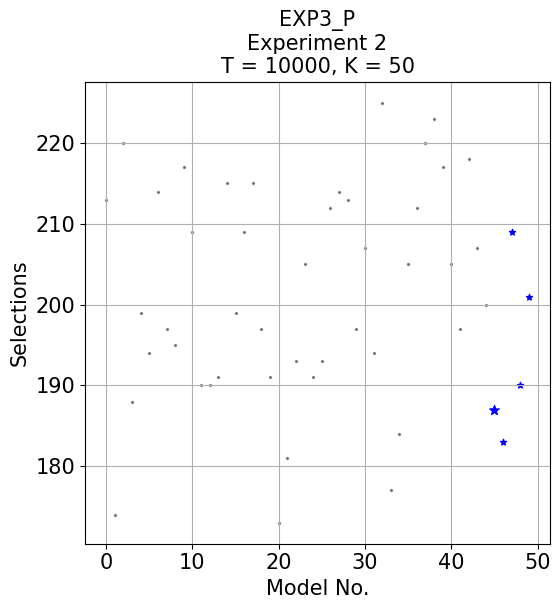

Optimal model recommended 1.278 times more often than sub-optimal models on average


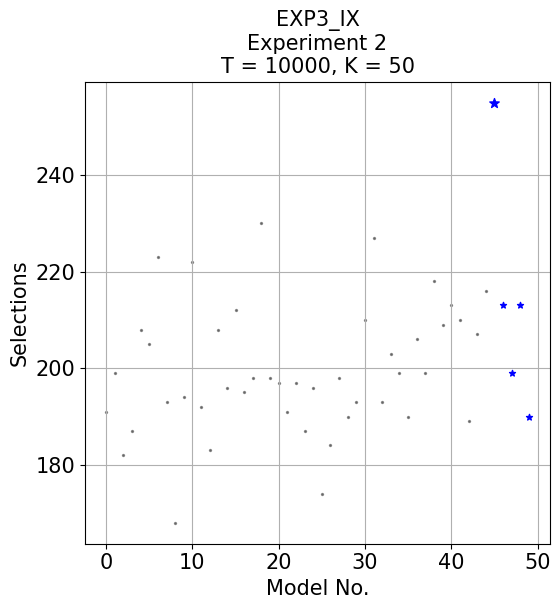

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.1294%
Pulls: [225. 219. 198. 192. 204. 217. 192. 203. 206. 203. 171. 227. 197. 202.
 199. 230. 209. 206. 201. 214. 183. 198. 199. 204. 189. 220. 171. 213.
 205. 187. 193. 204. 203. 183. 185. 202. 213. 201. 202. 225. 219. 196.
 227. 175. 192. 214. 212. 184. 160. 176.]
Time: 0.8406s

EXP3_S
Optimal Pulls: 2.3184%
Pulls: [193. 192. 196. 204. 177. 189. 181. 188. 221. 221. 214. 211. 245. 205.
 198. 204. 186. 195. 195. 217. 217. 208. 187. 180. 187. 205. 179. 201.
 207. 194. 230. 208. 209. 183. 199. 204. 206. 189. 218. 195. 188. 206.
 200. 226. 211. 233. 175. 190. 194. 189.]
Time: 0.8639s

EXP3_P
Optimal Pulls: 1.8607%
Pulls: [213. 174. 220. 188. 199. 194. 214. 197. 195. 217. 209. 190. 190. 191.
 215. 199. 209. 215. 197. 191. 173. 181. 193. 205. 191. 193. 212. 214.
 213. 197. 207. 194. 225. 177. 184. 205. 212. 220. 223. 217. 205. 197.
 218. 207. 200. 187. 183. 209. 190. 201.]
Time: 0.8067s

EXP3_IX
Optimal Pulls: 2.5373%
Pulls: [191. 199. 182. 187. 208. 205. 223. 193. 168. 194. 222. 192. 183. 208.
 196. 212. 195. 198. 230. 198. 197. 191. 197. 187. 196. 174. 184. 198.
 190. 193. 210. 227. 193. 203. 199. 190. 206. 199. 218. 209. 213. 210.
 189. 207. 216. 255. 213. 199. 213. 190.]
Time: 0.7235s


T = 10000, K = 50, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.058 times more often than sub-optimal models on average


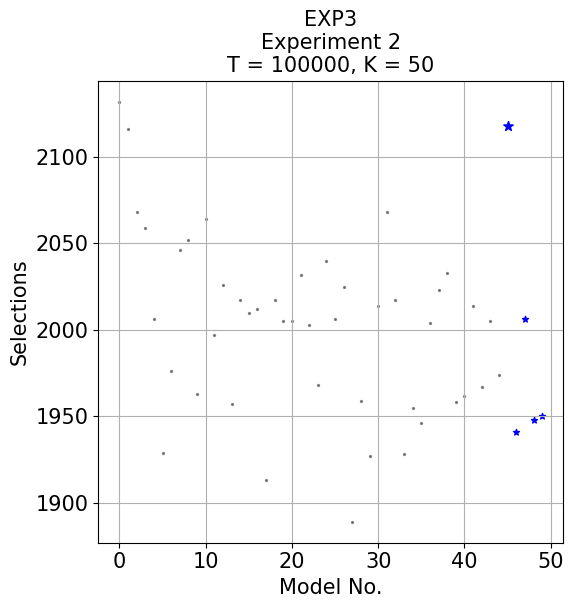

Optimal model recommended 1.144 times more often than sub-optimal models on average


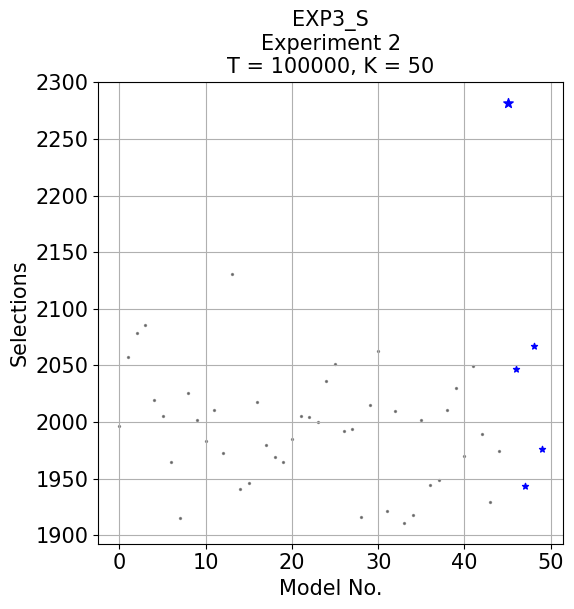

Optimal model recommended 0.985 times more often than sub-optimal models on average


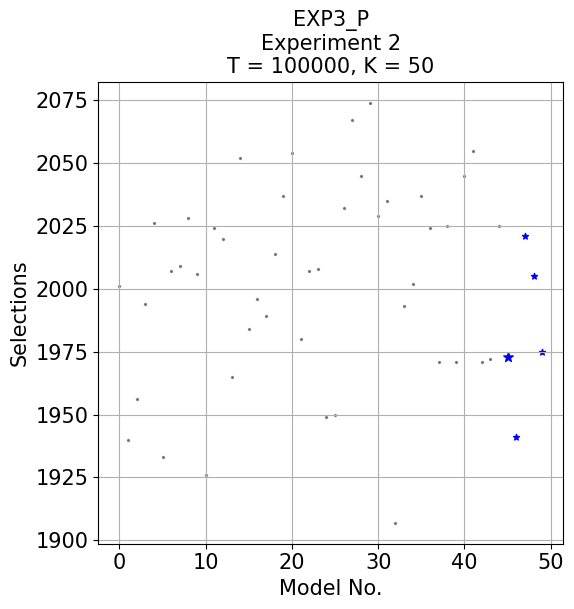

Optimal model recommended 1.125 times more often than sub-optimal models on average


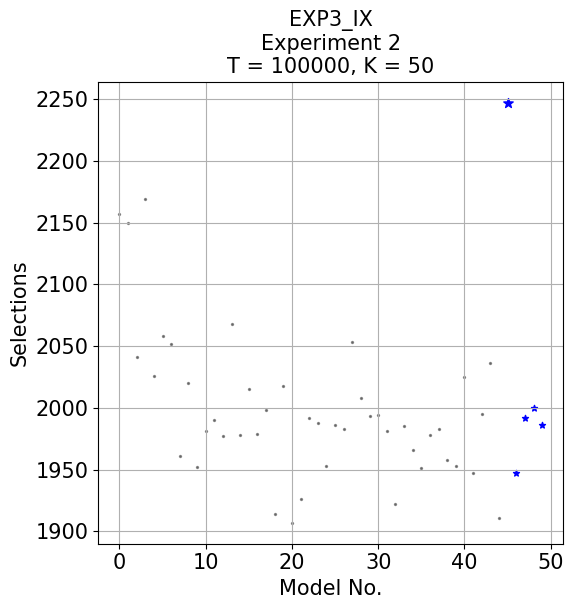

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.1169%
Pulls: [2132. 2116. 2068. 2059. 2006. 1929. 1976. 2046. 2052. 1963. 2064. 1997.
 2026. 1957. 2017. 2010. 2012. 1913. 2017. 2005. 2005. 2032. 2003. 1968.
 2040. 2006. 2025. 1889. 1959. 1927. 2014. 2068. 2017. 1928. 1955. 1946.
 2004. 2023. 2033. 1958. 1962. 2014. 1967. 2005. 1974. 2118. 1941. 2006.
 1948. 1950.]
Time: 6.3730s

EXP3_S
Optimal Pulls: 2.2809%
Pulls: [1996. 2057. 2079. 2086. 2019. 2005. 1965. 1915. 2026. 2002. 1983. 2011.
 1973. 2131. 1941. 1946. 2018. 1980. 1969. 1965. 1985. 2005. 2004. 2000.
 2036. 2051. 1992. 1994. 1916. 2015. 2063. 1921. 2010. 1911. 1918. 2002.
 1944. 1949. 2011. 2030. 1970. 2049. 1989. 1929. 1974. 2282. 2047. 1943.
 2067. 1976.]
Time: 5.5930s

EXP3_P
Optimal Pulls: 1.9720%
Pulls: [2001. 1940. 1956. 1994. 2026. 1933. 2007. 2009. 2028. 2006. 1926. 2024.
 2020. 1965. 2052. 1984. 1996. 1989. 2014. 2037. 2054. 1980. 2007. 2008.
 1949. 1950. 2032. 2067. 2045. 2074. 2029. 2035. 1907. 1993. 2002. 2037.
 2024. 1971. 2025. 1971. 2045. 2055. 1971. 1972. 2025. 1973. 1941. 2021.
 2005. 1975.]
Time: 4.5947s

EXP3_IX
Optimal Pulls: 2.2459%
Pulls: [2157. 2150. 2041. 2169. 2026. 2058. 2052. 1961. 2020. 1952. 1981. 1990.
 1977. 2068. 1978. 2015. 1979. 1998. 1914. 2018. 1907. 1926. 1992. 1988.
 1953. 1986. 1983. 2053. 2008. 1993. 1994. 1981. 1922. 1985. 1966. 1951.
 1978. 1983. 1958. 1953. 2025. 1947. 1995. 2036. 1911. 2247. 1947. 1992.
 2000. 1986.]
Time: 4.3868s


T = 100000, K = 50, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.426 times more often than sub-optimal models on average


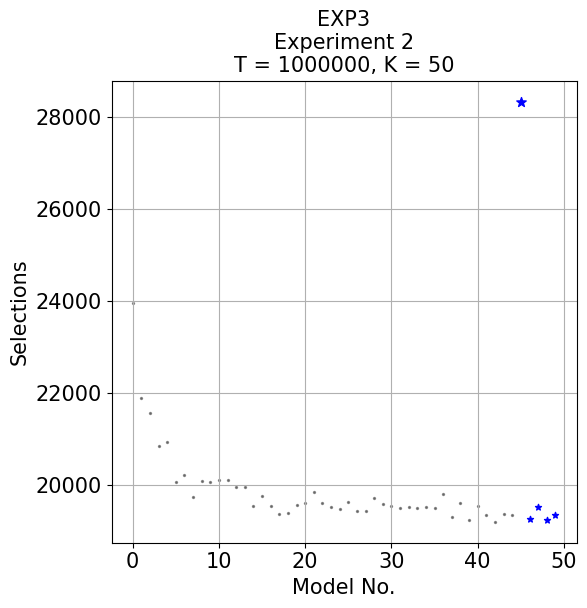

Optimal model recommended 1.434 times more often than sub-optimal models on average


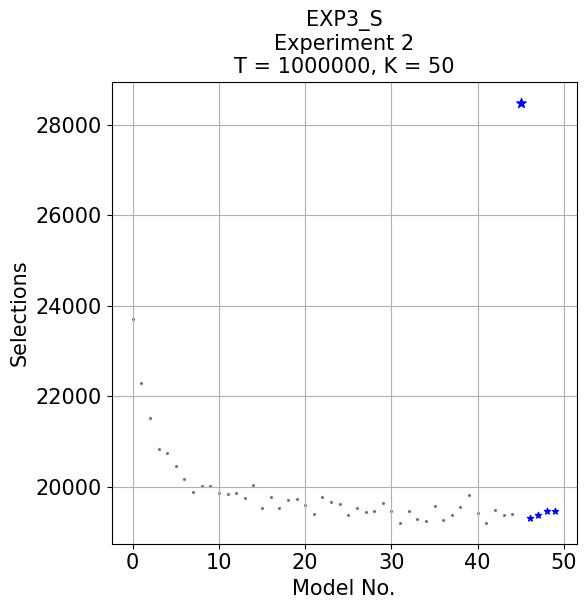

Optimal model recommended 1.000 times more often than sub-optimal models on average


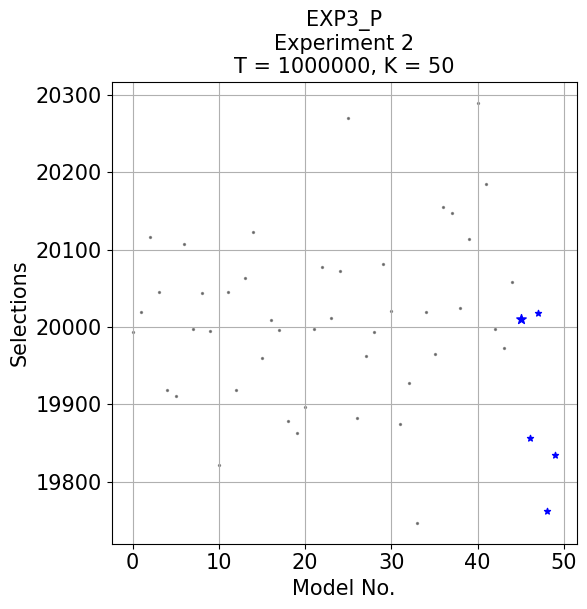

Optimal model recommended 1.397 times more often than sub-optimal models on average


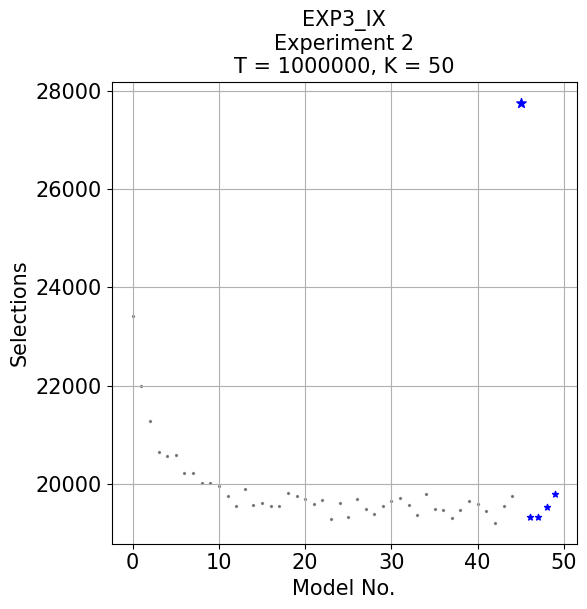

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.8341%
Pulls: [23967. 21896. 21574. 20857. 20939. 20066. 20227. 19741. 20079. 20066.
 20111. 20111. 19949. 19955. 19554. 19755. 19549. 19364. 19388. 19556.
 19602. 19846. 19600. 19516. 19474. 19625. 19428. 19428. 19728. 19589.
 19539. 19493. 19511. 19494. 19528. 19490. 19806. 19311. 19616. 19249.
 19533. 19341. 19201. 19360. 19340. 28342. 19254. 19523. 19239. 19340.]
Time: 48.3008s

EXP3_S
Optimal Pulls: 2.8484%
Pulls: [23707. 22298. 21517. 20845. 20743. 20449. 20179. 19876. 20026. 20022.
 19856. 19830. 19868. 19754. 20045. 19524. 19768. 19526. 19697. 19737.
 19600. 19395. 19769. 19663. 19624. 19376. 19538. 19442. 19470. 19641.
 19459. 19209. 19473. 19294. 19239. 19581. 19264. 19386. 19560. 19820.
 19416. 19206. 19481. 19377. 19401. 28485. 19304. 19384. 19469. 19457.]
Time: 50.7151s

EXP3_P
Optimal Pulls: 2.0009%
Pulls: [19994. 20019. 20117. 20045. 19919. 19911. 20107. 19997. 20044. 19995.
 19822. 20045. 19918. 20063. 20123. 19960. 20009. 19996. 19878. 19863.
 19897. 19998. 20077. 20012. 20072. 20270. 19883. 19962. 19993. 20081.
 20021. 19874. 19928. 19747. 20020. 19965. 20155. 20148. 20024. 20114.
 20290. 20185. 19997. 19973. 20058. 20010. 19856. 20018. 19762. 19835.]
Time: 50.3213s

EXP3_IX
Optimal Pulls: 2.7753%
Pulls: [23411. 22001. 21282. 20654. 20567. 20579. 20230. 20231. 20026. 20020.
 19965. 19755. 19555. 19895. 19565. 19621. 19544. 19560. 19811. 19746.
 19683. 19598. 19669. 19278. 19618. 19327. 19698. 19486. 19381. 19554.
 19642. 19703. 19572. 19362. 19802. 19494. 19476. 19304. 19460. 19646.
 19591. 19446. 19210. 19554. 19747. 27754. 19326. 19319. 19534. 19798.]
Time: 48.1252s


T = 1000000, K = 50, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.168 times more often than sub-optimal models on average


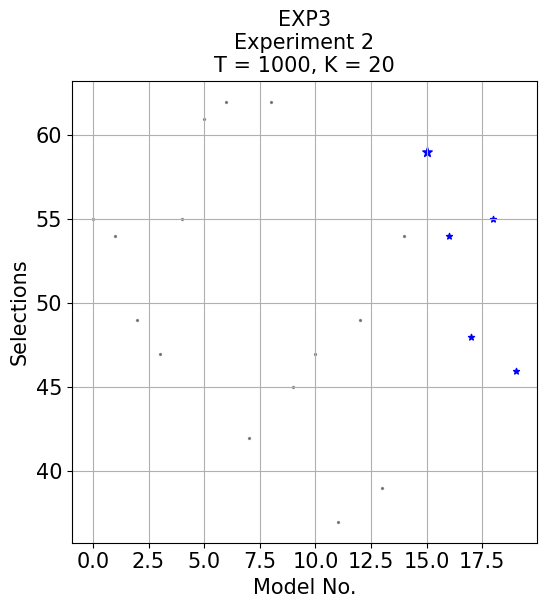

Optimal model recommended 1.018 times more often than sub-optimal models on average


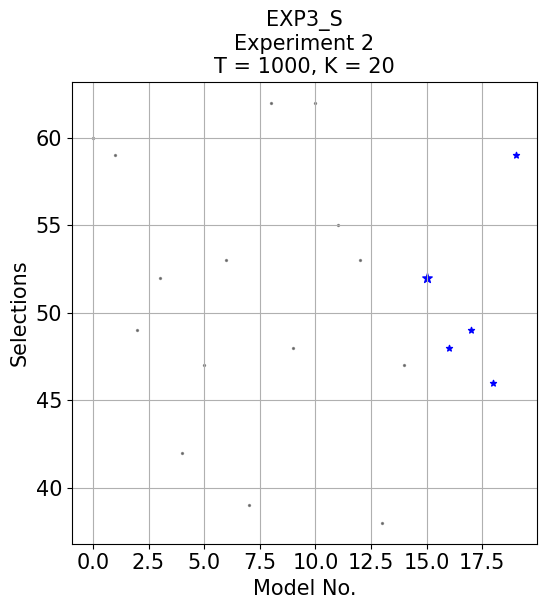

Optimal model recommended 1.149 times more often than sub-optimal models on average


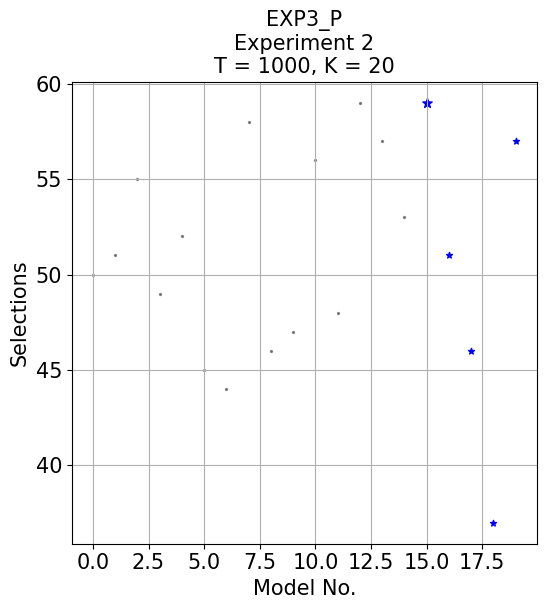

Optimal model recommended 0.821 times more often than sub-optimal models on average


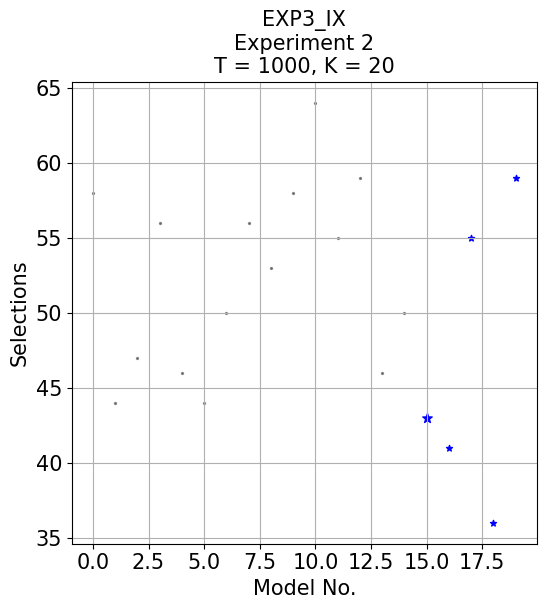

In [ ]:
input_string = '''EXP3
Optimal Pulls: 5.7843%
Pulls: [55. 54. 49. 47. 55. 61. 62. 42. 62. 45. 47. 37. 49. 39. 54. 59. 54. 48.
 55. 46.]
Time: 0.1431s

EXP3_S
Optimal Pulls: 5.0980%
Pulls: [60. 59. 49. 52. 42. 47. 53. 39. 62. 48. 62. 55. 53. 38. 47. 52. 48. 49.
 46. 59.]
Time: 0.1368s

EXP3_P
Optimal Pulls: 5.7843%
Pulls: [50. 51. 55. 49. 52. 45. 44. 58. 46. 47. 56. 48. 59. 57. 53. 59. 51. 46.
 37. 57.]
Time: 0.1521s

EXP3_IX
Optimal Pulls: 4.2157%
Pulls: [58. 44. 47. 56. 46. 44. 50. 56. 53. 58. 64. 55. 59. 46. 50. 43. 41. 55.
 36. 59.]
Time: 0.1372s


T = 1000, K = 20, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.114 times more often than sub-optimal models on average


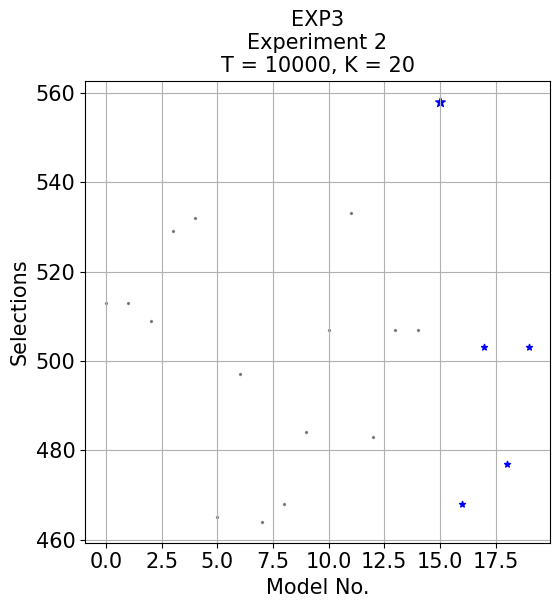

Optimal model recommended 0.990 times more often than sub-optimal models on average


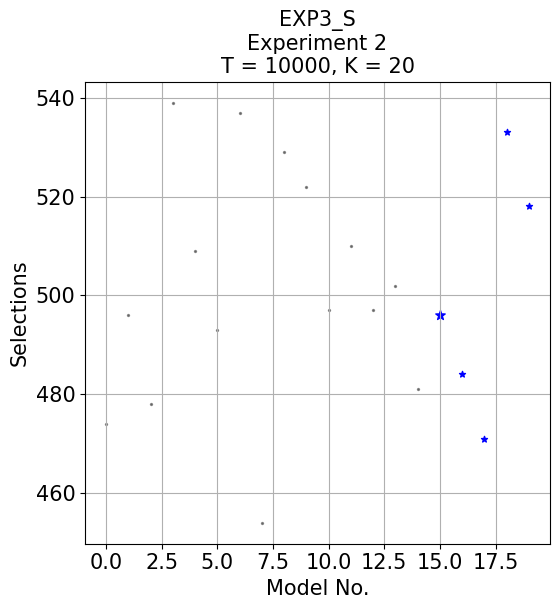

Optimal model recommended 1.083 times more often than sub-optimal models on average


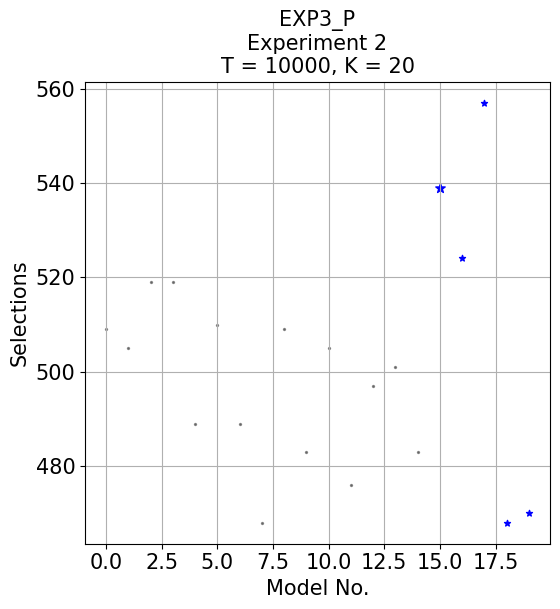

Optimal model recommended 1.082 times more often than sub-optimal models on average


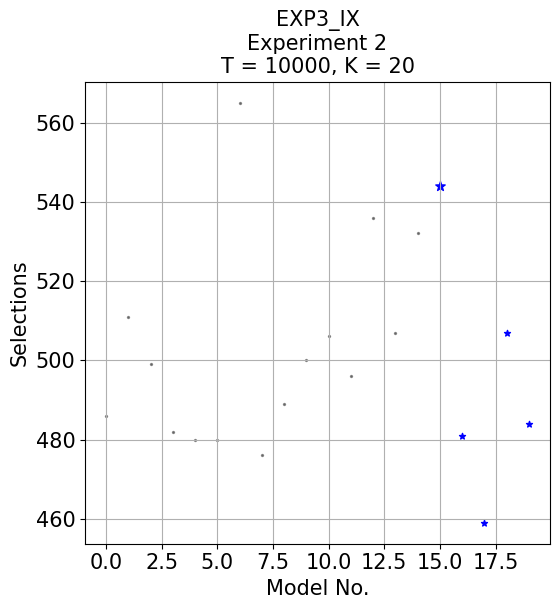

In [ ]:
input_string = '''EXP3
Optimal Pulls: 5.5689%
Pulls: [513. 513. 509. 529. 532. 465. 497. 464. 468. 484. 507. 533. 483. 507.
 507. 558. 468. 503. 477. 503.]
Time: 0.7038s

EXP3_S
Optimal Pulls: 4.9501%
Pulls: [474. 496. 478. 539. 509. 493. 537. 454. 529. 522. 497. 510. 497. 502.
 481. 496. 484. 471. 533. 518.]
Time: 0.8976s

EXP3_P
Optimal Pulls: 5.3792%
Pulls: [509. 505. 519. 519. 489. 510. 489. 468. 509. 483. 505. 476. 497. 501.
 483. 539. 524. 557. 468. 470.]
Time: 0.7683s

EXP3_IX
Optimal Pulls: 5.4291%
Pulls: [486. 511. 499. 482. 480. 480. 565. 476. 489. 500. 506. 496. 536. 507.
 532. 544. 481. 459. 507. 484.]
Time: 0.7332s


T = 10000, K = 20, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.339 times more often than sub-optimal models on average


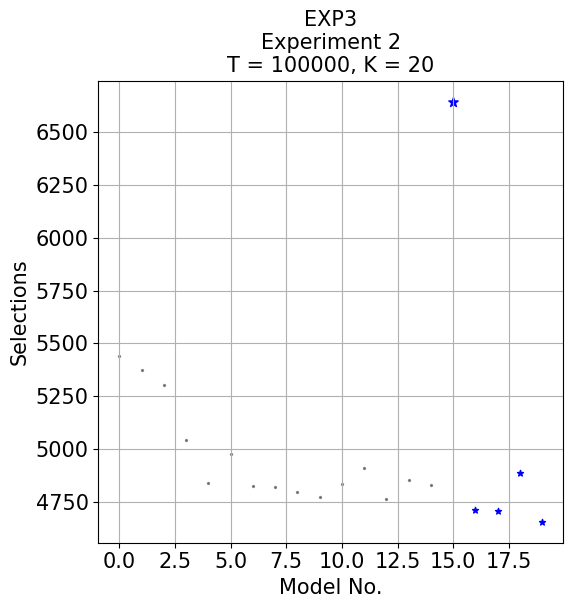

Optimal model recommended 1.304 times more often than sub-optimal models on average


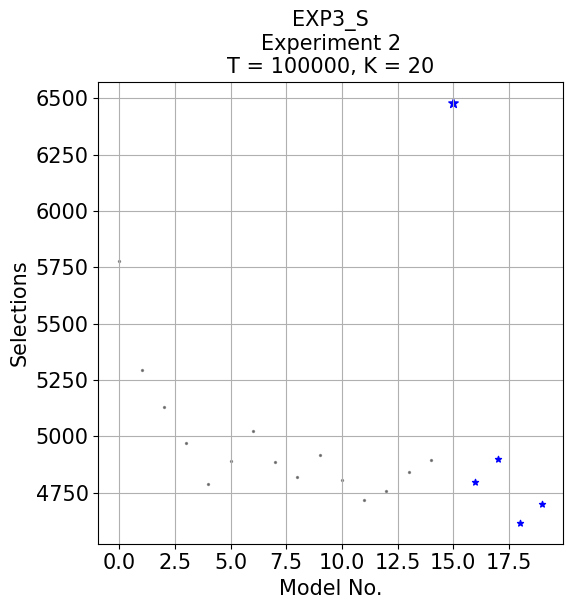

Optimal model recommended 1.005 times more often than sub-optimal models on average


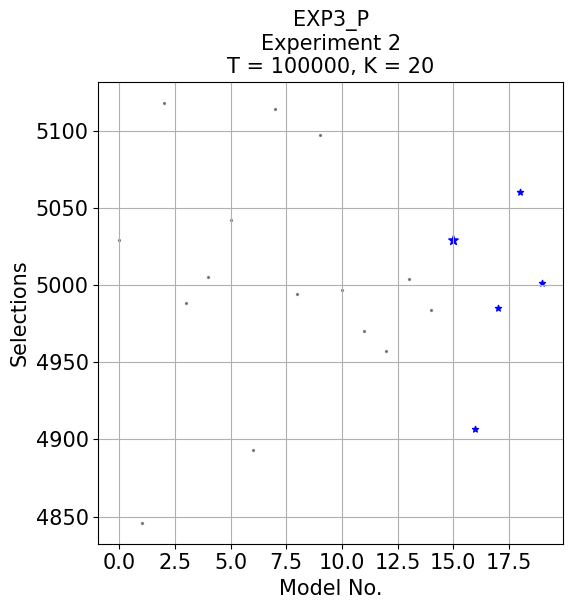

Optimal model recommended 1.309 times more often than sub-optimal models on average


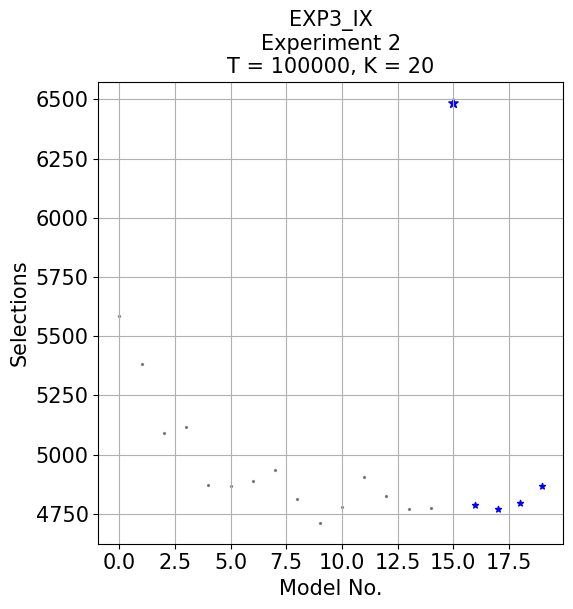

In [ ]:
input_string = '''EXP3
Optimal Pulls: 6.6407%
Pulls: [5439. 5374. 5303. 5045. 4841. 4980. 4827. 4823. 4799. 4776. 4834. 4914.
 4764. 4856. 4833. 6642. 4715. 4711. 4886. 4658.]
Time: 11.9080s

EXP3_S
Optimal Pulls: 6.4797%
Pulls: [5778. 5297. 5131. 4971. 4788. 4892. 5022. 4887. 4819. 4916. 4808. 4720.
 4758. 4841. 4896. 6481. 4798. 4898. 4617. 4702.]
Time: 6.3501s

EXP3_P
Optimal Pulls: 5.0280%
Pulls: [5029. 4846. 5118. 4988. 5005. 5042. 4893. 5114. 4994. 5097. 4997. 4970.
 4957. 5004. 4984. 5029. 4907. 4985. 5060. 5001.]
Time: 5.9997s

EXP3_IX
Optimal Pulls: 6.4847%
Pulls: [5584. 5382. 5090. 5117. 4873. 4869. 4889. 4936. 4811. 4712. 4777. 4907.
 4823. 4772. 4775. 6486. 4785. 4768. 4797. 4867.]
Time: 4.5659s


T = 100000, K = 20, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 2.354 times more often than sub-optimal models on average


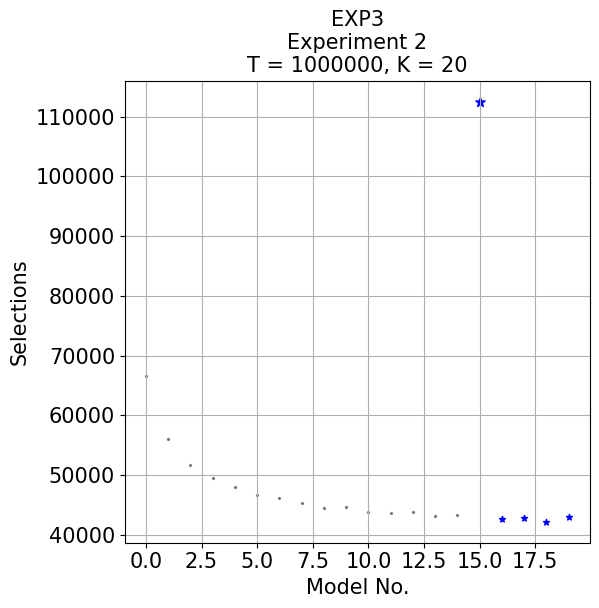

Optimal model recommended 2.350 times more often than sub-optimal models on average


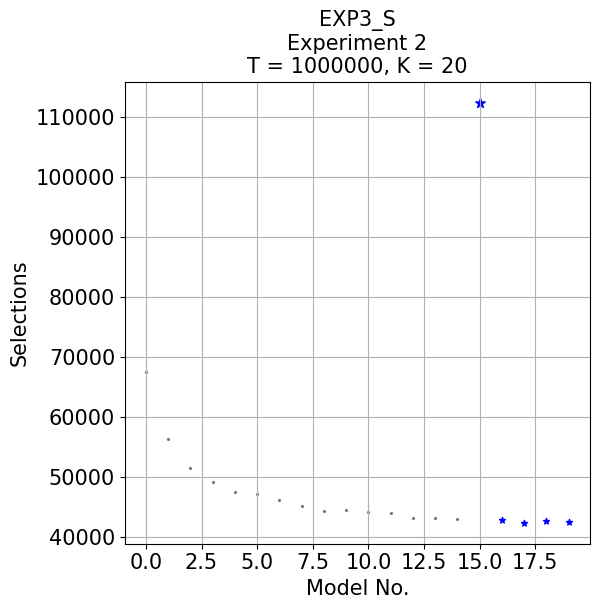

Optimal model recommended 0.998 times more often than sub-optimal models on average


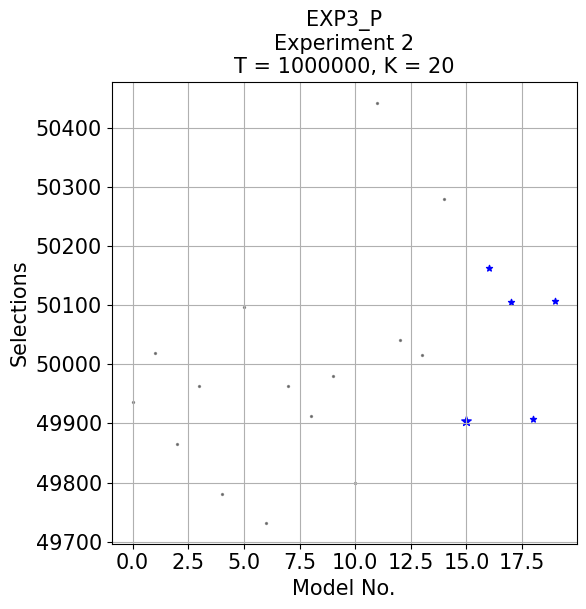

Optimal model recommended 2.256 times more often than sub-optimal models on average


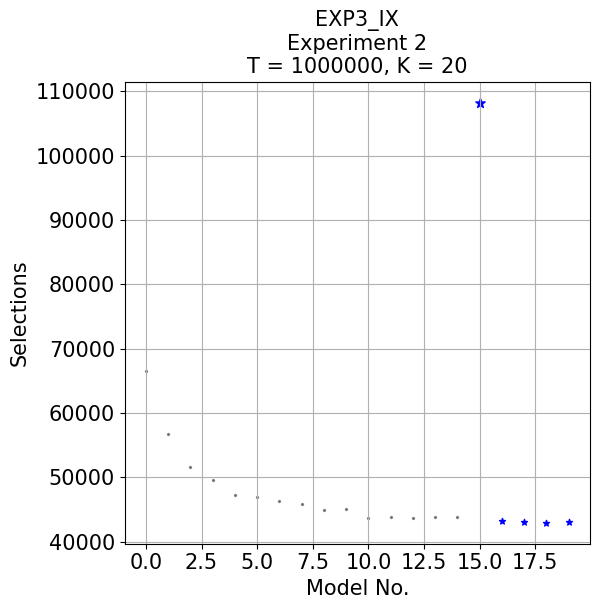

In [ ]:
input_string = '''EXP3
Optimal Pulls: 11.2497%
Pulls: [ 66537.  56111.  51695.  49473.  48031.  46626.  46167.  45333.  44435.
  44602.  43865.  43675.  43770.  43089.  43350. 112499.  42653.  42835.
  42206.  43068.]
Time: 54.2592s

EXP3_S
Optimal Pulls: 11.2361%
Pulls: [ 67460.  56325.  51526.  49269.  47449.  47133.  46228.  45142.  44377.
  44491.  44243.  44115.  43252.  43251.  42966. 112363.  42938.  42415.
  42622.  42455.]
Time: 49.8238s

EXP3_P
Optimal Pulls: 4.9903%
Pulls: [49937. 50020. 49865. 49963. 49781. 50097. 49732. 49963. 49913. 49980.
 49800. 50443. 50042. 50016. 50280. 49904. 50164. 50106. 49907. 50107.]
Time: 49.5127s

EXP3_IX
Optimal Pulls: 10.8210%
Pulls: [ 66495.  56671.  51656.  49571.  47307.  46977.  46327.  45802.  44927.
  44982.  43705.  43816.  43639.  43849.  43876. 108212.  43135.  43109.
  42924.  43040.]
Time: 47.6186s


T = 1000000, K = 20, Experiment: 2'''

PlotExpSelections(input_string)

Optimal model recommended 1.329 times more often than sub-optimal models on average


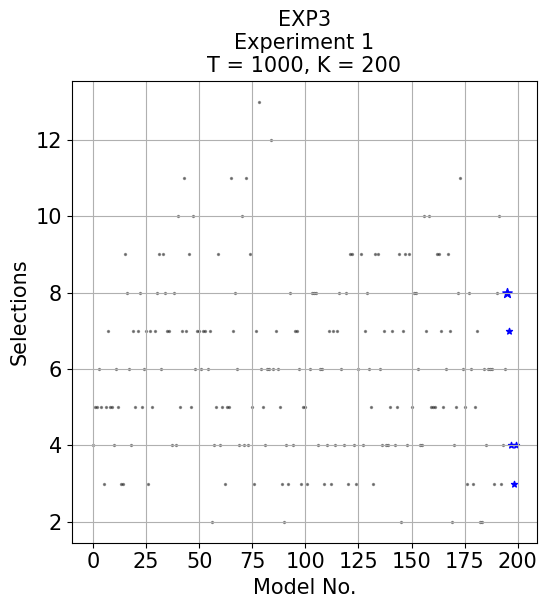

Optimal model recommended 1.330 times more often than sub-optimal models on average


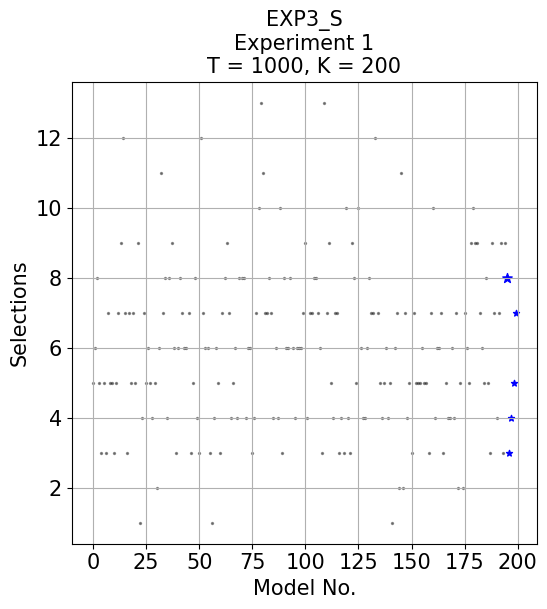

Optimal model recommended 1.678 times more often than sub-optimal models on average


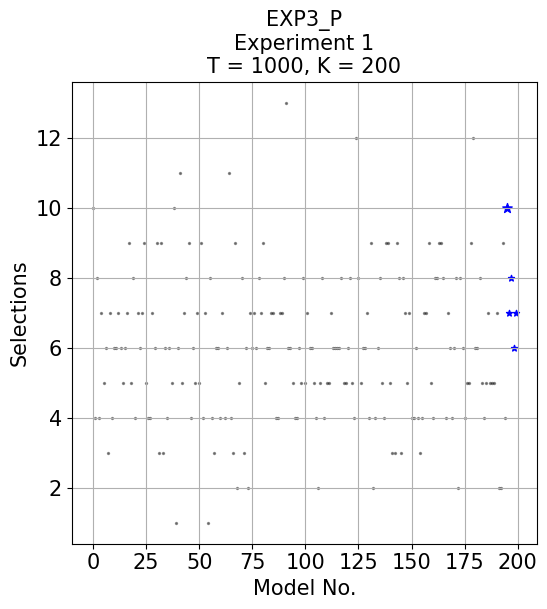

Optimal model recommended 1.163 times more often than sub-optimal models on average


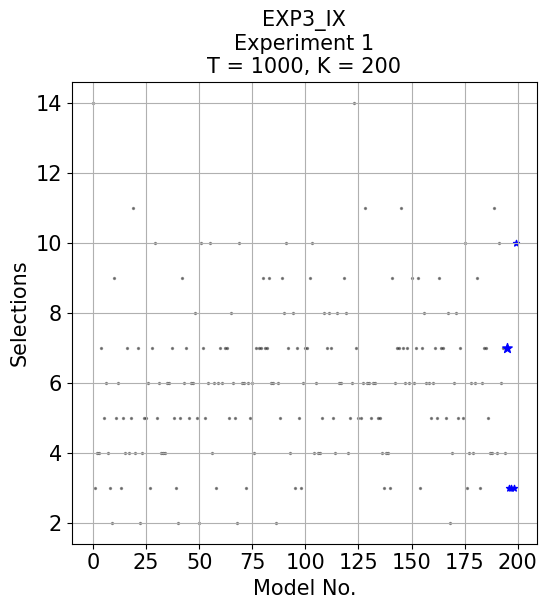

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.6667%
Pulls: [ 4.  5.  5.  6.  5.  3.  5.  7.  5.  5.  4.  6.  5.  3.  3.  9.  8.  6.
  4.  7.  5.  7.  8.  5.  6.  7.  3.  7.  5.  7.  8.  9.  6.  9.  8.  7.
  7.  4.  8.  4. 10.  5.  7. 11.  7.  9.  5. 10.  6.  7.  7.  6.  7.  7.
  6.  7.  2.  4.  5.  9.  4.  5.  3.  5.  5. 11.  7.  8.  6.  4. 10.  4.
 11.  4.  9.  5.  3.  7. 13.  6.  5.  4.  6.  6. 12.  6.  7.  6.  5.  3.
  2.  4.  3.  8.  4.  7.  7.  6.  3.  5.  5.  3.  6.  8.  8.  8.  4.  6.
  6.  3.  4.  7.  3.  7.  4.  7.  8.  6.  4.  8.  3.  9.  9.  4.  3.  6.
  9.  4.  7.  8.  6.  5.  3.  9.  9.  6.  4.  7.  4.  4.  5.  7.  4.  5.
  9.  2.  7.  9.  4.  9.  5.  8.  8.  6.  4.  4. 10.  7. 10.  5.  5.  5.
  9.  9.  7.  5.  6.  9.  7.  2.  4.  5.  8. 11.  6.  5.  3.  8.  6.  3.
  5.  7.  2.  2.  6.  4.  6.  6.  6.  3.  8. 10.  3.  4.  6.  8.  7.  4.
  3.  4.]
Time: 0.0784s

EXP3_S
Optimal Pulls: 0.6667%
Pulls: [ 5.  6.  8.  5.  3.  5.  3.  7.  5.  5.  3.  5.  7.  9. 12.  7.  3.  7.
  5.  7.  5.  9.  1.  4.  7.  5.  6.  5.  4.  5.  2.  6. 11.  7.  8.  4.
  8.  9.  6.  3.  6.  8.  7.  6.  6.  7.  3.  5.  8.  4.  3. 12.  7.  6.
  6.  3.  1.  4.  6.  5.  3.  7.  8.  9.  7.  4.  5.  6.  4.  8.  8.  8.
  4.  6.  6.  3.  4.  7. 10. 13. 11.  7.  7.  8.  7.  4.  6.  4. 10.  3.
  8.  6.  6.  8.  6.  4.  6.  6.  6.  7.  9.  4.  7.  7.  8.  8.  7.  6.
  3. 13.  7.  9.  5.  4.  7.  7.  3.  4.  3. 10.  4.  3.  9.  8.  5. 10.
  6.  4.  4.  6.  8.  7.  7. 12.  7.  5.  4.  5.  6.  4.  5.  1.  6.  7.
  2. 11.  2.  7.  4.  5.  3.  7.  5.  5.  5.  6.  5.  5.  3.  7. 10.  4.
  6.  6.  7.  3.  5.  4.  4.  6.  4.  7.  2.  5.  2.  7.  6.  5.  9. 10.
  9.  9.  7.  6.  5.  8.  5.  3.  9.  7.  4.  7.  9.  3.  9.  8.  3.  4.
  5.  7.]
Time: 0.0833s

EXP3_P
Optimal Pulls: 0.8333%
Pulls: [10.  4.  8.  4.  7.  5.  6.  3.  7.  4.  6.  6.  7.  6.  5.  6.  7.  9.
  5.  8.  4.  7.  6.  7.  9.  5.  4.  4.  7.  6.  9.  3.  9.  3.  6.  4.
  6.  5. 10.  1.  6. 11.  5.  7.  8.  9.  4.  6.  5.  7.  5.  9.  4.  7.
  1.  8.  4.  3.  6.  6.  4.  7.  4.  6. 11.  4.  3.  9.  2.  5.  8.  3.
  6.  2.  7.  6.  7.  6.  8.  7.  9.  5.  6.  6.  7.  7.  4.  4.  7.  7.
  8. 13.  6.  6.  5.  4.  4.  6.  5.  8.  5.  7.  6.  6.  5.  4.  2.  5.
  8.  4.  5.  5.  7.  6.  6.  6.  6.  8.  5.  5.  6.  8.  5.  4. 12.  8.
  5.  6.  6.  7.  4.  9.  2.  4.  6.  8.  5.  4.  9.  9.  5.  3.  3.  9.
  8.  3.  8.  7.  5.  7.  4.  4.  6.  4.  3.  4.  7.  7.  9.  5.  4.  8.
  8.  9.  9.  8.  4.  7.  6.  4.  6.  8.  2.  8.  6.  4.  5.  5.  9. 12.
  6.  6.  8.  5.  4.  5.  7.  5.  5.  5.  7.  2.  2.  9.  4. 10.  7.  8.
  6.  7.]
Time: 0.0968s

EXP3_IX
Optimal Pulls: 0.5833%
Pulls: [14.  3.  4.  4.  7.  5.  6.  4.  3.  2.  9.  5.  6.  3.  5.  4.  7.  4.
  5. 11.  4.  7.  2.  4.  5.  5.  6.  3.  7. 10.  5.  6.  4.  4.  4.  6.
  6.  7.  5.  3.  2.  5.  9.  6.  7.  5.  6.  6.  8.  5.  2. 10.  7.  5.
  6. 10.  4.  6.  3.  6.  7.  6.  7.  7.  5.  8.  6.  5.  2. 10.  6.  6.
  3.  6.  5.  6.  4.  7.  7.  7.  9.  7.  7.  9.  6.  6.  2.  6.  5.  9.
  8. 10.  7.  4.  8.  3.  7.  5.  3.  6.  7.  7.  9. 10.  4.  6.  4.  4.
  5.  8.  7.  8.  7.  5.  4.  8.  6.  6.  9.  8.  4.  5.  6. 14.  7.  5.
  5.  6. 11.  6.  6.  5.  6.  6.  5.  5.  4.  3.  4.  4.  3.  9.  6.  7.
  7. 11.  7.  6.  7.  6.  9.  6.  7.  9.  3.  7.  8.  6.  6.  5.  6.  7.
  5.  9.  7.  7.  5.  8.  2.  4.  6.  8.  5.  7.  5. 10.  3.  4.  6.  4.
  6.  9.  3.  6.  7.  7.  5.  4.  4. 11.  4. 10.  6.  7.  4.  7.  3.  3.
  3. 10.]
Time: 0.0873s


T = 1000, K = 200, Experiment: 1'''

PlotExpSelections(input_string)

Optimal model recommended 1.080 times more often than sub-optimal models on average


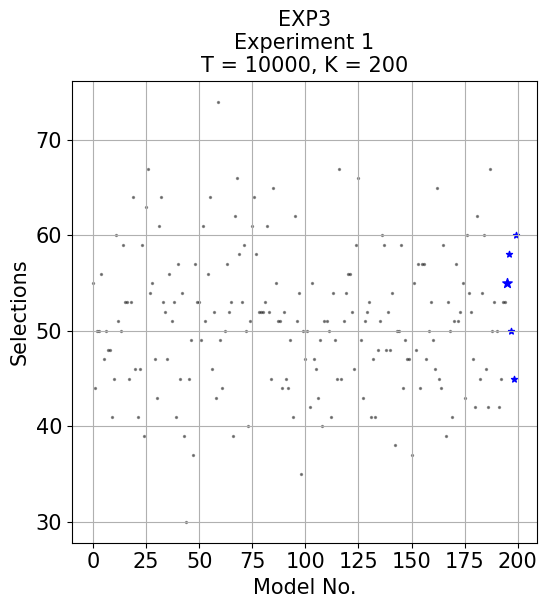

Optimal model recommended 1.020 times more often than sub-optimal models on average


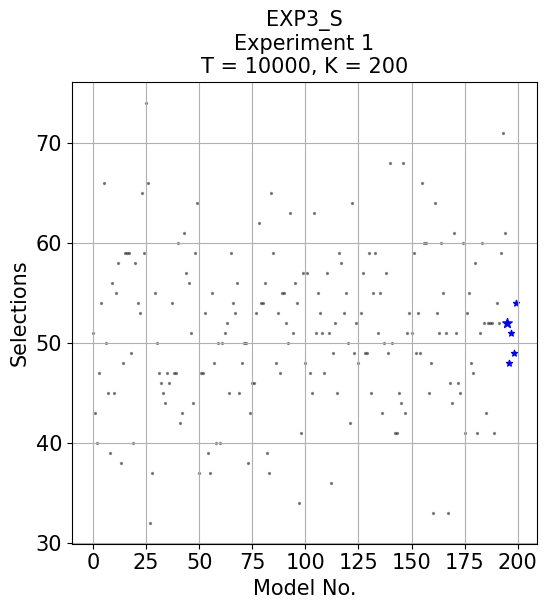

Optimal model recommended 0.999 times more often than sub-optimal models on average


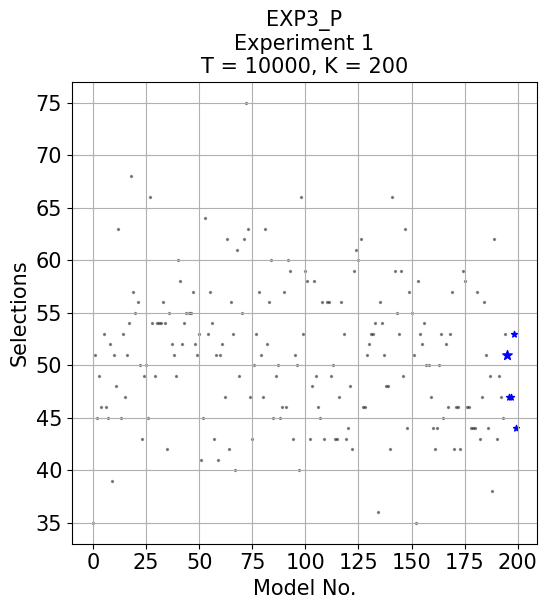

Optimal model recommended 1.156 times more often than sub-optimal models on average


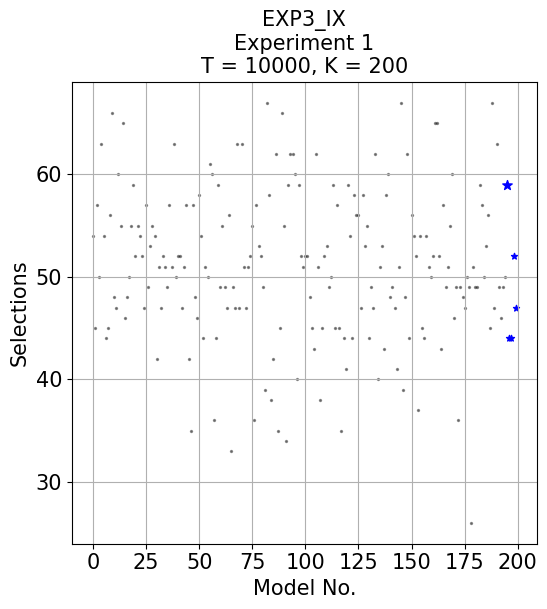

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5392%
Pulls: [55. 44. 50. 50. 56. 47. 50. 48. 48. 41. 45. 60. 51. 50. 59. 53. 53. 45.
 53. 64. 46. 41. 46. 59. 39. 63. 67. 54. 55. 47. 43. 61. 64. 53. 52. 47.
 56. 51. 53. 41. 57. 45. 54. 39. 30. 45. 49. 37. 57. 53. 53. 49. 61. 51.
 56. 64. 46. 52. 43. 74. 49. 44. 50. 57. 52. 53. 39. 62. 66. 58. 53. 59.
 50. 40. 51. 61. 64. 58. 52. 52. 52. 53. 61. 52. 45. 65. 55. 51. 51. 44.
 52. 45. 44. 49. 41. 62. 51. 54. 35. 50. 47. 50. 42. 55. 47. 46. 43. 49.
 40. 51. 51. 50. 41. 54. 49. 45. 67. 45. 51. 54. 56. 56. 52. 46. 59. 66.
 49. 43. 51. 52. 53. 41. 47. 41. 48. 51. 60. 59. 48. 52. 48. 54. 38. 50.
 50. 59. 44. 49. 47. 47. 37. 55. 48. 57. 44. 57. 57. 47. 50. 53. 49. 46.
 65. 45. 44. 59. 39. 53. 50. 41. 51. 57. 51. 52. 55. 43. 60. 54. 52. 47.
 42. 62. 45. 54. 60. 46. 42. 67. 50. 53. 50. 42. 45. 53. 53. 55. 58. 50.
 45. 60.]
Time: 0.7895s

EXP3_S
Optimal Pulls: 0.5098%
Pulls: [51. 43. 40. 47. 54. 66. 50. 45. 39. 56. 45. 55. 58. 38. 48. 59. 59. 59.
 49. 40. 58. 54. 53. 65. 59. 74. 66. 32. 37. 55. 50. 47. 46. 45. 44. 47.
 46. 54. 47. 47. 60. 42. 43. 61. 57. 56. 51. 44. 59. 64. 37. 47. 47. 53.
 39. 37. 55. 48. 40. 50. 40. 50. 51. 52. 45. 59. 54. 53. 56. 45. 48. 50.
 50. 38. 43. 46. 46. 53. 62. 54. 54. 56. 39. 37. 65. 59. 48. 53. 47. 55.
 55. 52. 50. 63. 51. 56. 54. 34. 41. 57. 48. 57. 47. 45. 63. 51. 55. 53.
 51. 47. 57. 51. 36. 49. 52. 45. 59. 58. 53. 55. 50. 42. 64. 49. 52. 48.
 53. 57. 49. 49. 59. 45. 55. 59. 51. 55. 43. 50. 57. 49. 68. 50. 41. 41.
 45. 44. 68. 43. 51. 53. 51. 59. 49. 53. 49. 66. 60. 60. 45. 48. 33. 64.
 53. 51. 60. 55. 51. 33. 46. 44. 61. 51. 46. 45. 60. 41. 53. 55. 48. 47.
 58. 41. 51. 60. 52. 43. 52. 52. 52. 41. 54. 52. 59. 71. 61. 52. 48. 51.
 49. 54.]
Time: 0.8455s

EXP3_P
Optimal Pulls: 0.5000%
Pulls: [35. 51. 45. 49. 46. 53. 46. 45. 52. 39. 51. 48. 63. 45. 53. 47. 51. 54.
 68. 57. 55. 56. 50. 43. 49. 50. 45. 66. 54. 49. 54. 54. 54. 56. 54. 42.
 55. 52. 51. 49. 60. 58. 52. 54. 55. 55. 55. 57. 52. 51. 53. 41. 45. 64.
 53. 57. 54. 43. 51. 41. 51. 52. 47. 62. 42. 56. 53. 40. 61. 49. 55. 62.
 75. 63. 47. 43. 50. 53. 57. 51. 47. 63. 52. 56. 60. 45. 49. 50. 45. 46.
 57. 46. 60. 59. 43. 51. 50. 40. 66. 53. 59. 58. 43. 48. 58. 49. 46. 45.
 56. 43. 56. 56. 49. 50. 43. 43. 47. 56. 53. 43. 44. 48. 42. 59. 61. 60.
 62. 46. 46. 51. 52. 53. 53. 54. 36. 56. 54. 51. 48. 48. 42. 66. 59. 55.
 53. 59. 49. 63. 44. 57. 55. 51. 35. 58. 53. 52. 54. 50. 50. 47. 44. 42.
 44. 50. 53. 45. 52. 46. 53. 57. 42. 46. 46. 42. 59. 58. 46. 46. 44. 44.
 44. 57. 43. 47. 56. 51. 44. 49. 38. 62. 43. 49. 47. 45. 53. 51. 47. 47.
 53. 44.]
Time: 0.8293s

EXP3_IX
Optimal Pulls: 0.5784%
Pulls: [54. 45. 57. 50. 63. 54. 44. 45. 56. 66. 48. 47. 60. 55. 65. 46. 48. 50.
 55. 59. 52. 55. 54. 52. 47. 57. 49. 53. 55. 54. 42. 51. 47. 52. 51. 49.
 57. 51. 63. 50. 52. 52. 47. 51. 57. 42. 35. 57. 48. 46. 58. 54. 44. 51.
 50. 61. 60. 36. 44. 59. 49. 55. 49. 47. 56. 33. 49. 47. 63. 47. 63. 51.
 47. 51. 52. 55. 36. 57. 53. 52. 49. 39. 67. 58. 38. 42. 62. 35. 45. 66.
 55. 34. 59. 62. 62. 60. 40. 59. 52. 51. 52. 52. 48. 45. 43. 62. 51. 38.
 45. 52. 53. 49. 50. 59. 45. 57. 45. 35. 44. 41. 59. 54. 44. 58. 56. 56.
 47. 58. 53. 55. 44. 49. 47. 62. 40. 51. 53. 43. 58. 60. 48. 49. 47. 41.
 51. 67. 39. 48. 62. 44. 56. 54. 52. 37. 54. 45. 44. 54. 51. 50. 52. 65.
 65. 52. 43. 57. 49. 51. 55. 60. 46. 49. 36. 49. 48. 47. 50. 49. 26. 51.
 49. 49. 59. 57. 50. 53. 56. 45. 67. 47. 63. 49. 46. 49. 50. 59. 44. 44.
 52. 47.]
Time: 0.8186s


T = 10000, K = 200, Experiment: 1'''

PlotExpSelections(input_string)

Optimal model recommended 1.047 times more often than sub-optimal models on average


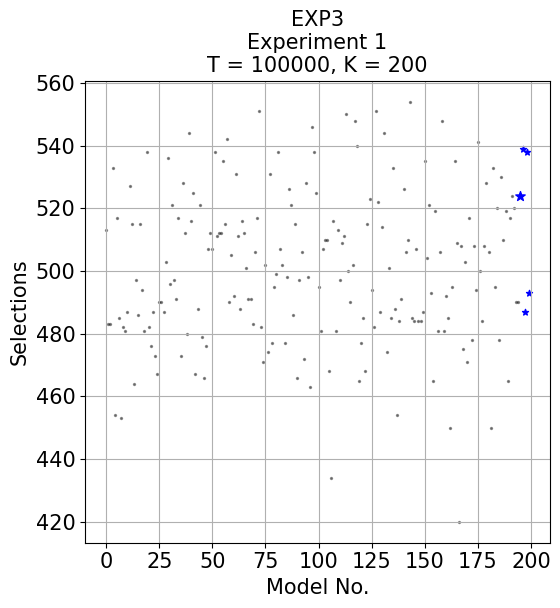

Optimal model recommended 1.082 times more often than sub-optimal models on average


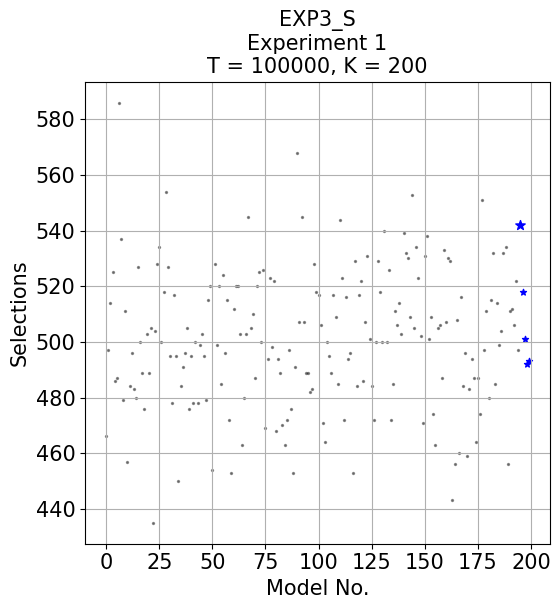

Optimal model recommended 1.020 times more often than sub-optimal models on average


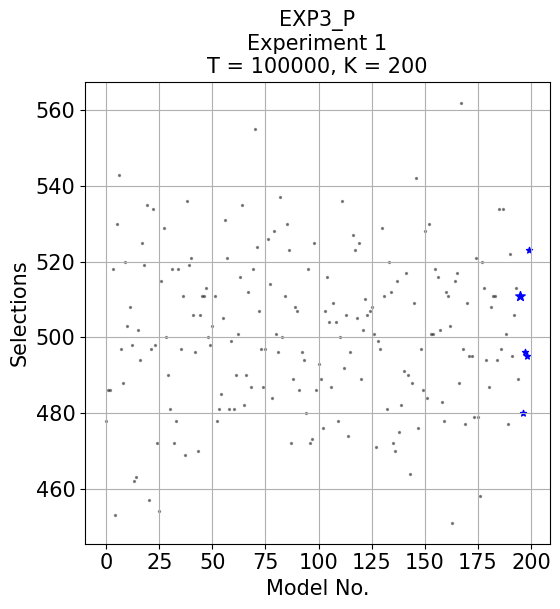

Optimal model recommended 1.026 times more often than sub-optimal models on average


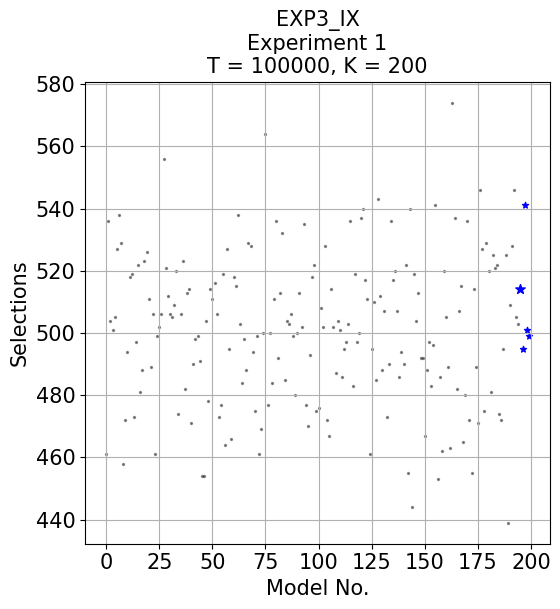

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5230%
Pulls: [513. 483. 483. 533. 454. 517. 485. 453. 482. 481. 487. 527. 515. 464.
 497. 486. 515. 494. 481. 538. 482. 476. 487. 473. 467. 490. 490. 487.
 503. 536. 496. 521. 497. 491. 517. 473. 528. 512. 480. 544. 516. 525.
 467. 488. 521. 479. 466. 476. 507. 512. 507. 538. 511. 512. 512. 535.
 515. 542. 490. 505. 492. 531. 511. 488. 516. 512. 501. 491. 491. 483.
 506. 517. 551. 482. 471. 502. 474. 531. 477. 495. 499. 538. 507. 502.
 477. 498. 526. 521. 486. 515. 466. 497. 506. 472. 528. 498. 463. 546.
 538. 525. 495. 481. 507. 510. 510. 468. 434. 516. 481. 513. 497. 509.
 511. 550. 500. 490. 502. 548. 540. 465. 477. 485. 468. 515. 523. 494.
 482. 551. 522. 487. 514. 544. 474. 501. 485. 533. 488. 454. 484. 491.
 526. 506. 510. 554. 485. 484. 507. 484. 484. 487. 535. 504. 521. 493.
 465. 519. 481. 506. 548. 481. 492. 485. 450. 495. 535. 509. 420. 508.
 475. 503. 471. 517. 478. 508. 494. 541. 500. 484. 508. 528. 506. 450.
 533. 495. 520. 478. 530. 510. 519. 465. 517. 524. 520. 490. 490. 524.
 539. 487. 538. 493.]
Time: 6.5633s

EXP3_S
Optimal Pulls: 0.5409%
Pulls: [466. 497. 514. 525. 486. 487. 586. 537. 479. 511. 457. 484. 496. 483.
 480. 527. 500. 489. 476. 503. 489. 505. 435. 504. 528. 534. 500. 518.
 554. 527. 495. 478. 517. 495. 450. 484. 491. 496. 505. 476. 495. 478.
 500. 478. 499. 503. 495. 479. 515. 520. 454. 528. 499. 520. 485. 524.
 496. 515. 472. 453. 512. 520. 520. 503. 463. 480. 503. 545. 505. 510.
 487. 520. 525. 500. 526. 469. 494. 523. 498. 522. 468. 494. 489. 470.
 463. 472. 497. 476. 453. 491. 568. 507. 545. 507. 489. 489. 482. 483.
 528. 518. 517. 506. 471. 464. 500. 495. 489. 517. 509. 485. 544. 523.
 472. 516. 494. 496. 453. 529. 484. 517. 522. 486. 507. 531. 501. 484.
 472. 500. 529. 518. 500. 540. 500. 526. 472. 485. 511. 506. 514. 503.
 539. 532. 530. 509. 553. 505. 534. 523. 502. 471. 531. 538. 501. 509.
 474. 463. 505. 506. 487. 533. 507. 530. 529. 443. 456. 508. 460. 516.
 484. 496. 459. 483. 494. 487. 464. 487. 474. 551. 497. 511. 480. 515.
 532. 485. 514. 499. 504. 532. 534. 456. 511. 512. 506. 522. 497. 542.
 518. 501. 492. 493.]
Time: 5.7094s

EXP3_P
Optimal Pulls: 0.5100%
Pulls: [478. 486. 486. 518. 453. 530. 543. 497. 488. 520. 503. 508. 498. 462.
 463. 502. 494. 525. 519. 535. 457. 497. 534. 498. 472. 454. 515. 529.
 500. 490. 481. 518. 472. 478. 518. 497. 511. 469. 536. 519. 521. 506.
 496. 470. 506. 511. 511. 513. 500. 498. 503. 511. 478. 481. 485. 505.
 531. 521. 481. 499. 481. 490. 501. 516. 535. 482. 490. 512. 487. 518.
 555. 524. 507. 497. 487. 497. 526. 514. 484. 528. 501. 496. 537. 500.
 511. 530. 523. 472. 489. 508. 507. 486. 496. 494. 480. 518. 472. 473.
 525. 486. 493. 489. 476. 507. 516. 504. 487. 509. 504. 478. 500. 536.
 492. 506. 474. 496. 527. 523. 505. 525. 489. 502. 510. 506. 507. 508.
 501. 471. 499. 497. 529. 511. 481. 520. 512. 472. 470. 515. 475. 482.
 491. 517. 490. 464. 488. 509. 542. 476. 497. 486. 528. 484. 530. 501.
 501. 518. 516. 502. 483. 478. 512. 511. 503. 451. 515. 517. 488. 562.
 497. 477. 509. 495. 495. 479. 521. 479. 458. 520. 513. 494. 487. 508.
 511. 511. 494. 534. 497. 534. 501. 477. 522. 495. 506. 513. 489. 511.
 480. 496. 495. 523.]
Time: 6.4366s

EXP3_IX
Optimal Pulls: 0.5130%
Pulls: [461. 536. 504. 501. 505. 527. 538. 529. 458. 472. 494. 518. 519. 473.
 497. 522. 481. 488. 523. 526. 511. 489. 506. 461. 499. 502. 506. 556.
 521. 512. 506. 505. 509. 520. 474. 506. 523. 482. 513. 514. 471. 490.
 498. 499. 491. 454. 454. 504. 478. 514. 511. 516. 506. 473. 477. 519.
 464. 527. 495. 466. 518. 515. 538. 503. 484. 498. 488. 529. 528. 494.
 475. 499. 461. 469. 500. 564. 477. 500. 484. 511. 536. 492. 513. 532.
 485. 504. 503. 506. 499. 480. 500. 513. 502. 535. 477. 470. 493. 518.
 522. 475. 476. 508. 502. 528. 472. 467. 514. 502. 487. 504. 501. 486.
 495. 497. 503. 536. 483. 519. 497. 500. 537. 540. 517. 511. 461. 495.
 510. 485. 543. 512. 488. 507. 473. 490. 536. 517. 520. 507. 486. 494.
 490. 522. 455. 540. 444. 519. 504. 513. 492. 492. 467. 488. 497. 483.
 496. 541. 453. 486. 462. 520. 505. 489. 463. 574. 537. 482. 507. 515.
 465. 480. 536. 472. 455. 514. 489. 471. 546. 527. 475. 529. 520. 481.
 525. 521. 522. 474. 472. 495. 525. 439. 509. 528. 546. 505. 503. 514.
 495. 541. 501. 499.]
Time: 5.3625s


T = 100000, K = 200, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.130 times more often than sub-optimal models on average


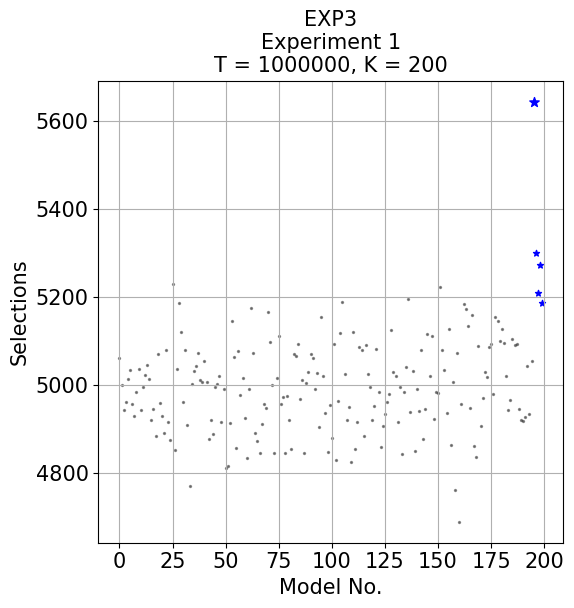

Optimal model recommended 1.101 times more often than sub-optimal models on average


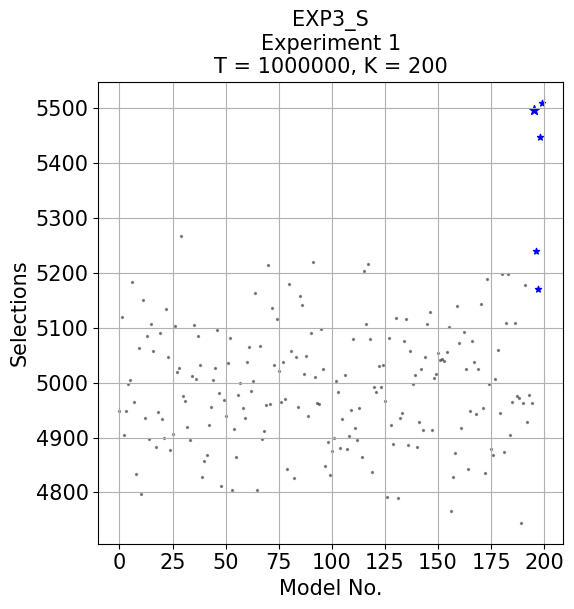

Optimal model recommended 0.993 times more often than sub-optimal models on average


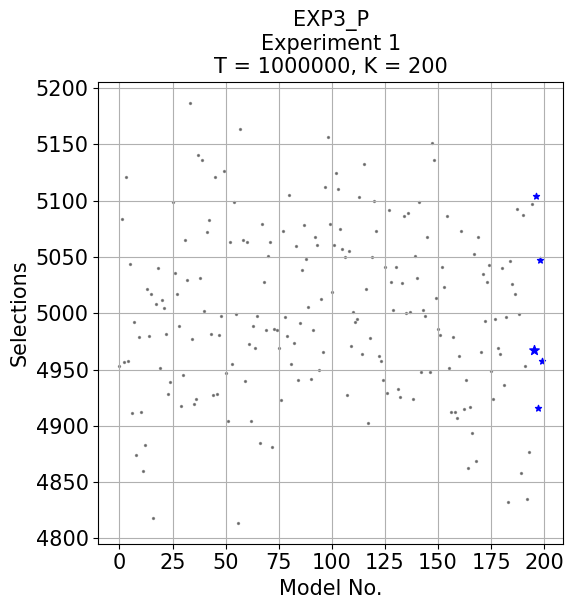

Optimal model recommended 1.077 times more often than sub-optimal models on average


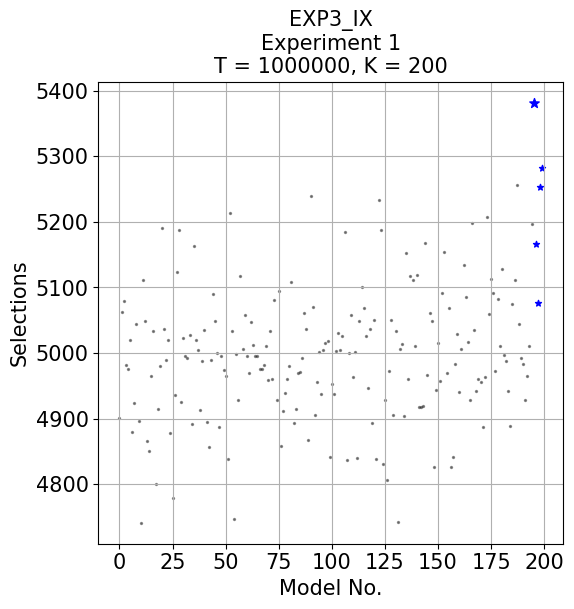

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5643%
Pulls: [5062. 5000. 4944. 4962. 5014. 5034. 4957. 4930. 4984. 5036. 4943. 4997.
 5023. 5047. 5014. 4920. 4945. 4885. 5072. 4960. 4931. 4891. 5080. 4917.
 4875. 5231. 4852. 5036. 5186. 5122. 4962. 5079. 4910. 4771. 5002. 5033.
 5044. 5073. 5012. 5007. 5054. 5007. 4879. 4921. 4890. 4995. 5002. 5020.
 4916. 4992. 4813. 4816. 4914. 5146. 5064. 4858. 5078. 4977. 5017. 4926.
 4835. 4991. 5175. 5073. 4891. 4874. 4847. 4913. 4958. 4948. 5166. 5098.
 5000. 4847. 5016. 5111. 4957. 4973. 4845. 4975. 4922. 4855. 5071. 5067.
 5093. 4968. 5011. 4846. 5006. 5030. 5071. 5062. 4992. 5027. 4905. 5155.
 5021. 4937. 4848. 4955. 4881. 5094. 4831. 4964. 5119. 5189. 5025. 4921.
 4950. 4826. 5122. 4856. 4917. 5087. 5080. 4885. 5091. 5026. 4997. 4920.
 4953. 5083. 4984. 4859. 4908. 4935. 4961. 4979. 5125. 5031. 5022. 4917.
 4997. 4844. 4984. 5042. 5196. 4940. 5032. 4851. 4991. 4942. 5081. 4877.
 4947. 5117. 5022. 5111. 4924. 4985. 4982. 5224. 5079. 5034. 4938. 5128.
 4864. 5008. 4761. 5073. 4690. 4958. 5184. 5173. 5134. 4949. 5160. 4861.
 4837. 5090. 4907. 4971. 5029. 5018. 5087. 5094. 4980. 5154. 5145. 5101.
 5128. 5096. 5020. 4943. 4967. 5106. 5091. 5094. 4946. 4921. 4919. 4927.
 5044. 4934. 5054. 5644. 5300. 5209. 5273. 5187.]
Time: 55.8969s

EXP3_S
Optimal Pulls: 0.5494%
Pulls: [4948. 5119. 4904. 4949. 4997. 5004. 5183. 4964. 4833. 5063. 4798. 5151.
 4936. 5085. 4897. 5107. 5057. 4882. 4947. 5091. 4934. 4899. 5134. 5046.
 4877. 4907. 5102. 5019. 5027. 5266. 4976. 4967. 4919. 4896. 5011. 5105.
 5007. 5085. 5031. 4828. 4857. 4869. 4922. 4956. 5005. 5027. 5095. 4981.
 4812. 4969. 4940. 5036. 5081. 4805. 4916. 4865. 4977. 4999. 4954. 4935.
 5038. 5064. 4985. 5002. 5162. 4805. 5066. 4898. 4911. 4960. 5214. 4961.
 5135. 5031. 5115. 5021. 4964. 5038. 4970. 4843. 5180. 5058. 4826. 5047.
 4955. 5157. 5141. 5016. 5049. 4939. 5090. 5220. 5010. 4962. 4961. 5098.
 5024. 4848. 4892. 4832. 4876. 4899. 5002. 4982. 4881. 4934. 5013. 4879.
 4902. 4950. 5079. 4918. 4895. 4953. 4864. 5203. 5107. 5215. 5080. 4838.
 4991. 4982. 5030. 4992. 5032. 4967. 4791. 5081. 4923. 4888. 5118. 4790.
 4936. 4945. 5076. 5115. 4886. 5057. 4997. 5014. 4883. 4928. 5025. 4914.
 5047. 5107. 5129. 4914. 5008. 5016. 5054. 5041. 5042. 5039. 5055. 5101.
 4767. 4828. 4871. 5139. 5072. 4917. 5092. 5025. 4843. 4949. 5075. 5037.
 4943. 5025. 5143. 4954. 4836. 5188. 4998. 4879. 4868. 5006. 5060. 4944.
 5197. 4874. 5108. 5197. 4905. 4965. 5108. 4976. 4972. 4745. 4963. 5178.
 4929. 4977. 4962. 5495. 5240. 5171. 5446. 5509.]
Time: 61.1381s

EXP3_P
Optimal Pulls: 0.4966%
Pulls: [4953. 5084. 4957. 5121. 4958. 5044. 4911. 4992. 4874. 4979. 4912. 4860.
 4883. 5022. 4980. 5017. 4818. 5008. 5040. 4951. 5012. 5005. 4982. 4928.
 4939. 5099. 5036. 5017. 4989. 4918. 4945. 5065. 5030. 5187. 4977. 4919.
 4924. 5141. 5031. 5136. 5002. 5072. 5083. 4982. 4927. 5121. 4928. 4981.
 4998. 5126. 4947. 4904. 5063. 4955. 5099. 4999. 4814. 5164. 5065. 4940.
 5063. 4973. 4904. 4989. 4969. 4998. 4885. 5079. 5028. 4985. 5051. 5063.
 4881. 4986. 4985. 4969. 4923. 5073. 4997. 4980. 5105. 4955. 4974. 5060.
 4941. 4991. 5038. 5078. 5048. 5006. 4942. 4985. 5068. 5061. 4950. 5013.
 4966. 5112. 5157. 5079. 5019. 5061. 5125. 5110. 5075. 5057. 5050. 4927.
 5055. 4971. 5001. 4992. 4995. 5103. 4964. 5133. 5022. 4903. 4978. 5050.
 5100. 5073. 4962. 4958. 4941. 5041. 4929. 5092. 5028. 5003. 5041. 4933.
 4926. 5027. 5086. 5000. 5089. 5001. 4924. 5051. 5031. 5099. 4948. 5003.
 4998. 5068. 4948. 5151. 5136. 5014. 4986. 4981. 5041. 5023. 5086. 4951.
 4912. 4979. 4912. 4907. 4962. 5073. 4915. 4941. 4863. 4917. 4894. 5053.
 4869. 5068. 4966. 5035. 4993. 5028. 5043. 4949. 4924. 4995. 4969. 4964.
 5040. 4936. 4997. 4832. 5046. 5026. 5017. 5093. 4999. 4858. 5087. 4953.
 4835. 4877. 5097. 4967. 5104. 4916. 5047. 4958.]
Time: 60.9584s

EXP3_IX
Optimal Pulls: 0.5381%
Pulls: [4901. 5062. 5080. 4981. 4975. 5020. 4879. 4924. 5045. 4896. 4741. 5112.
 5049. 4866. 4850. 4965. 5033. 4800. 4914. 4980. 5191. 5036. 4990. 5020.
 4878. 4779. 4936. 5123. 5188. 4926. 5023. 4995. 4992. 5028. 4892. 5164.
 5020. 5004. 4913. 4988. 5035. 4895. 4856. 4989. 5090. 5049. 5000. 4887.
 4996. 4974. 4965. 4838. 5213. 5034. 4746. 4998. 4928. 5117. 5006. 5058.
 4995. 4970. 5047. 5012. 4995. 4996. 4975. 4975. 4982. 5011. 4959. 5033.
 4961. 5081. 4929. 5094. 4858. 4912. 4939. 4961. 4980. 5108. 4893. 4915.
 4969. 4971. 4993. 5061. 5037. 4867. 5240. 5070. 4906. 4956. 5001. 4937.
 5004. 5015. 5019. 4842. 4952. 4937. 5003. 5031. 5004. 5026. 5184. 4837.
 5000. 5058. 4963. 5002. 4840. 5049. 5101. 5068. 5026. 4946. 5036. 4893.
 5051. 4839. 5233. 5188. 4830. 4929. 4806. 4973. 5050. 4906. 5033. 4742.
 5006. 5014. 4904. 5153. 4960. 5117. 5111. 5011. 5119. 4918. 4918. 4919.
 5168. 4967. 5061. 5049. 4826. 4944. 5015. 4957. 5092. 5154. 4970. 5068.
 4826. 4841. 4984. 5029. 4941. 5006. 5134. 5085. 5017. 4928. 5199. 5035.
 4942. 4961. 4956. 4887. 4963. 5208. 5059. 5113. 5091. 4973. 5082. 5010.
 5128. 4997. 4988. 4942. 4889. 5075. 5112. 5256. 5044. 4992. 4984. 4929.
 4965. 5011. 5197. 5382. 5166. 5077. 5254. 5283.]
Time: 58.3465s


T = 1000000, K = 200, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 0.812 times more often than sub-optimal models on average


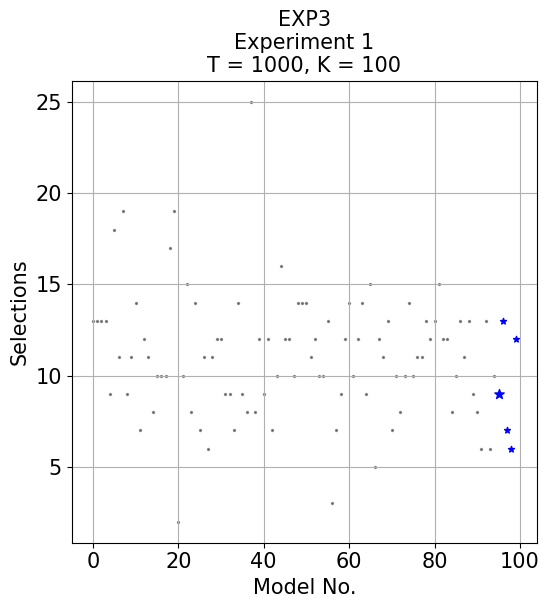

Optimal model recommended 1.199 times more often than sub-optimal models on average


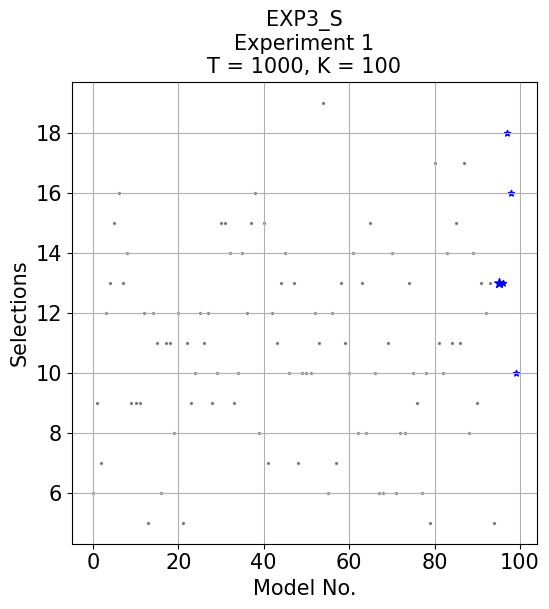

Optimal model recommended 1.467 times more often than sub-optimal models on average


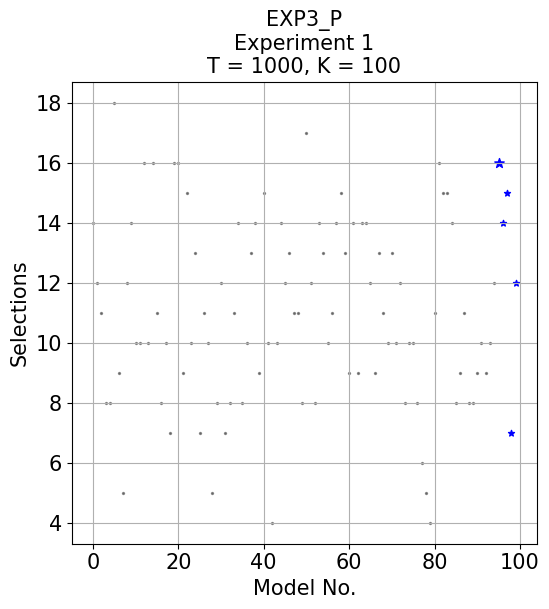

Optimal model recommended 0.633 times more often than sub-optimal models on average


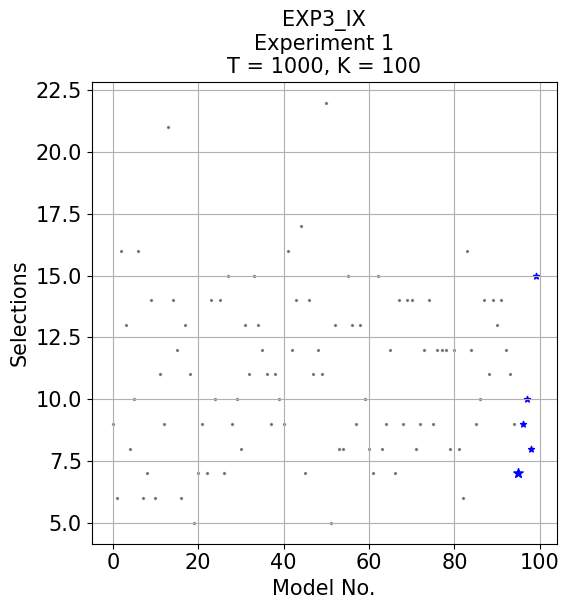

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.8182%
Pulls: [13. 13. 13. 13.  9. 18. 11. 19.  9. 11. 14.  7. 12. 11.  8. 10. 10. 10.
 17. 19.  2. 10. 15.  8. 14.  7. 11.  6. 11. 12. 12.  9.  9.  7. 14.  9.
  8. 25.  8. 12.  9. 12.  7. 10. 16. 12. 12. 10. 14. 14. 14. 11. 12. 10.
 10. 13.  3.  7.  9. 12. 14. 10. 12. 14.  9. 15.  5. 12. 11. 13.  7. 10.
  8. 10. 14. 10. 11. 11. 13. 12. 13. 15. 12. 12.  8. 10. 13. 11. 13.  9.
  8.  6. 13.  6. 10.  9. 13.  7.  6. 12.]
Time: 0.1122s

EXP3_S
Optimal Pulls: 1.1818%
Pulls: [ 6.  9.  7. 12. 13. 15. 16. 13. 14.  9.  9.  9. 12.  5. 12. 11.  6. 11.
 11.  8. 12.  5. 11.  9. 10. 12. 11. 12.  9. 10. 15. 15. 14.  9. 10. 14.
 12. 15. 16.  8. 15.  7. 12. 11. 13. 14. 10. 13.  7. 10. 10. 10. 12. 11.
 19.  6. 12.  7. 13. 11. 10. 14.  8. 13.  8. 15. 10.  6.  6. 11. 14.  6.
  8.  8. 13. 10.  9.  6. 10.  5. 17. 11. 10. 14. 11. 15. 11. 17.  8. 14.
  9. 13. 12. 13.  5. 13. 13. 18. 16. 10.]
Time: 0.1024s

EXP3_P
Optimal Pulls: 1.4545%
Pulls: [14. 12. 11.  8.  8. 18.  9.  5. 12. 14. 10. 10. 16. 10. 16. 11.  8. 10.
  7. 16. 16.  9. 15. 10. 13.  7. 11. 10.  5.  8. 12.  7.  8. 11. 14.  8.
 10. 13. 14.  9. 15. 10.  4. 10. 14. 12. 13. 11. 11.  8. 17. 12.  8. 14.
 13. 10. 11. 14. 15. 13.  9. 14.  9. 14. 14. 12.  9. 13. 11. 10. 13. 10.
 12.  8. 10. 10.  8.  6.  5.  4. 11. 16. 15. 15. 14.  8.  9. 11.  8.  8.
  9. 10.  9. 10. 12. 16. 14. 15.  7. 12.]
Time: 0.0937s

EXP3_IX
Optimal Pulls: 0.6364%
Pulls: [ 9.  6. 16. 13.  8. 10. 16.  6.  7. 14.  6. 11.  9. 21. 14. 12.  6. 13.
 11.  5.  7.  9.  7. 14. 10. 14.  7. 15.  9. 10.  8. 13. 11. 15. 13. 12.
 11.  9. 11. 10.  9. 16. 12. 14. 17.  7. 14. 11. 12. 11. 22.  5. 13.  8.
  8. 15. 13.  9. 13. 10.  8.  7. 15.  8.  9. 12.  7. 14.  9. 14. 14.  8.
  9. 12. 14.  9. 12. 12. 12.  8. 12.  8.  6. 16. 12.  9. 10. 14. 11. 14.
 13. 14. 12. 11.  9.  7.  9. 10.  8. 15.]
Time: 0.0781s


T = 1000, K = 100, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.194 times more often than sub-optimal models on average


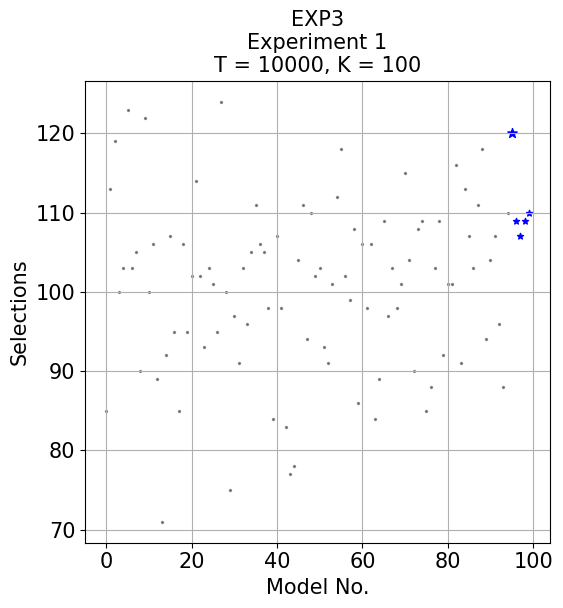

Optimal model recommended 1.107 times more often than sub-optimal models on average


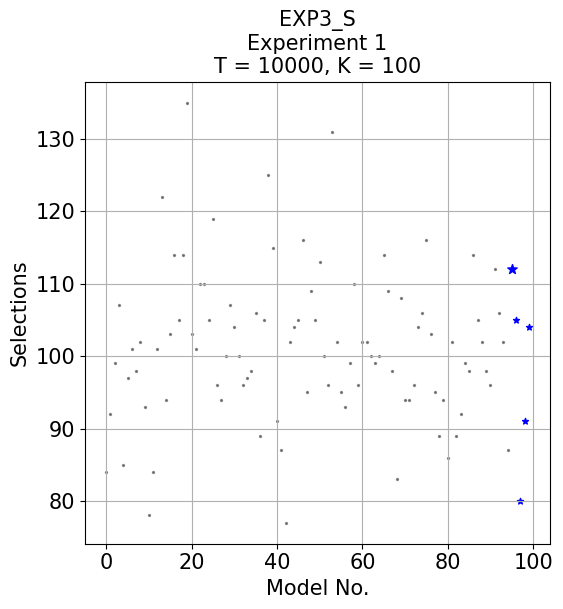

Optimal model recommended 0.960 times more often than sub-optimal models on average


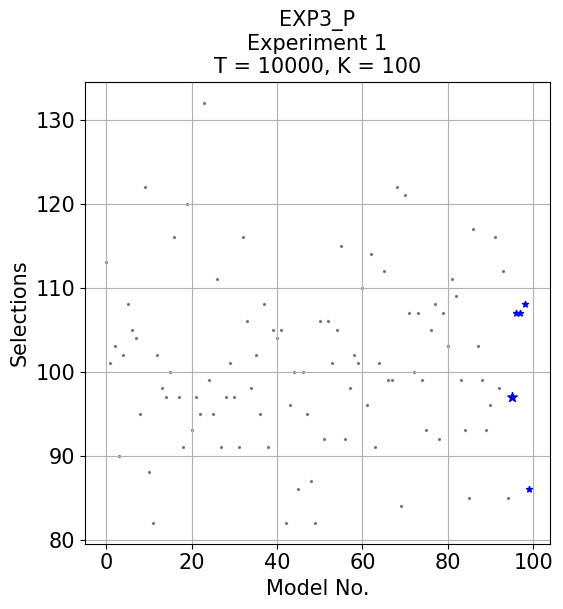

Optimal model recommended 1.028 times more often than sub-optimal models on average


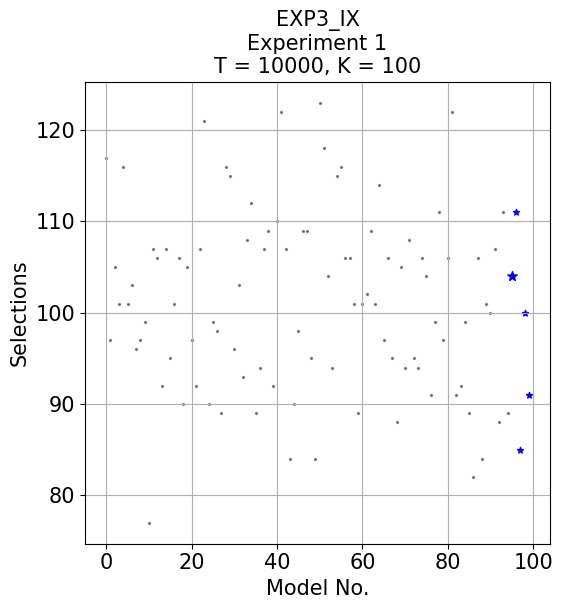

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.1881%
Pulls: [ 85. 113. 119. 100. 103. 123. 103. 105.  90. 122. 100. 106.  89.  71.
  92. 107.  95.  85. 106.  95. 102. 114. 102.  93. 103. 101.  95. 124.
 100.  75.  97.  91. 103.  96. 105. 111. 106. 105.  98.  84. 107.  98.
  83.  77.  78. 104. 111.  94. 110. 102. 103.  93.  91. 101. 112. 118.
 102.  99. 108.  86. 106.  98. 106.  84.  89. 109.  97. 103.  98. 101.
 115. 104.  90. 108. 109.  85.  88. 103. 109.  92. 101. 101. 116.  91.
 113. 107. 103. 111. 118.  94. 104. 107.  96.  88. 110. 120. 109. 107.
 109. 110.]
Time: 1.1975s

EXP3_S
Optimal Pulls: 1.1089%
Pulls: [ 84.  92.  99. 107.  85.  97. 101.  98. 102.  93.  78.  84. 101. 122.
  94. 103. 114. 105. 114. 135. 103. 101. 110. 110. 105. 119.  96.  94.
 100. 107. 104. 100.  96.  97.  98. 106.  89. 105. 125. 115.  91.  87.
  77. 102. 104. 105. 116.  95. 109. 105. 113. 100.  96. 131. 102.  95.
  93.  99. 110.  96. 102. 102. 100.  99. 100. 114. 109.  98.  83. 108.
  94.  94.  96. 104. 106. 116. 103.  95.  89.  94.  86. 102.  89.  92.
  99.  98. 114. 105. 102.  98.  96. 112. 106. 102.  87. 112. 105.  80.
  91. 104.]
Time: 0.9119s

EXP3_P
Optimal Pulls: 0.9604%
Pulls: [113. 101. 103.  90. 102. 108. 105. 104.  95. 122.  88.  82. 102.  98.
  97. 100. 116.  97.  91. 120.  93.  97.  95. 132.  99.  95. 111.  91.
  97. 101.  97.  91. 116. 106.  98. 102.  95. 108.  91. 105. 104. 105.
  82.  96. 100.  86. 100.  95.  87.  82. 106.  92. 106. 101. 105. 115.
  92.  98. 102. 101. 110.  96. 114.  91. 101. 112.  99.  99. 122.  84.
 121. 107. 100. 107.  99.  93. 105. 108.  92. 107. 103. 111. 109.  99.
  93.  85. 117. 103.  99.  93.  96. 116.  98. 112.  85.  97. 107. 107.
 108.  86.]
Time: 0.8575s

EXP3_IX
Optimal Pulls: 1.0297%
Pulls: [117.  97. 105. 101. 116. 101. 103.  96.  97.  99.  77. 107. 106.  92.
 107.  95. 101. 106.  90. 105.  97.  92. 107. 121.  90.  99.  98.  89.
 116. 115.  96. 103.  93. 108. 112.  89.  94. 107. 109.  92. 110. 122.
 107.  84.  90.  98. 109. 109.  95.  84. 123. 118. 104.  94. 115. 116.
 106. 106. 101.  89. 101. 102. 109. 101. 114.  97. 106.  95.  88. 105.
  94. 108.  95.  94. 106. 104.  91.  99. 111.  97. 106. 122.  91.  92.
  99.  89.  82. 106.  84. 101. 100. 107.  88. 111.  89. 104. 111.  85.
 100.  91.]
Time: 0.7361s


T = 10000, K = 100, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.133 times more often than sub-optimal models on average


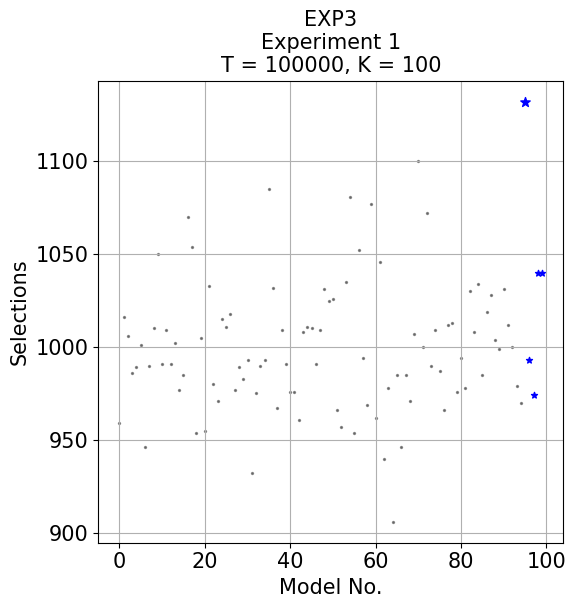

Optimal model recommended 1.093 times more often than sub-optimal models on average


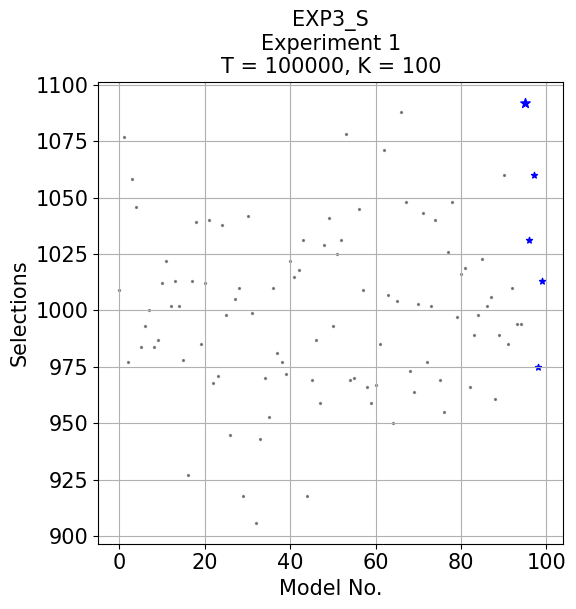

Optimal model recommended 1.006 times more often than sub-optimal models on average


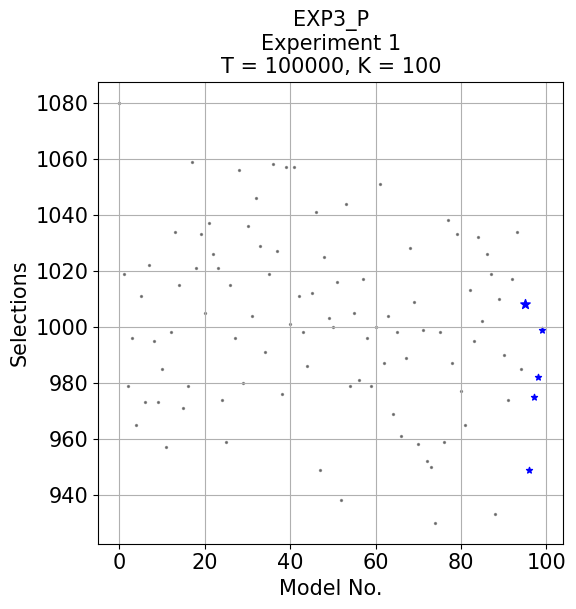

Optimal model recommended 1.061 times more often than sub-optimal models on average


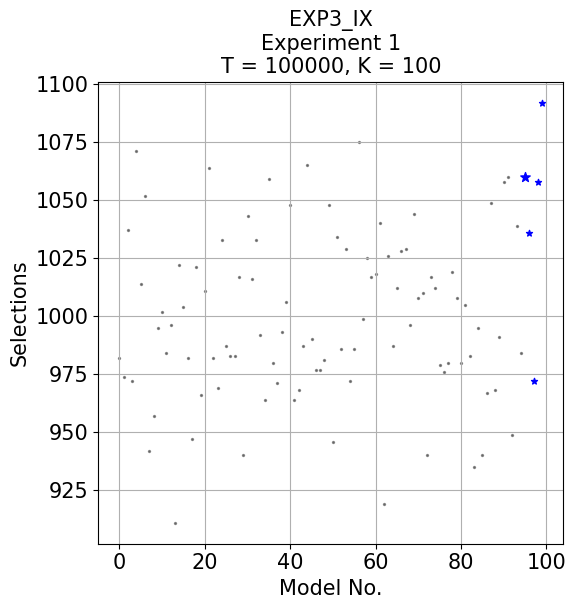

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.1309%
Pulls: [ 959. 1016. 1006.  986.  989. 1001.  946.  990. 1010. 1050.  991. 1009.
  991. 1002.  977.  985. 1070. 1054.  954. 1005.  955. 1033.  980.  971.
 1015. 1011. 1018.  977.  989.  983.  993.  932.  975.  990.  993. 1085.
 1032.  967. 1009.  991.  976.  976.  961. 1008. 1011. 1010.  991. 1009.
 1031. 1025. 1026.  966.  957. 1035. 1081.  954. 1052.  994.  969. 1077.
  962. 1046.  940.  978.  906.  985.  946.  985.  971. 1007. 1100. 1000.
 1072.  990. 1009.  987.  966. 1012. 1013.  976.  994.  978. 1030. 1008.
 1034.  985. 1019. 1028. 1004.  999. 1031. 1012. 1000.  979.  970. 1132.
  993.  974. 1040. 1040.]
Time: 6.2515s

EXP3_S
Optimal Pulls: 1.0909%
Pulls: [1009. 1077.  977. 1058. 1046.  984.  993. 1000.  984.  987. 1012. 1022.
 1002. 1013. 1002.  978.  927. 1013. 1039.  985. 1012. 1040.  968.  971.
 1038.  998.  945. 1005. 1010.  918. 1042.  999.  906.  943.  970.  953.
 1010.  981.  977.  972. 1022. 1015. 1018. 1031.  918.  969.  987.  959.
 1029. 1041.  993. 1025. 1031. 1078.  969.  970. 1045. 1009.  966.  959.
  967.  985. 1071. 1007.  950. 1004. 1088. 1048.  973.  964. 1003. 1043.
  977. 1002. 1040.  969.  955. 1026. 1048.  997. 1016. 1019.  966.  989.
  998. 1023. 1002. 1006.  961.  989. 1060.  985. 1010.  994.  994. 1092.
 1031. 1060.  975. 1013.]
Time: 5.5340s

EXP3_P
Optimal Pulls: 1.0070%
Pulls: [1080. 1019.  979.  996.  965. 1011.  973. 1022.  995.  973.  985.  957.
  998. 1034. 1015.  971.  979. 1059. 1021. 1033. 1005. 1037. 1026. 1021.
  974.  959. 1015.  996. 1056.  980. 1036. 1004. 1046. 1029.  991. 1019.
 1058. 1027.  976. 1057. 1001. 1057. 1011.  998.  986. 1012. 1041.  949.
 1025. 1003. 1000. 1016.  938. 1044.  979. 1005.  981. 1017.  996.  979.
 1000. 1051.  987. 1004.  969.  998.  961.  989. 1028. 1009.  958.  999.
  952.  950.  930.  998.  959. 1038.  987. 1033.  977.  965. 1013.  995.
 1032. 1002. 1026. 1019.  933. 1010.  990.  974. 1017. 1034.  985. 1008.
  949.  975.  982.  999.]
Time: 4.9002s

EXP3_IX
Optimal Pulls: 1.0589%
Pulls: [ 982.  974. 1037.  972. 1071. 1014. 1052.  942.  957.  995. 1002.  984.
  996.  911. 1022. 1004.  982.  947. 1021.  966. 1011. 1064.  982.  969.
 1033.  987.  983.  983. 1017.  940. 1043. 1016. 1033.  992.  964. 1059.
  980.  971.  993. 1006. 1048.  964.  968.  987. 1065.  990.  977.  977.
  981. 1048.  946. 1034.  986. 1029.  972.  986. 1075.  999. 1025. 1017.
 1018. 1040.  919. 1026.  987. 1012. 1028. 1029.  996. 1044. 1008. 1010.
  940. 1017. 1012.  979.  976.  980. 1019. 1008.  980. 1005.  983.  935.
  995.  940.  967. 1049.  968.  991. 1058. 1060.  949. 1039.  984. 1060.
 1036.  972. 1058. 1092.]
Time: 4.5378s


T = 100000, K = 100, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.324 times more often than sub-optimal models on average


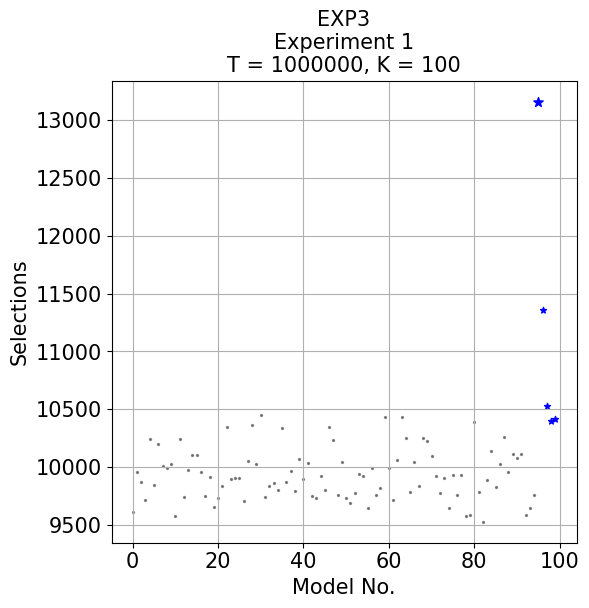

Optimal model recommended 1.290 times more often than sub-optimal models on average


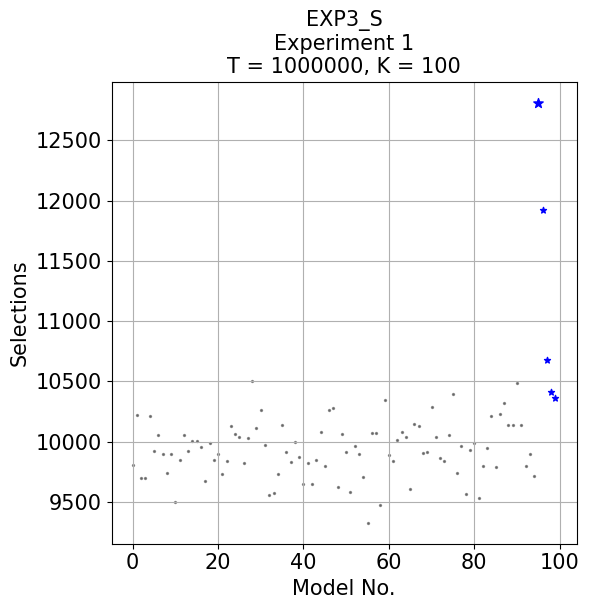

Optimal model recommended 1.002 times more often than sub-optimal models on average


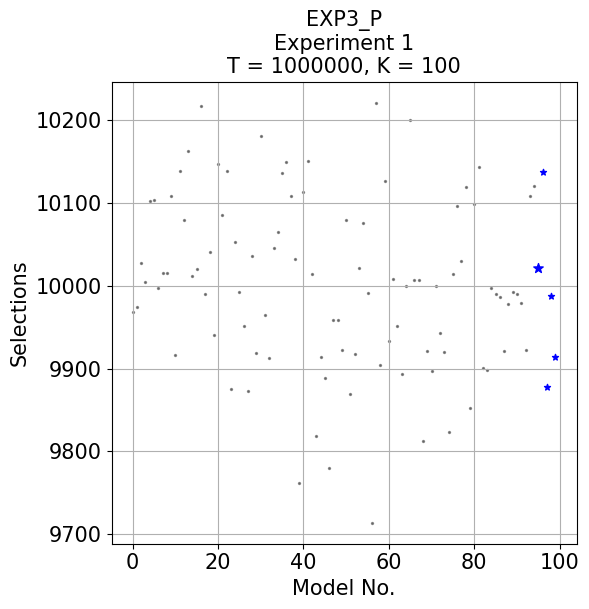

Optimal model recommended 1.252 times more often than sub-optimal models on average


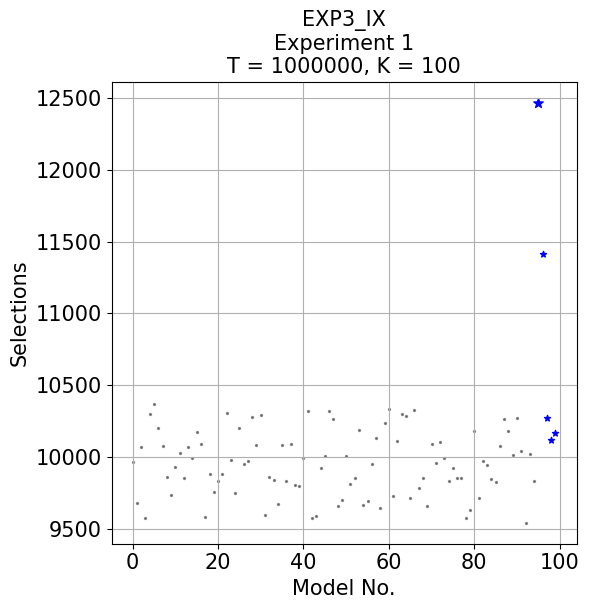

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.3156%
Pulls: [ 9612.  9957.  9877.  9716. 10241.  9849. 10203. 10012.  9998. 10025.
  9583. 10243.  9744.  9973. 10105. 10103.  9960.  9756.  9919.  9659.
  9733.  9839. 10348.  9898.  9907.  9908.  9710. 10054. 10364. 10027.
 10452.  9745.  9837.  9862.  9803. 10339.  9872.  9968.  9797. 10073.
  9899. 10041.  9748.  9733.  9927.  9808. 10345. 10237.  9761. 10048.
  9739.  9694.  9775.  9938.  9929.  9647.  9993.  9763.  9818. 10433.
  9992.  9718. 10061. 10431. 10251.  9787. 10050.  9840. 10256. 10224.
 10097.  9924.  9780.  9909.  9652.  9930.  9757.  9932.  9577.  9591.
 10391.  9789.  9530.  9888. 10145.  9829. 10029. 10262.  9959. 10115.
 10081. 10118.  9587.  9645.  9762. 13157. 11357. 10533. 10396. 10421.]
Time: 47.6510s

EXP3_S
Optimal Pulls: 1.2812%
Pulls: [ 9810. 10222.  9697.  9701. 10215.  9921. 10059.  9896.  9737.  9901.
  9499.  9852. 10056.  9921. 10006. 10004.  9960.  9678.  9986.  9848.
  9896.  9731.  9838. 10127. 10067. 10043.  9827. 10032. 10502. 10111.
 10260.  9976.  9560.  9577.  9735. 10140.  9916.  9833.  9997.  9876.
  9650.  9824.  9652.  9846. 10083.  9800. 10266. 10282.  9623. 10066.
  9918.  9585.  9964.  9902.  9710.  9328. 10075. 10075.  9479. 10343.
  9887.  9841. 10018. 10077. 10043.  9611. 10149. 10130.  9909.  9918.
 10291. 10036.  9861.  9841. 10059. 10400.  9739.  9967.  9564.  9930.
  9990.  9531.  9799.  9949. 10213.  9793. 10226. 10322. 10140. 10139.
 10491. 10142.  9802.  9898.  9718. 12813. 11919. 10682. 10413. 10365.]
Time: 52.0728s

EXP3_P
Optimal Pulls: 1.0021%
Pulls: [ 9968.  9974. 10028. 10005. 10102. 10104.  9997. 10015. 10015. 10109.
  9917. 10138. 10079. 10163. 10012. 10020. 10217.  9990. 10041.  9941.
 10147. 10085. 10138.  9875. 10053.  9992.  9952.  9873. 10036.  9919.
 10181.  9965.  9913. 10046. 10065. 10136. 10150. 10109. 10032.  9762.
 10113. 10151. 10014.  9819.  9914.  9889.  9780.  9959.  9959.  9922.
 10079.  9869.  9918. 10021. 10076.  9991.  9714. 10221.  9904. 10127.
  9933. 10008.  9951.  9894. 10000. 10200. 10007. 10007.  9813.  9921.
  9897. 10000.  9943.  9920.  9823. 10014. 10096. 10030. 10119.  9853.
 10099. 10143.  9901.  9898.  9997.  9990.  9987.  9921.  9978.  9993.
  9990.  9979.  9923. 10109. 10120. 10022. 10137.  9878.  9988.  9914.]
Time: 54.5926s

EXP3_IX
Optimal Pulls: 1.2464%
Pulls: [ 9966.  9682. 10073.  9579. 10298. 10372. 10202. 10080.  9864.  9735.
  9933. 10029.  9859. 10072.  9998. 10173. 10094.  9585.  9884.  9757.
  9834.  9884. 10310.  9982.  9749. 10206.  9950.  9977. 10283. 10085.
 10296.  9599.  9860.  9841.  9674. 10084.  9833. 10091.  9809.  9802.
  9993. 10319.  9576.  9589.  9928. 10006. 10324. 10266.  9660.  9704.
 10009.  9811.  9853. 10187.  9668.  9695.  9950. 10131.  9645. 10237.
 10335.  9729. 10114. 10301. 10290.  9714. 10331.  9788.  9859.  9662.
 10091.  9960. 10108.  9997.  9837.  9928.  9857.  9853.  9575.  9631.
 10180.  9715.  9977.  9947.  9851.  9825. 10077. 10267. 10185. 10015.
 10276. 10047.  9545. 10021.  9835. 12465. 11416. 10276. 10119. 10166.]
Time: 49.4465s


T = 1000000, K = 100, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.052 times more often than sub-optimal models on average


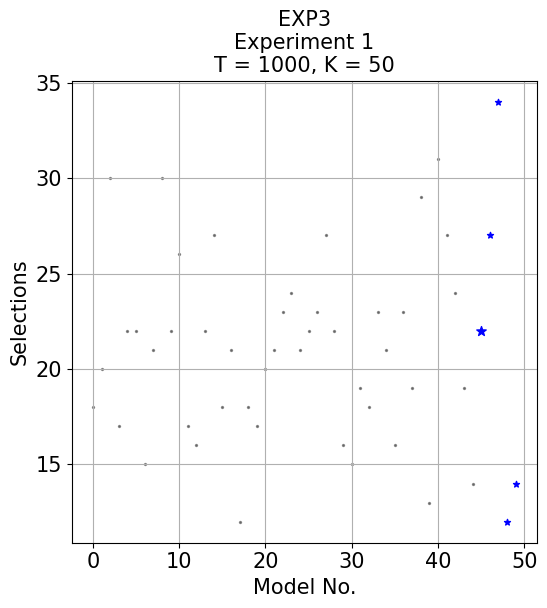

Optimal model recommended 0.799 times more often than sub-optimal models on average


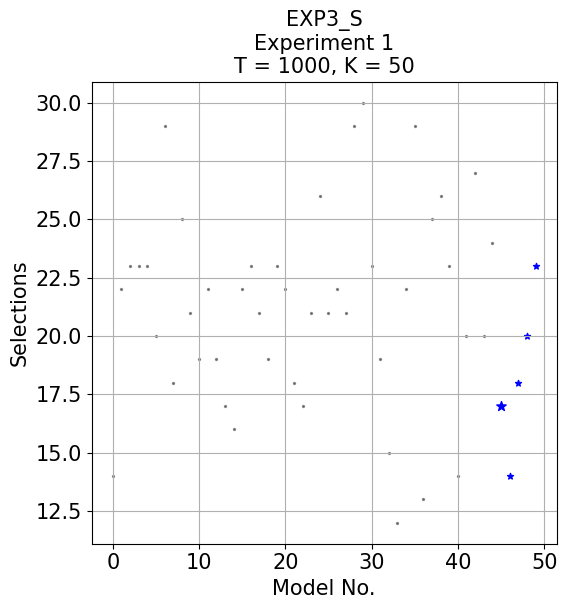

Optimal model recommended 0.796 times more often than sub-optimal models on average


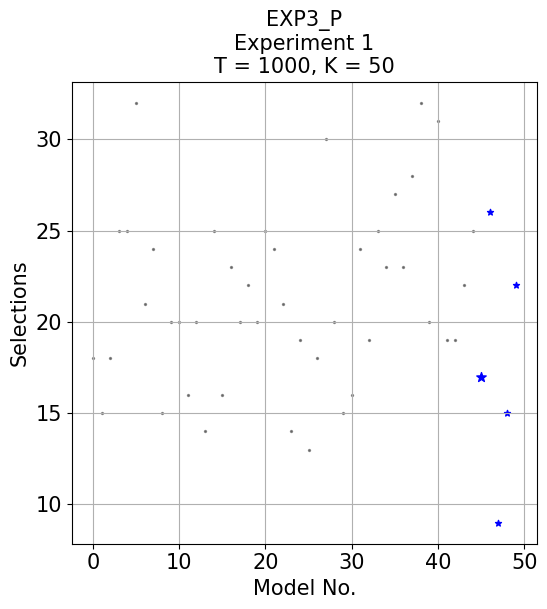

Optimal model recommended 0.789 times more often than sub-optimal models on average


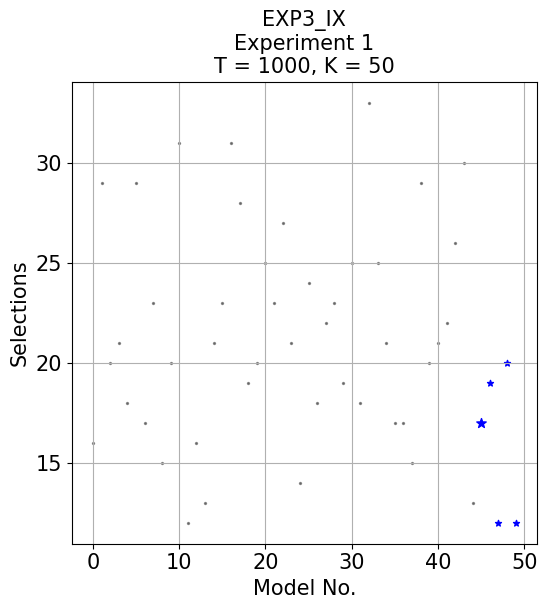

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.0952%
Pulls: [18. 20. 30. 17. 22. 22. 15. 21. 30. 22. 26. 17. 16. 22. 27. 18. 21. 12.
 18. 17. 20. 21. 23. 24. 21. 22. 23. 27. 22. 16. 15. 19. 18. 23. 21. 16.
 23. 19. 29. 13. 31. 27. 24. 19. 14. 22. 27. 34. 12. 14.]
Time: 0.0785s

EXP3_S
Optimal Pulls: 1.6190%
Pulls: [14. 22. 23. 23. 23. 20. 29. 18. 25. 21. 19. 22. 19. 17. 16. 22. 23. 21.
 19. 23. 22. 18. 17. 21. 26. 21. 22. 21. 29. 30. 23. 19. 15. 12. 22. 29.
 13. 25. 26. 23. 14. 20. 27. 20. 24. 17. 14. 18. 20. 23.]
Time: 0.1008s

EXP3_P
Optimal Pulls: 1.6190%
Pulls: [18. 15. 18. 25. 25. 32. 21. 24. 15. 20. 20. 16. 20. 14. 25. 16. 23. 20.
 22. 20. 25. 24. 21. 14. 19. 13. 18. 30. 20. 15. 16. 24. 19. 25. 23. 27.
 23. 28. 32. 20. 31. 19. 19. 22. 25. 17. 26.  9. 15. 22.]
Time: 0.0791s

EXP3_IX
Optimal Pulls: 1.6190%
Pulls: [16. 29. 20. 21. 18. 29. 17. 23. 15. 20. 31. 12. 16. 13. 21. 23. 31. 28.
 19. 20. 25. 23. 27. 21. 14. 24. 18. 22. 23. 19. 25. 18. 33. 25. 21. 17.
 17. 15. 29. 20. 21. 22. 26. 30. 13. 17. 19. 12. 20. 12.]
Time: 0.0919s


T = 1000, K = 50, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.100 times more often than sub-optimal models on average


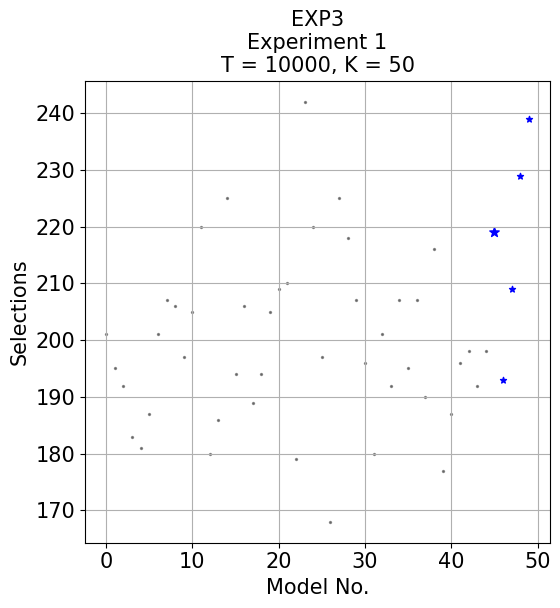

Optimal model recommended 0.976 times more often than sub-optimal models on average


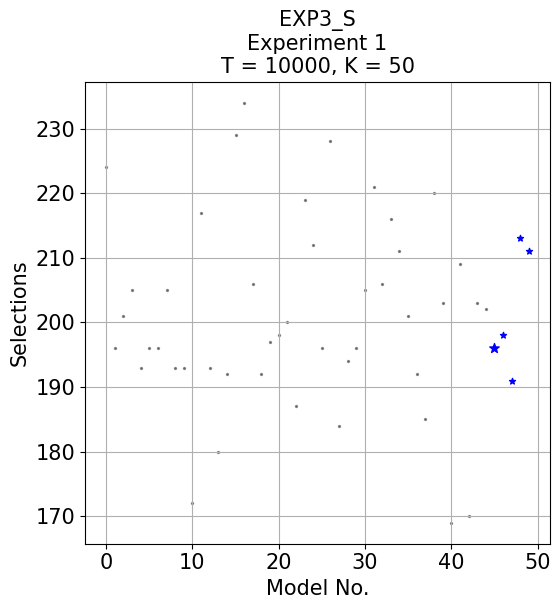

Optimal model recommended 0.971 times more often than sub-optimal models on average


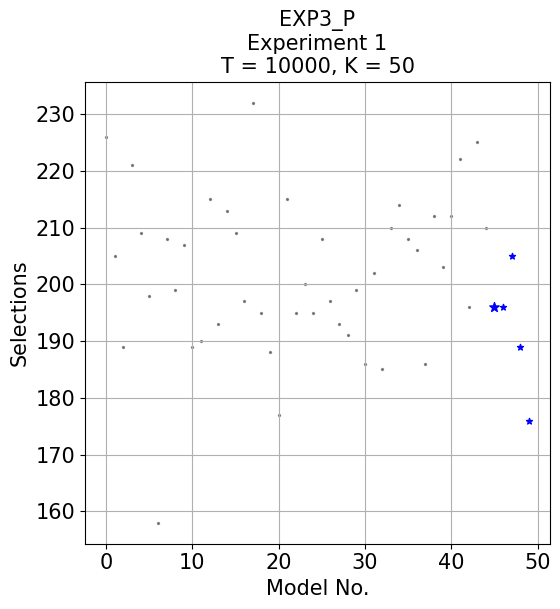

Optimal model recommended 1.119 times more often than sub-optimal models on average


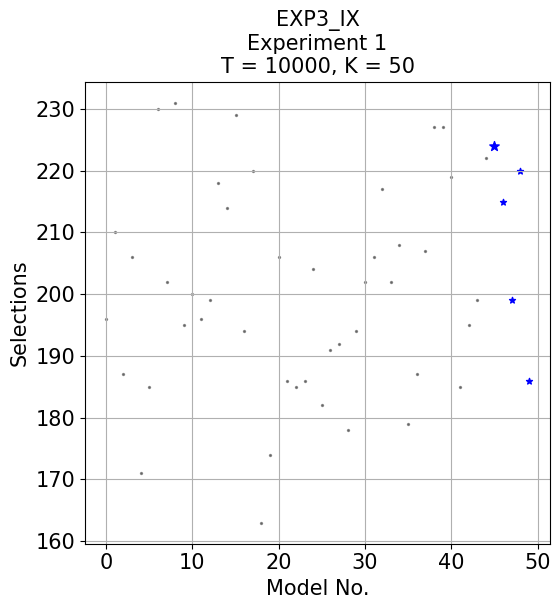

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.1791%
Pulls: [201. 195. 192. 183. 181. 187. 201. 207. 206. 197. 205. 220. 180. 186.
 225. 194. 206. 189. 194. 205. 209. 210. 179. 242. 220. 197. 168. 225.
 218. 207. 196. 180. 201. 192. 207. 195. 207. 190. 216. 177. 187. 196.
 198. 192. 198. 219. 193. 209. 229. 239.]
Time: 0.7430s

EXP3_S
Optimal Pulls: 1.9502%
Pulls: [224. 196. 201. 205. 193. 196. 196. 205. 193. 193. 172. 217. 193. 180.
 192. 229. 234. 206. 192. 197. 198. 200. 187. 219. 212. 196. 228. 184.
 194. 196. 205. 221. 206. 216. 211. 201. 192. 185. 220. 203. 169. 209.
 170. 203. 202. 196. 198. 191. 213. 211.]
Time: 1.1129s

EXP3_P
Optimal Pulls: 1.9502%
Pulls: [226. 205. 189. 221. 209. 198. 158. 208. 199. 207. 189. 190. 215. 193.
 213. 209. 197. 232. 195. 188. 177. 215. 195. 200. 195. 208. 197. 193.
 191. 199. 186. 202. 185. 210. 214. 208. 206. 186. 212. 203. 212. 222.
 196. 225. 210. 196. 196. 205. 189. 176.]
Time: 1.3871s

EXP3_IX
Optimal Pulls: 2.2289%
Pulls: [196. 210. 187. 206. 171. 185. 230. 202. 231. 195. 200. 196. 199. 218.
 214. 229. 194. 220. 163. 174. 206. 186. 185. 186. 204. 182. 191. 192.
 178. 194. 202. 206. 217. 202. 208. 179. 187. 207. 227. 227. 219. 185.
 195. 199. 222. 224. 215. 199. 220. 186.]
Time: 1.1060s


T = 10000, K = 50, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.223 times more often than sub-optimal models on average


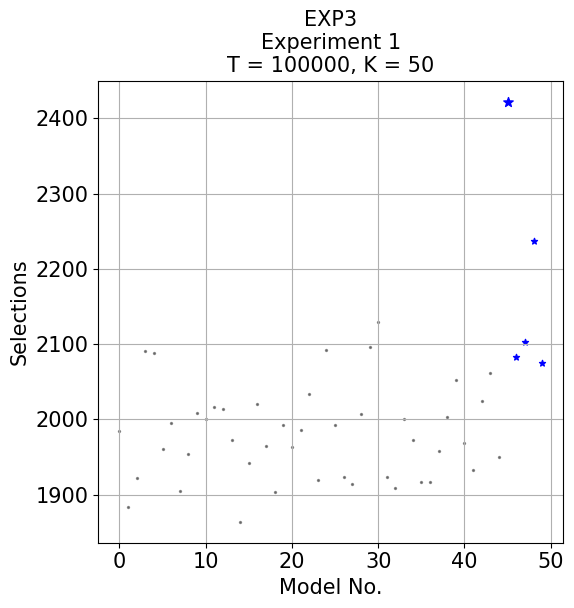

Optimal model recommended 1.208 times more often than sub-optimal models on average


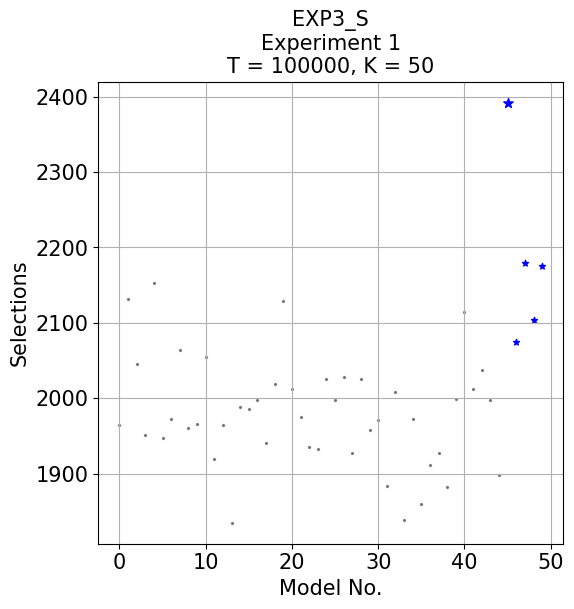

Optimal model recommended 1.000 times more often than sub-optimal models on average


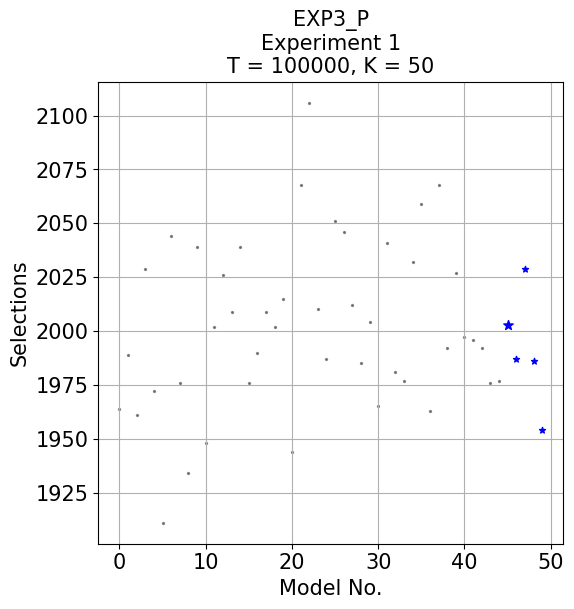

Optimal model recommended 1.165 times more often than sub-optimal models on average


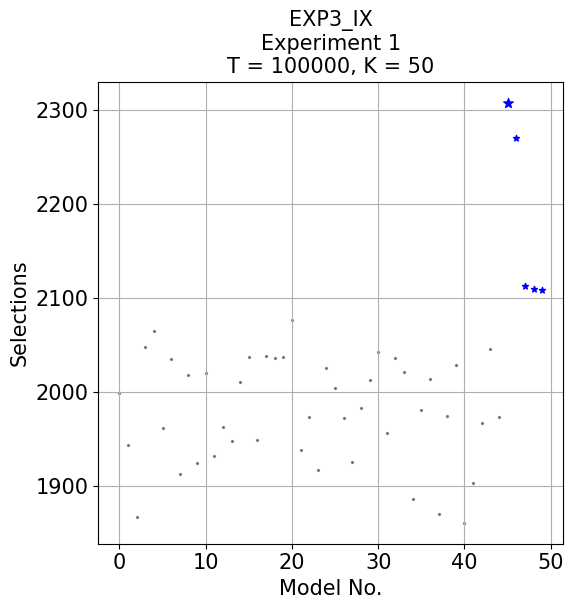

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.4208%
Pulls: [1984. 1884. 1922. 2091. 2088. 1960. 1995. 1905. 1954. 2008. 2001. 2017.
 2014. 1972. 1864. 1942. 2021. 1964. 1904. 1993. 1963. 1986. 2034. 1919.
 2092. 1993. 1923. 1914. 2007. 2096. 2130. 1924. 1909. 2001. 1972. 1917.
 1917. 1958. 2003. 2052. 1968. 1933. 2025. 2061. 1950. 2422. 2083. 2103.
 2237. 2075.]
Time: 5.7931s

EXP3_S
Optimal Pulls: 2.3908%
Pulls: [1964. 2132. 2046. 1951. 2153. 1948. 1973. 2064. 1961. 1966. 2055. 1919.
 1964. 1835. 1988. 1986. 1998. 1941. 2019. 2129. 2012. 1975. 1935. 1933.
 2026. 1998. 2028. 1928. 2025. 1958. 1971. 1884. 2008. 1839. 1972. 1860.
 1911. 1927. 1882. 1999. 2115. 2012. 2037. 1998. 1898. 2392. 2075. 2180.
 2104. 2176.]
Time: 5.5549s

EXP3_P
Optimal Pulls: 2.0020%
Pulls: [1964. 1989. 1961. 2029. 1972. 1911. 2044. 1976. 1934. 2039. 1948. 2002.
 2026. 2009. 2039. 1976. 1990. 2009. 2002. 2015. 1944. 2068. 2106. 2010.
 1987. 2051. 2046. 2012. 1985. 2004. 1965. 2041. 1981. 1977. 2032. 2059.
 1963. 2068. 1992. 2027. 1997. 1996. 1992. 1976. 1977. 2003. 1987. 2029.
 1986. 1954.]
Time: 4.5494s

EXP3_IX
Optimal Pulls: 2.3068%
Pulls: [1999. 1944. 1867. 2048. 2065. 1962. 2035. 1913. 2018. 1925. 2020. 1932.
 1963. 1948. 2011. 2037. 1949. 2038. 2036. 2037. 2077. 1938. 1974. 1917.
 2026. 2004. 1972. 1926. 1983. 2013. 2043. 1957. 2036. 2021. 1886. 1981.
 2014. 1870. 1975. 2029. 1861. 1903. 1967. 2046. 1974. 2308. 2270. 2113.
 2110. 2109.]
Time: 4.3627s


T = 100000, K = 50, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.759 times more often than sub-optimal models on average


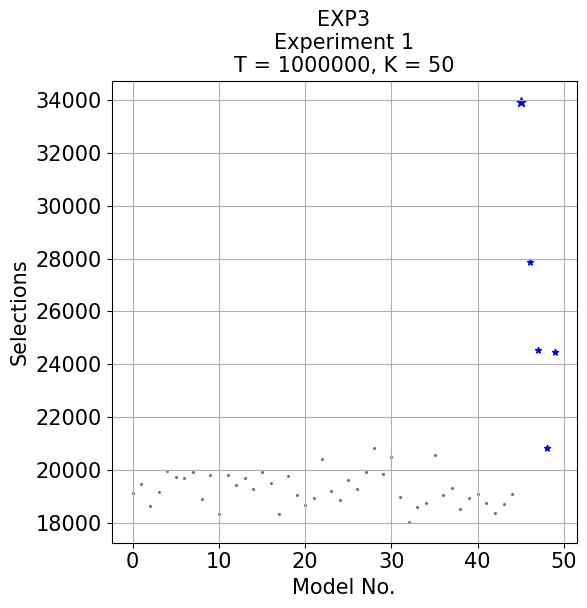

Optimal model recommended 1.722 times more often than sub-optimal models on average


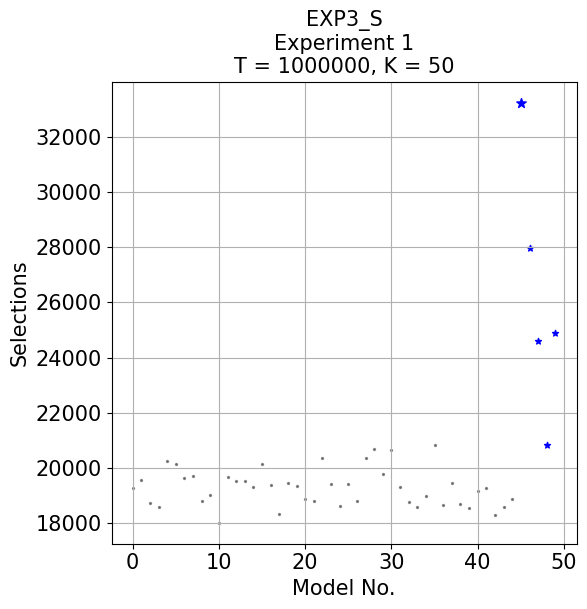

Optimal model recommended 0.993 times more often than sub-optimal models on average


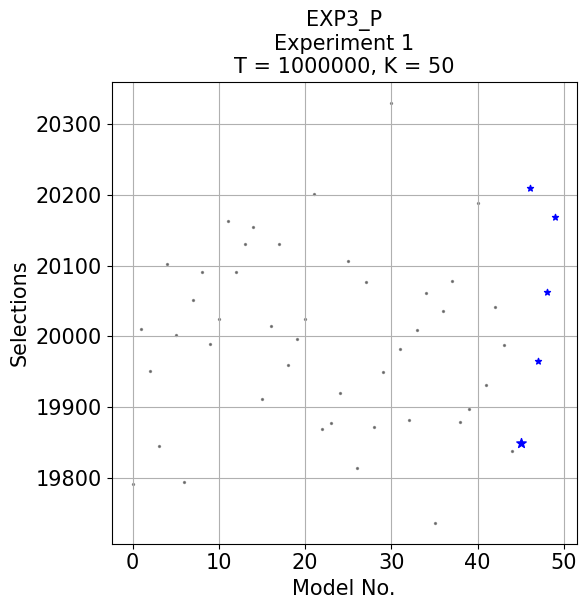

Optimal model recommended 1.685 times more often than sub-optimal models on average


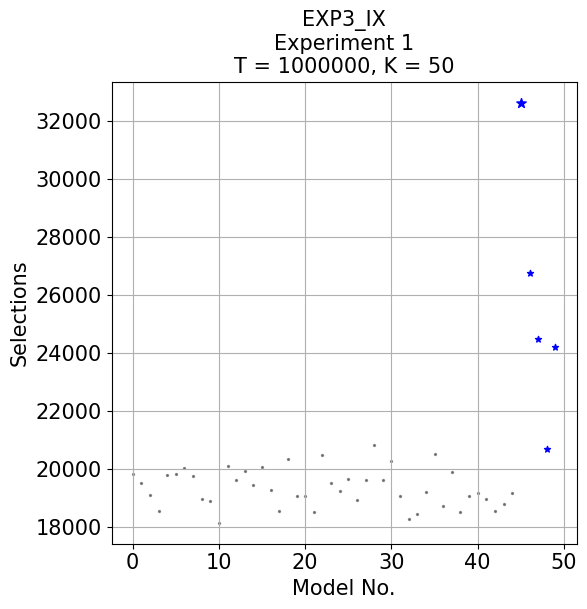

In [ ]:
input_string = '''EXP3
Optimal Pulls: 3.3938%
Pulls: [19119. 19472. 18650. 19159. 19950. 19750. 19707. 19936. 18916. 19805.
 18321. 19808. 19422. 19682. 19279. 19910. 19512. 18345. 19777. 19046.
 18660. 18927. 20400. 19216. 18846. 19622. 19264. 19930. 20826. 19863.
 20488. 18974. 18040. 18612. 18730. 20578. 19067. 19314. 18540. 18922.
 19094. 18733. 18388. 18700. 19093. 33940. 27870. 24531. 20841. 24475.]
Time: 47.5134s

EXP3_S
Optimal Pulls: 3.3225%
Pulls: [19271. 19569. 18732. 18575. 20253. 20160. 19656. 19713. 18793. 19025.
 18021. 19685. 19538. 19528. 19311. 20139. 19396. 18334. 19471. 19360.
 18895. 18806. 20380. 19435. 18628. 19434. 18810. 20358. 20687. 19777.
 20650. 19305. 18788. 18586. 18977. 20828. 18665. 19455. 18715. 18556.
 19159. 19290. 18314. 18607. 18862. 33227. 27977. 24607. 20838. 24904.]
Time: 51.1255s

EXP3_P
Optimal Pulls: 1.9848%
Pulls: [19792. 20010. 19951. 19845. 20102. 20002. 19794. 20052. 20091. 19989.
 20025. 20163. 20091. 20130. 20154. 19912. 20015. 20131. 19960. 19996.
 20025. 20201. 19870. 19878. 19920. 20107. 19814. 20077. 19872. 19950.
 20330. 19982. 19882. 20009. 20061. 19737. 20036. 20078. 19879. 19897.
 20188. 19931. 20041. 19988. 19838. 19849. 20209. 19965. 20063. 20168.]
Time: 50.3677s

EXP3_IX
Optimal Pulls: 3.2629%
Pulls: [19821. 19524. 19111. 18542. 19788. 19849. 20040. 19777. 18961. 18906.
 18154. 20116. 19616. 19948. 19470. 20091. 19286. 18569. 20350. 19058.
 19066. 18525. 20473. 19515. 19247. 19674. 18938. 19638. 20826. 19628.
 20265. 19090. 18294. 18458. 19230. 20506. 18725. 19914. 18530. 19079.
 19164. 18965. 18569. 18806. 19191. 32631. 26764. 24472. 20681. 24209.]
Time: 48.1027s


T = 1000000, K = 50, Experiment: 1'''

PlotExpSelections(input_string)

Optimal model recommended 1.044 times more often than sub-optimal models on average


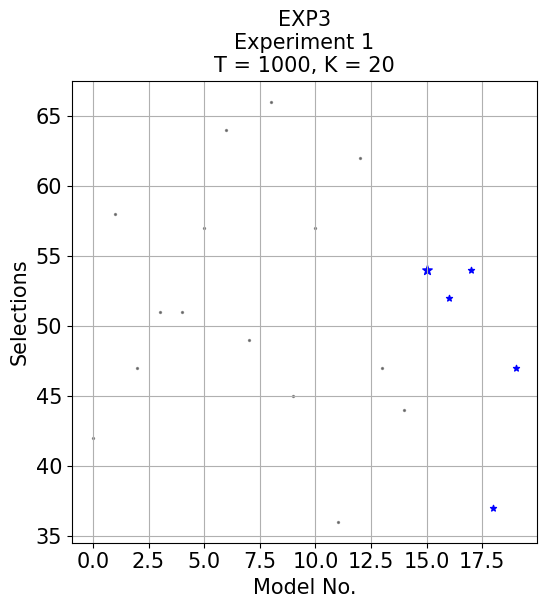

Optimal model recommended 1.000 times more often than sub-optimal models on average


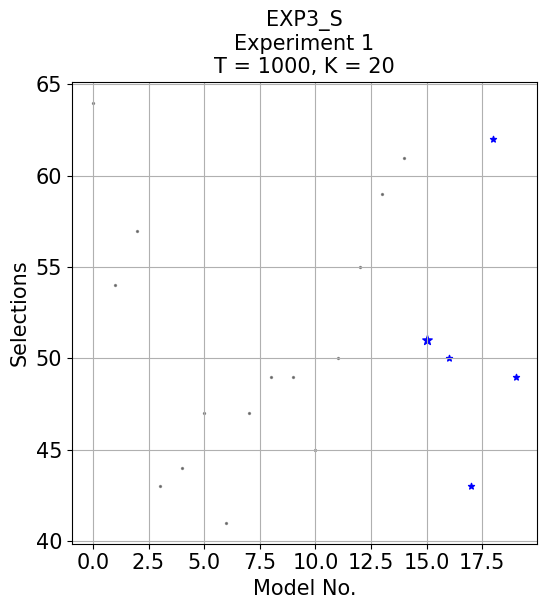

Optimal model recommended 0.713 times more often than sub-optimal models on average


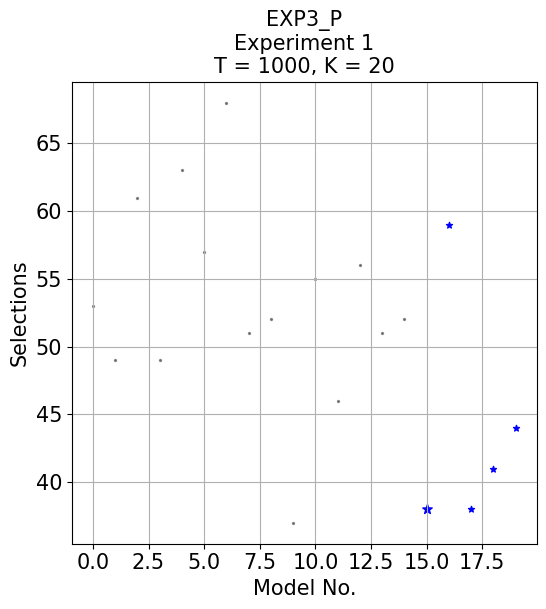

Optimal model recommended 0.889 times more often than sub-optimal models on average


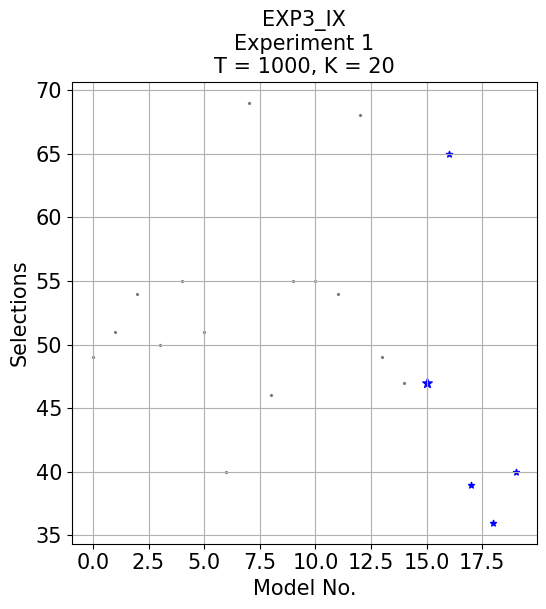

In [ ]:
input_string = '''EXP3
Optimal Pulls: 5.2941%
Pulls: [42. 58. 47. 51. 51. 57. 64. 49. 66. 45. 57. 36. 62. 47. 44. 54. 52. 54.
 37. 47.]
Time: 0.1022s

EXP3_S
Optimal Pulls: 5.0000%
Pulls: [64. 54. 57. 43. 44. 47. 41. 47. 49. 49. 45. 50. 55. 59. 61. 51. 50. 43.
 62. 49.]
Time: 0.1261s

EXP3_P
Optimal Pulls: 3.7255%
Pulls: [53. 49. 61. 49. 63. 57. 68. 51. 52. 37. 55. 46. 56. 51. 52. 38. 59. 38.
 41. 44.]
Time: 0.1993s

EXP3_IX
Optimal Pulls: 4.6078%
Pulls: [49. 51. 54. 50. 55. 51. 40. 69. 46. 55. 55. 54. 68. 49. 47. 47. 65. 39.
 36. 40.]
Time: 0.0728s


T = 1000, K = 20, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.141 times more often than sub-optimal models on average


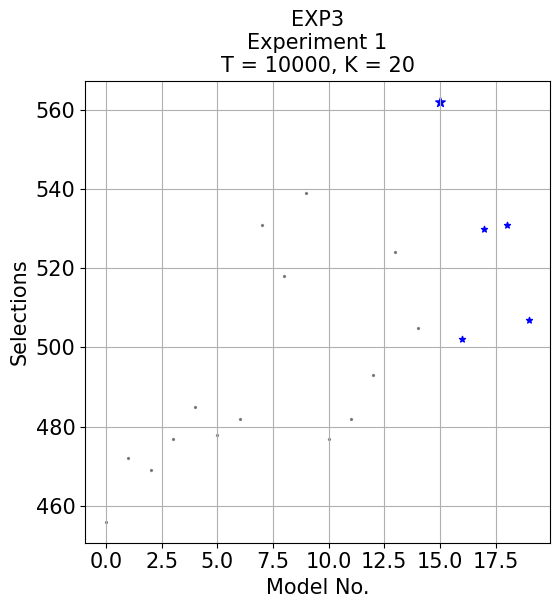

Optimal model recommended 1.172 times more often than sub-optimal models on average


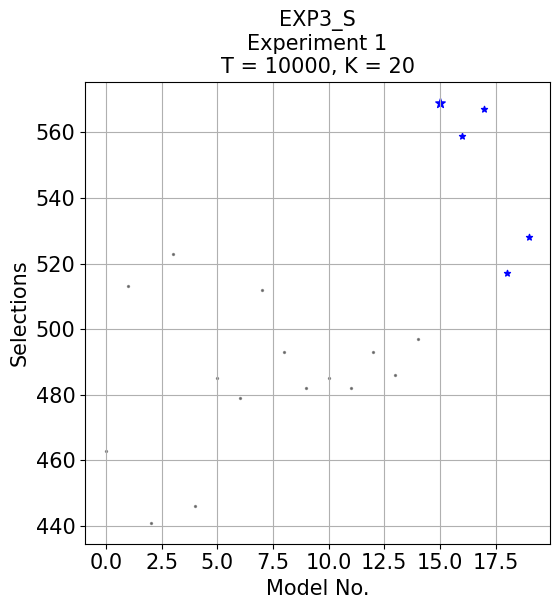

Optimal model recommended 1.039 times more often than sub-optimal models on average


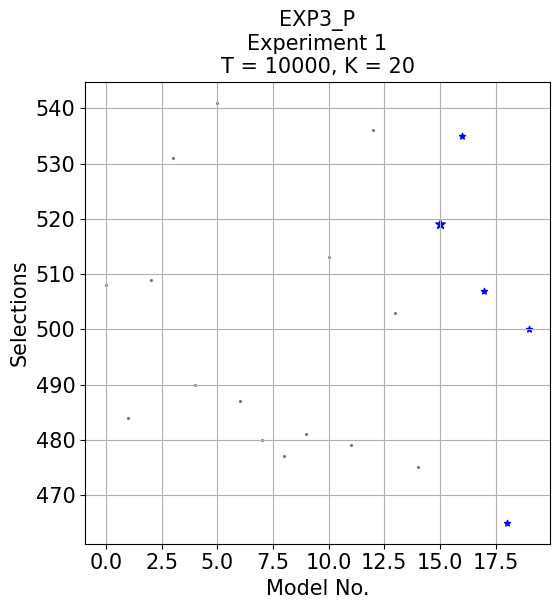

Optimal model recommended 1.182 times more often than sub-optimal models on average


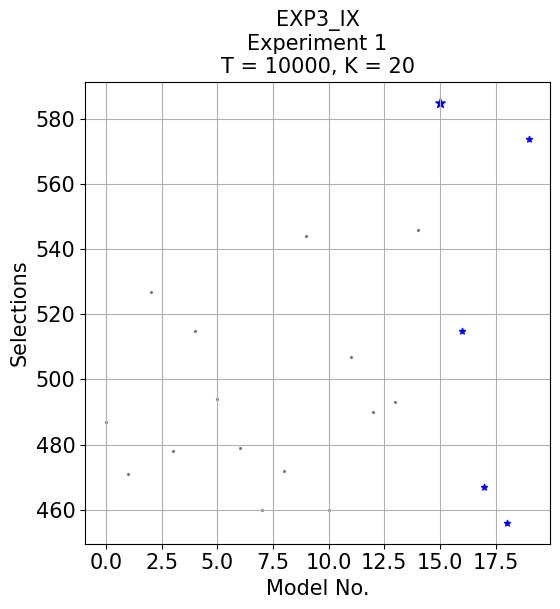

In [ ]:
input_string = '''EXP3
Optimal Pulls: 5.6088%
Pulls: [456. 472. 469. 477. 485. 478. 482. 531. 518. 539. 477. 482. 493. 524.
 505. 562. 502. 530. 531. 507.]
Time: 0.6840s

EXP3_S
Optimal Pulls: 5.6786%
Pulls: [463. 513. 441. 523. 446. 485. 479. 512. 493. 482. 485. 482. 493. 486.
 497. 569. 559. 567. 517. 528.]
Time: 0.7502s

EXP3_P
Optimal Pulls: 5.1796%
Pulls: [508. 484. 509. 531. 490. 541. 487. 480. 477. 481. 513. 479. 536. 503.
 475. 519. 535. 507. 465. 500.]
Time: 0.7597s

EXP3_IX
Optimal Pulls: 5.8383%
Pulls: [487. 471. 527. 478. 515. 494. 479. 460. 472. 544. 460. 507. 490. 493.
 546. 585. 515. 467. 456. 574.]
Time: 0.6950s


T = 10000, K = 20, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.636 times more often than sub-optimal models on average


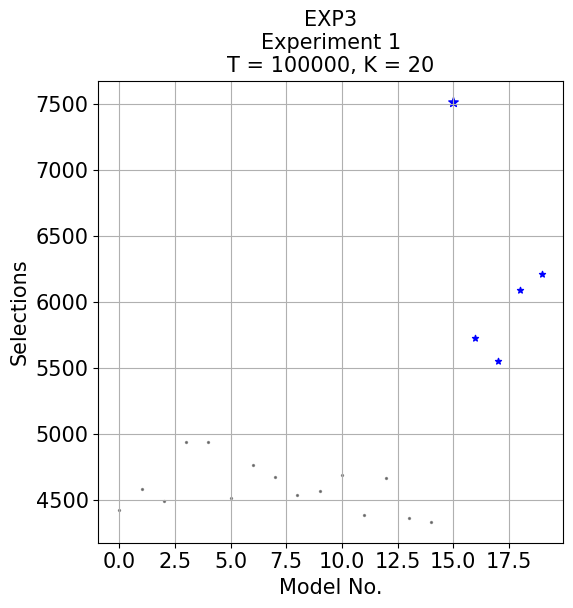

Optimal model recommended 1.639 times more often than sub-optimal models on average


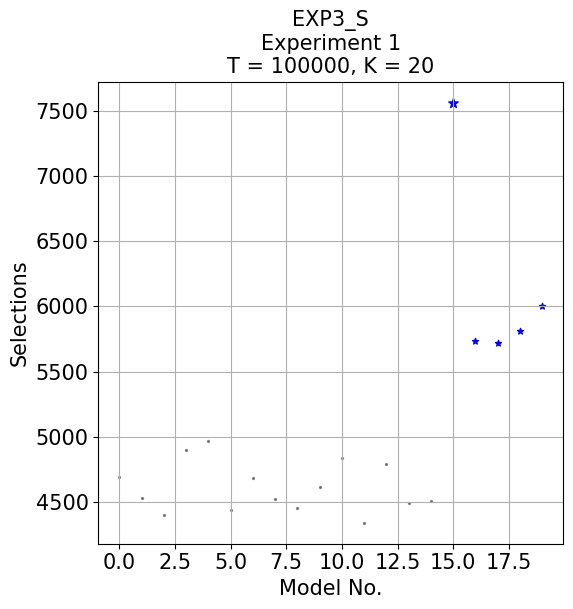

Optimal model recommended 1.002 times more often than sub-optimal models on average


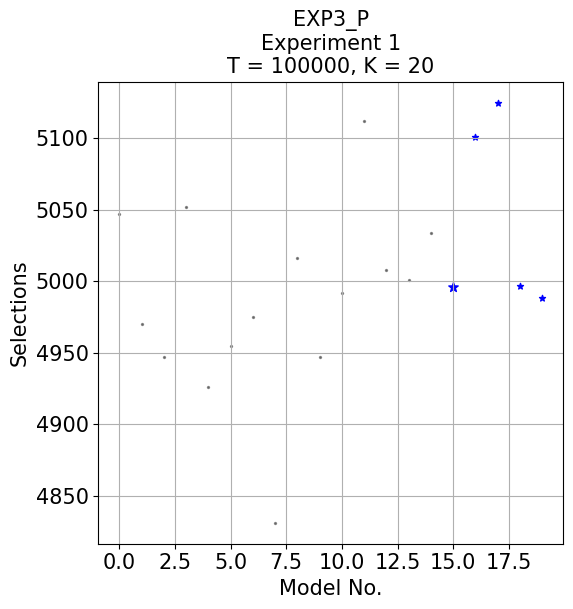

Optimal model recommended 1.562 times more often than sub-optimal models on average


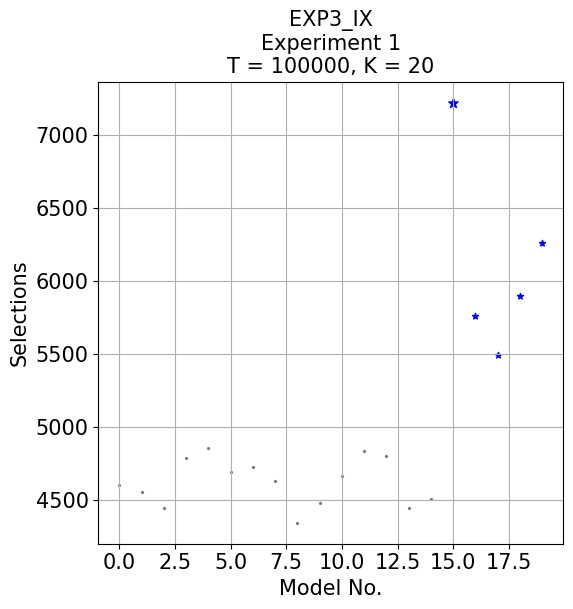

In [ ]:
input_string = '''EXP3
Optimal Pulls: 7.5135%
Pulls: [4426. 4587. 4491. 4943. 4939. 4516. 4770. 4676. 4540. 4570. 4695. 4390.
 4667. 4369. 4338. 7515. 5730. 5552. 6092. 6214.]
Time: 7.7389s

EXP3_S
Optimal Pulls: 7.5585%
Pulls: [4694. 4529. 4401. 4897. 4969. 4439. 4684. 4527. 4458. 4614. 4835. 4343.
 4793. 4493. 4512. 7560. 5736. 5721. 5812. 6003.]
Time: 5.5168s

EXP3_P
Optimal Pulls: 4.9950%
Pulls: [5047. 4970. 4947. 5052. 4926. 4955. 4975. 4831. 5016. 4947. 4992. 5112.
 5008. 5001. 5034. 4996. 5101. 5125. 4997. 4988.]
Time: 5.2144s

EXP3_IX
Optimal Pulls: 7.2226%
Pulls: [4601. 4554. 4447. 4788. 4855. 4695. 4725. 4628. 4344. 4481. 4666. 4836.
 4803. 4442. 4510. 7224. 5761. 5495. 5902. 6263.]
Time: 5.0428s


T = 100000, K = 20, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 4.200 times more often than sub-optimal models on average


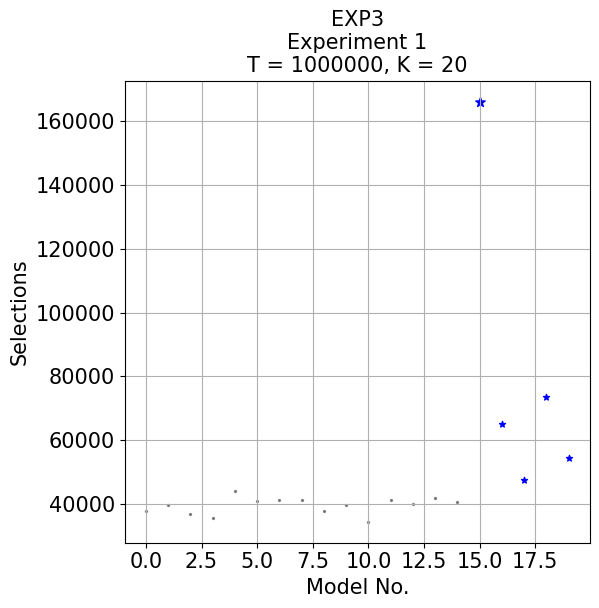

Optimal model recommended 4.079 times more often than sub-optimal models on average


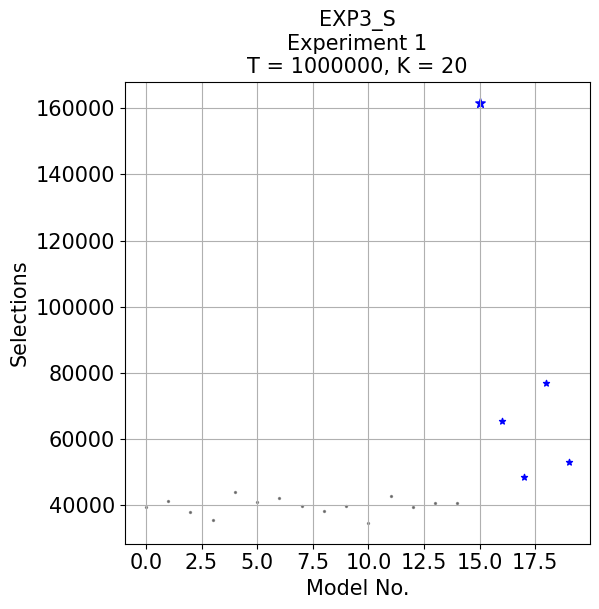

Optimal model recommended 0.998 times more often than sub-optimal models on average


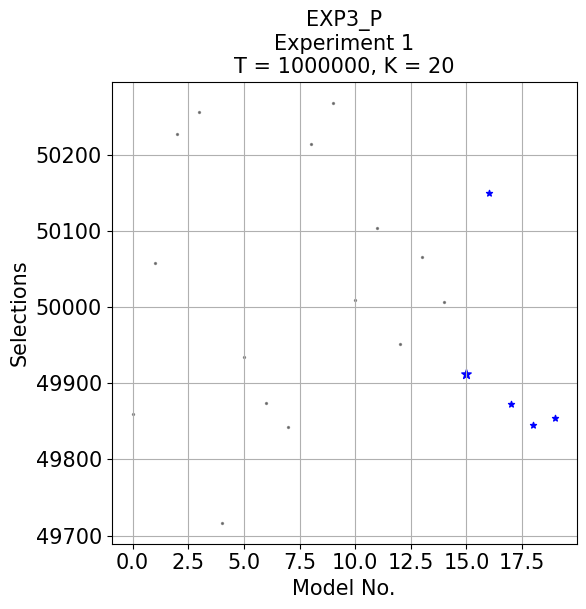

Optimal model recommended 3.983 times more often than sub-optimal models on average


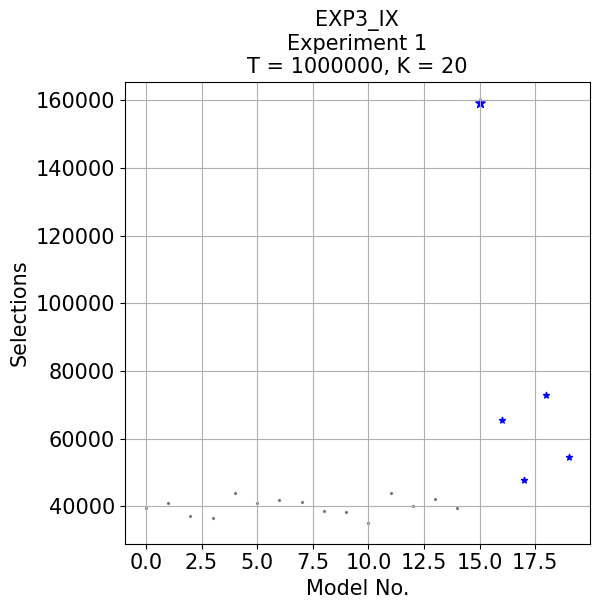

In [ ]:
input_string = '''EXP3
Optimal Pulls: 16.6106%
Pulls: [ 37755.  39805.  36874.  35594.  44158.  40849.  41118.  41386.  37832.
  39683.  34444.  41393.  40048.  41882.  40496. 166109.  65151.  47450.
  73660.  54333.]
Time: 46.4284s

EXP3_S
Optimal Pulls: 16.1723%
Pulls: [ 39176.  41130.  37650.  35308.  43737.  40764.  42090.  39695.  38180.
  39598.  34551.  42609.  39181.  40486.  40611. 161726.  65301.  48334.
  76815.  53078.]
Time: 50.6384s

EXP3_P
Optimal Pulls: 4.9911%
Pulls: [49860. 50058. 50227. 50256. 49717. 49935. 49874. 49842. 50214. 50268.
 50009. 50103. 49951. 50066. 50007. 49912. 50149. 49873. 49845. 49854.]
Time: 49.8456s

EXP3_IX
Optimal Pulls: 15.9334%
Pulls: [ 39559.  40876.  37119.  36631.  44043.  40910.  41939.  41375.  38719.
  38205.  35128.  43999.  40041.  42009.  39466. 159337.  65488.  47817.
  72805.  54554.]
Time: 47.5833s


T = 1000000, K = 20, Experiment: 1'''
PlotExpSelections(input_string)

Optimal model recommended 1.509 times more often than sub-optimal models on average


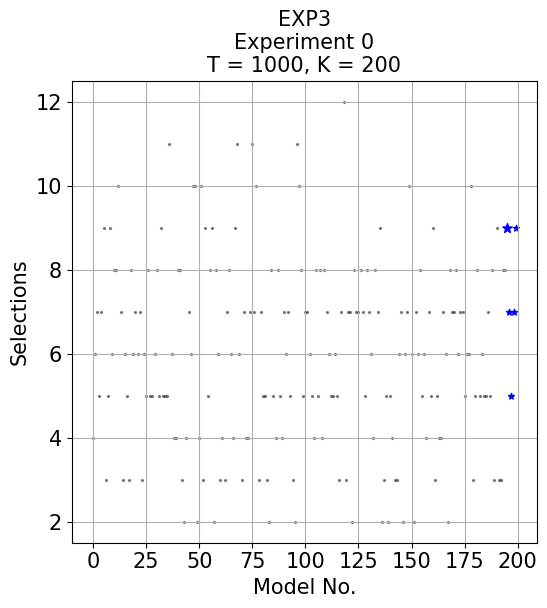

Optimal model recommended 1.685 times more often than sub-optimal models on average


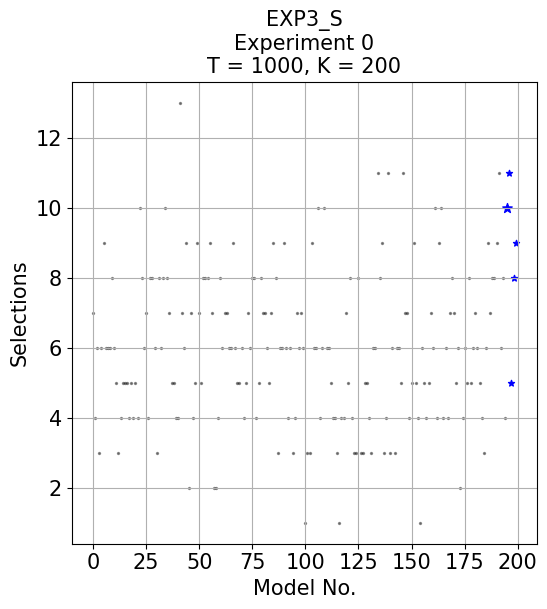

Optimal model recommended 1.179 times more often than sub-optimal models on average


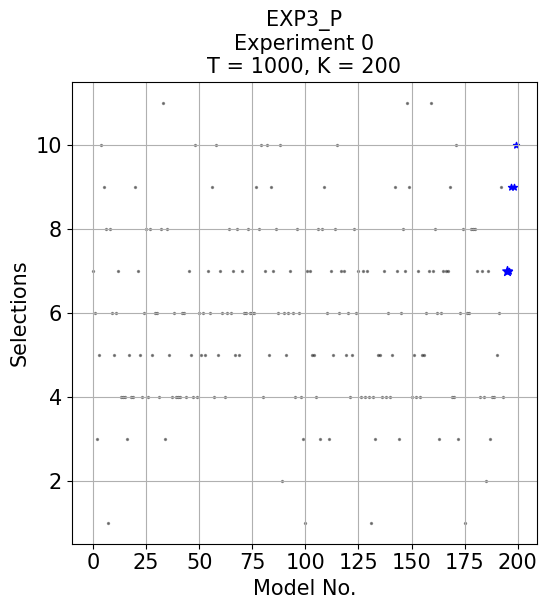

Optimal model recommended 0.664 times more often than sub-optimal models on average


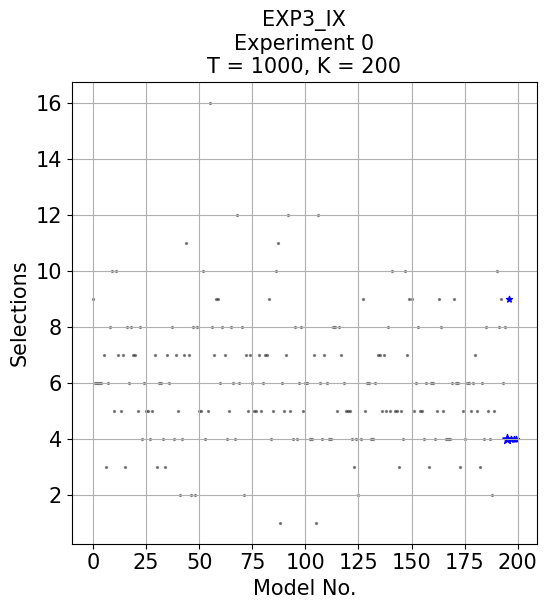

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.7500%
Pulls: [ 4.  6.  7.  5.  7.  9.  3.  5.  9.  6.  8.  8. 10.  7.  3.  6.  5.  3.
  8.  6.  7.  6.  7.  3.  6.  5.  8.  5.  5.  6.  8.  5.  9.  5.  5.  5.
 11.  6.  4.  4.  8.  8.  3.  2.  4.  7.  6. 10. 10.  2.  4. 10.  3.  9.
  5.  8.  9.  2.  8.  6.  3.  4.  3.  7.  8.  6.  4.  9. 11.  6.  3.  7.
  4.  4.  7. 11.  7. 10.  3.  7.  5.  5.  3.  2.  8.  5.  4.  8.  5.  4.
  7.  6.  7.  5.  3.  2. 11. 10.  8.  5.  7.  7.  6.  5.  4.  8.  5.  8.
  4.  8.  7.  6.  5.  5.  6.  5.  3.  7. 12.  3.  7.  7.  2.  8.  7.  7.
  8.  7.  5.  8.  7.  6.  4.  8.  7.  9.  2.  3.  5.  2.  5.  4.  3.  3.
  6.  7.  2.  6.  7. 10.  6.  2.  7.  6.  8.  5.  6.  4.  7.  5.  9.  3.
  5.  4.  4.  7.  6.  2.  8.  7.  7.  8.  6.  7.  7.  5.  6.  6. 10.  3.
  5.  8.  5.  6.  5.  5.  7.  5.  8.  3.  9.  3.  3.  8.  8.  9.  7.  5.
  7.  9.]
Time: 0.1529s

EXP3_S
Optimal Pulls: 0.8333%
Pulls: [ 7.  4.  6.  3.  6.  9.  6.  6.  6.  8.  6.  5.  3.  4.  5.  5.  5.  4.
  5.  4.  5.  4. 10.  8.  6.  7.  4.  8.  8.  6.  3.  8.  6.  8. 10.  8.
  7.  5.  5.  4.  4. 13.  7.  6.  9.  2.  7.  4.  5.  9.  7.  5.  8.  8.
  8.  9.  7.  2.  2.  4.  8.  6.  7.  7.  6.  6.  9.  6.  5.  5.  6.  4.
  5.  7.  6.  8.  8.  4.  5.  8.  7.  7.  6.  5.  7.  9.  8.  3.  6.  6.
  9.  6.  4.  6.  3.  4.  7.  6.  7.  6.  1.  3.  3.  9.  6.  6. 10.  4.
  6. 10.  6.  6.  5.  4.  4.  3.  1.  4.  4.  7.  5.  8.  4.  3.  3.  8.
  3.  3.  5.  5.  4.  3.  6.  6. 11.  8.  9.  3.  4. 11.  3.  6.  3.  6.
  6.  5. 11.  7.  7.  4.  5.  9.  5.  4.  1.  6.  5.  4.  5.  7.  6. 10.
  4.  9. 10.  4.  6.  4.  7.  8.  7.  5.  6.  2.  4.  6.  5.  8.  5.  6.
  7.  6.  5.  4.  3.  6.  9.  7.  8.  8.  9. 11.  6.  8.  4. 10. 11.  5.
  8.  9.]
Time: 0.1730s

EXP3_P
Optimal Pulls: 0.5833%
Pulls: [ 7.  6.  3.  5. 10.  9.  8.  1.  8.  6.  5.  6.  7.  4.  4.  4.  3.  5.
  4.  4.  9.  7.  5.  4.  6.  8.  4.  8.  5.  6.  6.  4.  8. 11.  3.  8.
  5.  4.  6.  4.  4.  4.  6.  6.  4.  7.  5.  4. 10.  4.  6.  5.  6.  5.
  7.  6.  9.  4. 10.  5.  7.  6.  4.  6.  8.  6.  7.  5.  8.  5.  7.  6.
  6.  8.  6.  6.  6.  9.  8. 10.  4.  7. 10.  5.  9.  7.  8.  6. 10.  2.
  6.  5.  6.  7.  6.  4.  8.  6.  4.  3.  1.  7.  7.  5.  5.  4.  8.  3.
  8.  9.  6.  3.  7.  5.  8. 10.  6.  7.  7.  5.  6.  4.  5.  8.  6.  7.
  4.  7.  4.  7.  4.  1.  4.  3.  5.  5.  4.  7.  4.  6.  4.  5.  9.  7.
  3.  6.  8.  7. 11.  9.  4.  5.  4.  7.  4.  5.  5.  6.  7. 11.  7.  8.
  6.  3.  6.  7.  7.  7.  9.  4.  4. 10.  3.  6.  8.  1.  6.  6.  8.  8.
  8.  7.  4.  7.  4.  2.  7.  3.  4.  4.  5.  6.  9.  4.  7.  7.  7.  9.
  9. 10.]
Time: 0.0810s

EXP3_IX
Optimal Pulls: 0.3333%
Pulls: [ 9.  6.  6.  6.  6.  7.  3.  6.  8. 10.  5. 10.  7.  5.  7.  3.  8.  6.
  8.  7.  7.  5.  8.  4.  6.  5.  5.  4.  5.  7.  3.  6.  6.  4.  3.  7.
  6.  8.  4.  7.  5.  2.  4.  7. 11.  7.  2.  8.  2.  8.  5.  5. 10.  4.
  5. 16.  8.  7.  9.  9.  6.  8.  7.  4.  5.  8.  6.  4. 12.  6.  8.  2.
  7.  5.  7.  6.  5.  5.  7.  5.  6.  7.  7.  9.  4.  5. 10. 11.  1.  6.
  5.  7. 12.  5.  4.  8.  4.  6.  8.  5.  6.  6.  4.  4.  7.  1. 12.  6.
  4.  7.  6.  4.  4.  8.  8.  5.  8.  7.  6.  5.  5.  5.  4.  3.  4.  2.
  4.  9.  5.  6.  6.  4.  4.  6.  7.  7.  5.  7.  5.  8.  5. 10.  5.  5.
  3.  5.  4. 10.  7.  9.  9.  5.  6.  8.  5.  5.  4.  6.  3.  6.  6.  4.
  5.  9.  8.  5.  4.  4.  4.  6.  9.  6.  6.  3.  5.  4.  6.  6.  5.  6.
  7.  5.  3.  6.  4.  8.  5.  4.  2.  5. 10.  8.  9.  6.  8.  4.  9.  4.
  4.  4.]
Time: 0.0771s


T = 1000, K = 200, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.139 times more often than sub-optimal models on average


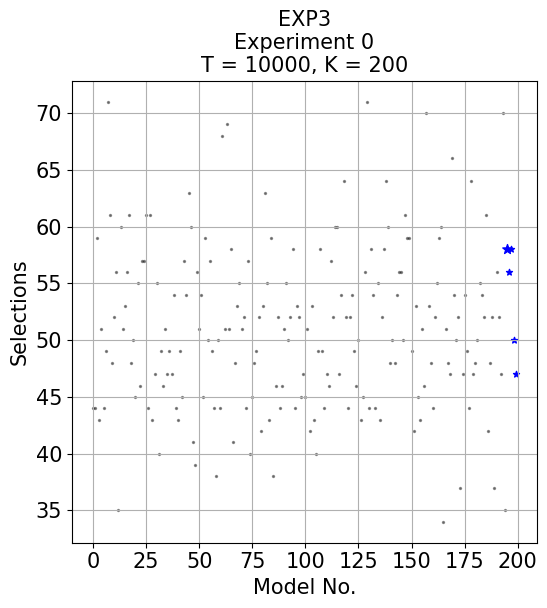

Optimal model recommended 0.922 times more often than sub-optimal models on average


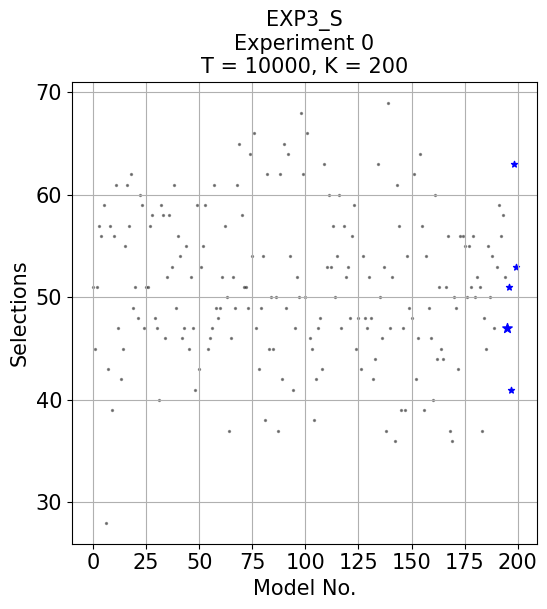

Optimal model recommended 0.724 times more often than sub-optimal models on average


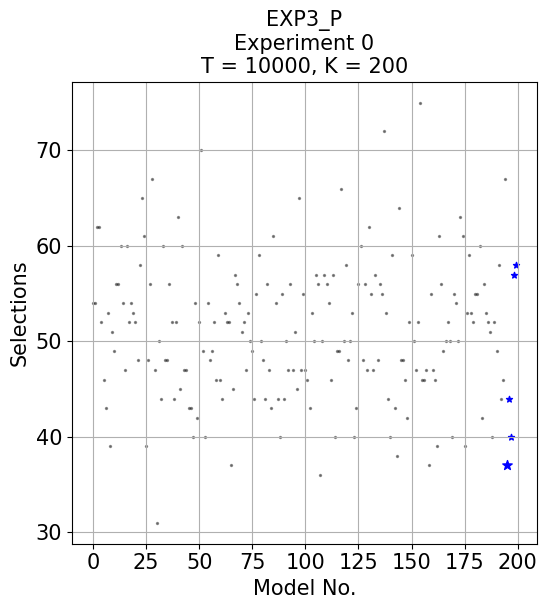

Optimal model recommended 0.824 times more often than sub-optimal models on average


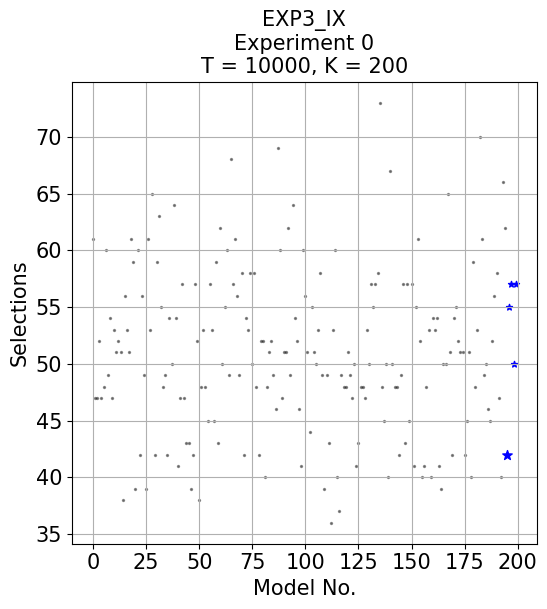

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5686%
Pulls: [44. 44. 59. 43. 51. 44. 49. 71. 61. 48. 52. 56. 35. 60. 51. 53. 56. 61.
 48. 50. 45. 55. 46. 57. 57. 61. 44. 61. 43. 47. 55. 40. 49. 46. 51. 47.
 49. 47. 54. 44. 43. 49. 45. 57. 54. 63. 60. 41. 39. 56. 51. 54. 45. 59.
 50. 57. 49. 44. 38. 50. 44. 68. 51. 69. 51. 58. 41. 48. 53. 55. 51. 52.
 44. 57. 40. 45. 48. 49. 52. 42. 53. 63. 55. 43. 59. 38. 46. 52. 44. 46.
 51. 55. 50. 52. 58. 44. 53. 52. 45. 47. 45. 51. 42. 53. 43. 40. 49. 58.
 49. 44. 47. 46. 57. 52. 60. 60. 47. 54. 64. 52. 44. 52. 54. 49. 46. 50.
 43. 45. 56. 71. 44. 58. 54. 44. 55. 43. 52. 58. 64. 60. 48. 50. 48. 54.
 56. 56. 50. 61. 59. 59. 49. 42. 53. 45. 43. 51. 46. 70. 53. 48. 44. 52.
 55. 59. 60. 34. 51. 48. 47. 66. 54. 50. 52. 37. 47. 54. 49. 44. 64. 47.
 48. 50. 55. 54. 52. 61. 42. 48. 52. 37. 56. 52. 47. 70. 35. 58. 56. 58.
 50. 47.]
Time: 0.8597s

EXP3_S
Optimal Pulls: 0.4608%
Pulls: [51. 45. 51. 57. 56. 59. 28. 43. 57. 39. 56. 61. 47. 42. 45. 55. 61. 57.
 62. 49. 51. 48. 60. 59. 47. 51. 51. 57. 58. 48. 47. 40. 59. 58. 46. 52.
 58. 53. 61. 49. 56. 54. 46. 47. 55. 45. 52. 47. 41. 59. 43. 53. 55. 59.
 45. 46. 47. 61. 49. 48. 49. 52. 57. 50. 37. 46. 52. 49. 61. 65. 58. 51.
 51. 49. 64. 54. 66. 47. 43. 49. 54. 38. 62. 45. 50. 45. 50. 37. 62. 42.
 65. 49. 64. 54. 41. 47. 52. 50. 68. 62. 50. 66. 46. 45. 38. 42. 47. 48.
 43. 63. 53. 60. 53. 57. 50. 54. 60. 47. 57. 52. 53. 48. 56. 59. 45. 48.
 43. 54. 48. 47. 52. 48. 42. 44. 63. 50. 46. 53. 37. 69. 47. 52. 36. 61.
 57. 39. 47. 39. 54. 49. 48. 62. 42. 46. 64. 57. 39. 54. 49. 46. 40. 60.
 44. 51. 45. 44. 51. 56. 37. 36. 50. 49. 43. 56. 56. 55. 50. 55. 51. 56.
 50. 52. 51. 37. 48. 45. 55. 50. 54. 47. 53. 59. 56. 58. 52. 47. 51. 41.
 63. 53.]
Time: 0.8297s

EXP3_P
Optimal Pulls: 0.3627%
Pulls: [54. 54. 62. 62. 52. 46. 43. 53. 39. 51. 49. 56. 56. 60. 54. 47. 60. 52.
 54. 53. 52. 48. 58. 65. 61. 39. 48. 56. 67. 47. 31. 50. 44. 60. 48. 48.
 56. 52. 44. 52. 63. 45. 60. 47. 47. 43. 43. 40. 54. 42. 52. 70. 49. 40.
 54. 48. 49. 52. 46. 59. 46. 44. 53. 52. 52. 37. 45. 57. 56. 54. 51. 52.
 47. 53. 50. 49. 44. 55. 59. 50. 48. 44. 56. 47. 43. 61. 54. 44. 40. 55.
 44. 50. 47. 56. 47. 51. 45. 65. 47. 55. 47. 46. 43. 53. 50. 57. 56. 36.
 50. 57. 56. 54. 46. 57. 40. 49. 49. 66. 50. 58. 48. 50. 53. 40. 43. 56.
 60. 48. 56. 47. 62. 55. 47. 57. 48. 56. 55. 72. 53. 44. 40. 59. 43. 38.
 64. 48. 48. 46. 42. 52. 59. 50. 47. 52. 75. 46. 46. 47. 37. 55. 47. 46.
 39. 61. 56. 49. 50. 52. 50. 40. 55. 54. 50. 63. 61. 39. 53. 59. 53. 52.
 55. 55. 60. 42. 56. 53. 52. 51. 40. 52. 49. 58. 44. 46. 67. 37. 44. 40.
 57. 58.]
Time: 1.3277s

EXP3_IX
Optimal Pulls: 0.4118%
Pulls: [61. 47. 47. 52. 47. 48. 60. 49. 54. 47. 53. 51. 52. 51. 38. 56. 53. 51.
 61. 59. 39. 60. 42. 56. 49. 39. 61. 53. 65. 42. 59. 63. 55. 48. 49. 42.
 54. 50. 64. 54. 41. 47. 57. 47. 43. 43. 39. 42. 57. 52. 38. 48. 53. 48.
 45. 57. 53. 45. 59. 43. 62. 50. 55. 60. 49. 68. 57. 61. 56. 49. 58. 42.
 54. 53. 58. 50. 58. 48. 42. 52. 52. 40. 48. 51. 52. 49. 46. 69. 60. 47.
 51. 51. 62. 49. 64. 54. 52. 46. 41. 60. 56. 51. 44. 55. 51. 50. 53. 58.
 49. 39. 49. 43. 36. 53. 60. 40. 37. 49. 48. 48. 51. 49. 47. 50. 41. 43.
 48. 48. 47. 53. 50. 57. 55. 57. 58. 73. 48. 45. 50. 40. 67. 50. 48. 48.
 42. 49. 57. 43. 57. 45. 57. 41. 55. 61. 52. 40. 41. 48. 53. 40. 54. 53.
 54. 41. 39. 50. 50. 65. 51. 42. 54. 55. 52. 51. 51. 42. 45. 51. 40. 59.
 48. 53. 70. 61. 49. 50. 46. 45. 52. 56. 58. 47. 40. 66. 62. 42. 55. 57.
 50. 57.]
Time: 1.1440s


T = 10000, K = 200, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.014 times more often than sub-optimal models on average


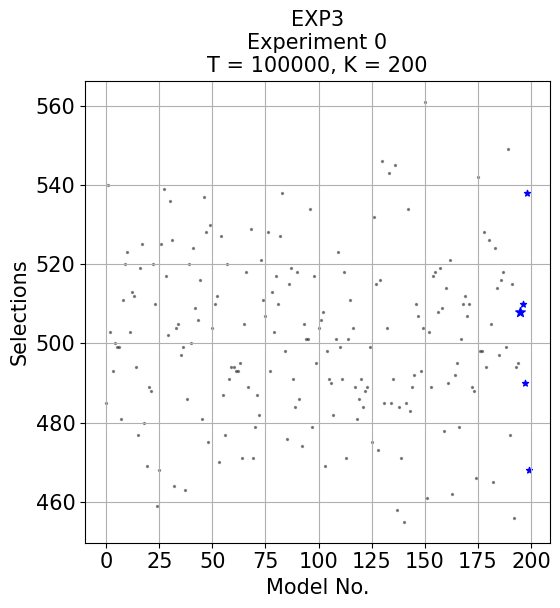

Optimal model recommended 1.013 times more often than sub-optimal models on average


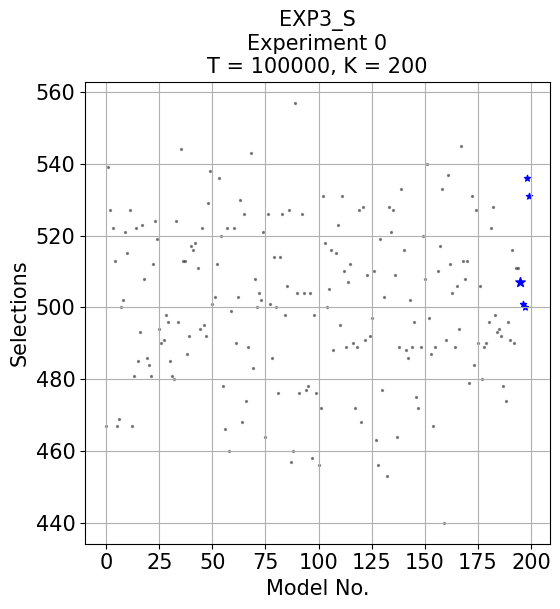

Optimal model recommended 1.034 times more often than sub-optimal models on average


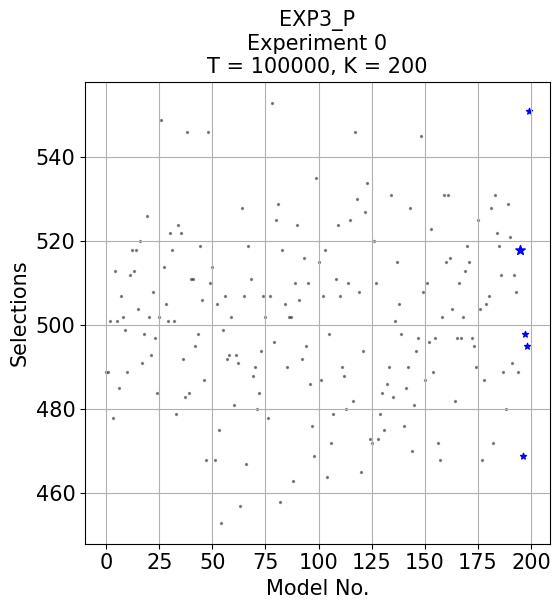

Optimal model recommended 0.976 times more often than sub-optimal models on average


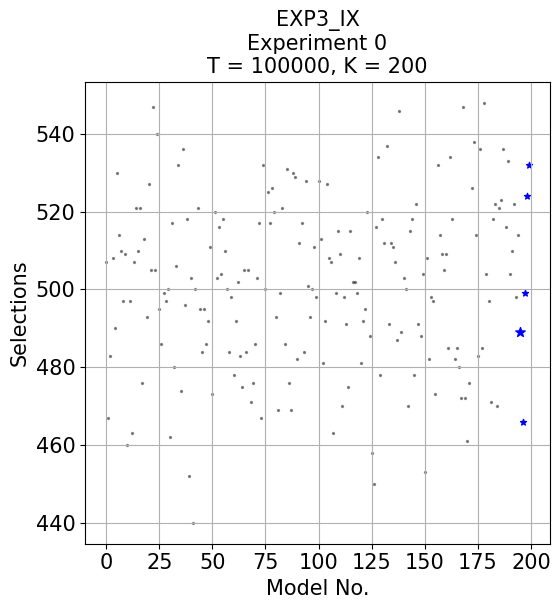

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5070%
Pulls: [485. 540. 503. 493. 500. 499. 499. 481. 511. 520. 523. 503. 513. 512.
 494. 477. 519. 525. 480. 469. 489. 488. 520. 510. 459. 468. 525. 539.
 517. 502. 536. 526. 464. 504. 505. 497. 499. 463. 486. 520. 500. 524.
 509. 506. 516. 481. 537. 528. 475. 530. 504. 510. 512. 470. 527. 487.
 477. 520. 491. 494. 494. 493. 493. 495. 471. 505. 518. 489. 529. 471.
 479. 487. 482. 521. 511. 507. 528. 493. 513. 503. 517. 510. 527. 538.
 498. 476. 515. 519. 491. 484. 518. 486. 474. 505. 501. 501. 534. 479.
 517. 495. 504. 506. 508. 469. 498. 491. 490. 482. 501. 523. 499. 491.
 518. 471. 501. 511. 504. 489. 481. 486. 491. 484. 488. 489. 499. 475.
 532. 515. 473. 516. 546. 485. 504. 543. 485. 491. 545. 458. 484. 471.
 455. 485. 534. 483. 489. 492. 510. 507. 493. 504. 561. 461. 503. 489.
 517. 518. 508. 519. 509. 478. 514. 490. 521. 462. 492. 495. 479. 501.
 510. 512. 507. 510. 489. 488. 466. 542. 498. 498. 528. 494. 526. 505.
 465. 524. 514. 497. 516. 518. 499. 549. 477. 515. 456. 494. 495. 508.
 510. 490. 538. 468.]
Time: 13.5536s

EXP3_S
Optimal Pulls: 0.5060%
Pulls: [467. 539. 527. 522. 513. 467. 469. 500. 502. 521. 515. 527. 467. 481.
 522. 485. 493. 523. 508. 486. 484. 481. 512. 524. 519. 494. 490. 491.
 498. 496. 485. 481. 480. 524. 496. 544. 513. 513. 487. 492. 517. 516.
 518. 511. 494. 522. 495. 492. 529. 538. 501. 503. 512. 536. 520. 478.
 466. 522. 460. 499. 522. 490. 503. 530. 468. 526. 474. 489. 543. 483.
 508. 500. 504. 502. 521. 464. 526. 501. 486. 514. 500. 476. 514. 526.
 498. 506. 527. 457. 460. 557. 504. 476. 526. 504. 477. 478. 504. 458.
 498. 476. 456. 472. 531. 518. 500. 505. 516. 488. 515. 523. 495. 531.
 510. 489. 507. 512. 490. 472. 489. 527. 468. 528. 491. 509. 492. 497.
 510. 463. 456. 519. 477. 503. 453. 528. 521. 527. 509. 464. 489. 533.
 516. 488. 486. 502. 489. 496. 475. 472. 489. 520. 508. 540. 497. 487.
 467. 489. 510. 517. 533. 440. 491. 537. 512. 504. 489. 506. 494. 545.
 513. 508. 513. 479. 531. 484. 527. 490. 506. 480. 489. 490. 496. 522.
 528. 498. 493. 494. 492. 478. 474. 496. 491. 516. 490. 511. 511. 507.
 501. 500. 536. 531.]
Time: 7.9557s

EXP3_P
Optimal Pulls: 0.5170%
Pulls: [489. 489. 501. 478. 513. 501. 485. 507. 502. 499. 489. 512. 518. 513.
 518. 504. 520. 491. 498. 526. 502. 493. 508. 497. 484. 502. 549. 514.
 505. 501. 522. 518. 501. 479. 524. 522. 492. 483. 546. 484. 511. 511.
 495. 498. 519. 506. 487. 468. 546. 510. 514. 468. 505. 475. 453. 499.
 507. 492. 493. 502. 481. 493. 491. 457. 528. 507. 467. 519. 511. 488.
 490. 480. 484. 494. 507. 502. 478. 507. 553. 496. 525. 529. 458. 518.
 505. 490. 502. 502. 463. 510. 524. 506. 492. 516. 495. 510. 486. 476.
 469. 535. 515. 487. 507. 518. 464. 498. 472. 479. 511. 524. 507. 490.
 488. 480. 510. 525. 482. 546. 530. 508. 465. 494. 527. 534. 473. 472.
 520. 510. 473. 479. 484. 475. 486. 490. 531. 483. 501. 515. 505. 498.
 476. 485. 490. 528. 470. 481. 494. 497. 545. 508. 487. 510. 496. 523.
 489. 497. 472. 468. 502. 531. 515. 531. 516. 504. 482. 497. 510. 497.
 502. 513. 519. 515. 497. 495. 490. 525. 504. 468. 487. 505. 507. 528.
 472. 531. 522. 519. 512. 489. 480. 529. 521. 491. 512. 508. 489. 518.
 469. 498. 495. 551.]
Time: 5.9730s

EXP3_IX
Optimal Pulls: 0.4880%
Pulls: [507. 467. 483. 508. 490. 530. 514. 510. 497. 509. 460. 497. 463. 507.
 521. 510. 521. 476. 513. 493. 527. 505. 547. 505. 540. 495. 486. 499.
 497. 500. 462. 517. 480. 506. 532. 474. 536. 496. 518. 452. 503. 440.
 500. 521. 495. 484. 495. 486. 492. 511. 473. 520. 503. 516. 504. 518.
 510. 500. 484. 498. 478. 492. 502. 483. 475. 505. 484. 505. 471. 476.
 486. 503. 517. 467. 532. 500. 525. 517. 526. 520. 493. 469. 499. 521.
 486. 531. 476. 469. 530. 529. 482. 512. 517. 484. 528. 501. 493. 500.
 511. 498. 528. 513. 481. 492. 527. 508. 507. 463. 499. 515. 509. 470.
 498. 491. 475. 515. 502. 502. 499. 508. 481. 492. 495. 520. 488. 458.
 450. 516. 534. 478. 518. 512. 537. 491. 512. 511. 507. 487. 546. 489.
 503. 500. 470. 515. 518. 478. 522. 491. 488. 504. 453. 508. 482. 498.
 497. 473. 532. 514. 509. 505. 509. 485. 534. 518. 482. 485. 480. 472.
 547. 472. 461. 476. 526. 538. 514. 483. 536. 485. 548. 504. 497. 471.
 518. 522. 470. 521. 523. 536. 516. 533. 504. 510. 522. 498. 514. 489.
 466. 499. 524. 532.]
Time: 6.1663s


T = 100000, K = 200, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.074 times more often than sub-optimal models on average


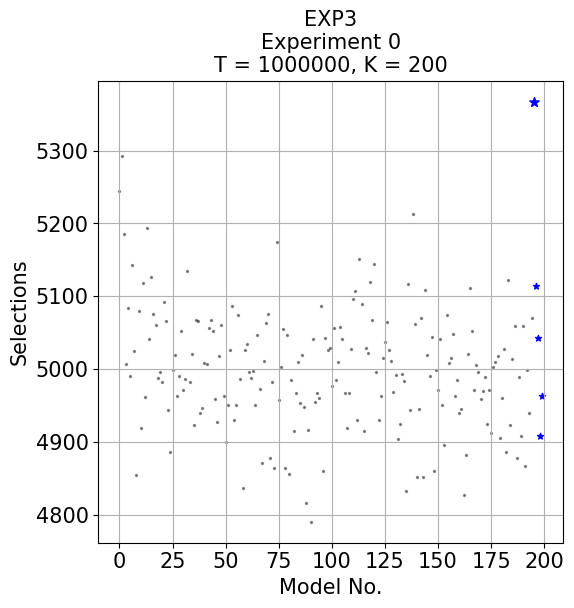

Optimal model recommended 1.061 times more often than sub-optimal models on average


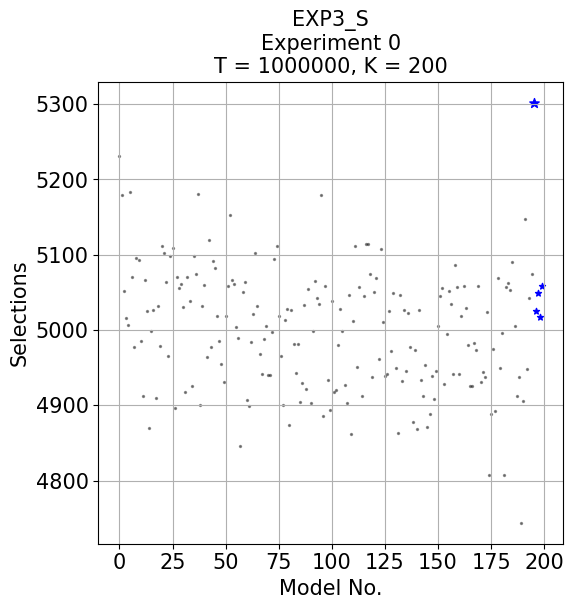

Optimal model recommended 1.009 times more often than sub-optimal models on average


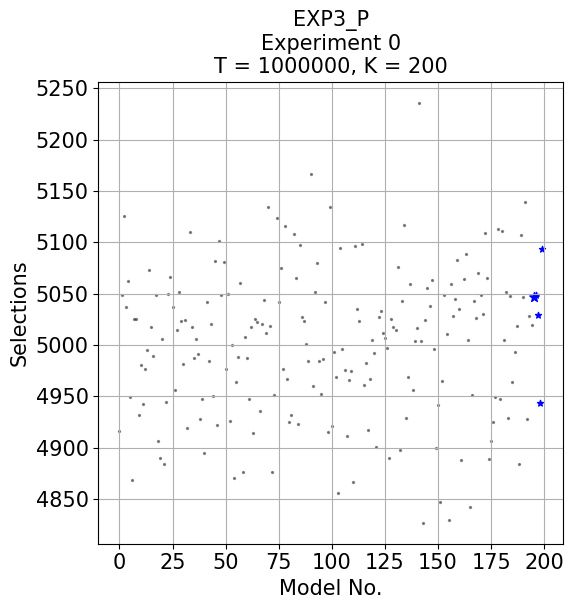

Optimal model recommended 1.036 times more often than sub-optimal models on average


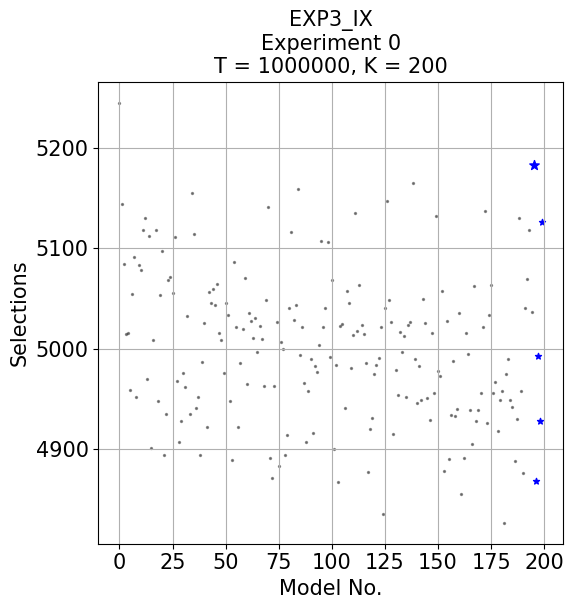

In [ ]:
input_string = '''EXP3
Optimal Pulls: 0.5366%
Pulls: [5245. 5293. 5185. 5007. 5084. 4991. 5143. 5025. 4855. 5080. 4919. 5119.
 4962. 5194. 5042. 5126. 5076. 5061. 4988. 4997. 4983. 5092. 5066. 4944.
 4887. 4999. 5020. 4964. 4991. 5052. 4972. 4987. 5135. 4982. 5021. 4924.
 5068. 5066. 4940. 4947. 5008. 5007. 5056. 5068. 5053. 4959. 4928. 5018.
 5061. 4964. 4901. 4951. 5026. 5087. 4931. 4951. 5074. 4987. 4837. 5027.
 5035. 4997. 4988. 4998. 4951. 5047. 4973. 4871. 5012. 5063. 5076. 4878.
 4982. 4865. 5174. 4958. 5003. 5055. 4864. 5047. 4856. 4985. 4915. 4968.
 5010. 4954. 5020. 4949. 4817. 4917. 4791. 5041. 4955. 4967. 4960. 5087.
 4861. 5043. 5026. 5029. 4977. 5056. 4985. 5010. 5058. 5042. 4967. 4919.
 4968. 5028. 5096. 5108. 4930. 5151. 5089. 4916. 5029. 5022. 5120. 5067.
 5144. 4996. 4930. 4963. 5016. 5038. 5065. 5026. 5011. 4969. 4992. 4904.
 4925. 4994. 4984. 4833. 5117. 4944. 5213. 5062. 4853. 4946. 5070. 4852.
 5109. 5020. 4991. 5044. 4860. 4999. 4972. 5041. 4951. 4896. 5074. 5009.
 5015. 5048. 4963. 4986. 4940. 4945. 4827. 4883. 5021. 5112. 5053. 4971.
 5006. 4996. 4959. 4970. 4989. 4925. 4972. 4913. 5003. 5010. 5018. 4906.
 4960. 5028. 4887. 5123. 4923. 5014. 5060. 4879. 4990. 4908. 5059. 4867.
 4999. 4940. 5071. 5367. 5114. 5043. 4909. 4963.]
Time: 56.9554s

EXP3_S
Optimal Pulls: 0.5301%
Pulls: [5231. 5179. 5052. 5016. 5007. 5184. 5071. 4978. 5096. 5093. 4985. 4912.
 5066. 5025. 4870. 4999. 5026. 4910. 5032. 4979. 5111. 5102. 5064. 4965.
 5099. 5109. 4897. 5071. 5056. 5061. 5030. 4918. 5071. 5039. 4925. 5099.
 5075. 5181. 4900. 5032. 5060. 4964. 5120. 4977. 5092. 5082. 5018. 4986.
 4955. 4931. 5018. 5058. 5153. 5067. 5061. 5004. 4989. 4846. 5050. 5064.
 4907. 4899. 4984. 5021. 5102. 5032. 4968. 4941. 4988. 5005. 4940. 4940.
 4997. 5095. 5112. 5018. 4965. 4901. 5013. 5028. 4874. 5027. 4981. 4943.
 4981. 4905. 4930. 5033. 4921. 5054. 4903. 4999. 5065. 5042. 5035. 5180.
 4886. 5058. 4933. 4894. 5038. 4918. 4920. 4980. 5028. 4999. 4927. 4903.
 5047. 4862. 5012. 5112. 4951. 5057. 4912. 5045. 5114. 5114. 5074. 4938.
 5051. 5069. 4962. 5108. 5011. 4939. 4941. 5025. 4972. 5049. 4949. 4863.
 5047. 4932. 5026. 4945. 5022. 4978. 4878. 4973. 4868. 5027. 4934. 4913.
 4953. 4871. 4888. 4939. 4908. 4945. 5006. 5045. 5056. 4928. 4995. 5052.
 5034. 4942. 5087. 5057. 4942. 5018. 5058. 5029. 4980. 4926. 4926. 4983.
 4973. 5059. 4931. 4944. 4937. 5024. 4807. 4889. 4975. 4893. 5069. 4949.
 4996. 4808. 5057. 5063. 5053. 5091. 5005. 4912. 4938. 4744. 4906. 5148.
 4948. 5042. 5075. 5302. 5025. 5049. 5017. 5059.]
Time: 59.8534s

EXP3_P
Optimal Pulls: 0.5046%
Pulls: [4916. 5049. 5126. 5037. 5062. 4949. 4869. 5025. 5025. 4932. 4981. 4943.
 4977. 4995. 5073. 5018. 4989. 5049. 4907. 4890. 5006. 4884. 4945. 5050.
 5066. 5037. 4956. 5015. 5052. 5023. 4982. 5024. 4919. 5110. 5018. 4987.
 5006. 4991. 4928. 4947. 4895. 5042. 4984. 5021. 4950. 5082. 4922. 5101.
 5049. 5081. 4977. 5050. 4926. 5000. 4871. 4964. 4988. 5060. 4876. 5008.
 4987. 4947. 5018. 4914. 5025. 5022. 4936. 5021. 5044. 5012. 5134. 5019.
 4876. 4951. 5124. 5042. 5075. 4977. 5116. 4967. 4925. 4932. 5108. 5065.
 4923. 5097. 5027. 5023. 5001. 4984. 5167. 4960. 5052. 5080. 4984. 4952.
 4986. 5042. 4915. 5134. 4921. 4993. 4969. 4856. 5095. 4996. 4976. 4911.
 4966. 4975. 4867. 5096. 5035. 5023. 5098. 4961. 4983. 4917. 4967. 5005.
 4992. 4901. 5027. 5033. 5012. 5007. 4997. 4890. 5025. 5018. 5015. 5076.
 4898. 5043. 5117. 4929. 4969. 5059. 4956. 5004. 5017. 5236. 5004. 4827.
 5024. 5056. 5038. 5063. 4996. 4900. 4942. 4847. 4965. 5049. 5011. 4830.
 5059. 5028. 5045. 5083. 5035. 4888. 5064. 5089. 5005. 4842. 4951. 5043.
 5026. 5070. 5049. 5030. 5109. 5065. 4889. 4907. 4925. 4949. 5113. 4947.
 5111. 5005. 5052. 4929. 5048. 4964. 4993. 5019. 4884. 5107. 5047. 5139.
 4928. 5028. 5020. 5047. 5049. 5029. 4944. 5094.]
Time: 66.0060s

EXP3_IX
Optimal Pulls: 0.5182%
Pulls: [5245. 5144. 5084. 5015. 5016. 4959. 5055. 5091. 4952. 5083. 5079. 5118.
 5130. 4970. 5112. 4901. 5009. 5118. 4948. 5054. 5097. 4894. 4935. 5069.
 5072. 5056. 5111. 4968. 4907. 4928. 4976. 4962. 5033. 4935. 5155. 5114.
 4941. 4952. 4894. 4987. 5026. 4922. 5057. 5046. 5060. 5044. 5065. 5016.
 5009. 4976. 5046. 5034. 4948. 4889. 5086. 5022. 4922. 4986. 5020. 5071.
 4965. 5036. 5028. 5011. 5031. 4997. 5023. 5010. 4963. 5049. 5141. 4891.
 4872. 4963. 5027. 4883. 5007. 5000. 4894. 4914. 5041. 5116. 5029. 5044.
 5159. 4994. 5022. 4966. 4907. 4958. 4990. 4916. 4983. 4977. 5004. 5107.
 5022. 5041. 5106. 4992. 5069. 4900. 4984. 4868. 5023. 5025. 4941. 5058.
 5046. 4981. 5014. 5135. 5018. 5064. 5024. 5015. 4986. 4877. 4920. 4931.
 4975. 4984. 4991. 5022. 4836. 5041. 5147. 5049. 5027. 4915. 4979. 4954.
 5017. 4997. 5013. 4952. 5024. 5027. 5165. 4990. 4946. 4983. 4949. 5050.
 5026. 4951. 4929. 5016. 4956. 5132. 4978. 4973. 5058. 4878. 5028. 4890.
 4934. 4988. 4933. 4940. 5036. 4856. 4891. 5016. 4995. 4939. 4905. 5063.
 4928. 4939. 4956. 5022. 5137. 4926. 5034. 5064. 4956. 4967. 4918. 4949.
 4958. 4827. 4975. 4990. 4949. 4942. 4888. 4930. 5130. 4958. 4876. 5041.
 5070. 5118. 5037. 5183. 4869. 4993. 4928. 5126.]
Time: 58.1267s

T = 1000000, K = 200, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.554 times more often than sub-optimal models on average


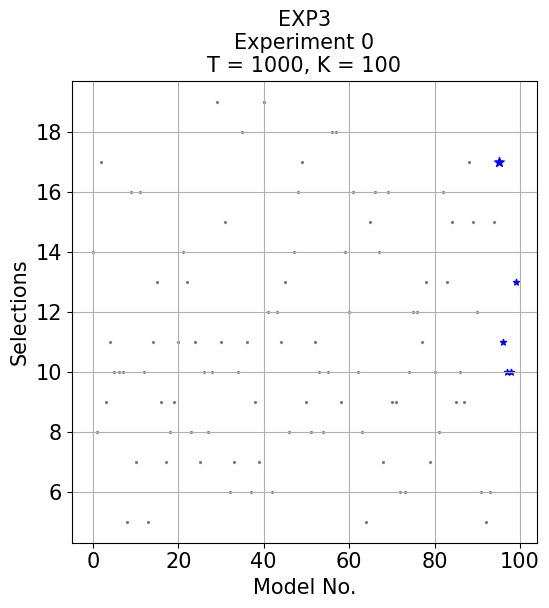

Optimal model recommended 0.541 times more often than sub-optimal models on average


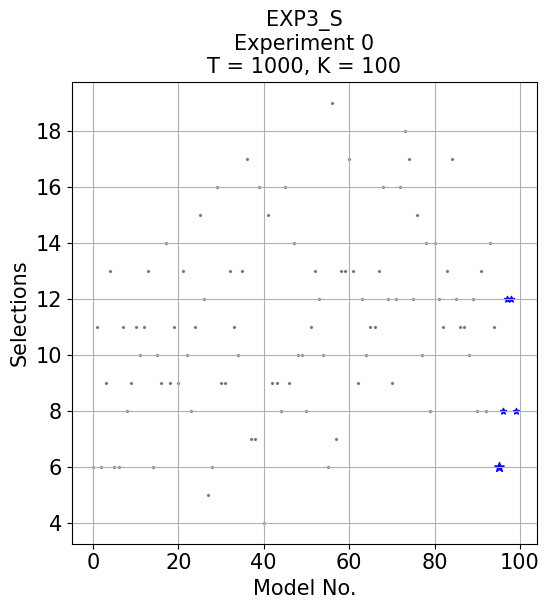

Optimal model recommended 1.001 times more often than sub-optimal models on average


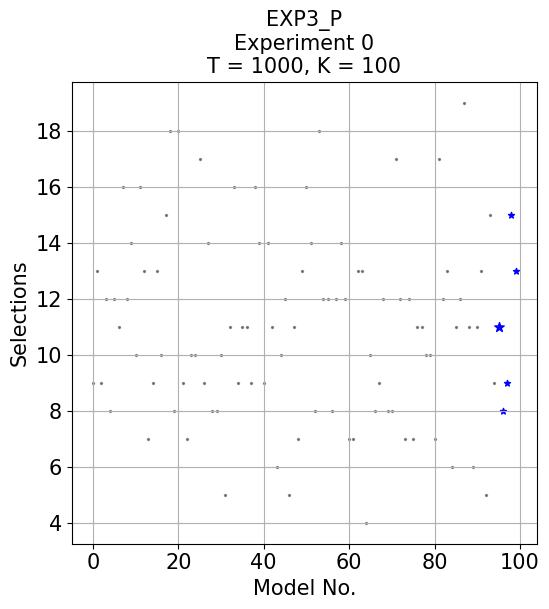

Optimal model recommended 1.273 times more often than sub-optimal models on average


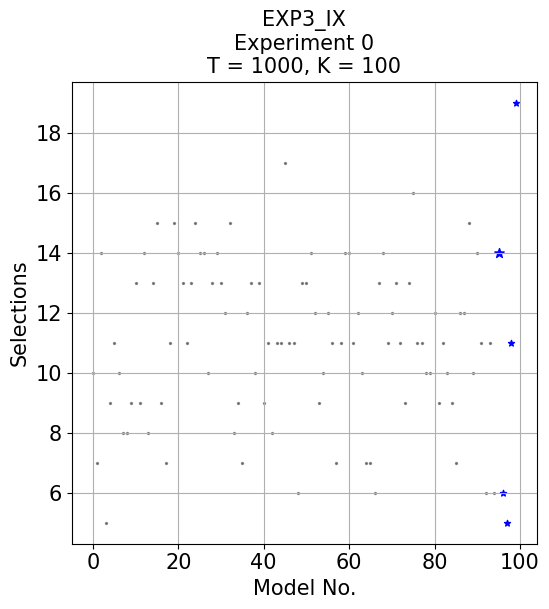

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.5455%
Pulls: [14.  8. 17.  9. 11. 10. 10. 10.  5. 16.  7. 16. 10.  5. 11. 13.  9.  7.
  8.  9. 11. 14. 13.  8. 11.  7. 10.  8. 10. 19. 11. 15.  6.  7. 10. 18.
 11.  6.  9.  7. 19. 12.  6. 12. 11. 13.  8. 14. 16. 17.  9.  8. 11. 10.
  8. 10. 18. 18.  9. 14. 12. 16. 10.  8.  5. 15. 16. 14.  7. 16.  9.  9.
  6.  6. 10. 12. 12. 11. 13.  7. 10.  8. 16. 13. 15.  9. 10.  9. 17. 15.
 12.  6.  5.  6. 15. 17. 11. 10. 10. 13.]
Time: 0.1132s

EXP3_S
Optimal Pulls: 0.5455%
Pulls: [ 6. 11.  6.  9. 13.  6.  6. 11.  8.  9. 11. 10. 11. 13.  6. 10.  9. 14.
  9. 11.  9. 13. 10.  8. 11. 15. 12.  5.  6. 16.  9.  9. 13. 11. 10. 13.
 17.  7.  7. 16.  4. 15.  9.  9.  8. 16.  9. 14. 10. 10.  8. 11. 13. 12.
 10.  6. 19.  7. 13. 13. 17. 13.  9. 12. 10. 11. 11. 13. 16. 12.  9. 12.
 16. 18. 17. 12. 15. 10. 14.  8. 14. 12. 11. 13. 17. 12. 11. 11. 10. 12.
  8. 13.  8. 14. 11.  6.  8. 12. 12.  8.]
Time: 0.1726s

EXP3_P
Optimal Pulls: 1.0000%
Pulls: [ 9. 13.  9. 12.  8. 12. 11. 16. 12. 14. 10. 16. 13.  7.  9. 13. 10. 15.
 18.  8. 18.  9.  7. 10. 10. 17.  9. 14.  8.  8. 10.  5. 11. 16.  9. 11.
 11.  9. 16. 14.  9. 14. 11.  6. 10. 12.  5. 11.  7. 13. 16. 14.  8. 18.
 12. 12.  8. 12. 14. 12.  7.  7. 13. 13.  4. 10.  8.  9. 12.  8.  8. 17.
 12.  7. 12.  7. 11. 11. 10. 10.  7. 17. 12. 13.  6. 11. 12. 19. 11.  6.
 11. 13.  5. 15.  9. 11.  8.  9. 15. 13.]
Time: 0.0882s

EXP3_IX
Optimal Pulls: 1.2727%
Pulls: [10.  7. 14.  5.  9. 11. 10.  8.  8.  9. 13.  9. 14.  8. 13. 15.  9.  7.
 11. 15. 14. 13. 11. 13. 15. 14. 14. 10. 13. 14. 13. 12. 15.  8.  9.  7.
 12. 13. 10. 13.  9. 11.  8. 11. 11. 17. 11. 11.  6. 13. 13. 14. 12.  9.
 10. 12. 11.  7. 11. 14. 14. 11. 12. 10.  7.  7.  6. 13. 14. 11. 12. 13.
 11.  9. 13. 16. 11. 11. 10. 10. 12.  9. 11. 10.  9.  7. 12. 12. 15. 10.
 14. 11.  6. 11.  6. 14.  6.  5. 11. 19.]
Time: 0.1105s


T = 1000, K = 100, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.060 times more often than sub-optimal models on average


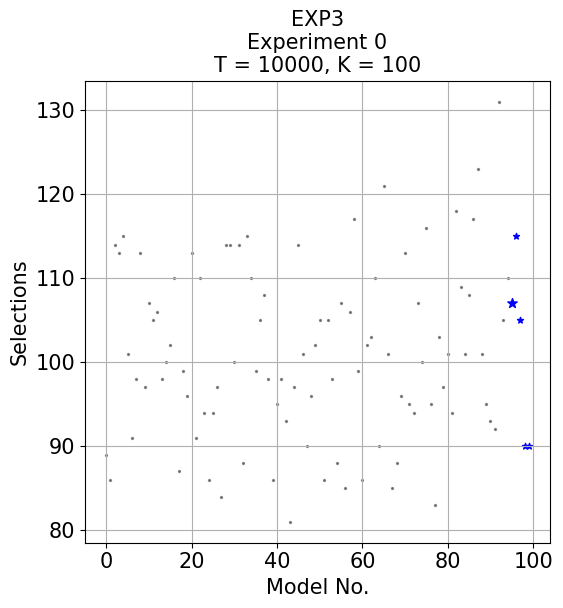

Optimal model recommended 1.017 times more often than sub-optimal models on average


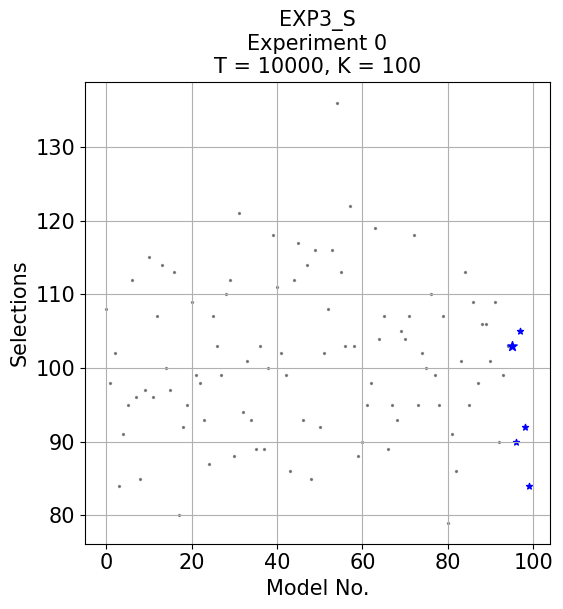

Optimal model recommended 1.045 times more often than sub-optimal models on average


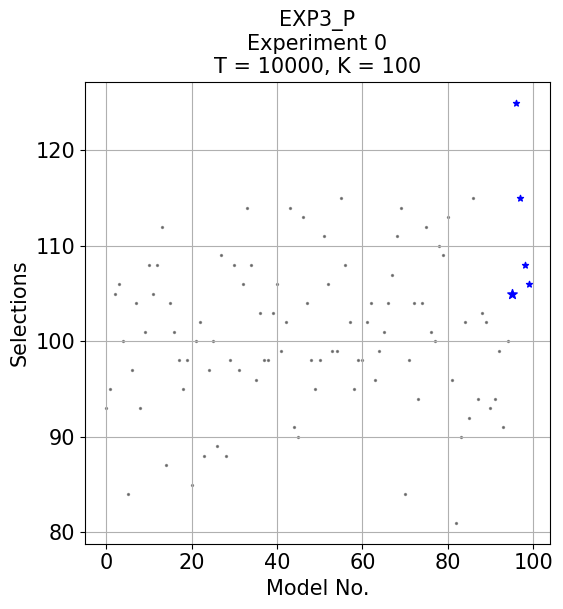

Optimal model recommended 1.219 times more often than sub-optimal models on average


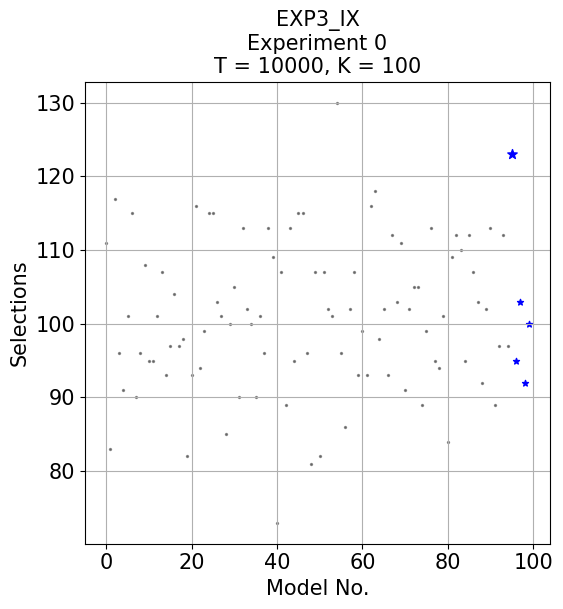

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.0594%
Pulls: [ 89.  86. 114. 113. 115. 101.  91.  98. 113.  97. 107. 105. 106.  98.
 100. 102. 110.  87.  99.  96. 113.  91. 110.  94.  86.  94.  97.  84.
 114. 114. 100. 114.  88. 115. 110.  99. 105. 108.  98.  86.  95.  98.
  93.  81.  97. 114. 101.  90.  96. 102. 105.  86. 105.  98.  88. 107.
  85. 106. 117.  99.  86. 102. 103. 110.  90. 121. 101.  85.  88.  96.
 113.  95.  94. 107. 100. 116.  95.  83. 103.  97. 101.  94. 118. 109.
 101. 108. 117. 123. 101.  95.  93.  92. 131. 105. 110. 107. 115. 105.
  90.  90.]
Time: 0.7890s

EXP3_S
Optimal Pulls: 1.0198%
Pulls: [108.  98. 102.  84.  91.  95. 112.  96.  85.  97. 115.  96. 107. 114.
 100.  97. 113.  80.  92.  95. 109.  99.  98.  93.  87. 107. 103.  99.
 110. 112.  88. 121.  94. 101.  93.  89. 103.  89. 100. 118. 111. 102.
  99.  86. 112. 117.  93. 114.  85. 116.  92. 102. 108. 116. 136. 113.
 103. 122. 103.  88.  90.  95.  98. 119. 104. 107.  89.  95.  93. 105.
 104. 107. 118.  95. 102. 100. 110.  99.  95. 107.  79.  91.  86. 101.
 113.  95. 109.  98. 106. 106. 101. 109.  90.  99. 103. 103.  90. 105.
  92.  84.]
Time: 0.9026s

EXP3_P
Optimal Pulls: 1.0396%
Pulls: [ 93.  95. 105. 106. 100.  84.  97. 104.  93. 101. 108. 105. 108. 112.
  87. 104. 101.  98.  95.  98.  85. 100. 102.  88.  97. 100.  89. 109.
  88.  98. 108.  97. 106. 114. 108.  96. 103.  98.  98. 103. 106.  99.
 102. 114.  91.  90. 113. 104.  98.  95.  98. 111. 106.  99.  99. 115.
 108. 102.  95.  98.  98. 102. 104.  96.  99. 101. 104. 107. 111. 114.
  84.  98. 104.  94. 104. 112. 101. 100. 110. 109. 113.  96.  81.  90.
 102.  92. 115.  94. 103. 102.  93.  94.  99.  91. 100. 105. 125. 115.
 108. 106.]
Time: 1.3504s

EXP3_IX
Optimal Pulls: 1.2178%
Pulls: [111.  83. 117.  96.  91. 101. 115.  90.  96. 108.  95.  95. 101. 107.
  93.  97. 104.  97.  98.  82.  93. 116.  94.  99. 115. 115. 103. 101.
  85. 100. 105.  90. 113. 102. 100.  90. 101.  96. 113. 109.  73. 107.
  89. 113.  95. 115. 115.  96.  81. 107.  82. 107. 102. 101. 130.  96.
  86. 102. 107.  93.  99.  93. 116. 118.  98. 102.  93. 112. 103. 111.
  91. 102. 105. 105.  89.  99. 113.  95.  94. 101.  84. 109. 112. 110.
  95. 112. 107. 103.  92. 102. 113.  89.  97. 112.  97. 123.  95. 103.
  92. 100.]
Time: 1.2259s


T = 10000, K = 100, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.036 times more often than sub-optimal models on average


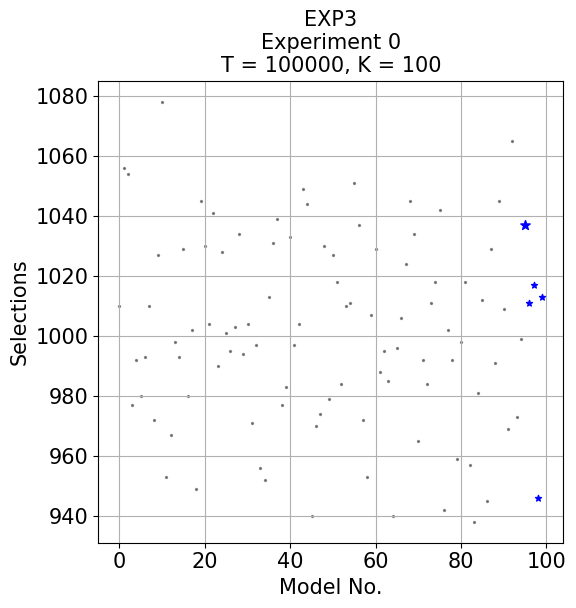

Optimal model recommended 1.090 times more often than sub-optimal models on average


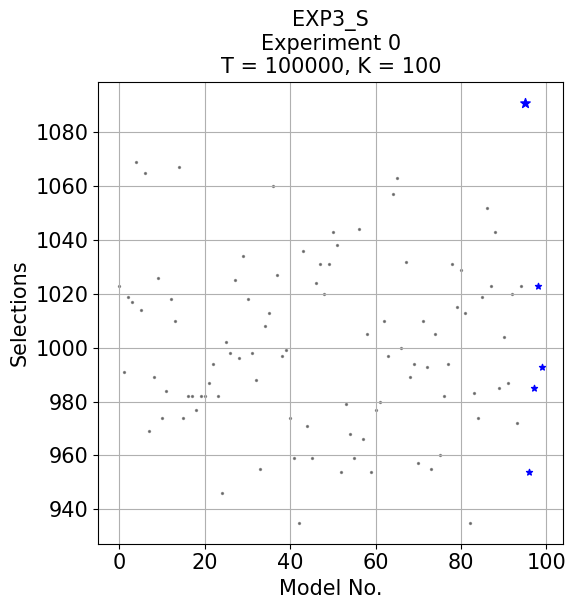

Optimal model recommended 1.002 times more often than sub-optimal models on average


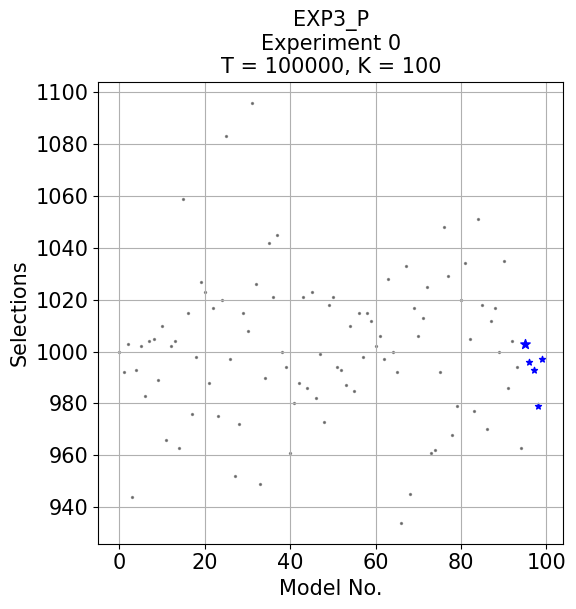

Optimal model recommended 1.106 times more often than sub-optimal models on average


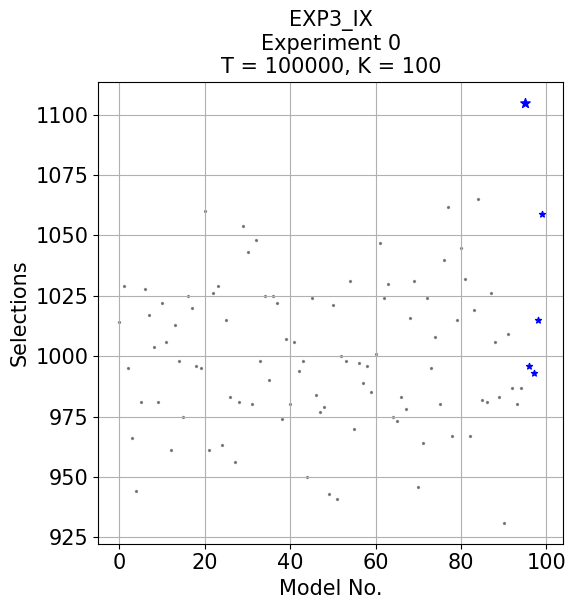

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.0360%
Pulls: [1010. 1056. 1054.  977.  992.  980.  993. 1010.  972. 1027. 1078.  953.
  967.  998.  993. 1029.  980. 1002.  949. 1045. 1030. 1004. 1041.  990.
 1028. 1001.  995. 1003. 1034.  994. 1004.  971.  997.  956.  952. 1013.
 1031. 1039.  977.  983. 1033.  997. 1004. 1049. 1044.  940.  970.  974.
 1030.  979. 1027. 1018.  984. 1010. 1011. 1051. 1037.  972.  953. 1007.
 1029.  988.  995.  985.  940.  996. 1006. 1024. 1045. 1034.  965.  992.
  984. 1011. 1018. 1042.  942. 1002.  992.  959.  998. 1018.  957.  938.
  981. 1012.  945. 1029.  991. 1045. 1009.  969. 1065.  973.  999. 1037.
 1011. 1017.  946. 1013.]
Time: 6.8870s

EXP3_S
Optimal Pulls: 1.0899%
Pulls: [1023.  991. 1019. 1017. 1069. 1014. 1065.  969.  989. 1026.  974.  984.
 1018. 1010. 1067.  974.  982.  982.  977.  982.  982.  987.  994.  982.
  946. 1002.  998. 1025.  996. 1034. 1018.  998.  988.  955. 1008. 1013.
 1060. 1027.  997.  999.  974.  959.  935. 1036.  971.  959. 1024. 1031.
 1020. 1031. 1043. 1038.  954.  979.  968.  959. 1044.  966. 1005.  954.
  977.  980. 1010.  997. 1057. 1063. 1000. 1032.  989.  994.  957. 1010.
  993.  955. 1005.  960.  982.  994. 1031. 1015. 1029. 1013.  935.  983.
  974. 1019. 1052. 1023. 1043.  985. 1004.  987. 1020.  972. 1023. 1091.
  954.  985. 1023.  993.]
Time: 4.7635s

EXP3_P
Optimal Pulls: 1.0020%
Pulls: [1000.  992. 1003.  944.  993. 1002.  983. 1004. 1005.  989. 1010.  966.
 1002. 1004.  963. 1059. 1015.  976.  998. 1027. 1023.  988. 1017.  975.
 1020. 1083.  997.  952.  972. 1015. 1008. 1096. 1026.  949.  990. 1042.
 1021. 1045. 1000.  994.  961.  980.  988. 1021.  986. 1023.  982.  999.
  973. 1018. 1021.  994.  993.  987. 1010.  985. 1015.  998. 1015. 1012.
 1002. 1006.  997. 1028. 1000.  992.  934. 1033.  945. 1017. 1006. 1013.
 1025.  961.  962.  992. 1048. 1029.  968.  979. 1020. 1034. 1005.  977.
 1051. 1018.  970. 1012. 1017. 1000. 1035.  986. 1004.  994.  963. 1003.
  996.  993.  979.  997.]
Time: 5.2109s

 EXP3_IX
Optimal Pulls: 1.1039%
Pulls: [1014. 1029.  995.  966.  944.  981. 1028. 1017. 1004.  981. 1022. 1006.
  961. 1013.  998.  975. 1025. 1020.  996.  995. 1060.  961. 1026. 1029.
  963. 1015.  983.  956.  981. 1054. 1043.  980. 1048.  998. 1025.  990.
 1025. 1022.  974. 1007.  980. 1006.  994.  998.  950. 1024.  984.  977.
  979.  943. 1021.  941. 1000.  998. 1031.  970.  997.  989.  996.  985.
 1001. 1047. 1024. 1030.  975.  973.  983.  978. 1016. 1031.  946.  964.
 1024.  995. 1008.  980. 1040. 1062.  967. 1015. 1045. 1032.  967. 1019.
 1065.  982.  981. 1026. 1006.  983.  931. 1009.  987.  980.  987. 1105.
  996.  993. 1015. 1059.]
Time: 4.9744s


T = 100000, K = 100, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.135 times more often than sub-optimal models on average


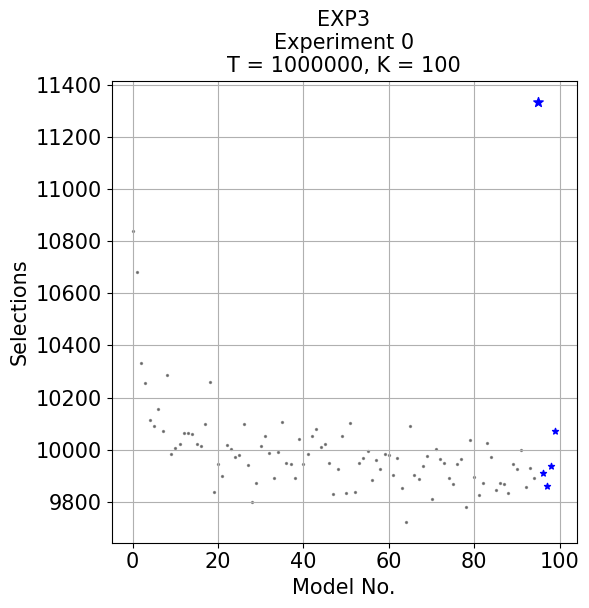

Optimal model recommended 1.148 times more often than sub-optimal models on average


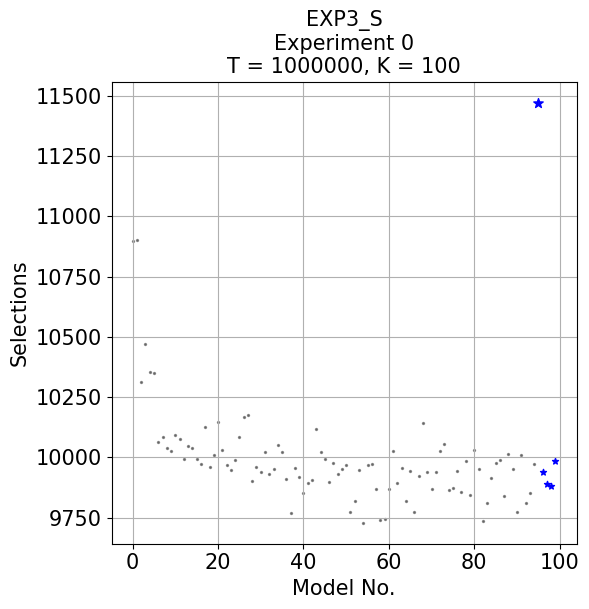

Optimal model recommended 0.999 times more often than sub-optimal models on average


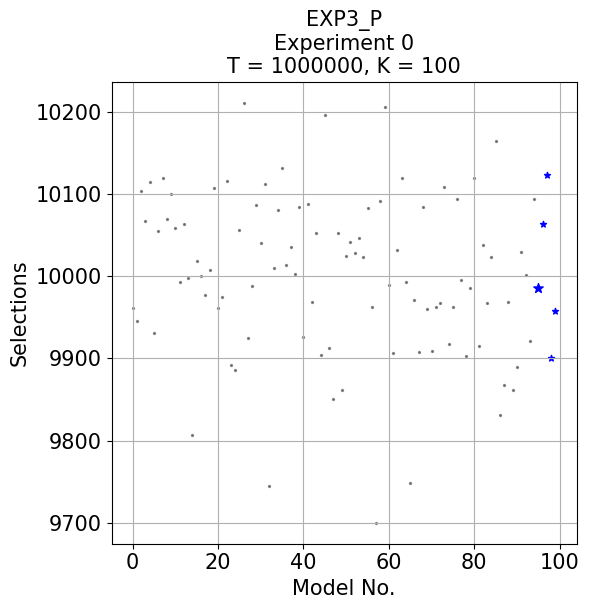

Optimal model recommended 1.109 times more often than sub-optimal models on average


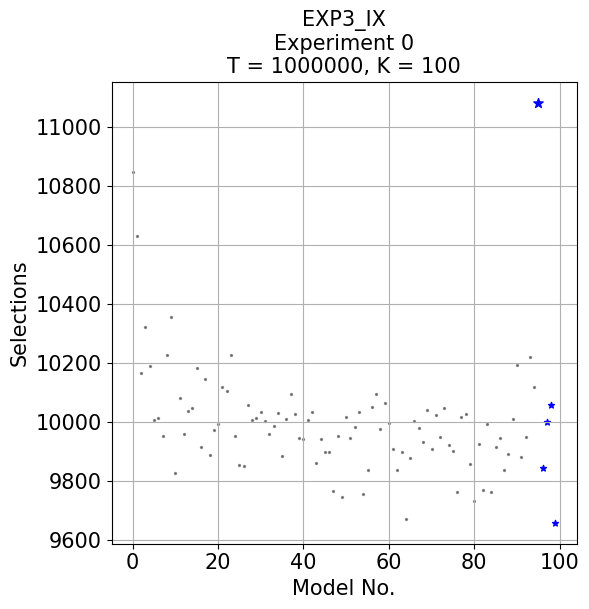

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.1334%
Pulls: [10841. 10680. 10333. 10255. 10116. 10091. 10155. 10073. 10285.  9984.
 10006. 10024. 10063. 10066. 10061. 10024. 10015. 10100. 10259.  9839.
  9944.  9901. 10020. 10002.  9973.  9981. 10100.  9942.  9798.  9871.
 10014. 10054.  9988.  9893.  9992. 10106.  9951.  9947.  9891. 10040.
  9947.  9982. 10054. 10079. 10012. 10021.  9948.  9830.  9925. 10054.
  9834. 10102.  9837.  9949.  9970.  9994.  9884.  9961.  9928.  9984.
  9979.  9905.  9968.  9853.  9724. 10092.  9905.  9886.  9936.  9977.
  9810. 10004.  9963.  9948.  9892.  9870.  9945.  9963.  9782. 10039.
  9897.  9828.  9873. 10027.  9973.  9844.  9871.  9867.  9836.  9946.
  9925. 10001.  9859.  9931.  9890. 11335.  9912.  9862.  9938. 10071.]
Time: 48.2068s

EXP3_S
Optimal Pulls: 1.1471%
Pulls: [10900. 10904. 10312. 10471. 10353. 10349. 10062. 10084. 10041. 10028.
 10092. 10077.  9995. 10048. 10040.  9993.  9973. 10125.  9959. 10012.
 10149. 10030.  9970.  9949.  9991. 10083. 10168. 10178.  9903.  9962.
  9940. 10024.  9931.  9951. 10053. 10024.  9910.  9769.  9956.  9917.
  9851.  9893.  9907. 10119. 10024.  9993.  9897.  9976.  9931.  9953.
  9969.  9772.  9819.  9947.  9729.  9968.  9971.  9870.  9739.  9744.
  9869. 10025.  9894.  9958.  9819.  9945.  9775.  9922. 10141.  9939.
  9871.  9941. 10027. 10054.  9866.  9875.  9945.  9856.  9984.  9843.
 10030.  9953.  9738.  9812.  9914.  9977.  9988.  9840. 10013.  9951.
  9775. 10009.  9810.  9852.  9974. 11472.  9940.  9889.  9880.  9986.]
Time: 52.0772s

EXP3_P
Optimal Pulls: 0.9985%
Pulls: [ 9961.  9945. 10103. 10067. 10115.  9931. 10055. 10120. 10069. 10100.
 10059.  9993. 10063.  9998.  9807. 10019. 10000.  9977. 10007. 10107.
  9961.  9975. 10116.  9892.  9886. 10056. 10211.  9925.  9988. 10086.
 10040. 10112.  9745. 10010. 10080. 10132. 10013. 10036. 10003. 10084.
  9926. 10088.  9969. 10053.  9904. 10196.  9912.  9851. 10052.  9861.
 10024. 10041. 10028. 10046. 10023. 10083.  9962.  9700. 10092. 10206.
  9989.  9907. 10032. 10119.  9993.  9748.  9971.  9908. 10084.  9960.
  9909.  9962.  9967. 10109.  9917.  9963. 10094.  9995.  9903.  9986.
 10119.  9915. 10038.  9967. 10023. 10164.  9831.  9868.  9969.  9861.
  9890. 10029. 10001.  9921. 10094.  9986. 10063. 10123.  9901.  9957.]
Time: 52.7214s

 EXP3_IX
Optimal Pulls: 1.1083%
Pulls: [10850. 10631. 10167. 10324. 10191. 10008. 10013.  9953. 10228. 10358.
  9828. 10083.  9959. 10036. 10048. 10185.  9914. 10147.  9889.  9973.
  9994. 10120. 10105. 10226.  9952.  9855.  9851. 10058. 10008. 10014.
 10033. 10003.  9959.  9986. 10031.  9883. 10011. 10095. 10027.  9945.
  9943. 10007. 10034.  9861.  9941.  9898.  9899.  9767.  9952.  9746.
 10018.  9947.  9984. 10033.  9757.  9836. 10050. 10095.  9975. 10063.
  9995.  9907.  9838.  9897.  9669.  9879. 10005.  9980.  9933. 10042.
  9909. 10024.  9948. 10047.  9923.  9902.  9764. 10017. 10026.  9857.
  9733.  9926.  9768.  9993.  9764.  9916.  9947.  9837.  9893. 10010.
 10192.  9881.  9949. 10221. 10119. 11084.  9843.  9999. 10058.  9658.]
Time: 48.3445s


T = 1000000, K = 100, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 0.896 times more often than sub-optimal models on average


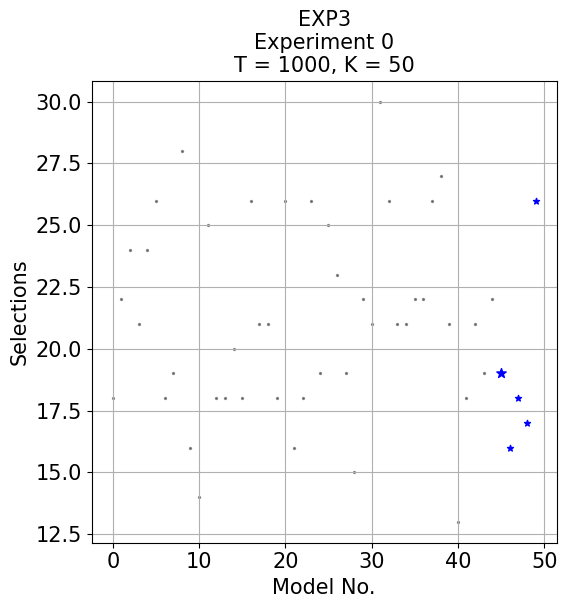

Optimal model recommended 1.140 times more often than sub-optimal models on average


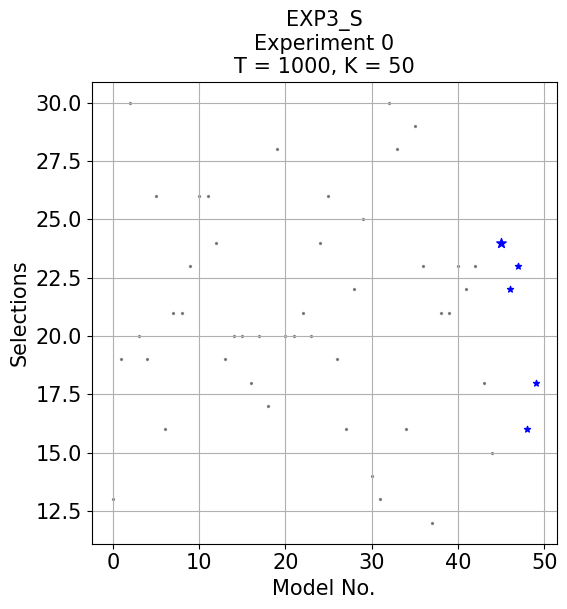

Optimal model recommended 0.812 times more often than sub-optimal models on average


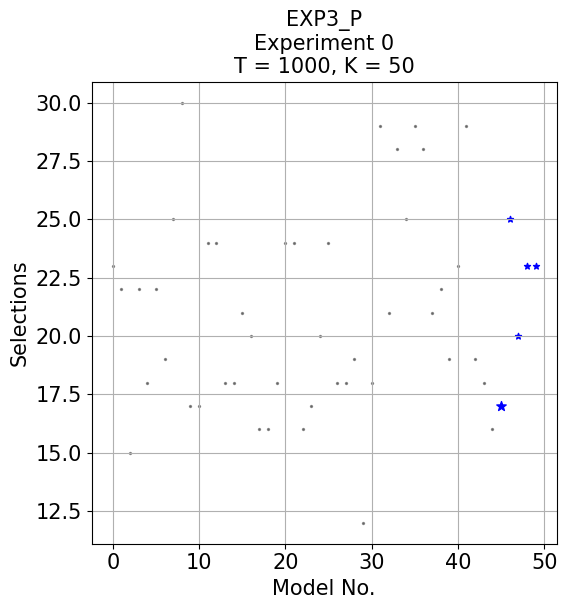

Optimal model recommended 0.948 times more often than sub-optimal models on average


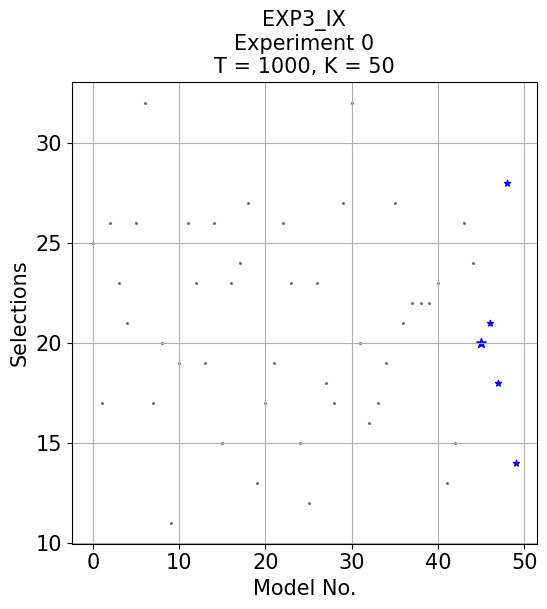

In [ ]:
input_string = '''EXP3
Optimal Pulls: 1.8095%
Pulls: [18. 22. 24. 21. 24. 26. 18. 19. 28. 16. 14. 25. 18. 18. 20. 18. 26. 21.
 21. 18. 26. 16. 18. 26. 19. 25. 23. 19. 15. 22. 21. 30. 26. 21. 21. 22.
 22. 26. 27. 21. 13. 18. 21. 19. 22. 19. 16. 18. 17. 26.]
Time: 0.1432s

EXP3_S
Optimal Pulls: 2.2857%
Pulls: [13. 19. 30. 20. 19. 26. 16. 21. 21. 23. 26. 26. 24. 19. 20. 20. 18. 20.
 17. 28. 20. 20. 21. 20. 24. 26. 19. 16. 22. 25. 14. 13. 30. 28. 16. 29.
 23. 12. 21. 21. 23. 22. 23. 18. 15. 24. 22. 23. 16. 18.]
Time: 0.1511s

EXP3_P
Optimal Pulls: 1.6190%
Pulls: [23. 22. 15. 22. 18. 22. 19. 25. 30. 17. 17. 24. 24. 18. 18. 21. 20. 16.
 16. 18. 24. 24. 16. 17. 20. 24. 18. 18. 19. 12. 18. 29. 21. 28. 25. 29.
 28. 21. 22. 19. 23. 29. 19. 18. 16. 17. 25. 20. 23. 23.]
Time: 0.1463s

EXP3_IX
Optimal Pulls: 1.9048%
Pulls: [25. 17. 26. 23. 21. 26. 32. 17. 20. 11. 19. 26. 23. 19. 26. 15. 23. 24.
 27. 13. 17. 19. 26. 23. 15. 12. 23. 18. 17. 27. 32. 20. 16. 17. 19. 27.
 21. 22. 22. 22. 23. 13. 15. 26. 24. 20. 21. 18. 28. 14.]
Time: 0.1225s


T = 1000, K = 50, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.123 times more often than sub-optimal models on average


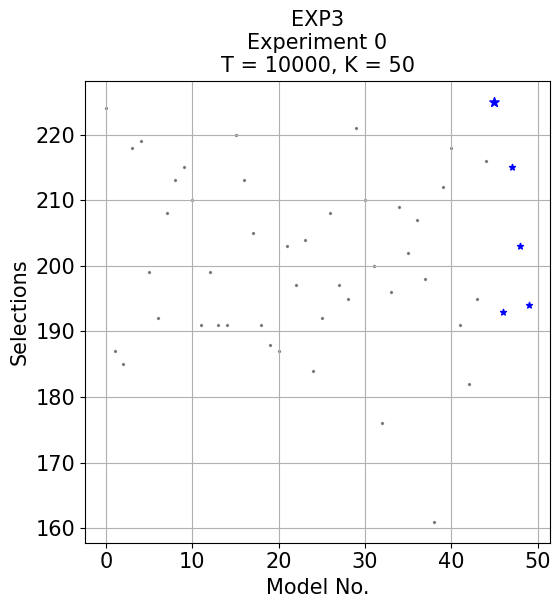

Optimal model recommended 1.272 times more often than sub-optimal models on average


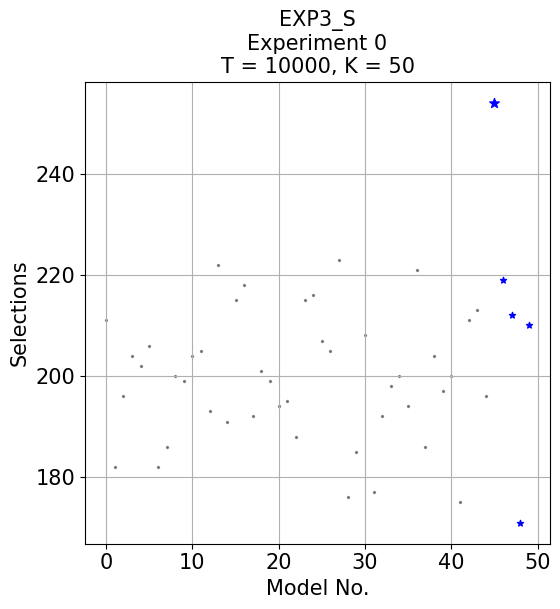

Optimal model recommended 0.972 times more often than sub-optimal models on average


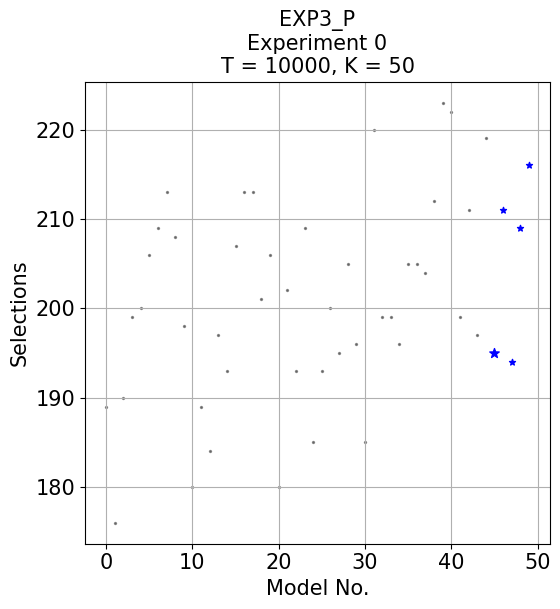

Optimal model recommended 1.074 times more often than sub-optimal models on average


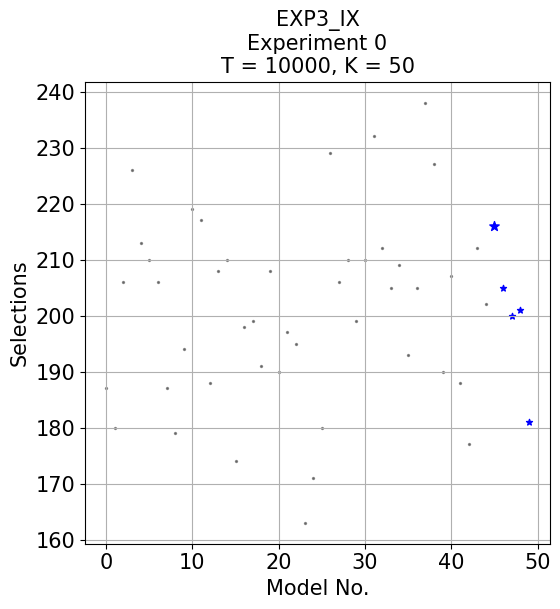

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.2388%
Pulls: [224. 187. 185. 218. 219. 199. 192. 208. 213. 215. 210. 191. 199. 191.
 191. 220. 213. 205. 191. 188. 187. 203. 197. 204. 184. 192. 208. 197.
 195. 221. 210. 200. 176. 196. 209. 202. 207. 198. 161. 212. 218. 191.
 182. 195. 216. 225. 193. 215. 203. 194.]
Time: 1.0789s

EXP3_S
Optimal Pulls: 2.5274%
Pulls: [211. 182. 196. 204. 202. 206. 182. 186. 200. 199. 204. 205. 193. 222.
 191. 215. 218. 192. 201. 199. 194. 195. 188. 215. 216. 207. 205. 223.
 176. 185. 208. 177. 192. 198. 200. 194. 221. 186. 204. 197. 200. 175.
 211. 213. 196. 254. 219. 212. 171. 210.]
Time: 0.7790s

EXP3_P
Optimal Pulls: 1.9403%
Pulls: [189. 176. 190. 199. 200. 206. 209. 213. 208. 198. 180. 189. 184. 197.
 193. 207. 213. 213. 201. 206. 180. 202. 193. 209. 185. 193. 200. 195.
 205. 196. 185. 220. 199. 199. 196. 205. 205. 204. 212. 223. 222. 199.
 211. 197. 219. 195. 211. 194. 209. 216.]
Time: 0.7719s

EXP3_IX
Optimal Pulls: 2.1493%
Pulls: [187. 180. 206. 226. 213. 210. 206. 187. 179. 194. 219. 217. 188. 208.
 210. 174. 198. 199. 191. 208. 190. 197. 195. 163. 171. 180. 229. 206.
 210. 199. 210. 232. 212. 205. 209. 193. 205. 238. 227. 190. 207. 188.
 177. 212. 202. 216. 205. 200. 201. 181.]
Time: 0.7622s


T = 10000, K = 50, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.040 times more often than sub-optimal models on average


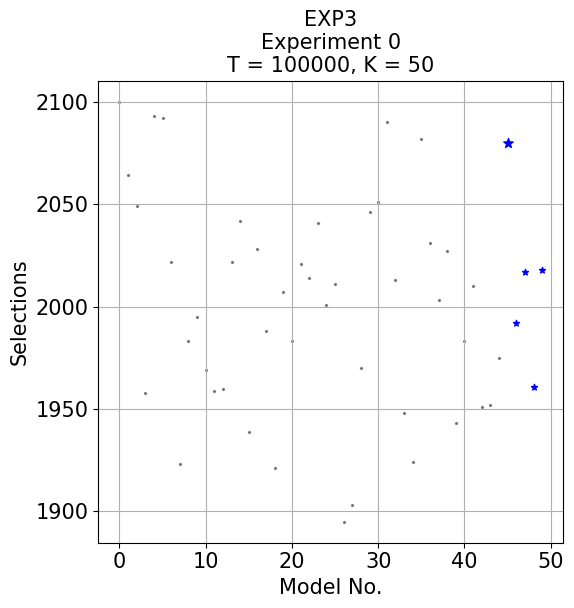

Optimal model recommended 1.082 times more often than sub-optimal models on average


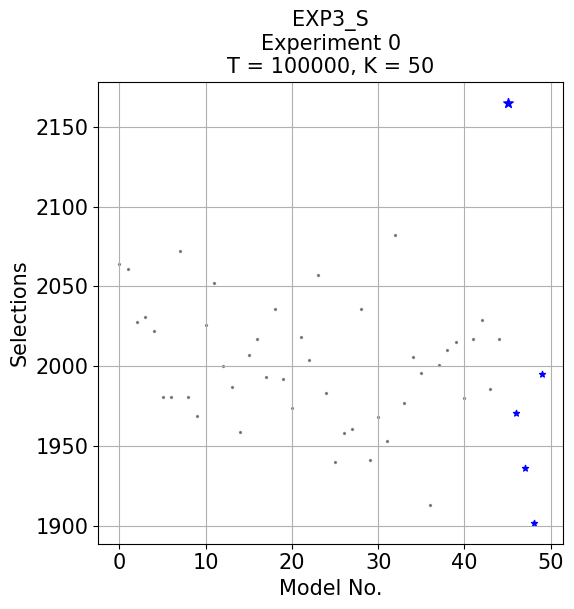

Optimal model recommended 0.995 times more often than sub-optimal models on average


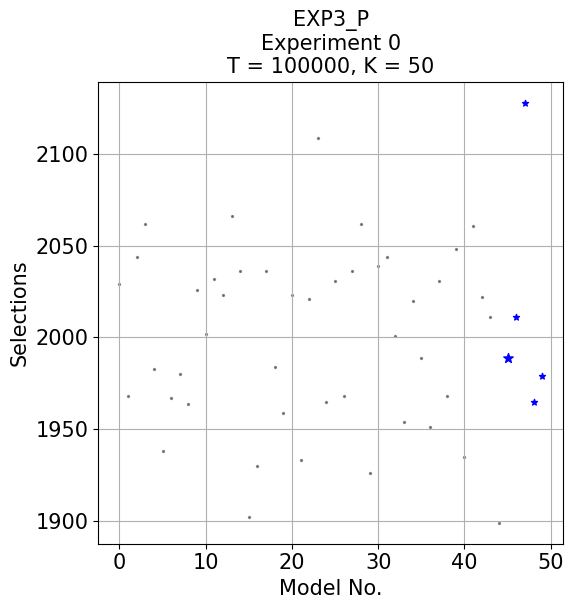

Optimal model recommended 1.129 times more often than sub-optimal models on average


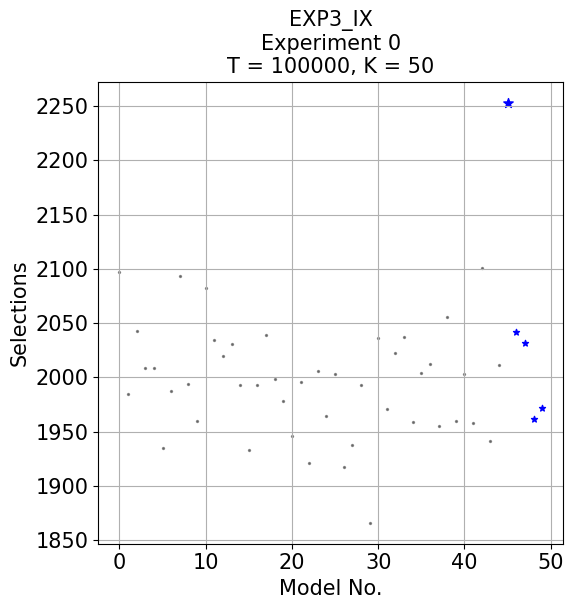

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.0790%
Pulls: [2100. 2064. 2049. 1958. 2093. 2092. 2022. 1923. 1983. 1995. 1969. 1959.
 1960. 2022. 2042. 1939. 2028. 1988. 1921. 2007. 1983. 2021. 2014. 2041.
 2001. 2011. 1895. 1903. 1970. 2046. 2051. 2090. 2013. 1948. 1924. 2082.
 2031. 2003. 2027. 1943. 1983. 2010. 1951. 1952. 1975. 2080. 1992. 2017.
 1961. 2018.]
Time: 6.0623s

EXP3_S
Optimal Pulls: 2.1639%
Pulls: [2064. 2061. 2028. 2031. 2022. 1981. 1981. 2072. 1981. 1969. 2026. 2052.
 2000. 1987. 1959. 2007. 2017. 1993. 2036. 1992. 1974. 2018. 2004. 2057.
 1983. 1940. 1958. 1961. 2036. 1941. 1968. 1953. 2082. 1977. 2006. 1996.
 1913. 2001. 2010. 2015. 1980. 2017. 2029. 1986. 2017. 2165. 1971. 1936.
 1902. 1995.]
Time: 5.1517s

EXP3_P
Optimal Pulls: 1.9880%
Pulls: [2029. 1968. 2044. 2062. 1983. 1938. 1967. 1980. 1964. 2026. 2002. 2032.
 2023. 2066. 2036. 1902. 1930. 2036. 1984. 1959. 2023. 1933. 2021. 2109.
 1965. 2031. 1968. 2036. 2062. 1926. 2039. 2044. 2001. 1954. 2020. 1989.
 1951. 2031. 1968. 2048. 1935. 2061. 2022. 2011. 1899. 1989. 2011. 2128.
 1965. 1979.]
Time: 4.6520s

EXP3_IX
Optimal Pulls: 2.2519%
Pulls: [2097. 1985. 2043. 2009. 2009. 1935. 1987. 2093. 1994. 1960. 2082. 2034.
 2020. 2031. 1993. 1933. 1993. 2039. 1998. 1978. 1946. 1996. 1921. 2006.
 1964. 2003. 1917. 1938. 1993. 1866. 2036. 1971. 2022. 2037. 1959. 2004.
 2012. 1955. 2056. 1960. 2003. 1958. 2101. 1941. 2011. 2253. 2042. 2032.
 1962. 1972.]
Time: 5.3430s


T = 100000, K = 50, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.298 times more often than sub-optimal models on average


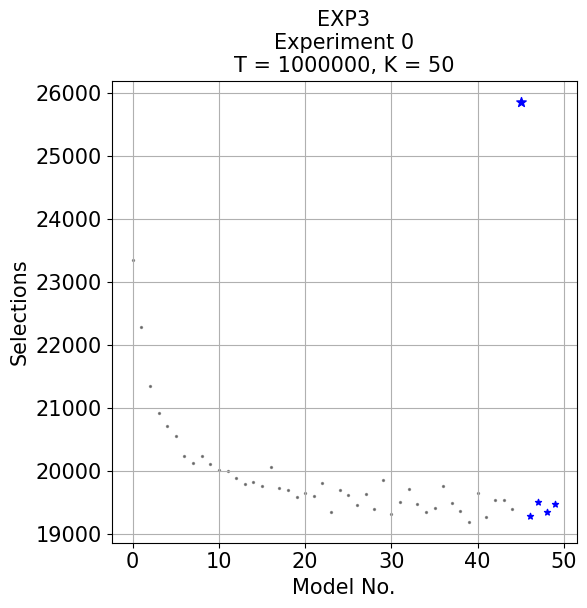

Optimal model recommended 1.297 times more often than sub-optimal models on average


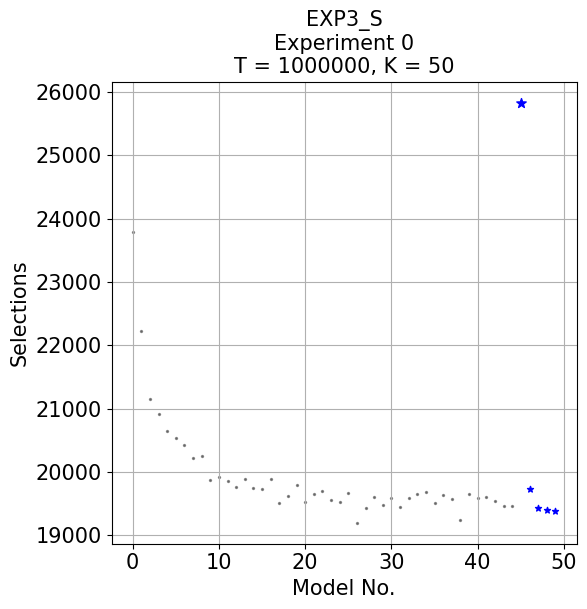

Optimal model recommended 0.997 times more often than sub-optimal models on average


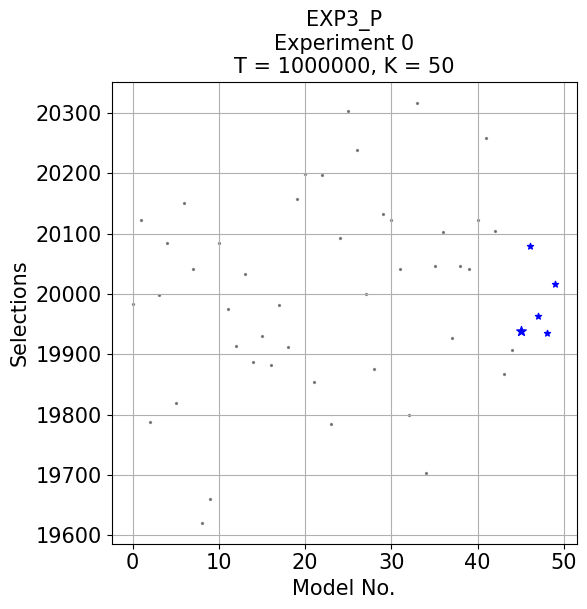

Optimal model recommended 1.296 times more often than sub-optimal models on average


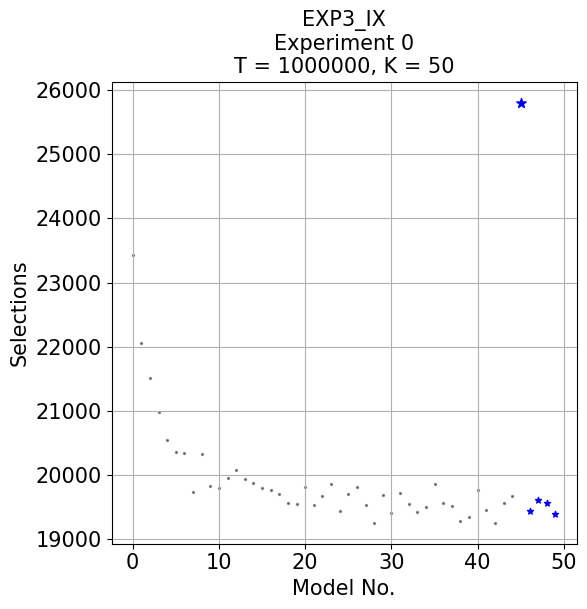

In [ ]:
input_string = '''EXP3
Optimal Pulls: 2.5865%
Pulls: [23359. 22296. 21353. 20933. 20723. 20563. 20238. 20126. 20239. 20111.
 20015. 20012. 19886. 19793. 19833. 19769. 20067. 19730. 19698. 19600.
 19663. 19605. 19807. 19359. 19710. 19619. 19470. 19635. 19395. 19862.
 19320. 19517. 19723. 19474. 19347. 19425. 19769. 19501. 19367. 19200.
 19649. 19280. 19552. 19544. 19395. 25866. 19298. 19511. 19359. 19484.]
Time: 48.2532s

EXP3_S
Optimal Pulls: 2.5827%
Pulls: [23780. 22221. 21150. 20911. 20651. 20530. 20428. 20219. 20253. 19879.
 19926. 19855. 19755. 19889. 19746. 19728. 19884. 19504. 19617. 19797.
 19524. 19648. 19698. 19557. 19519. 19667. 19198. 19427. 19608. 19473.
 19582. 19454. 19595. 19645. 19685. 19517. 19643. 19566. 19238. 19645.
 19593. 19604. 19540. 19465. 19465. 25828. 19729. 19425. 19405. 19384.]
Time: 50.5791s

EXP3_P
Optimal Pulls: 1.9937%
Pulls: [19984. 20123. 19788. 19999. 20085. 19819. 20151. 20041. 19621. 19661.
 20084. 19975. 19914. 20033. 19888. 19931. 19882. 19982. 19913. 20158.
 20199. 19854. 20198. 19784. 20093. 20303. 20238. 20000. 19876. 20132.
 20123. 20041. 19800. 20317. 19704. 20046. 20102. 19927. 20047. 20041.
 20122. 20259. 20105. 19868. 19907. 19938. 20079. 19963. 19935. 20017.]
Time: 50.1797s

 EXP3_IX
Optimal Pulls: 2.5803%
Pulls: [23434. 22061. 21506. 20985. 20551. 20350. 20337. 19736. 20326. 19823.
 19791. 19954. 20072. 19929. 19873. 19800. 19762. 19708. 19555. 19546.
 19809. 19536. 19670. 19856. 19437. 19705. 19813. 19538. 19256. 19687.
 19407. 19717. 19549. 19425. 19498. 19860. 19561. 19514. 19283. 19345.
 19757. 19451. 19254. 19556. 19663. 25804. 19442. 19609. 19556. 19393.]
Time: 47.5552s


T = 1000000, K = 50, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 0.863 times more often than sub-optimal models on average


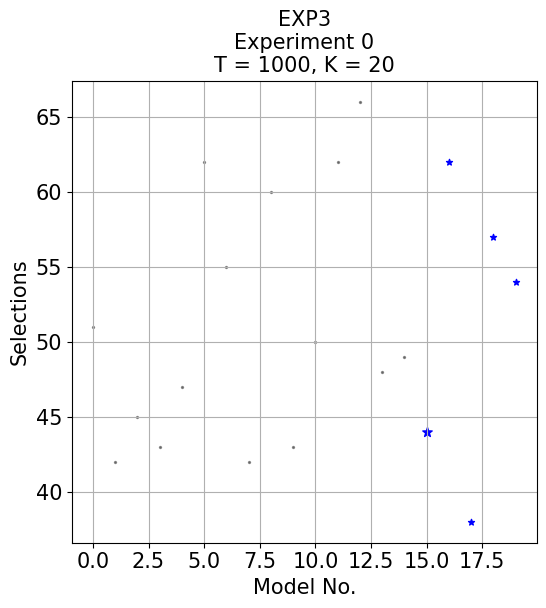

Optimal model recommended 1.123 times more often than sub-optimal models on average


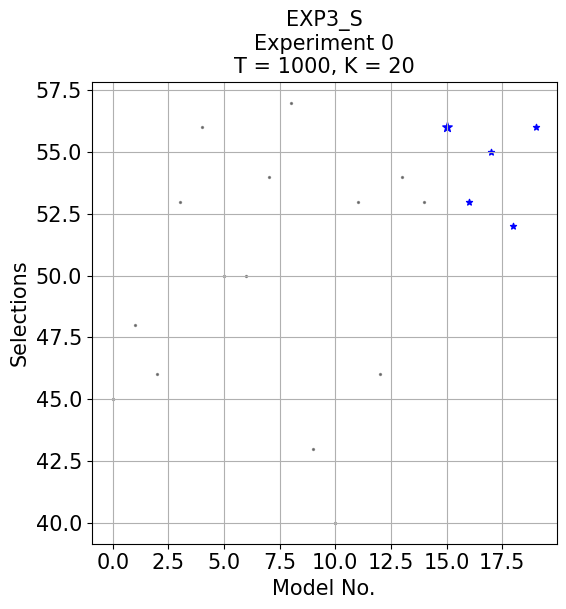

Optimal model recommended 1.178 times more often than sub-optimal models on average


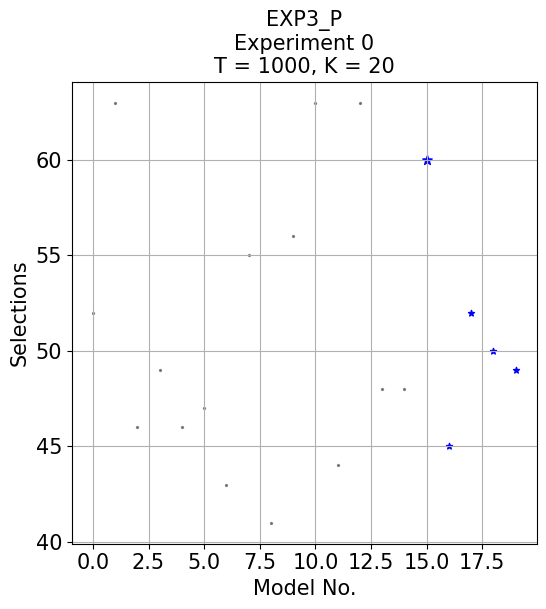

Optimal model recommended 1.184 times more often than sub-optimal models on average


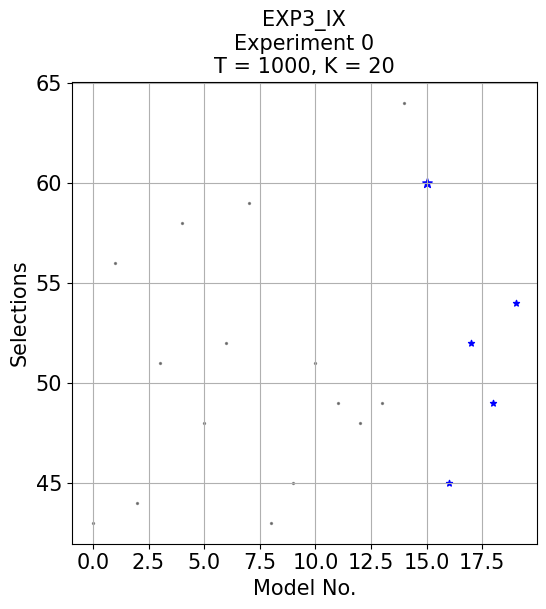

In [ ]:
input_string = '''EXP3
Optimal Pulls: 4.3137%
Pulls: [51. 42. 45. 43. 47. 62. 55. 42. 60. 43. 50. 62. 66. 48. 49. 44. 62. 38.
 57. 54.]
Time: 0.0731s

EXP3_S
Optimal Pulls: 5.4902%
Pulls: [45. 48. 46. 53. 56. 50. 50. 54. 57. 43. 40. 53. 46. 54. 53. 56. 53. 55.
 52. 56.]
Time: 0.0739s

EXP3_P
Optimal Pulls: 5.8824%
Pulls: [52. 63. 46. 49. 46. 47. 43. 55. 41. 56. 63. 44. 63. 48. 48. 60. 45. 52.
 50. 49.]
Time: 0.0698s

EXP3_IX
Optimal Pulls: 5.8824%
Pulls: [43. 56. 44. 51. 58. 48. 52. 59. 43. 45. 51. 49. 48. 49. 64. 60. 45. 52.
 49. 54.]
Time: 0.0688s


T = 1000, K = 20, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.011 times more often than sub-optimal models on average


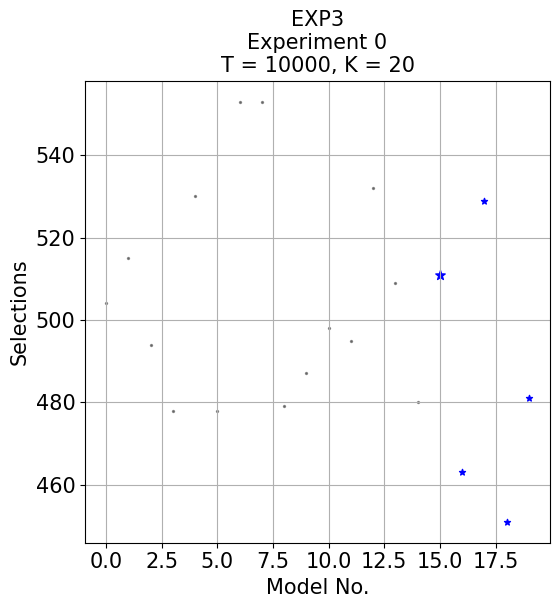

Optimal model recommended 1.003 times more often than sub-optimal models on average


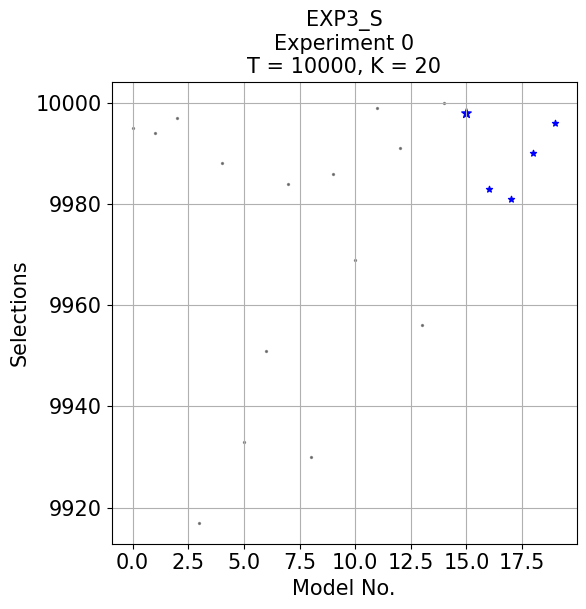

Optimal model recommended 1.086 times more often than sub-optimal models on average


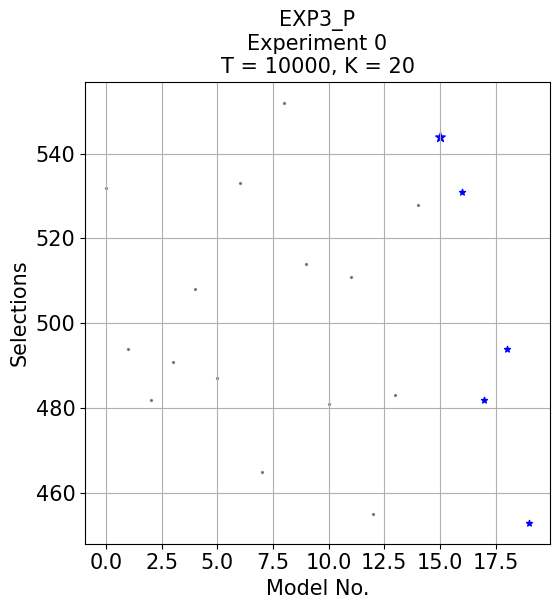

Optimal model recommended 1.001 times more often than sub-optimal models on average


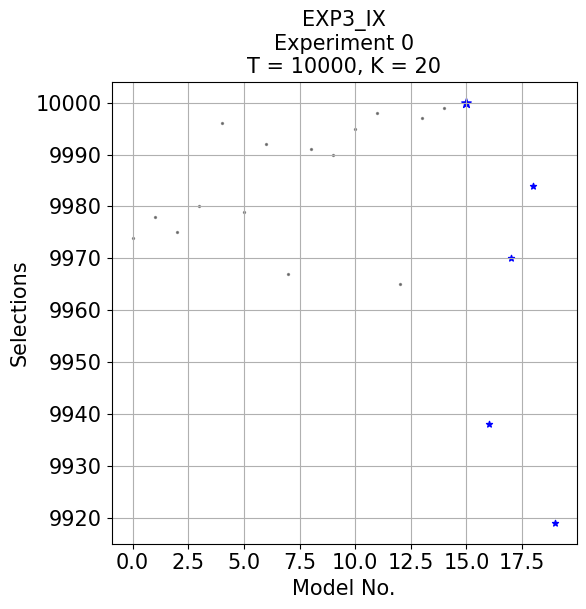

In [ ]:
input_string = '''EXP3
Optimal Pulls: 5.0998%
Pulls: [504. 515. 494. 478. 530. 478. 553. 553. 479. 487. 498. 495. 532. 509.
 480. 511. 463. 529. 451. 481.]
Time: 0.7807s
Epochs: [ 9995.  9994.  9997.  9917.  9988.  9933.  9951.  9984.  9930.  9986.
  9969.  9999.  9991.  9956. 10000.  9998.  9983.  9981.  9990.  9996.]
EXP3_S
Optimal Pulls: 5.4291%
Pulls: [532. 494. 482. 491. 508. 487. 533. 465. 552. 514. 481. 511. 455. 483.
 528. 544. 531. 482. 494. 453.]
Time: 0.7488s
Epochs: [ 9974.  9978.  9975.  9980.  9996.  9979.  9992.  9967.  9991.  9990.
  9995.  9998.  9965.  9997.  9999. 10000.  9938.  9970.  9984.  9919.]
EXP3_P
Optimal Pulls: 5.2994%
Pulls: [457. 526. 501. 519. 530. 526. 468. 544. 462. 480. 490. 480. 469. 500.
 521. 531. 516. 521. 504. 475.]
Time: 0.7347s
Epochs: [ 9919.  9971.  9995.  9979.  9988.  9992.  9994.  9998.  9993.  9997.
  9982.  9987. 10000.  9969.  9990.  9975.  9977.  9991.  9955.  9999.]
EXP3_IX
Optimal Pulls: 5.0798%
Pulls: [512. 490. 512. 456. 496. 522. 522. 505. 482. 531. 498. 485. 513. 532.
 482. 509. 492. 530. 466. 485.]
Time: 0.7670s
Epochs: [ 9993.  9996. 10000.  9968.  9956.  9997.  9994.  9972.  9967.  9992.
  9998.  9999.  9983.  9985.  9995.  9989.  9979.  9982.  9970.  9991.]

T = 10000, K = 20, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.206 times more often than sub-optimal models on average


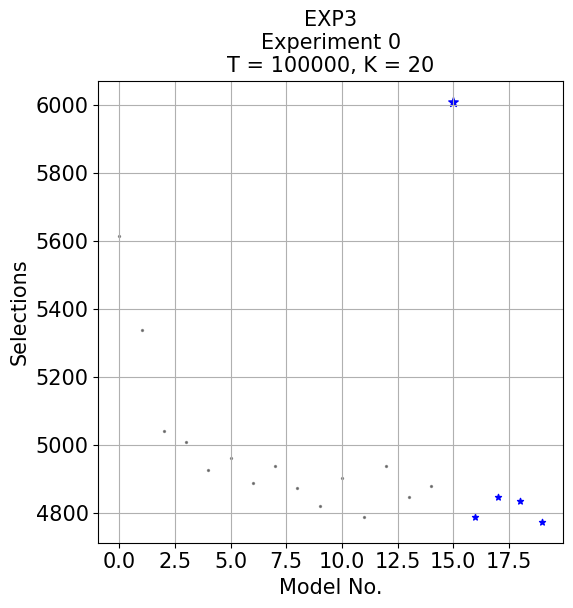

Optimal model recommended 1.000 times more often than sub-optimal models on average


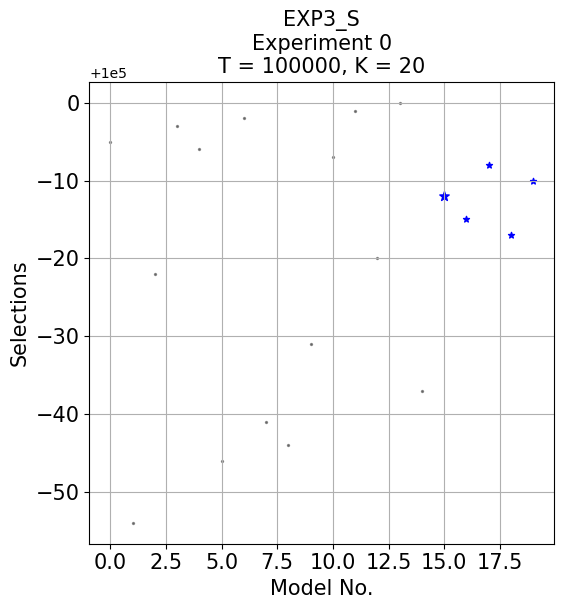

Optimal model recommended 1.219 times more often than sub-optimal models on average


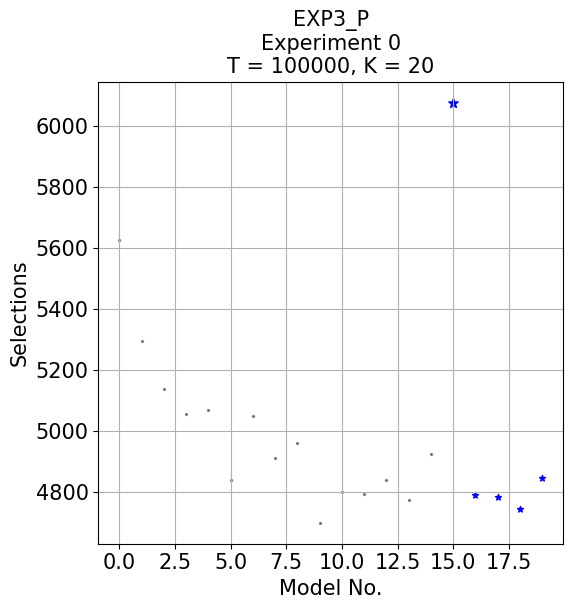

Optimal model recommended 1.000 times more often than sub-optimal models on average


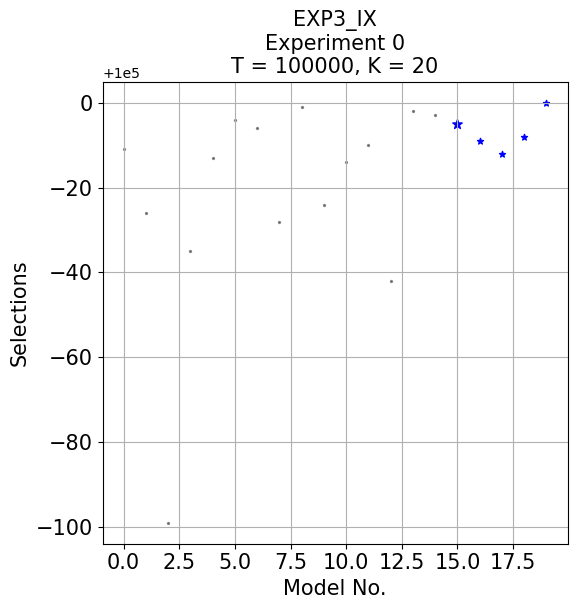

In [ ]:
input_string = '''EXP3
Optimal Pulls: 6.0078%
Pulls: [5615. 5338. 5042. 5009. 4925. 4961. 4889. 4937. 4873. 4819. 4904. 4787.
 4939. 4848. 4879. 6009. 4788. 4848. 4836. 4774.]
Time: 6.7728s
Epochs: [ 99995.  99946.  99978.  99997.  99994.  99954.  99998.  99959.  99956.
  99969.  99993.  99999.  99980. 100000.  99963.  99988.  99985.  99992.
  99983.  99990.]
EXP3_S
Optimal Pulls: 6.0768%
Pulls: [5628. 5297. 5137. 5057. 5070. 4839. 5048. 4912. 4961. 4699. 4799. 4793.
 4839. 4774. 4926. 6078. 4791. 4782. 4745. 4845.]
Time: 5.2675s
Epochs: [ 99989.  99974.  99901.  99965.  99987.  99996.  99994.  99972.  99999.
  99976.  99986.  99990.  99958.  99998.  99997.  99995.  99991.  99988.
  99992. 100000.]
EXP3_P
Optimal Pulls: 4.8690%
Pulls: [5046. 4884. 5126. 4929. 5112. 5037. 4926. 4978. 4903. 5008. 4975. 5080.
 5019. 5019. 4987. 4870. 5005. 4959. 5218. 4939.]
Time: 4.6130s
Epochs: [ 99982.  99991. 100000.  99970.  99990.  99969.  99997.  99983.  99998.
  99987.  99996.  99912.  99979.  99988.  99989.  99959.  99968.  99999.
  99993.  99994.]
 EXP3_IX
Optimal Pulls: 6.0428%
Pulls: [5672. 5241. 5141. 5068. 4909. 5039. 4955. 4999. 4972. 4907. 4797. 4868.
 4851. 4788. 4769. 6044. 4700. 4745. 4738. 4817.]
Time: 5.2417s
Epochs: [ 99989.  99999.  99992.  99982.  99991. 100000.  99979.  99983.  99980.
  99995.  99984.  99997.  99988.  99975.  99954.  99994.  99964.  99993.
  99985.  99962.]

T = 100000, K = 20, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 1.886 times more often than sub-optimal models on average


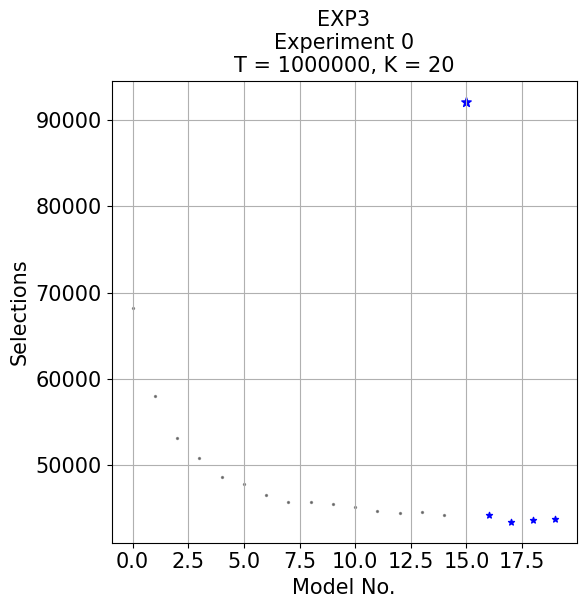

Optimal model recommended 1.000 times more often than sub-optimal models on average


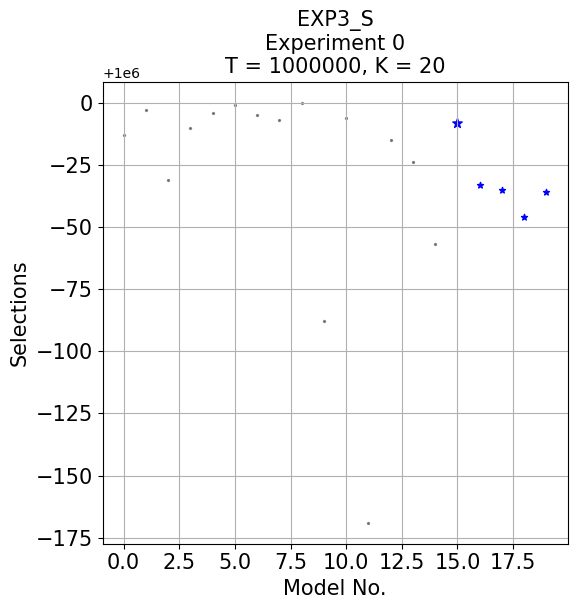

Optimal model recommended 1.882 times more often than sub-optimal models on average


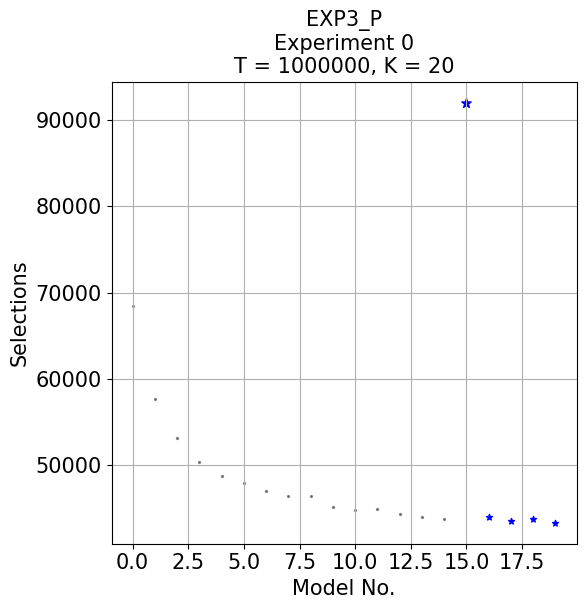

Optimal model recommended 1.000 times more often than sub-optimal models on average


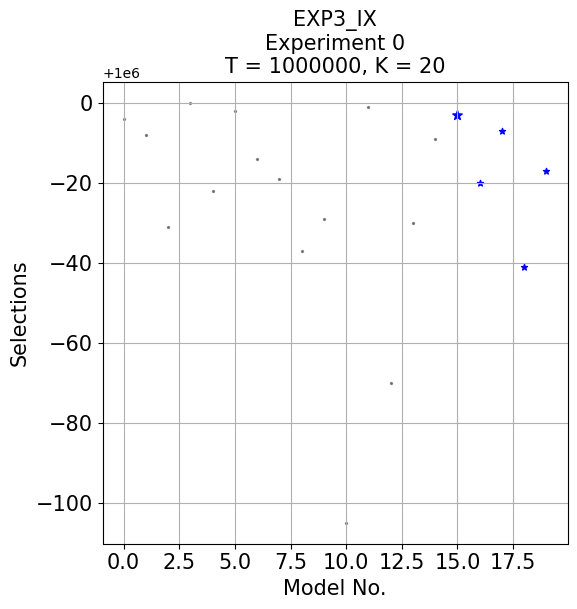

In [ ]:
input_string = '''EXP3
Optimal Pulls: 9.2120%
Pulls: [68204. 57978. 53139. 50803. 48588. 47817. 46501. 45744. 45668. 45492.
 45112. 44734. 44398. 44517. 44162. 92122. 44203. 43436. 43632. 43770.]
Time: 45.9138s
Epochs: [ 999987.  999997.  999969.  999990.  999996.  999999.  999995.  999993.
 1000000.  999912.  999994.  999831.  999985.  999976.  999943.  999992.
  999967.  999965.  999954.  999964.]
EXP3_S
Optimal Pulls: 9.2005%
Pulls: [68453. 57649. 53123. 50446. 48828. 47903. 46981. 46503. 46435. 45232.
 44784. 44940. 44341. 43980. 43768. 92007. 44043. 43508. 43736. 43360.]
Time: 49.6401s
Epochs: [ 999996.  999992.  999969. 1000000.  999978.  999998.  999986.  999981.
  999963.  999971.  999895.  999999.  999930.  999970.  999991.  999997.
  999980.  999993.  999959.  999983.]
EXP3_P
Optimal Pulls: 5.0148%
Pulls: [49960. 49713. 49662. 49699. 50069. 49872. 50047. 49896. 49873. 49794.
 49659. 50440. 50563. 50055. 50262. 50149. 49667. 50249. 50240. 50151.]
Time: 50.0549s
Epochs: [ 999979.  999987.  999988.  999936.  999985.  999999.  999996.  999955.
  999994.  999991.  999893.  999981.  999953.  999993. 1000000.  999957.
  999995.  999947.  999998.  999986.]
 EXP3_IX
Optimal Pulls: 8.9635%
Pulls: [67768. 57092. 52783. 50154. 49022. 47799. 46851. 46672. 45851. 45208.
 45453. 45202. 44689. 44640. 44495. 89637. 43888. 44319. 44174. 44323.]
Time: 47.7178s
Epochs: [ 999978.  999968.  999965.  999973. 1000000.  999996.  999959.  999995.
  999929.  999990.  999984.  999998.  999988.  999992.  999951.  999999.
  999953.  999982.  999954.  999983.]

T = 1000000, K = 20, Experiment: 0'''
PlotExpSelections(input_string)

Optimal model recommended 0.015 times more often than sub-optimal models on average


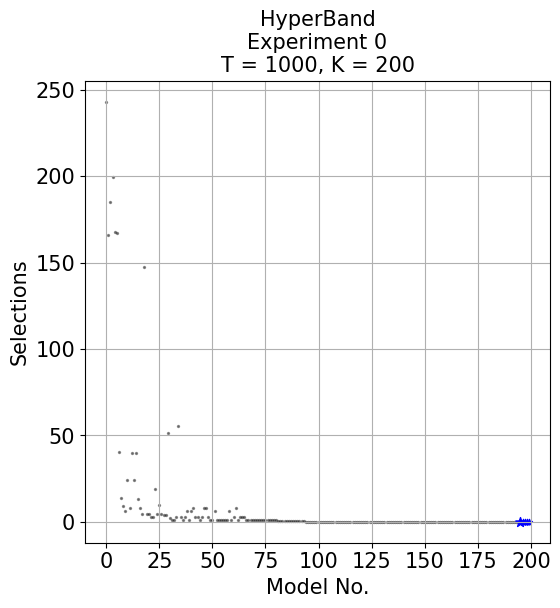

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0079%
Time: 0.0027s
Number of HyperBand Rounds: 7
Average Epochs: [2.43000000e+02 1.65857143e+02 1.85142857e+02 1.99285714e+02
 1.67571429e+02 1.67285714e+02 4.02857143e+01 1.41428571e+01
 9.00000000e+00 6.42857143e+00 2.40000000e+01 8.14285714e+00
 3.98571429e+01 2.40000000e+01 3.98571429e+01 1.34285714e+01
 8.14285714e+00 4.71428571e+00 1.47571429e+02 4.71428571e+00
 4.71428571e+00 3.00000000e+00 3.00000000e+00 1.88571429e+01
 4.71428571e+00 1.00000000e+01 4.71428571e+00 3.85714286e+00
 3.85714286e+00 5.14285714e+01 2.14285714e+00 1.00000000e+00
 1.00000000e+00 2.71428571e+00 5.55714286e+01 2.71428571e+00
 1.00000000e+00 2.71428571e+00 6.28571429e+00 1.00000000e+00
 6.28571429e+00 8.00000000e+00 2.71428571e+00 2.71428571e+00
 1.00000000e+00 2.71428571e+00 8.00000000e+00 8.00000000e+00
 2.71428571e+00 1.00000000e+00 1.00000000e+00 6.28571429e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 6.28571429e+00 1.00000000e+00
 2.71428571e+00 8.00000000e+00 1.00000000e+00 2.71428571e+00
 2.71428571e+00 2.71428571e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01]

11.866666666666665 0.009251126057585279
T = 1000, K = 200, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.034 times more often than sub-optimal models on average


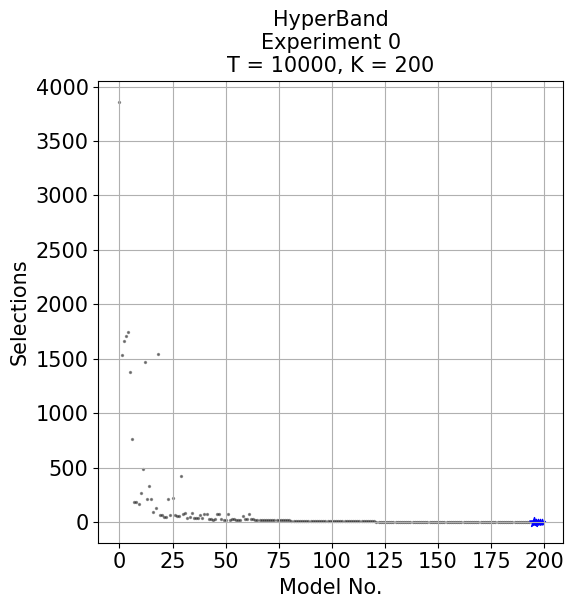

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0174%
Time: 0.0142s
Number of HyperBand Rounds: 9
Average Epochs: [3.86100000e+03 1.53600000e+03 1.66300000e+03 1.70533333e+03
 1.74700000e+03 1.37711111e+03 7.59666667e+02 1.84000000e+02
 1.84000000e+02 1.66000000e+02 2.65444444e+02 4.86333333e+02
 1.47388889e+03 2.12111111e+02 3.35444444e+02 2.12000000e+02
 8.86666667e+01 1.29777778e+02 1.54277778e+03 6.13333333e+01
 6.13333333e+01 4.76666667e+01 4.76666667e+01 2.12222222e+02
 6.13333333e+01 2.25888889e+02 6.13333333e+01 5.53333333e+01
 5.53333333e+01 4.25666667e+02 7.47777778e+01 8.84444444e+01
 3.36666667e+01 4.73333333e+01 7.97777778e+01 3.86666667e+01
 3.86666667e+01 3.86666667e+01 6.61111111e+01 3.86666667e+01
 7.06666667e+01 7.06666667e+01 2.95555556e+01 2.95555556e+01
 1.58888889e+01 2.95555556e+01 7.06666667e+01 7.06666667e+01
 2.95555556e+01 1.58888889e+01 1.58888889e+01 7.06666667e+01
 1.58888889e+01 2.95555556e+01 2.95555556e+01 1.58888889e+01
 1.58888889e+01 1.58888889e+01 5.70000000e+01 2.95555556e+01
 2.95555556e+01 7.06666667e+01 2.95555556e+01 2.95555556e+01
 1.58888889e+01 1.58888889e+01 1.58888889e+01 1.58888889e+01
 1.58888889e+01 1.58888889e+01 1.58888889e+01 1.58888889e+01
 1.58888889e+01 1.58888889e+01 1.58888889e+01 1.58888889e+01
 1.58888889e+01 1.58888889e+01 1.58888889e+01 1.58888889e+01
 1.58888889e+01 1.38888889e+01 1.38888889e+01 1.38888889e+01
 1.38888889e+01 1.38888889e+01 1.38888889e+01 1.38888889e+01
 1.38888889e+01 1.38888889e+01 1.38888889e+01 1.12222222e+01
 1.12222222e+01 1.12222222e+01 1.12222222e+01 1.12222222e+01
 1.12222222e+01 1.12222222e+01 1.12222222e+01 1.12222222e+01
 1.12222222e+01 1.12222222e+01 1.12222222e+01 1.12222222e+01
 8.33333333e+00 8.33333333e+00 8.33333333e+00 8.33333333e+00
 8.33333333e+00 8.33333333e+00 8.33333333e+00 8.33333333e+00
 8.33333333e+00 8.33333333e+00 8.33333333e+00 8.33333333e+00
 8.33333333e+00 8.33333333e+00 8.33333333e+00 8.33333333e+00
 8.33333333e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00]

33.27058823529412 0.00029477051722300225
T = 10000, K = 200, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.046 times more often than sub-optimal models on average


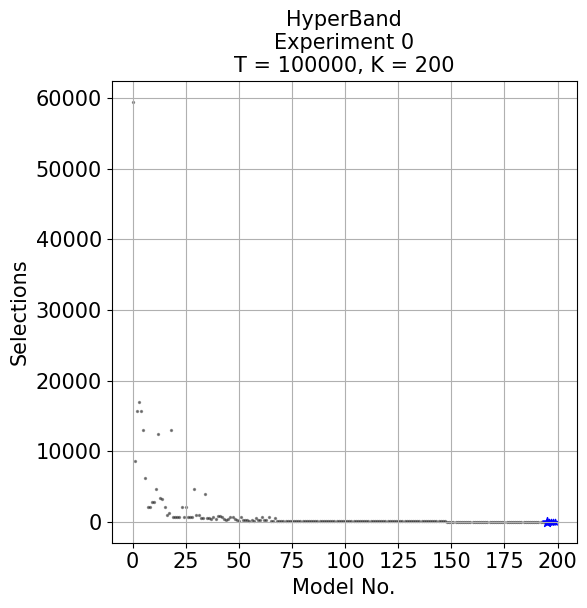

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0238%
Time: 0.0050s
Number of HyperBand Rounds: 11
Average Epochs: [5.94540000e+04 8.62527273e+03 1.56968182e+04 1.70023636e+04
 1.56681818e+04 1.29759091e+04 6.24218182e+03 2.20200000e+03
 2.20200000e+03 2.85863636e+03 2.85863636e+03 4.65790909e+03
 1.25176364e+04 3.42672727e+03 3.20254545e+03 2.19245455e+03
 9.58363636e+02 1.29500000e+03 1.30795455e+04 7.34000000e+02
 7.34000000e+02 7.34000000e+02 7.34000000e+02 2.08072727e+03
 7.34000000e+02 2.08072727e+03 7.34000000e+02 6.89818182e+02
 6.89818182e+02 4.65654545e+03 9.52818182e+02 9.52818182e+02
 6.16181818e+02 5.42545455e+02 3.90945455e+03 5.42545455e+02
 5.42545455e+02 4.68909091e+02 6.93363636e+02 4.68909091e+02
 8.05545455e+02 8.05545455e+02 7.30818182e+02 3.94181818e+02
 2.82000000e+02 3.94181818e+02 7.30818182e+02 7.30818182e+02
 3.94181818e+02 3.19454545e+02 2.07272727e+02 6.56090909e+02
 3.19454545e+02 3.19454545e+02 3.19454545e+02 2.07272727e+02
 3.19454545e+02 2.07272727e+02 5.43909091e+02 3.19454545e+02
 3.19454545e+02 6.56090909e+02 3.19454545e+02 3.19454545e+02
 6.56090909e+02 2.07272727e+02 2.07272727e+02 5.43909091e+02
 2.07272727e+02 2.07272727e+02 2.07272727e+02 2.07272727e+02
 2.07272727e+02 2.07272727e+02 2.07272727e+02 2.07272727e+02
 2.07272727e+02 2.07272727e+02 2.07272727e+02 2.07272727e+02
 2.07272727e+02 1.92545455e+02 1.92545455e+02 1.92545455e+02
 1.92545455e+02 1.92545455e+02 1.92545455e+02 1.92545455e+02
 1.92545455e+02 1.68000000e+02 1.68000000e+02 1.68000000e+02
 1.68000000e+02 1.68000000e+02 1.68000000e+02 1.68000000e+02
 1.68000000e+02 1.68000000e+02 1.68000000e+02 1.43454545e+02
 1.43454545e+02 1.43454545e+02 1.43454545e+02 1.43454545e+02
 1.43454545e+02 1.43454545e+02 1.43454545e+02 1.43454545e+02
 1.43454545e+02 1.43454545e+02 1.43454545e+02 1.18909091e+02
 1.18909091e+02 1.18909091e+02 1.18909091e+02 1.18909091e+02
 1.18909091e+02 1.18909091e+02 1.18909091e+02 1.18909091e+02
 1.18909091e+02 1.18909091e+02 1.18909091e+02 1.18909091e+02
 1.18909091e+02 1.18909091e+02 1.18909091e+02 9.40000000e+01
 9.40000000e+01 9.40000000e+01 9.40000000e+01 9.40000000e+01
 9.40000000e+01 9.40000000e+01 9.40000000e+01 9.40000000e+01
 9.40000000e+01 9.40000000e+01 9.40000000e+01 9.40000000e+01
 9.40000000e+01 9.40000000e+01 9.40000000e+01 9.40000000e+01
 9.40000000e+01 9.40000000e+01 9.40000000e+01 9.40000000e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01
 5.66363636e+01 5.66363636e+01 5.66363636e+01 5.66363636e+01]
36.77994011976048 2.8665482268147347e-05
T = 100000, K = 200, Experiment: 0'''

PlotHypSelections(input_string)

Optimal model recommended 0.049 times more often than sub-optimal models on average


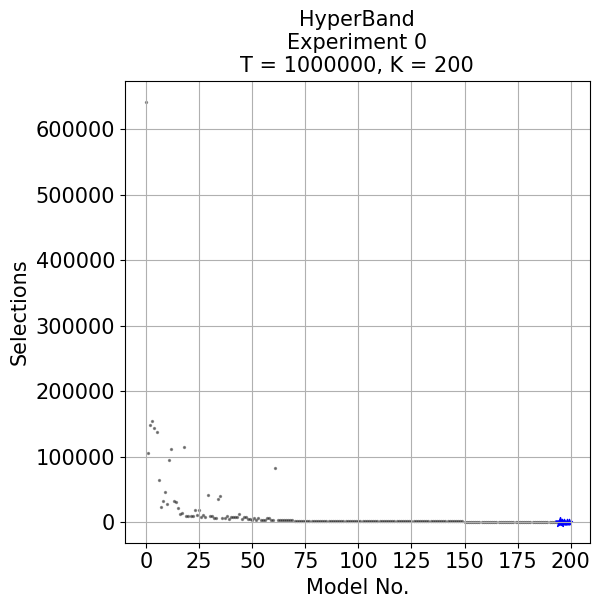

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0252%
Time: 0.0141s
Number of HyperBand Rounds: 13
Average Epochs: [641706.92307692 105486.92307692 148223.76923077 154798.61538462
 143421.23076923 137726.38461538  63652.61538462  23766.92307692
  32313.92307692  46716.23076923  27827.76923077  94334.53846154
 111428.61538462  32611.38461538  30713.07692308  22166.07692308
  11720.76923077  14569.76923077 114284.84615385   9821.53846154
   9821.53846154   9821.53846154   9821.53846154  19318.30769231
  10771.30769231  19318.30769231   7922.30769231  10434.84615385
   7585.84615385  41213.07692308   9874.07692308   9275.92307692
   6426.92307692   6426.92307692  34916.92307692  39991.84615385
   5803.84615385   5803.84615385   8652.84615385   5172.46153846
   8021.46153846   8021.46153846   8021.46153846   7388.69230769
  13086.69230769   4539.69230769   7388.69230769   7388.69230769
   4539.69230769   4539.69230769   3906.92307692   6755.92307692
   3906.92307692   6755.92307692   3906.92307692   3906.92307692
   3906.92307692   6755.92307692   6122.84615385   3273.84615385
   3273.84615385  83045.92307692   3273.84615385   3273.84615385
   3273.84615385   3273.84615385   3273.84615385   3273.84615385
   3273.84615385   3273.84615385   2324.23076923   2324.23076923
   2324.23076923   2324.23076923   2324.23076923   2324.23076923
   2324.23076923   2324.23076923   2324.23076923   2324.23076923
   2324.23076923   2212.07692308   2212.07692308   2212.07692308
   2212.07692308   2212.07692308   2212.07692308   2025.15384615
   2025.15384615   2025.15384615   2025.15384615   2025.15384615
   2025.15384615   2025.15384615   2025.15384615   1825.76923077
   1825.76923077   1825.76923077   1825.76923077   1825.76923077
   1825.76923077   1825.76923077   1825.76923077   1825.76923077
   1825.76923077   1618.07692308   1618.07692308   1618.07692308
   1618.07692308   1618.07692308   1618.07692308   1618.07692308
   1618.07692308   1618.07692308   1618.07692308   1618.07692308
   1618.07692308   1407.61538462   1407.61538462   1407.61538462
   1407.61538462   1407.61538462   1407.61538462   1407.61538462
   1407.61538462   1407.61538462   1407.61538462   1407.61538462
   1407.61538462   1407.61538462   1407.61538462   1196.69230769
   1196.69230769   1196.69230769   1196.69230769   1196.69230769
   1196.69230769   1196.69230769   1196.69230769   1196.69230769
   1196.69230769   1196.69230769   1196.69230769   1196.69230769
   1196.69230769   1196.69230769   1196.69230769   1196.69230769
   1196.69230769   1196.69230769    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923]
33.38087382523495 2.871706981874601e-06
T = 1000000, K = 200, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.008 times more often than sub-optimal models on average


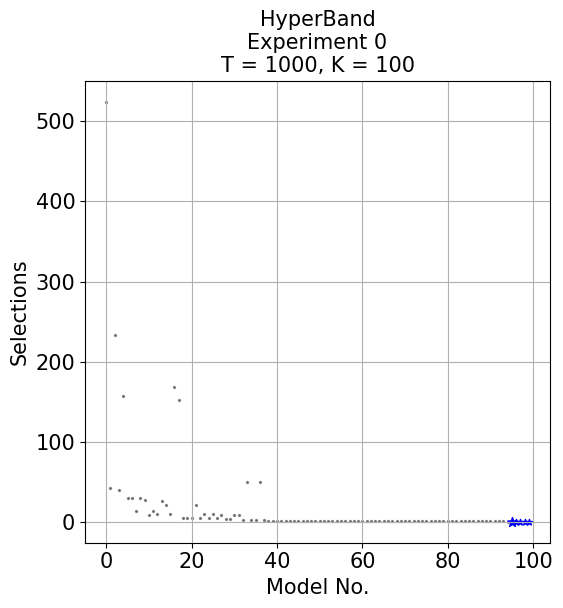

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0079%
Time: 0.0013s
Number of HyperBand Rounds: 7
Average Epochs: [5.24571429e+02 4.24285714e+01 2.32857143e+02 4.02857143e+01
 1.56857143e+02 3.00000000e+01 3.00000000e+01 1.41428571e+01
 3.00000000e+01 2.74285714e+01 8.14285714e+00 1.34285714e+01
 1.00000000e+01 2.58571429e+01 2.05714286e+01 1.00000000e+01
 1.68714286e+02 1.52714286e+02 4.71428571e+00 4.71428571e+00
 4.71428571e+00 2.05714286e+01 4.71428571e+00 1.00000000e+01
 4.71428571e+00 1.00000000e+01 4.71428571e+00 9.14285714e+00
 3.85714286e+00 3.85714286e+00 9.14285714e+00 8.00000000e+00
 2.71428571e+00 5.02857143e+01 2.71428571e+00 2.71428571e+00
 5.02857143e+01 2.71428571e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01]
3.245454545454545 0.005821731871485586
T = 1000, K = 100, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.050 times more often than sub-optimal models on average


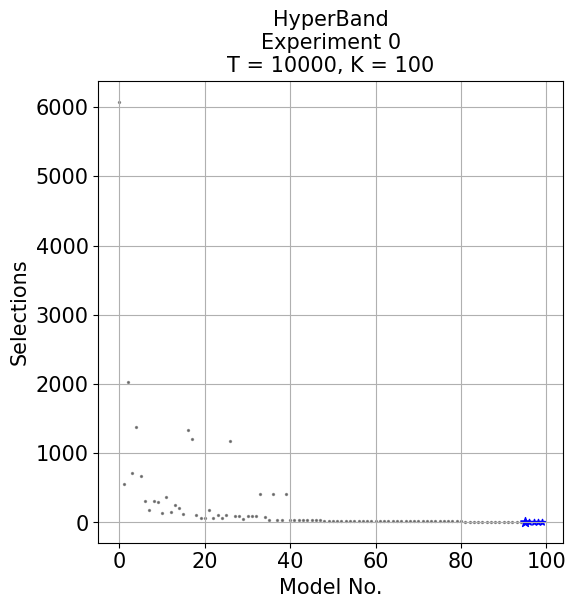

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0530%
Time: 0.0153s
Number of HyperBand Rounds: 9
Average Epochs: [6079.          552.         2033.44444444  718.33333333 1376.
  677.44444444  307.33333333  184.          307.33333333  289.33333333
  142.          362.77777778  157.11111111  253.22222222  212.11111111
  129.77777778 1337.         1213.44444444  102.44444444   61.33333333
   61.33333333  184.77777778   61.33333333  102.44444444   61.33333333
  102.44444444 1172.44444444   96.44444444   96.44444444   55.33333333
   88.44444444   88.44444444   88.44444444  417.66666667   79.77777778
   38.66666667  409.           38.66666667   38.66666667  409.
   29.55555556   29.55555556   29.55555556   29.55555556   29.55555556
   29.55555556   29.55555556   29.55555556   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   13.88888889   13.88888889   13.88888889   13.88888889
   13.88888889   13.88888889   13.88888889   13.88888889   13.88888889
   13.88888889   11.22222222   11.22222222   11.22222222   11.22222222
   11.22222222   11.22222222   11.22222222   11.22222222   11.22222222]
35.07227722772277 0.0002583760069445525
T = 10000, K = 100, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 3.991 times more often than sub-optimal models on average


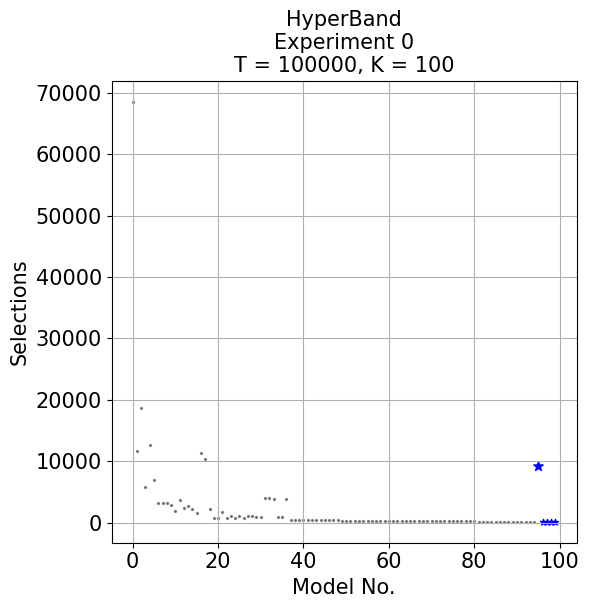

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 4.0202%
Time: 0.0054s
Number of HyperBand Rounds: 11
Average Epochs: [68544.81818182 11655.54545455 18727.18181818  5893.
 12636.81818182  6914.90909091  3211.90909091  3211.90909091
  3211.90909091  2858.45454545  1848.54545455  3647.63636364
  2416.63636364  2753.45454545  2192.63636364  1519.18181818
 11396.         10385.81818182  2305.09090909   734.
   734.          1744.09090909   734.          1070.63636364
   734.          1070.63636364   734.          1026.45454545
  1026.45454545   952.81818182   952.81818182  3983.09090909
  3983.09090909  3909.45454545   879.18181818   879.18181818
  3909.45454545   468.90909091   468.90909091   468.90909091
   468.90909091   468.90909091   394.18181818   394.18181818
   394.18181818   394.18181818   394.18181818   394.18181818
   394.18181818   319.45454545   319.45454545   319.45454545
   319.45454545   319.45454545   319.45454545   319.45454545
   319.45454545   319.45454545   319.45454545   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   192.54545455   192.54545455   192.54545455
   192.54545455   192.54545455   192.54545455   192.54545455
   192.54545455   168.           168.           168.
   168.           168.           168.          9234.36363636
   168.           168.           168.           168.        ]
34.24135864135864 0.00030502103419201965
T = 100000, K = 100, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 3.043 times more often than sub-optimal models on average


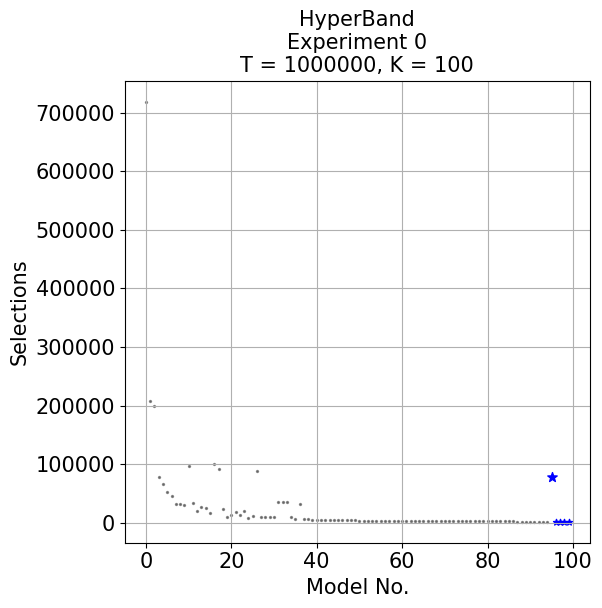

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 3.0949%
Time: 0.0050s
Number of HyperBand Rounds: 13
Average Epochs: [718629.92307692 208050.92307692 199505.84615385  77875.61538462
  66498.23076923  52256.30769231  46558.61538462  32313.92307692
  32313.92307692  29622.23076923  96203.76923077  34505.53846154
  20260.53846154  26913.38461538  25015.07692308  16468.07692308
 100039.84615385  91492.76923077  23116.76923077   9821.53846154
  12670.53846154  18368.53846154  12670.53846154  19318.30769231
   7922.30769231  10771.30769231  87694.38461538  10434.84615385
  10434.84615385   9874.07692308   9874.07692308  34916.92307692
  34916.92307692  34916.92307692   9275.92307692   5803.84615385
  31444.84615385   5803.84615385   5803.84615385   5172.46153846
   5172.46153846   5172.46153846   5172.46153846   4539.69230769
   4539.69230769   4539.69230769   4539.69230769   4539.69230769
   4539.69230769   4539.69230769   3906.92307692   3906.92307692
   3906.92307692   3906.92307692   3906.92307692   3906.92307692
   3906.92307692   3906.92307692   3273.84615385   3273.84615385
   3273.84615385   3273.84615385   3273.84615385   3273.84615385
   3273.84615385   3273.84615385   3273.84615385   3273.84615385
   3273.84615385   3273.84615385   2324.23076923   2324.23076923
   2324.23076923   2324.23076923   2324.23076923   2324.23076923
   2324.23076923   2324.23076923   2324.23076923   2324.23076923
   2324.23076923   2212.07692308   2212.07692308   2212.07692308
   2212.07692308   2212.07692308   2212.07692308   2025.15384615
   2025.15384615   2025.15384615   2025.15384615   2025.15384615
   2025.15384615   2025.15384615   2025.15384615  78748.84615385
   1825.76923077   1825.76923077   1825.76923077   1825.76923077]
31.410908909109086 2.87199412385382e-06
T = 1000000, K = 100, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.026 times more often than sub-optimal models on average


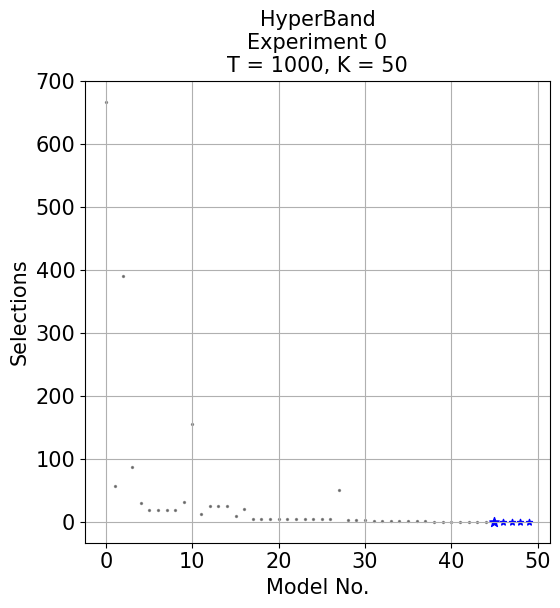

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0567%
Time: 0.0017s
Number of HyperBand Rounds: 7
Average Epochs: [667.28571429  58.28571429 391.42857143  87.85714286  30.
  19.42857143  19.42857143  19.42857143  19.42857143  32.71428571
 156.28571429  13.42857143  25.85714286  25.85714286  25.85714286
  10.          20.57142857   4.71428571   4.71428571   4.71428571
   4.71428571   4.71428571   4.71428571   4.71428571   4.71428571
   4.71428571   4.71428571  51.42857143   3.85714286   3.85714286
   3.85714286   2.71428571   2.71428571   2.71428571   2.71428571
   2.71428571   2.71428571   2.71428571   1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.        ]
38.828571428571436 0.001999999999999994
T = 1000, K = 50, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.035 times more often than sub-optimal models on average
Total number of epochs: 20454.77777779


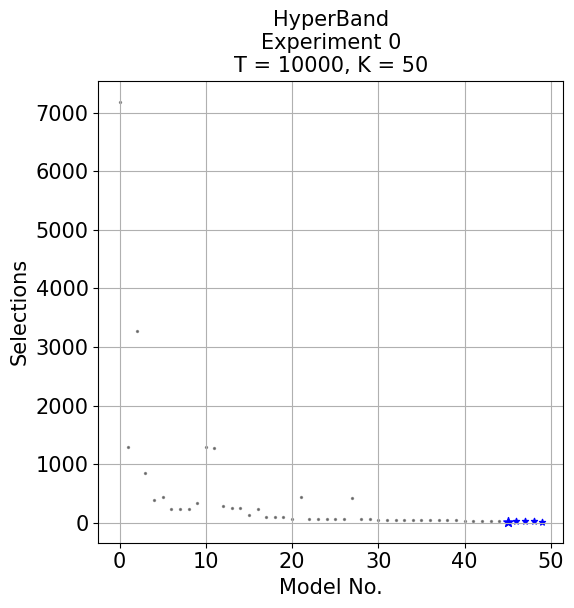

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0777%
Time: 0.0030s
Number of HyperBand Rounds: 9
Average Epochs: [7189.         1292.33333333 3267.77777778  841.66666667  389.33333333
  430.77777778  225.11111111  225.11111111  225.11111111  330.55555556
 1294.22222222 1268.22222222  280.55555556  253.22222222  253.22222222
  129.77777778  225.88888889  102.44444444  102.44444444  102.44444444
   61.33333333  431.66666667   61.33333333   61.33333333   61.33333333
   61.33333333   61.33333333  425.66666667   55.33333333   55.33333333
   47.33333333   47.33333333   47.33333333   47.33333333   38.66666667
   38.66666667   38.66666667   38.66666667   38.66666667   38.66666667
   29.55555556   29.55555556   29.55555556   29.55555556   29.55555556
   15.88888889   29.55555556   29.55555556   29.55555556   15.88888889]
37.208955223880594 0.0004477611940298387
T = 10000, K = 50, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.066 times more often than sub-optimal models on average


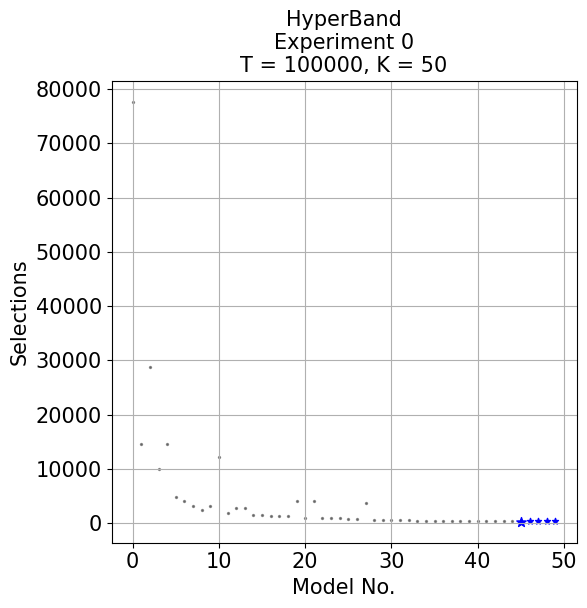

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.1459%
Time: 0.0024s
Number of HyperBand Rounds: 11
Average Epochs: [77634.         14685.27272727 28827.90909091  9933.18181818
 14658.54545455  4895.09090909  4222.          3211.90909091
  2538.63636364  3195.27272727 12286.18181818  1964.27272727
  2753.45454545  2753.45454545  1519.18181818  1519.18181818
  1295.          1295.          1295.          4100.90909091
  1070.63636364  4100.90909091  1070.63636364  1070.63636364
  1070.63636364   734.           734.          3720.09090909
   689.81818182   616.18181818   616.18181818   616.18181818
   616.18181818   542.54545455   542.54545455   542.54545455
   542.54545455   468.90909091   468.90909091   468.90909091
   468.90909091   468.90909091   394.18181818   394.18181818
   394.18181818   319.45454545   394.18181818   394.18181818
   394.18181818   394.18181818]
28.948325837081462 0.0005002056894087117
T = 100000, K = 50, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.086 times more often than sub-optimal models on average


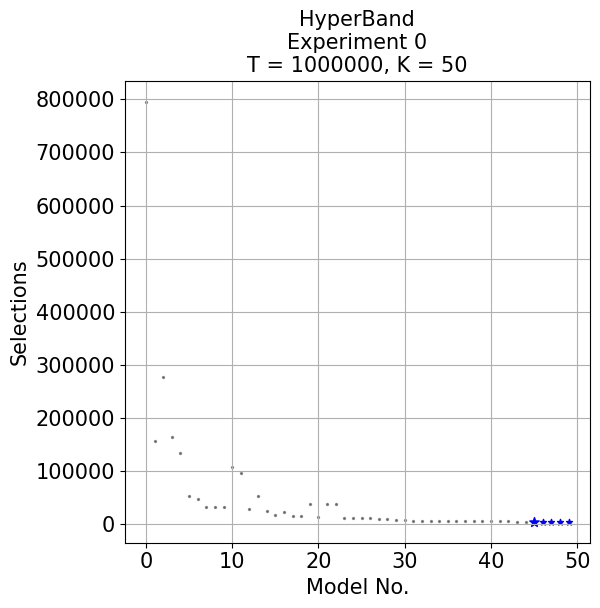

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.1884%
Time: 0.0034s
Number of HyperBand Rounds: 13
Average Epochs: [795552.92307692 156768.92307692 276428.84615385 163345.61538462
 134874.30769231  52256.30769231  46558.61538462  32313.92307692
  32313.92307692  32471.23076923 107599.84615385  97183.61538462
  28807.53846154  52554.38461538  25015.07692308  16468.07692308
  23116.76923077  14569.76923077  14569.76923077  38311.53846154
  12670.53846154  38311.53846154  38311.53846154  10771.30769231
  10771.30769231  10771.30769231  10771.30769231  10434.84615385
  10434.84615385   7025.07692308   7025.07692308   6426.92307692
   6426.92307692   6426.92307692   6426.92307692   5803.84615385
   5803.84615385   5803.84615385   5803.84615385   5172.46153846
   5172.46153846   5172.46153846   5172.46153846   4539.69230769
   4539.69230769   4539.69230769   4539.69230769   4539.69230769
   4539.69230769   4539.69230769]
24.073246337683116 4.65272341348291e-06
T = 1000000, K = 50, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.043 times more often than sub-optimal models on average


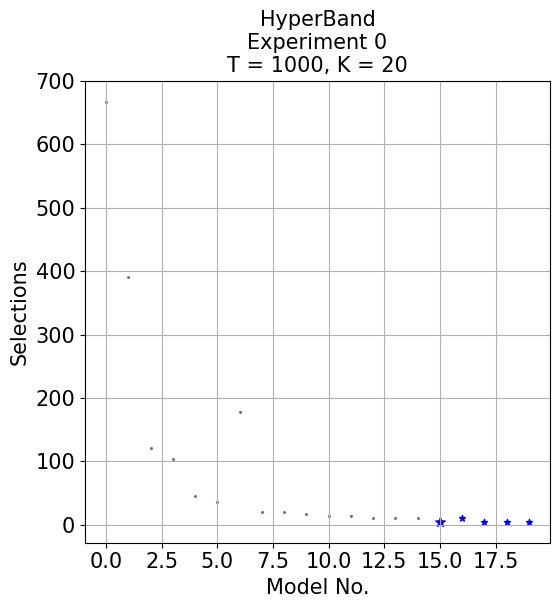

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.2798%
Time: 0.0018s
Number of HyperBand Rounds: 7
Average Epochs: [667.28571429 391.42857143 121.71428571 103.71428571  45.85714286
  35.28571429 178.14285714  19.42857143  19.42857143  16.85714286
  13.42857143  13.42857143  10.          10.          10.
   4.71428571  10.           4.71428571   4.71428571   4.71428571]
19.76470588235294 0.008890811018631081
T = 1000, K = 20, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.082 times more often than sub-optimal models on average


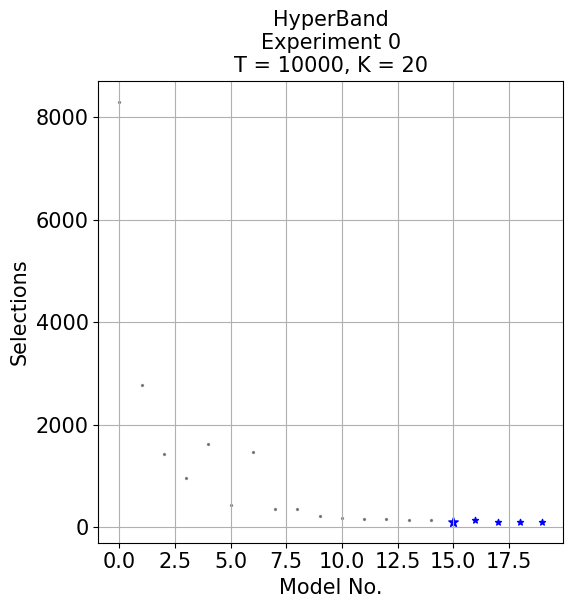

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.5344%
Time: 0.0022s
Number of HyperBand Rounds: 9
Average Epochs: [8300.         2773.77777778 1416.          965.11111111 1623.88888889
  430.77777778 1459.66666667  348.55555556  348.55555556  207.11111111
  183.11111111  157.11111111  157.11111111  129.77777778  129.77777778
  102.44444444  129.77777778  102.44444444  102.44444444  102.44444444]
6.226546906187624 0.00025424629147419154
T = 10000, K = 20, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.824 times more often than sub-optimal models on average


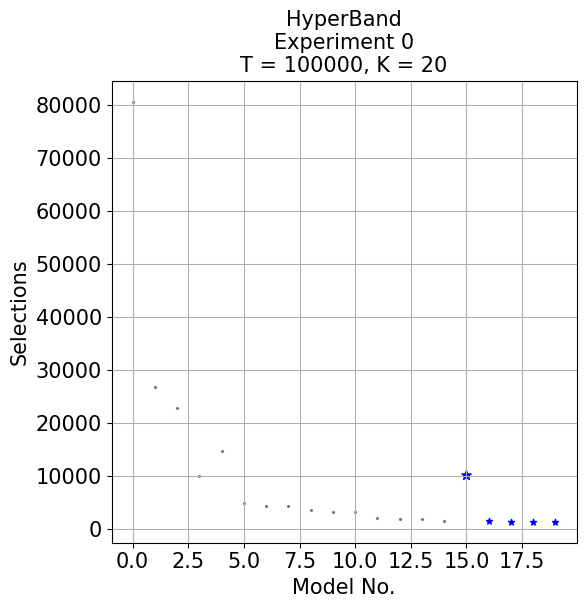

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 5.0644%
Time: 0.0017s
Number of HyperBand Rounds: 11
Average Epochs: [80664.27272727 26806.45454545 22767.36363636  9933.18181818
 14658.54545455  4895.09090909  4222.          4222.
  3548.72727273  3195.27272727  3195.27272727  1964.27272727
  1743.36363636  1743.36363636  1519.18181818 10161.45454545
  1519.18181818  1295.          1295.          1295.        ]
14.352429514097182 0.000281299386947049
T = 100000, K = 20, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.658 times more often than sub-optimal models on average


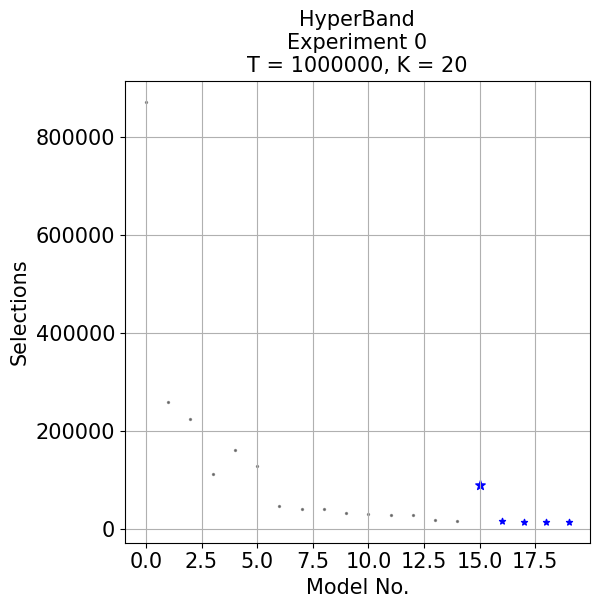

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 4.0866%
Time: 0.0031s
Number of HyperBand Rounds: 13
Average Epochs: [872475.92307692 259333.         225146.84615385 112063.61538462
 160515.30769231 129179.38461538  46558.61538462  40860.92307692
  40860.92307692  32471.23076923  30676.76923077  28807.53846154
  28807.53846154  18366.38461538  16468.07692308  89593.53846154
  16468.07692308  14569.76923077  14569.76923077  14569.76923077]
17.04877902441951 1.8867584912393194e-06
T = 1000000, K = 20, Experiment: 0'''
PlotHypSelections(input_string)

Optimal model recommended 0.030 times more often than sub-optimal models on average


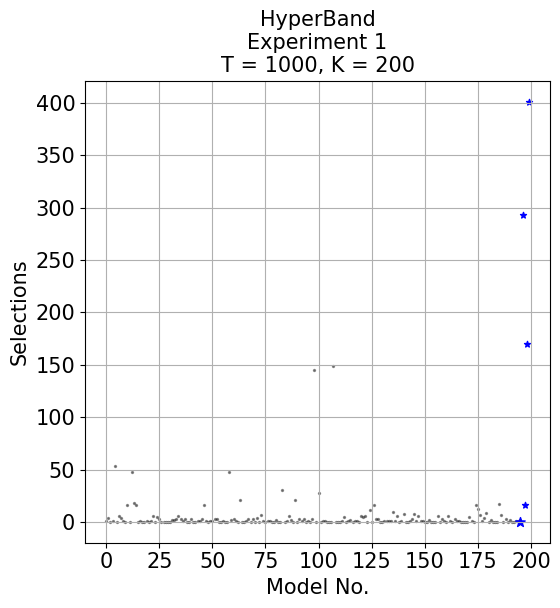

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0079%
Time: 0.0058s
Number of HyperBand Rounds: 7
Average Epochs: [1.00000000e+00 3.57142857e+00 1.42857143e-01 4.28571429e-01
 5.30000000e+01 1.42857143e-01 5.71428571e+00 3.85714286e+00
 1.00000000e+00 1.42857143e-01 1.60000000e+01 1.42857143e-01
 4.77142857e+01 1.80000000e+01 1.65714286e+01 1.42857143e-01
 4.28571429e-01 1.42857143e-01 1.42857143e-01 1.00000000e+00
 1.42857143e-01 1.00000000e+00 5.57142857e+00 1.42857143e-01
 4.71428571e+00 2.71428571e+00 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.85714286e+00
 1.85714286e+00 2.71428571e+00 5.42857143e+00 2.71428571e+00
 7.14285714e-01 2.71428571e+00 1.42857143e-01 1.42857143e-01
 3.00000000e+00 1.42857143e-01 1.42857143e-01 1.00000000e+00
 7.14285714e-01 2.71428571e+00 1.60000000e+01 1.00000000e+00
 1.42857143e-01 4.28571429e-01 1.00000000e+00 3.00000000e+00
 3.00000000e+00 1.42857143e-01 1.42857143e-01 1.00000000e+00
 1.42857143e-01 1.42857143e-01 4.77142857e+01 1.85714286e+00
 2.71428571e+00 1.00000000e+00 1.42857143e-01 2.10000000e+01
 1.42857143e-01 1.42857143e-01 1.00000000e+00 2.71428571e+00
 1.42857143e-01 2.42857143e+00 1.42857143e-01 3.85714286e+00
 1.42857143e-01 6.42857143e+00 4.28571429e-01 1.42857143e-01
 7.14285714e-01 4.28571429e-01 1.42857143e-01 1.42857143e-01
 2.14285714e+00 1.42857143e-01 1.42857143e-01 3.00000000e+01
 1.42857143e-01 1.00000000e+00 6.00000000e+00 1.85714286e+00
 1.42857143e-01 2.10000000e+01 1.42857143e-01 2.42857143e+00
 4.28571429e-01 2.71428571e+00 1.42857143e-01 7.14285714e-01
 1.42857143e-01 2.42857143e+00 1.44714286e+02 1.42857143e-01
 2.74285714e+01 1.42857143e-01 1.00000000e+00 1.00000000e+00
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.48428571e+02
 1.42857143e-01 1.42857143e-01 1.42857143e-01 7.14285714e-01
 4.71428571e+00 1.42857143e-01 7.14285714e-01 2.14285714e+00
 1.42857143e-01 1.00000000e+00 7.14285714e-01 1.42857143e-01
 5.71428571e+00 4.71428571e+00 5.42857143e+00 1.42857143e-01
 1.15714286e+01 1.42857143e-01 1.60000000e+01 2.71428571e+00
 2.71428571e+00 1.42857143e-01 1.42857143e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 1.00000000e+00 9.00000000e+00
 1.00000000e+00 5.57142857e+00 1.42857143e-01 7.14285714e-01
 7.28571429e+00 1.42857143e-01 1.42857143e-01 4.28571429e-01
 2.42857143e+00 7.14285714e+00 7.14285714e-01 5.85714286e+00
 7.14285714e-01 4.28571429e-01 1.42857143e-01 1.42857143e-01
 2.14285714e+00 1.42857143e-01 1.42857143e-01 1.42857143e-01
 5.42857143e+00 1.42857143e-01 2.42857143e+00 7.14285714e-01
 1.42857143e-01 5.42857143e+00 1.00000000e+00 1.42857143e-01
 3.00000000e+00 1.00000000e+00 7.14285714e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 4.71428571e+00
 7.14285714e-01 1.42857143e-01 1.60000000e+01 1.25714286e+01
 6.14285714e+00 1.00000000e+00 3.85714286e+00 8.28571429e+00
 1.42857143e-01 1.85714286e+00 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.67142857e+01 6.14285714e+00 1.42857143e-01
 2.71428571e+00 1.42857143e-01 1.85714286e+00 1.42857143e-01
 1.42857143e-01 1.00000000e+00 1.00000000e+00 1.42857143e-01
 2.93142857e+02 1.60000000e+01 1.69714286e+02 4.01142857e+02]
0.24999999999999997 4.336808689942018e-19
T = 1000, K = 200, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 0.063 times more often than sub-optimal models on average


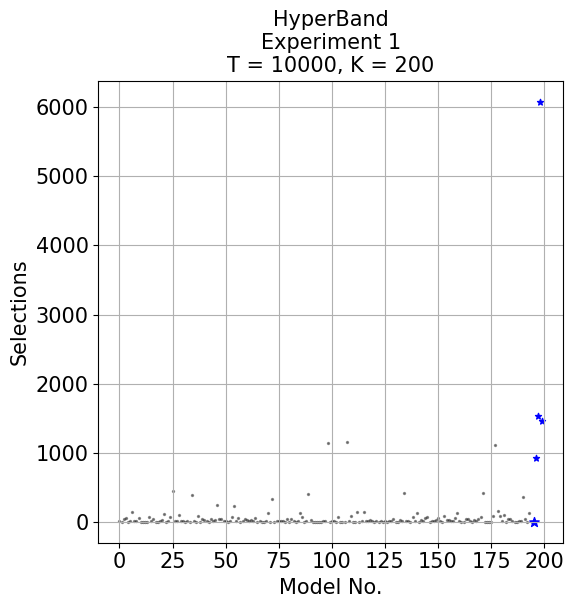

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0174%
Time: 0.0059s
Number of HyperBand Rounds: 9
Average Epochs: [1.12222222e+01 3.77777778e+00 4.47777778e+01 5.70000000e+01
 3.77777778e+00 8.33333333e+00 1.40888889e+02 1.12222222e+01
 8.33333333e+00 5.33333333e+01 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 7.46666667e+01 1.12222222e+01
 3.86666667e+01 3.77777778e+00 3.77777778e+00 1.12222222e+01
 3.55555556e+01 1.17000000e+02 6.66666667e+00 8.33333333e+00
 7.73333333e+01 4.50111111e+02 1.38888889e+01 8.33333333e+00
 1.05333333e+02 1.58888889e+01 1.38888889e+01 5.77777778e+00
 1.10000000e+01 3.77777778e+00 3.92222222e+02 1.30000000e+01
 3.77777778e+00 8.73333333e+01 3.77777778e+00 3.86666667e+01
 2.46666667e+01 1.32222222e+01 3.77777778e+00 3.86666667e+01
 8.33333333e+00 2.45555556e+01 2.48666667e+02 3.82222222e+01
 4.66666667e+01 1.12222222e+01 8.33333333e+00 6.66666667e+00
 9.33333333e+00 7.80000000e+01 2.24777778e+02 8.66666667e+00
 5.23333333e+01 6.66666667e+00 1.12222222e+01 3.66666667e+01
 3.55555556e+01 1.12222222e+01 2.18888889e+01 1.58888889e+01
 5.50000000e+01 3.77777778e+00 8.33333333e+00 3.77777778e+00
 3.77777778e+00 1.03333333e+01 1.26888889e+02 3.77777778e+00
 3.28888889e+02 3.77777778e+00 8.33333333e+00 1.12222222e+01
 1.74444444e+01 1.32222222e+01 3.77777778e+00 3.86666667e+01
 3.77777778e+00 4.46666667e+01 1.30000000e+01 3.77777778e+00
 1.30000000e+01 1.33777778e+02 7.16666667e+01 6.66666667e+00
 1.12222222e+01 4.09000000e+02 3.05555556e+01 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 1.58888889e+01 9.33333333e+00 1.13611111e+03 6.44444444e+00
 1.74444444e+01 1.74444444e+01 3.77777778e+00 7.10000000e+01
 3.77777778e+00 3.77777778e+00 3.77777778e+00 1.16088889e+03
 1.63333333e+01 8.10000000e+01 3.77777778e+00 5.77777778e+00
 1.39333333e+02 3.77777778e+00 8.33333333e+00 1.48000000e+02
 1.58888889e+01 8.33333333e+00 2.25555556e+01 8.33333333e+00
 5.77777778e+00 1.38888889e+01 3.77777778e+00 8.44444444e+00
 3.77777778e+00 1.58888889e+01 3.77777778e+00 1.03333333e+01
 1.58888889e+01 4.85555556e+01 3.77777778e+00 3.77777778e+00
 2.18888889e+01 8.33333333e+00 4.13888889e+02 1.58888889e+01
 1.32222222e+01 3.77777778e+00 6.86666667e+01 8.66666667e+00
 1.23333333e+02 6.66666667e+00 3.16666667e+01 8.33333333e+00
 5.33333333e+01 7.16666667e+01 3.77777778e+00 1.58888889e+01
 9.33333333e+00 3.25555556e+01 5.83333333e+01 1.58888889e+01
 3.77777778e+00 8.84444444e+01 3.25555556e+01 2.38888889e+01
 1.03333333e+01 1.10000000e+01 6.30000000e+01 1.25444444e+02
 1.58888889e+01 6.44444444e+00 3.77777778e+00 4.73333333e+01
 4.78888889e+01 1.64444444e+01 3.77777778e+00 3.25555556e+01
 8.33333333e+00 4.47777778e+01 7.77777778e+01 4.15111111e+02
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 7.93333333e+01 1.11944444e+03 1.63000000e+02 8.07777778e+01
 1.92222222e+01 1.08000000e+02 3.77777778e+00 4.68888889e+01
 4.53333333e+01 8.33333333e+00 3.77777778e+00 3.77777778e+00
 8.33333333e+00 1.32222222e+01 3.63333333e+02 3.86666667e+01
 3.77777778e+00 1.30111111e+02 3.77777778e+00 3.77777778e+00
 9.22000000e+02 1.53900000e+03 6.07900000e+03 1.45900000e+03]
0.43137254901960775 8.673617379884035e-19
T = 10000, K = 200, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 76.309 times more often than sub-optimal models on average


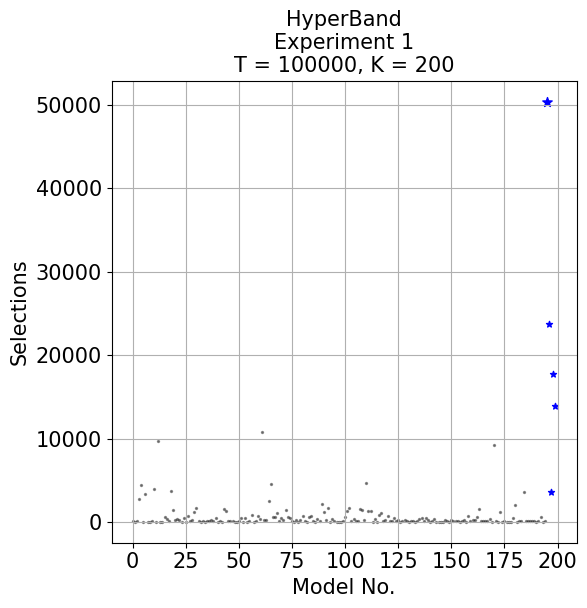

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 21.1537%
Time: 0.0055s
Number of HyperBand Rounds: 11
Average Epochs: [  168.81818182    56.63636364   118.90909091  2753.45454545
  4460.90909091    56.63636364  3426.54545455    56.63636364
    56.63636364   118.54545455  3923.            56.63636364
  9673.36363636    56.63636364    56.63636364   641.36363636
   400.90909091   192.54545455  3747.36363636  1459.09090909
   319.45454545   393.09090909   207.27272727    56.63636364
   468.90909091    56.63636364   693.27272727    94.
   251.45454545  1227.18181818  1743.90909091   130.27272727
    56.63636364   118.90909091    56.63636364   118.90909091
   143.09090909   231.09090909   108.72727273   513.09090909
    56.63636364   192.54545455    56.63636364  1576.90909091
  1292.09090909   182.72727273    94.           118.90909091
    71.36363636    56.63636364    94.           470.27272727
    56.63636364   529.09090909    56.63636364    94.
   886.90909091    56.63636364   118.90909091   693.27272727
   363.63636364 10794.09090909   255.63636364   304.72727273
  2494.54545455  4542.09090909   577.63636364   641.36363636
  1090.90909091   192.54545455   504.27272727   294.54545455
  1408.63636364   641.36363636   468.90909091   118.90909091
    81.18181818   207.27272727    81.18181818   319.45454545
   689.81818182   118.90909091    56.63636364   588.09090909
   693.27272727   118.54545455    56.63636364   330.
   192.54545455  2148.09090909  1225.63636364   207.27272727
  1699.90909091    56.63636364   428.18181818   192.54545455
    56.63636364    56.63636364    56.63636364   192.54545455
   582.45454545  1351.90909091  1699.18181818   105.72727273
   413.45454545   143.45454545   118.90909091  1539.27272727
  1471.63636364   242.72727273  4661.72727273  1396.72727273
  1389.54545455    56.63636364   413.45454545    56.63636364
   838.36363636  1138.18181818   118.90909091   230.72727273
   716.09090909   118.90909091    94.           513.09090909
   118.90909091   251.45454545    81.18181818   118.90909091
   251.45454545    94.            56.63636364   118.90909091
   167.63636364    56.63636364   118.90909091   394.18181818
   468.90909091   118.90909091   468.90909091   307.63636364
    56.63636364   133.63636364   356.72727273    56.63636364
    71.36363636    56.63636364    56.63636364   268.36363636
   167.63636364    56.63636364   294.90909091   192.54545455
   168.           118.90909091    56.63636364   118.90909091
   319.45454545    56.63636364   764.81818182   118.90909091
   231.09090909   268.36363636   656.09090909  1580.
    94.           118.90909091   118.90909091   182.72727273
   339.81818182    56.63636364  9224.54545455    94.
    56.63636364  1217.36363636    56.63636364   167.63636364
    81.18181818    56.63636364    56.63636364   543.90909091
  2035.63636364    56.63636364   118.90909091   192.54545455
  3593.18181818   143.45454545   152.90909091   133.63636364
   105.72727273   108.72727273    56.63636364   133.63636364
   656.09090909    56.63636364    94.         50367.27272727
 23772.27272727  3563.18181818 17716.09090909 13973.72727273]
0.539121756487026 5.988023952095863e-06
T = 100000, K = 200, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 84.047 times more often than sub-optimal models on average


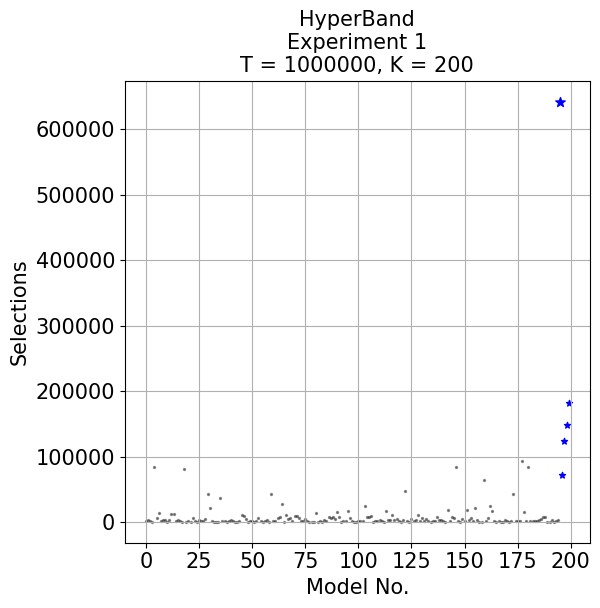

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 24.1530%
Time: 0.0096s
Number of HyperBand Rounds: 13
Average Epochs: [  1407.61538462   3587.07692308   1407.61538462    985.76923077
  84900.15384615   6366.76923077  13310.38461538   2007.69230769
   3794.76923077   2990.30769231    879.69230769   4034.23076923
  12142.38461538  12525.84615385   1805.           2861.92307692
   2001.15384615    669.23076923  81254.76923077    985.76923077
   1301.53846154    985.76923077   5759.53846154   1937.92307692
    985.76923077   2559.61538462   1196.69230769   2212.07692308
   4964.76923077  43596.46153846  21003.           1607.
    985.76923077    880.15384615    669.23076923  36177.92307692
   1193.46153846   1614.84615385    985.76923077   1196.23076923
   3102.           1929.61538462    985.76923077    669.23076923
   1603.76923077  11315.69230769   9525.07692308   4853.38461538
    669.23076923   2025.15384615   1196.69230769    985.76923077
   1719.15384615   6755.92307692   1606.53846154    669.23076923
   1196.23076923   3809.69230769    985.76923077  43380.69230769
   1730.23076923   1407.61538462   6227.53846154   7290.92307692
  28413.84615385    985.76923077  11395.38461538   4443.53846154
   5723.23076923   1825.76923077   9248.23076923   9954.61538462
   5936.69230769   1407.61538462   1906.07692308   4392.92307692
   1308.84615385    879.69230769    985.76923077    985.76923077
  13403.07692308    879.69230769   1079.53846154    985.76923077
   3794.76923077   2025.15384615   8021.46153846   5884.15384615
   7392.           5049.23076923  14856.           8586.
    985.76923077   2448.84615385   1196.69230769  17123.30769231
   5596.15384615   1407.15384615    879.69230769    669.23076923
   1196.69230769   1407.61538462   2250.84615385  25067.92307692
   7259.07692308   8116.92307692   8889.23076923    669.23076923
   1825.76923077   1730.23076923   3197.53846154   1196.69230769
    669.23076923  17369.76923077   2962.30769231   3485.07692308
  11536.15384615   2768.69230769   5410.           1603.30769231
    669.23076923   2844.84615385  47776.15384615   1730.23076923
    669.23076923   4392.92307692   1193.46153846   3086.92307692
  10559.69230769   1407.61538462   6872.30769231   1091.07692308
   4256.61538462   2001.61538462    985.76923077   1825.76923077
   1607.           7585.84615385   3593.69230769   2549.92307692
   1407.61538462    985.76923077  18842.           1196.69230769
   7388.38461538   6122.84615385  83679.           2103.15384615
    669.23076923   4531.84615385   1091.07692308  18682.61538462
   2872.53846154   6096.           1196.69230769  21499.61538462
   3198.            985.76923077    985.76923077  64164.
   1817.46153846   6116.15384615  24147.61538462  17297.
   2212.07692308    669.23076923   2324.23076923    669.23076923
    669.23076923   2955.61538462   2012.69230769    879.69230769
   1407.61538462  43662.92307692   1407.61538462   2137.30769231
   1917.15384615  93375.07692308  14775.30769231   1614.84615385
  83885.84615385   1196.69230769   1407.61538462   1615.30769231
   1825.76923077   2887.53846154   5171.07692308   7750.30769231
   7324.15384615    985.76923077    985.76923077   2984.69230769
    985.76923077   1407.61538462   3926.23076923 641706.92307692
  72180.69230769 123475.15384615 148223.76923077 182409.92307692]
5.0115876824635075 0.00013413758654245484
T = 1000000, K = 200, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 0.013 times more often than sub-optimal models on average


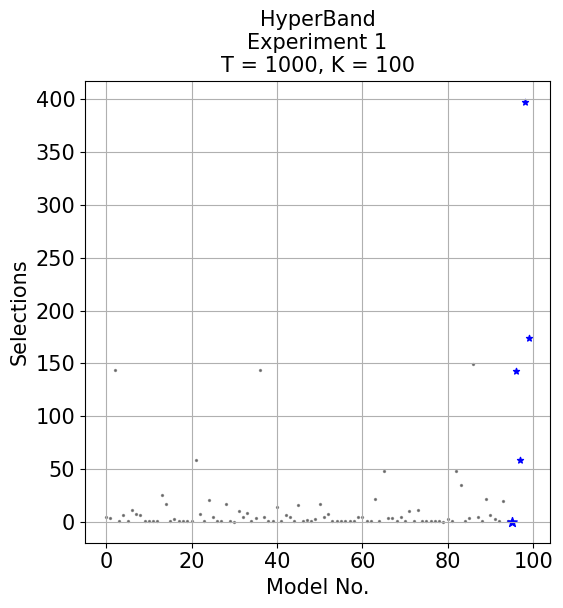

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0079%
Time: 0.0040s
Number of HyperBand Rounds: 7
Average Epochs: [4.71428571e+00 3.57142857e+00 1.43571429e+02 1.00000000e+00
 6.28571429e+00 7.14285714e-01 1.14285714e+01 7.28571429e+00
 6.28571429e+00 7.14285714e-01 1.00000000e+00 1.00000000e+00
 1.00000000e+00 2.50000000e+01 1.68571429e+01 7.14285714e-01
 2.71428571e+00 7.14285714e-01 1.00000000e+00 1.00000000e+00
 1.00000000e+00 5.82857143e+01 7.28571429e+00 1.00000000e+00
 2.05714286e+01 4.71428571e+00 1.00000000e+00 4.28571429e-01
 1.68571429e+01 1.00000000e+00 1.42857143e-01 1.00000000e+01
 4.71428571e+00 8.14285714e+00 7.14285714e-01 3.85714286e+00
 1.43714286e+02 4.71428571e+00 1.00000000e+00 1.00000000e+00
 1.41428571e+01 1.00000000e+00 6.28571429e+00 4.42857143e+00
 1.00000000e+00 1.60000000e+01 1.00000000e+00 1.85714286e+00
 7.14285714e-01 2.71428571e+00 1.68571429e+01 4.71428571e+00
 7.28571429e+00 1.00000000e+00 7.14285714e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 7.14285714e-01 4.71428571e+00
 4.71428571e+00 1.00000000e+00 1.00000000e+00 2.18571429e+01
 1.00000000e+00 4.85714286e+01 3.85714286e+00 3.57142857e+00
 1.00000000e+00 4.71428571e+00 7.14285714e-01 1.00000000e+01
 7.14285714e-01 1.15714286e+01 1.00000000e+00 7.14285714e-01
 1.00000000e+00 1.00000000e+00 4.28571429e-01 1.42857143e-01
 2.71428571e+00 1.00000000e+00 4.82857143e+01 3.52857143e+01
 1.00000000e+00 3.85714286e+00 1.49142857e+02 4.71428571e+00
 7.14285714e-01 2.18571429e+01 6.28571429e+00 2.71428571e+00
 1.00000000e+00 1.97142857e+01 7.14285714e-01 1.42857143e-01
 1.42857143e+02 5.82857143e+01 3.97714286e+02 1.74000000e+02]
0.9999999999999999 1.734723475976807e-18
T = 1000, K = 100, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 35.239 times more often than sub-optimal models on average


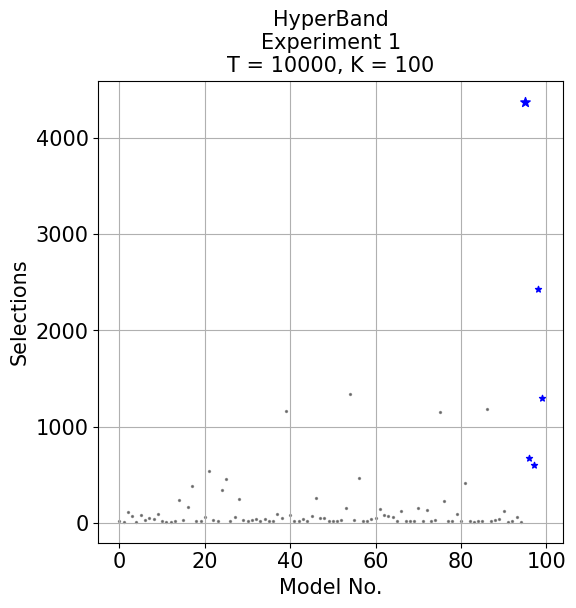

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 20.6697%
Time: 0.0042s
Number of HyperBand Rounds: 9
Average Epochs: [  15.88888889   11.22222222  107.33333333   72.22222222   11.22222222
   77.77777778   34.           54.55555556   38.66666667   94.44444444
   13.88888889   11.22222222   13.22222222   15.88888889  233.44444444
   29.55555556  168.11111111  386.22222222   15.88888889   21.88888889
   61.33333333  536.33333333   29.55555556   13.88888889  336.11111111
  458.77777778   15.88888889   57.          251.88888889   24.55555556
   15.88888889   29.55555556   38.22222222   15.88888889   44.66666667
   15.88888889   15.88888889   87.33333333   53.33333333 1157.66666667
   79.33333333   23.88888889   13.88888889   38.66666667   15.88888889
   65.66666667  257.33333333   47.33333333   46.66666667   15.88888889
   15.88888889   15.88888889   29.55555556  157.11111111 1344.44444444
   24.55555556  463.66666667   15.88888889   15.88888889   38.66666667
   52.66666667  139.33333333   79.33333333   70.66666667   57.
   13.88888889  121.55555556   15.88888889   15.88888889   15.88888889
  149.11111111   13.88888889  132.66666667   13.88888889   29.88888889
 1155.77777778  225.88888889   15.88888889   13.88888889   96.44444444
   13.88888889  415.           15.88888889   11.22222222   15.88888889
   15.88888889 1182.77777778   15.88888889   24.55555556   38.66666667
  119.33333333   11.22222222   15.88888889   57.           11.22222222
 4379.33333333  675.33333333  597.33333333 2434.         1295.        ]
0.8514851485148517 1.734723475976807e-18
T = 10000, K = 100, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 64.230 times more often than sub-optimal models on average


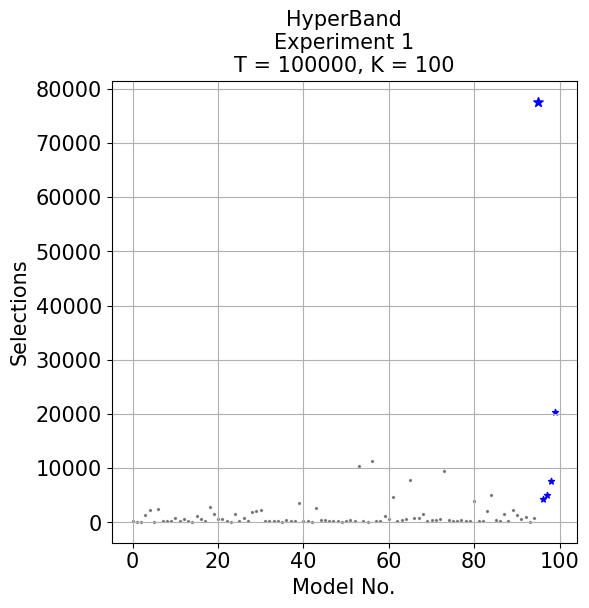

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 33.7978%
Time: 0.0062s
Number of HyperBand Rounds: 11
Average Epochs: [  304.72727273   182.72727273   182.72727273  1406.72727273
  2317.72727273   168.          2416.45454545   192.54545455
   192.54545455   282.           917.27272727   207.27272727
   656.09090909   192.54545455   168.          1245.18181818
   737.54545455   319.45454545  2886.54545455  1621.09090909
   660.36363636   689.81818182   207.27272727   168.
  1596.81818182   304.72727273   766.90909091   192.54545455
  1931.27272727  2148.27272727  2301.63636364   192.54545455
   339.81818182   207.27272727   319.45454545   168.
   379.45454545   304.72727273   257.45454545  3543.36363636
   192.54545455   192.54545455   182.72727273  2631.
   468.90909091   468.90909091   356.72727273   282.
   207.27272727   168.           319.45454545   393.09090909
   207.27272727 10345.           192.54545455   143.45454545
 11434.           207.27272727   207.27272727  1250.81818182
   586.72727273  4682.           319.45454545   394.18181818
   621.81818182  7915.45454545   914.18181818   805.54545455
  1539.72727273   207.27272727   543.90909091   394.18181818
   659.27272727  9559.81818182   468.90909091   207.27272727
   207.27272727   468.90909091   207.27272727   319.45454545
  3988.63636364   207.27272727   207.27272727  2196.
  5070.27272727   540.36363636   319.45454545  1631.45454545
   207.27272727  2324.81818182  1352.54545455   656.09090909
  1026.45454545   182.72727273   764.72727273 77634.09090909
  4282.63636364  4995.36363636  7615.90909091 20348.18181818]
1.2385614385614387 1.1650253536154699e-05
T = 100000, K = 100, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 54.353 times more often than sub-optimal models on average


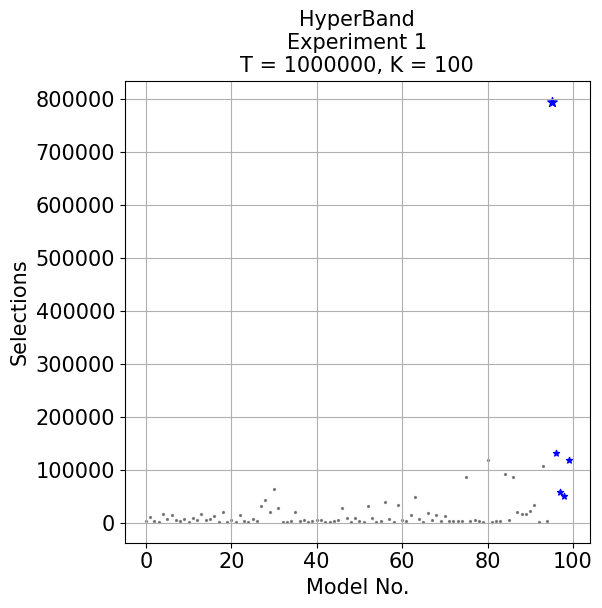

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 31.2658%
Time: 0.0065s
Number of HyperBand Rounds: 13
Average Epochs: [  3273.84615385  10509.15384615   3906.92307692   2124.84615385
  15915.61538462   6356.30769231  14689.61538462   5137.53846154
   3906.92307692   6140.30769231   1825.76923077   9251.
   5803.84615385  15509.76923077   4505.07692308   6059.69230769
  13391.23076923   2025.15384615  19364.92307692   2212.07692308
   4539.38461538   2212.07692308  13827.15384615   3273.84615385
   2212.07692308   6438.61538462   3161.69230769  31046.
  42469.15384615  19931.30769231  62862.          28484.46153846
   2137.30769231   2212.07692308   3906.92307692  20260.53846154
   2324.23076923   4874.46153846   2137.30769231   2922.38461538
   4343.07692308   5795.53846154   2137.30769231   2212.07692308
   2324.23076923   4538.30769231  28036.53846154   8642.84615385
   1825.76923077   8357.92307692   3906.92307692   2025.15384615
  30769.15384615   7949.46153846   2212.07692308   2324.23076923
  38726.30769231   7407.23076923   1825.76923077  34367.
   5171.07692308   3794.76923077  14973.92307692  48718.84615385
   6701.07692308   2212.07692308  18752.69230769   5442.38461538
  13936.53846154   3906.92307692  13010.23076923   2324.23076923
   3720.           3906.92307692   3273.84615385  85541.30769231
   2324.23076923   4538.30769231   2324.23076923   1825.76923077
 117738.15384615   2137.30769231   3607.84615385   3273.84615385
  92546.46153846   4539.38461538  86136.69230769  20716.38461538
  16463.92307692  17217.          21245.          32503.38461538
   2212.07692308 107094.07692308   3794.76923077 795553.
 131127.92307692  57813.          50541.92307692 118950.        ]
42.75836416358364 0.0343582302198229
T = 1000000, K = 100, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 0.065 times more often than sub-optimal models on average


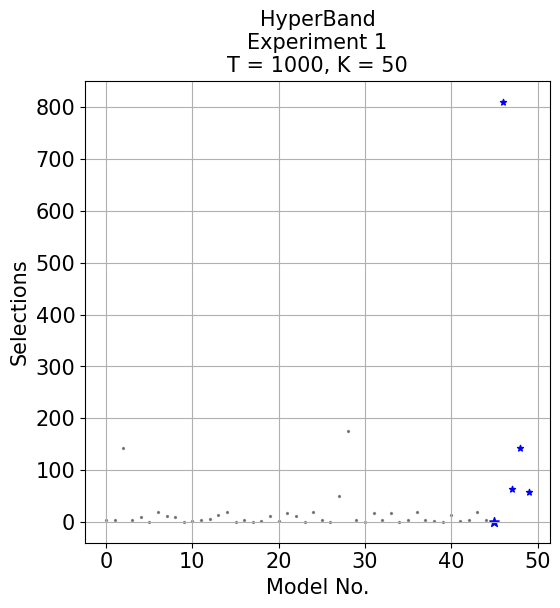

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 0.0567%
Time: 0.0022s
Number of HyperBand Rounds: 7
Average Epochs: [  4.71428571   4.71428571 143.85714286   4.71428571   9.14285714
   1.          19.42857143  12.57142857   9.14285714   1.
   2.71428571   4.71428571   6.14285714  13.42857143  19.71428571
   1.           4.71428571   1.           2.71428571  12.57142857
   2.71428571  16.85714286  12.57142857   1.          20.57142857
   4.71428571   1.          50.28571429 175.57142857   4.71428571
   1.          16.85714286   4.71428571  16.85714286   1.
   4.71428571  20.57142857   4.71428571   2.71428571   1.
  14.14285714   2.71428571   4.71428571  19.42857143   4.71428571
   1.         810.          63.85714286 142.28571429  58.28571429]
1.7142857142857146 3.469446951953614e-18
T = 1000, K = 50, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 31.555 times more often than sub-optimal models on average


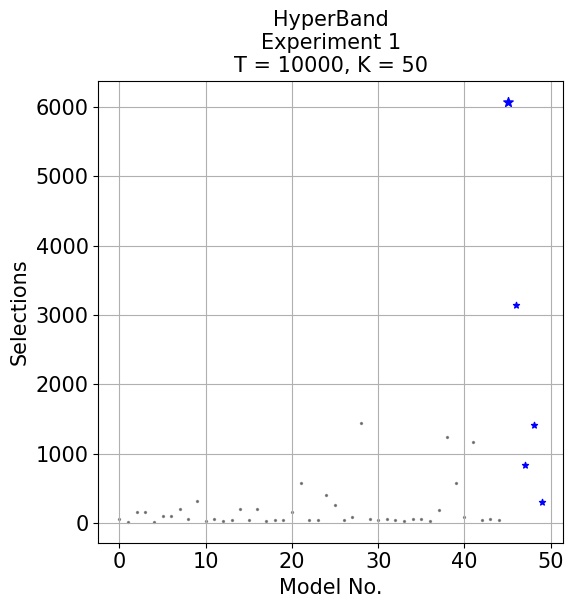

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 29.7143%
Time: 0.0033s
Number of HyperBand Rounds: 9
Average Epochs: [  53.33333333   15.88888889  157.11111111  149.77777778   15.88888889
  102.44444444   96.44444444  199.11111111   61.33333333  308.11111111
   29.55555556   55.33333333   29.55555556   38.22222222  201.11111111
   47.33333333  204.11111111   29.55555556   38.66666667   43.55555556
  157.11111111  577.44444444   46.66666667   38.66666667  404.55555556
  251.88888889   46.66666667   79.77777778 1435.66666667   55.33333333
   38.22222222   52.66666667   47.33333333   29.55555556   53.33333333
   53.33333333   29.55555556  183.11111111 1240.88888889  573.11111111
   79.33333333 1172.44444444   46.66666667   53.33333333   44.66666667
 6078.         3144.          841.66666667 1416.          307.33333333]
1.82089552238806 3.469446951953614e-18
T = 10000, K = 50, Experiment: 1
'''
PlotHypSelections(input_string)

Optimal model recommended 34.144 times more often than sub-optimal models on average


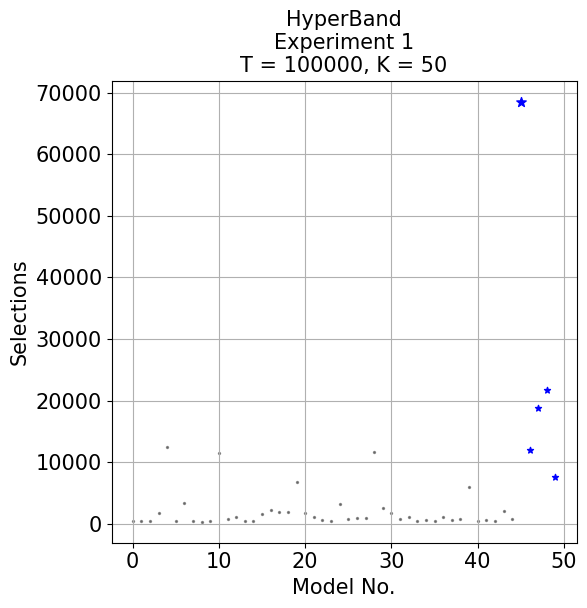

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 31.3121%
Time: 0.0039s
Number of HyperBand Rounds: 11
Average Epochs: [  468.90909091   394.18181818   467.81818182  1743.36363636
 12418.72727273   468.90909091  3426.54545455   394.18181818
   319.45454545   468.90909091 11507.54545455   689.81818182
  1070.63636364   394.18181818   467.81818182  1512.45454545
  2181.90909091  1894.81818182  1875.90909091  6803.90909091
  1743.36363636  1070.63636364   660.36363636   394.18181818
  3202.54545455   689.81818182   914.18181818   952.81818182
 11620.          2529.09090909  1739.90909091   689.81818182
  1070.63636364   468.90909091   542.54545455   468.90909091
  1026.45454545   586.72727273   693.27272727  5998.09090909
   394.18181818   616.18181818   468.90909091  2090.27272727
   734.         68543.18181818 11953.36363636 18726.
 21756.81818182  7587.81818182]
3.030684657671164 4.705088374188886e-05
T = 100000, K = 50, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 30.940 times more often than sub-optimal models on average


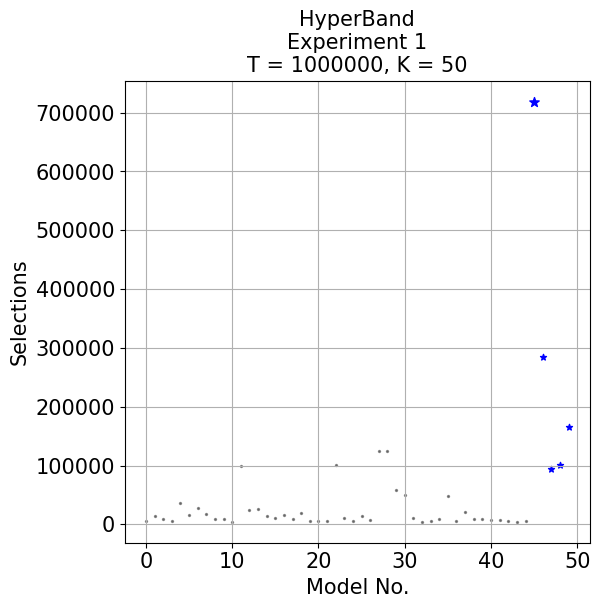

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 29.8215%
Time: 0.0036s
Number of HyperBand Rounds: 13
Average Epochs: [  6356.30769231  14009.           9275.92307692   5172.46153846
  37196.92307692  15474.38461538  28707.84615385  17176.38461538
   8898.92307692   9550.07692308   4539.69230769  98500.38461538
  25016.30769231  26913.38461538  14233.30769231  10771.30769231
  15871.15384615   8643.15384615  20131.76923077   5171.07692308
   6402.           6426.92307692 100847.30769231  11130.
   5733.23076923  14569.76923077   7025.07692308 124724.15384615
 124476.92307692  58252.38461538  50574.          10547.
   4539.69230769   5803.84615385   8652.84615385  48593.23076923
   5172.46153846  20267.76923077   9242.69230769   9874.07692308
   7361.53846154   7585.84615385   5733.23076923   4539.69230769
   5507.53846154 718629.92307692 284973.92307692  94497.69230769
 100686.23076923 165789.69230769]
68.65472726363683 0.12621057409233172
T = 1000000, K = 50, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 7.763 times more often than sub-optimal models on average


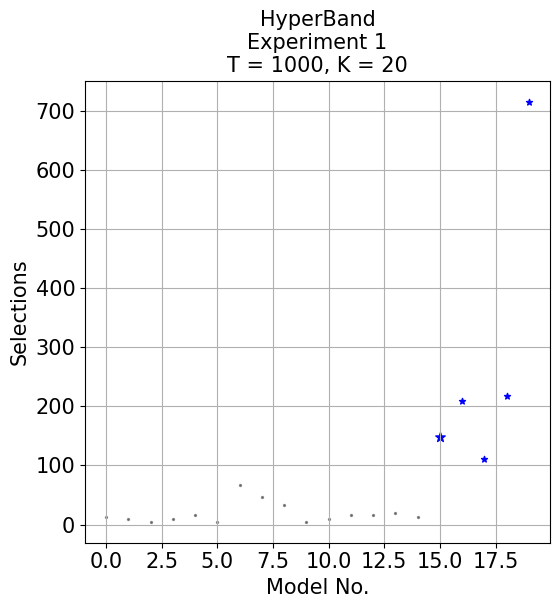

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 8.7502%
Time: 0.0014s
Number of HyperBand Rounds: 7
Average Epochs: [ 12.57142857  10.           4.71428571  10.          16.85714286
   4.71428571  67.          45.85714286  32.71428571   4.71428571
  10.          16.          16.85714286  19.42857143  13.42857143
 147.42857143 209.14285714 111.42857143 217.         715.        ]
4.509803921568627 0.0
T = 1000, K = 20, Experiment: 1
'''
PlotHypSelections(input_string)

Optimal model recommended 36.186 times more often than sub-optimal models on average


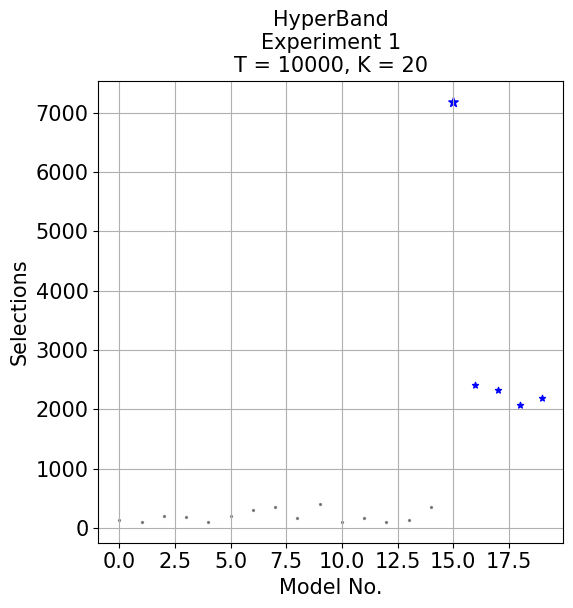

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 37.5015%
Time: 0.0020s
Number of HyperBand Rounds: 9
Average Epochs: [ 129.77777778  102.44444444  207.11111111  183.11111111  102.44444444
  197.77777778  306.55555556  348.55555556  157.11111111  404.77777778
  102.44444444  157.11111111  102.44444444  129.77777778  348.55555556
 7189.         2403.33333333 2323.11111111 2076.22222222 2198.22222222]
5.280439121756488 2.9940119760479838e-05
T = 10000, K = 20, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 35.424 times more often than sub-optimal models on average


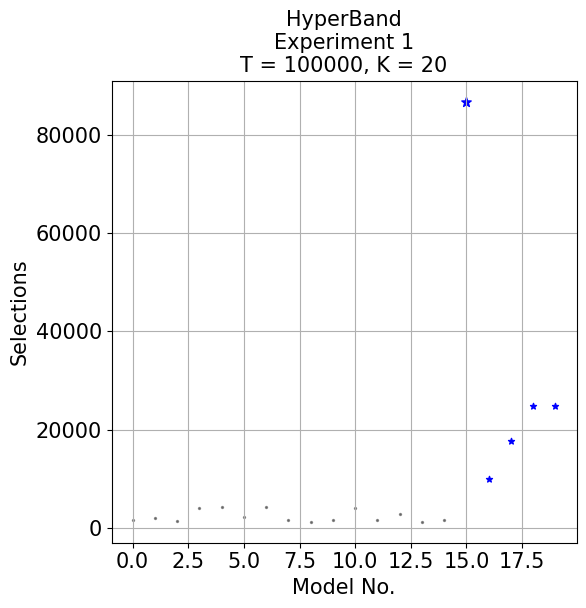

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 43.2232%
Time: 0.0018s
Number of HyperBand Rounds: 11
Average Epochs: [ 1743.36363636  2093.54545455  1519.          4089.45454545
  4222.          2305.09090909  4221.81818182  1740.09090909
  1295.          1743.36363636  4089.45454545  1736.81818182
  2886.          1295.          1743.36363636 86724.81818182
  9933.18181818 17688.81818182 24787.18181818 24786.63636364]
20.276644671065785 0.0007244936318528443
T = 100000, K = 20, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 25.583 times more often than sub-optimal models on average


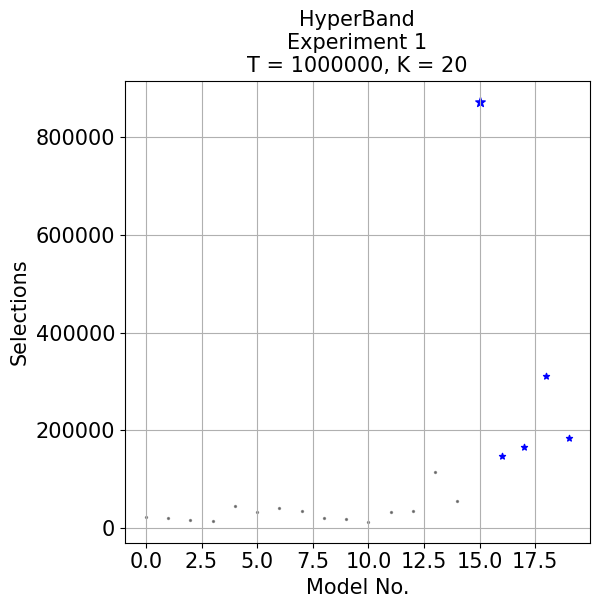

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 39.7961%
Time: 0.0024s
Number of HyperBand Rounds: 13
Average Epochs: [ 22030.07692308  20231.46153846  16463.92307692  14569.76923077
  44763.84615385  31611.38461538  40860.92307692  34289.53846154
  20160.84615385  18366.38461538  12670.53846154  32359.07692308
  33620.76923077 115232.15384615  54315.61538462 872475.92307692
 148223.76923077 166197.76923077 310615.         183304.23076923]
81.16608667826644 5.385057106149018e-07
T = 1000000, K = 20, Experiment: 1'''
PlotHypSelections(input_string)

Optimal model recommended 30.064 times more often than sub-optimal models on average


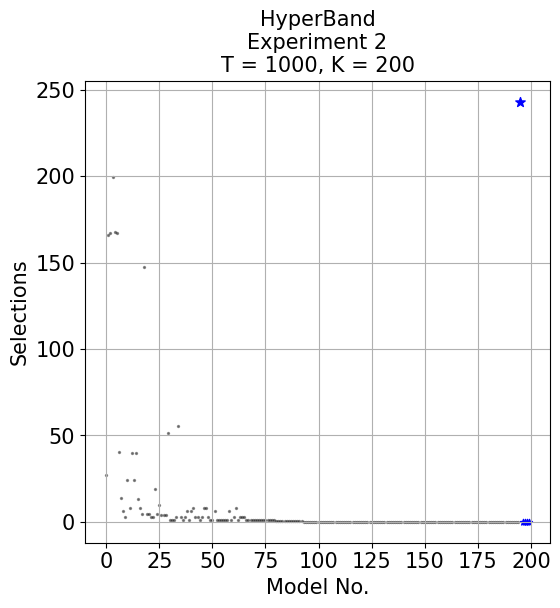

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 13.3537%
Time: 0.0029s
Number of HyperBand Rounds: 7
Average Epochs: [2.70000000e+01 1.65857143e+02 1.67142857e+02 1.99285714e+02
 1.67571429e+02 1.67285714e+02 4.02857143e+01 1.41428571e+01
 6.42857143e+00 3.00000000e+00 2.40000000e+01 8.14285714e+00
 3.98571429e+01 2.40000000e+01 3.98571429e+01 1.34285714e+01
 8.14285714e+00 4.71428571e+00 1.47571429e+02 4.71428571e+00
 4.71428571e+00 3.00000000e+00 3.00000000e+00 1.88571429e+01
 4.71428571e+00 1.00000000e+01 3.85714286e+00 3.85714286e+00
 3.85714286e+00 5.14285714e+01 1.00000000e+00 1.00000000e+00
 1.00000000e+00 2.71428571e+00 5.55714286e+01 2.71428571e+00
 1.00000000e+00 2.71428571e+00 6.28571429e+00 1.00000000e+00
 6.28571429e+00 8.00000000e+00 2.71428571e+00 2.71428571e+00
 1.00000000e+00 2.71428571e+00 8.00000000e+00 8.00000000e+00
 2.71428571e+00 1.00000000e+00 1.00000000e+00 6.28571429e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 6.28571429e+00 1.00000000e+00
 2.71428571e+00 8.00000000e+00 1.00000000e+00 2.71428571e+00
 2.71428571e+00 2.71428571e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01
 1.42857143e-01 1.42857143e-01 1.42857143e-01 2.43000000e+02
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01]
11.866666666666665 0.009251126057585279
T = 1000, K = 200, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 42.307 times more often than sub-optimal models on average


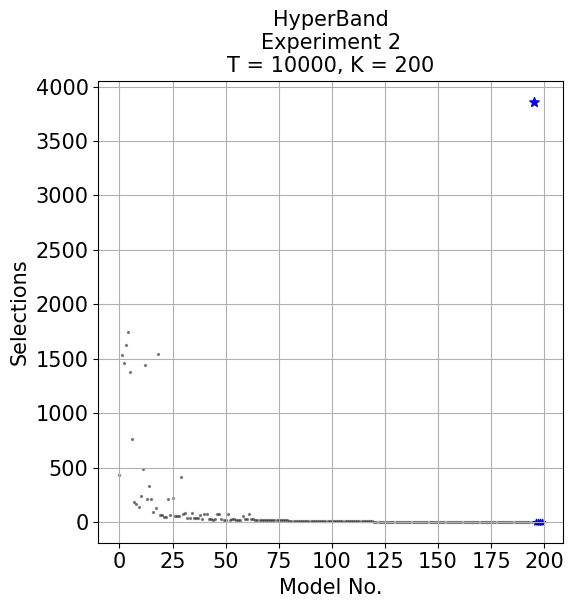

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 17.8154%
Time: 0.0032s
Number of HyperBand Rounds: 9
Average Epochs: [4.29000000e+02 1.53600000e+03 1.45900000e+03 1.62333333e+03
 1.74700000e+03 1.37711111e+03 7.59666667e+02 1.84000000e+02
 1.66000000e+02 1.42000000e+02 2.39444444e+02 4.86333333e+02
 1.44655556e+03 2.12111111e+02 3.35444444e+02 2.12000000e+02
 8.86666667e+01 1.29777778e+02 1.54277778e+03 6.13333333e+01
 6.13333333e+01 4.76666667e+01 4.76666667e+01 2.12222222e+02
 6.13333333e+01 2.25888889e+02 5.53333333e+01 5.53333333e+01
 5.53333333e+01 4.17666667e+02 7.47777778e+01 8.84444444e+01
 3.36666667e+01 3.86666667e+01 7.97777778e+01 3.86666667e+01
 3.86666667e+01 3.86666667e+01 6.61111111e+01 2.95555556e+01
 7.06666667e+01 7.06666667e+01 2.95555556e+01 2.95555556e+01
 1.58888889e+01 2.95555556e+01 7.06666667e+01 7.06666667e+01
 2.95555556e+01 1.58888889e+01 1.58888889e+01 7.06666667e+01
 1.58888889e+01 2.95555556e+01 2.95555556e+01 1.58888889e+01
 1.58888889e+01 1.58888889e+01 5.70000000e+01 2.95555556e+01
 2.95555556e+01 7.06666667e+01 2.95555556e+01 2.95555556e+01
 1.58888889e+01 1.58888889e+01 1.58888889e+01 1.58888889e+01
 1.58888889e+01 1.58888889e+01 1.58888889e+01 1.58888889e+01
 1.58888889e+01 1.58888889e+01 1.58888889e+01 1.58888889e+01
 1.58888889e+01 1.58888889e+01 1.58888889e+01 1.58888889e+01
 1.38888889e+01 1.38888889e+01 1.38888889e+01 1.38888889e+01
 1.38888889e+01 1.38888889e+01 1.38888889e+01 1.38888889e+01
 1.38888889e+01 1.38888889e+01 1.12222222e+01 1.12222222e+01
 1.12222222e+01 1.12222222e+01 1.12222222e+01 1.12222222e+01
 1.12222222e+01 1.12222222e+01 1.12222222e+01 1.12222222e+01
 1.12222222e+01 1.12222222e+01 1.12222222e+01 8.33333333e+00
 8.33333333e+00 8.33333333e+00 8.33333333e+00 8.33333333e+00
 8.33333333e+00 8.33333333e+00 8.33333333e+00 8.33333333e+00
 8.33333333e+00 8.33333333e+00 8.33333333e+00 8.33333333e+00
 8.33333333e+00 8.33333333e+00 8.33333333e+00 8.33333333e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.86100000e+03
 3.77777778e+00 3.77777778e+00 3.77777778e+00 3.77777778e+00]
49.515686274509804 0.00016521862300347047
T = 10000, K = 200, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 52.380 times more often than sub-optimal models on average


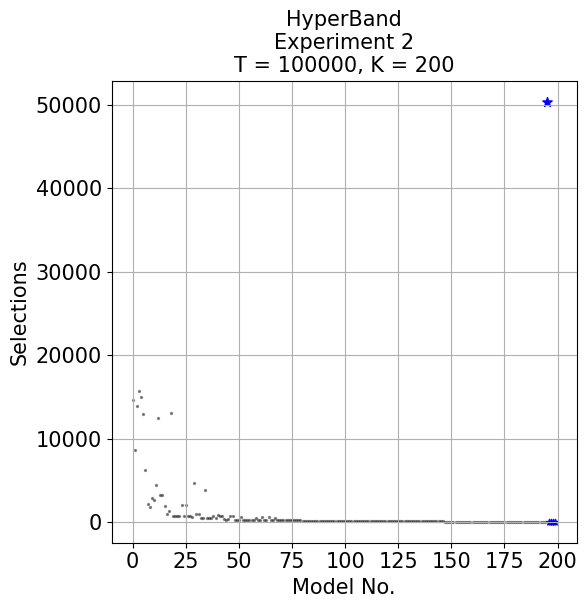

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 21.1537%
Time: 0.0060s
Number of HyperBand Rounds: 11
Average Epochs: [14683.09090909  8625.27272727 13973.72727273 15667.09090909
 14995.63636364 12975.90909091  6242.18181818  2202.
  1848.54545455  2858.63636364  2637.72727273  4437.
 12517.63636364  3202.54545455  3202.54545455  1968.27272727
   958.36363636  1295.         13079.54545455   734.
   734.           734.           734.          2080.72727273
   734.          2080.72727273   689.81818182   689.81818182
   616.18181818  4656.54545455   952.81818182   952.81818182
   542.54545455   542.54545455  3909.45454545   542.54545455
   468.90909091   468.90909091   693.36363636   468.90909091
   805.54545455   730.81818182   730.81818182   394.18181818
   282.           394.18181818   730.81818182   730.81818182
   319.45454545   319.45454545   207.27272727   656.09090909
   319.45454545   319.45454545   319.45454545   207.27272727
   319.45454545   207.27272727   543.90909091   319.45454545
   319.45454545   656.09090909   319.45454545   319.45454545
   656.09090909   207.27272727   207.27272727   543.90909091
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   192.54545455   192.54545455   192.54545455   192.54545455
   192.54545455   192.54545455   192.54545455   192.54545455
   168.           168.           168.           168.
   168.           168.           168.           168.
   168.           168.           143.45454545   143.45454545
   143.45454545   143.45454545   143.45454545   143.45454545
   143.45454545   143.45454545   143.45454545   143.45454545
   143.45454545   143.45454545   118.90909091   118.90909091
   118.90909091   118.90909091   118.90909091   118.90909091
   118.90909091   118.90909091   118.90909091   118.90909091
   118.90909091   118.90909091   118.90909091   118.90909091
   118.90909091   118.90909091    94.            94.
    94.            94.            94.            94.
    94.            94.            94.            94.
    94.            94.            94.            94.
    94.            94.            94.            94.
    94.            94.            94.            56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364    56.63636364
    56.63636364    56.63636364    56.63636364 50367.27272727
    56.63636364    56.63636364    56.63636364    56.63636364]
59.25399201596806 1.4289242578135416e-05
T = 100000, K = 200, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 62.179 times more often than sub-optimal models on average


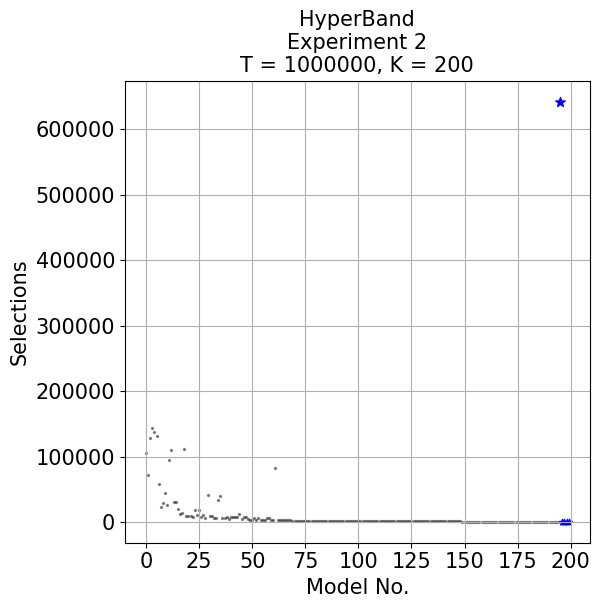

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 24.1530%
Time: 0.0084s
Number of HyperBand Rounds: 13
Average Epochs: [105486.92307692  71300.76923077 129157.61538462 143421.23076923
 137726.30769231 132028.69230769  57954.92307692  23766.92307692
  29622.23076923  44921.76923077  25958.53846154  94334.53846154
 109534.46153846  30713.07692308  30713.07692308  20267.76923077
  11720.76923077  14569.76923077 112385.61538462   9821.53846154
   9821.53846154   9821.53846154   7922.30769231  19318.30769231
  10771.30769231  19318.30769231   7585.84615385  10434.84615385
   7025.07692308  41213.07692308   9275.92307692   9275.92307692
   6426.92307692   6426.92307692  34293.84615385  39991.84615385
   5803.84615385   5803.84615385   8021.46153846   5172.46153846
   8021.46153846   8021.46153846   7388.69230769   7388.69230769
  13086.69230769   4539.69230769   7388.69230769   7388.69230769
   4539.69230769   3906.92307692   3906.92307692   6755.92307692
   3906.92307692   6755.92307692   3906.92307692   3906.92307692
   3906.92307692   6122.84615385   6122.84615385   3273.84615385
   3273.84615385  83045.92307692   3273.84615385   3273.84615385
   3273.84615385   3273.84615385   3273.84615385   3273.84615385
   3273.84615385   2324.23076923   2324.23076923   2324.23076923
   2324.23076923   2324.23076923   2324.23076923   2324.23076923
   2324.23076923   2324.23076923   2324.23076923   2324.23076923
   2212.07692308   2212.07692308   2212.07692308   2212.07692308
   2212.07692308   2212.07692308   2025.15384615   2025.15384615
   2025.15384615   2025.15384615   2025.15384615   2025.15384615
   2025.15384615   2025.15384615   1825.76923077   1825.76923077
   1825.76923077   1825.76923077   1825.76923077   1825.76923077
   1825.76923077   1825.76923077   1825.76923077   1825.76923077
   1618.07692308   1618.07692308   1618.07692308   1618.07692308
   1618.07692308   1618.07692308   1618.07692308   1618.07692308
   1618.07692308   1618.07692308   1618.07692308   1618.07692308
   1407.61538462   1407.61538462   1407.61538462   1407.61538462
   1407.61538462   1407.61538462   1407.61538462   1407.61538462
   1407.61538462   1407.61538462   1407.61538462   1407.61538462
   1407.61538462   1407.61538462   1196.69230769   1196.69230769
   1196.69230769   1196.69230769   1196.69230769   1196.69230769
   1196.69230769   1196.69230769   1196.69230769   1196.69230769
   1196.69230769   1196.69230769   1196.69230769   1196.69230769
   1196.69230769   1196.69230769   1196.69230769   1196.69230769
   1196.69230769    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    985.76923077    985.76923077
    985.76923077    985.76923077    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923    669.23076923
    669.23076923    669.23076923    669.23076923 641706.92307692
    669.23076923    669.23076923    669.23076923    669.23076923]
66.11272745450908 1.4997000599703547e-06
T = 1000000, K = 200, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 25.493 times more often than sub-optimal models on average


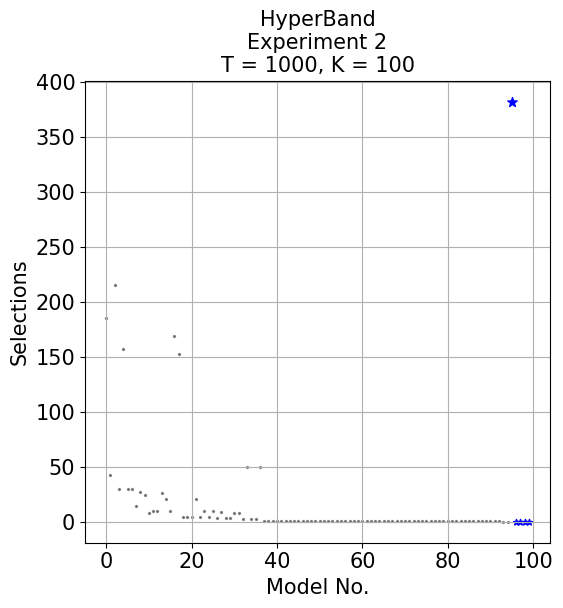

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 21.1505%
Time: 0.0013s
Number of HyperBand Rounds: 7
Average Epochs: [1.85142857e+02 4.24285714e+01 2.14857143e+02 3.00000000e+01
 1.56857143e+02 3.00000000e+01 3.00000000e+01 1.41428571e+01
 2.74285714e+01 2.40000000e+01 8.14285714e+00 1.00000000e+01
 1.00000000e+01 2.58571429e+01 2.05714286e+01 1.00000000e+01
 1.68714286e+02 1.52714286e+02 4.71428571e+00 4.71428571e+00
 4.71428571e+00 2.05714286e+01 4.71428571e+00 1.00000000e+01
 4.71428571e+00 1.00000000e+01 3.85714286e+00 9.14285714e+00
 3.85714286e+00 3.85714286e+00 8.00000000e+00 8.00000000e+00
 2.71428571e+00 5.02857143e+01 2.71428571e+00 2.71428571e+00
 5.02857143e+01 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 7.14285714e-01 7.14285714e-01 7.14285714e-01
 7.14285714e-01 1.42857143e-01 1.42857143e-01 3.81857143e+02
 1.42857143e-01 1.42857143e-01 1.42857143e-01 1.42857143e-01]
37.409090909090914 0.0010163945352271613
T = 1000, K = 100, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 38.330 times more often than sub-optimal models on average


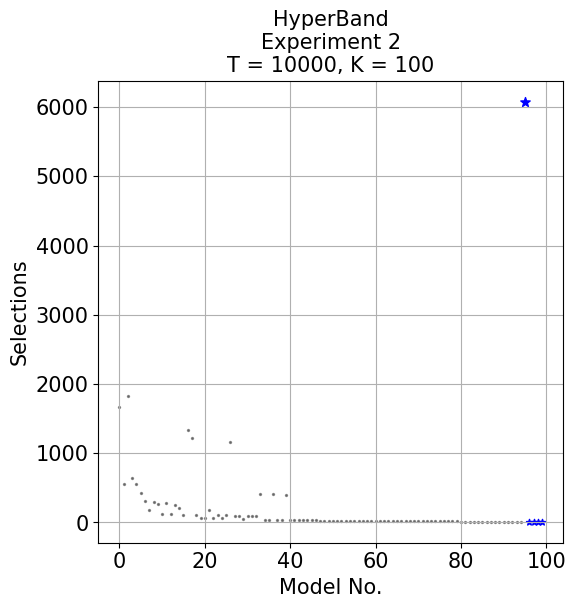

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 28.6871%
Time: 0.0023s
Number of HyperBand Rounds: 9
Average Epochs: [1663.          552.         1829.44444444  636.33333333  554.
  430.77777778  307.33333333  184.          289.33333333  265.33333333
  116.          280.55555556  129.77777778  253.22222222  212.11111111
  102.44444444 1337.         1213.44444444  102.44444444   61.33333333
   61.33333333  184.77777778   61.33333333  102.44444444   61.33333333
  102.44444444 1166.44444444   96.44444444   96.44444444   47.33333333
   88.44444444   88.44444444   88.44444444  409.           38.66666667
   38.66666667  409.           38.66666667   38.66666667  399.88888889
   29.55555556   29.55555556   29.55555556   29.55555556   29.55555556
   29.55555556   29.55555556   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   15.88888889   15.88888889   15.88888889   15.88888889   15.88888889
   13.88888889   13.88888889   13.88888889   13.88888889   13.88888889
   13.88888889   13.88888889   13.88888889   13.88888889   13.88888889
   11.22222222   11.22222222   11.22222222   11.22222222   11.22222222
 6078.           11.22222222   11.22222222   11.22222222   11.22222222]
55.73861386138614 4.8504747381845155e-05
T = 10000, K = 100, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 48.707 times more often than sub-optimal models on average


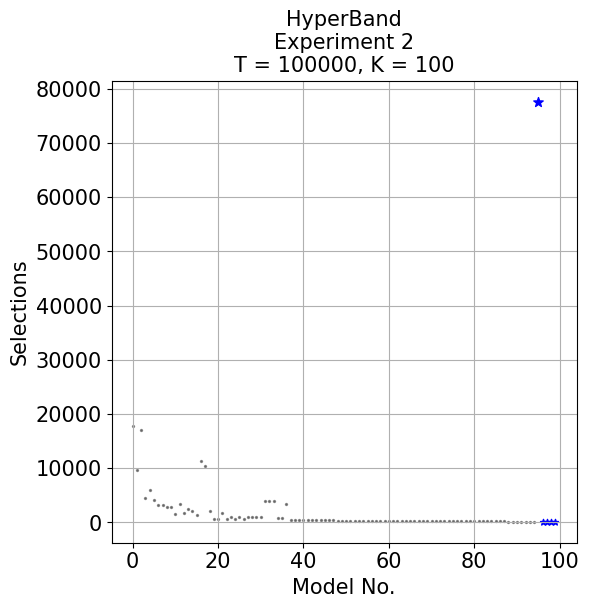

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 33.7978%
Time: 0.0035s
Number of HyperBand Rounds: 11
Average Epochs: [17716.09090909  9636.27272727 17004.09090909  4557.72727273
  5904.81818182  4222.          3211.90909091  3211.90909091
  2858.45454545  2858.45454545  1627.63636364  3426.72727273
  1743.36363636  2529.27272727  2192.63636364  1295.
 11396.         10385.81818182  2080.72727273   734.
   734.          1744.09090909   734.          1070.63636364
   734.          1070.63636364   689.81818182  1026.45454545
   952.81818182   952.81818182   952.81818182  3983.09090909
  3909.45454545  3909.45454545   879.18181818   879.18181818
  3499.18181818   468.90909091   468.90909091   468.90909091
   468.90909091   394.18181818   394.18181818   394.18181818
   394.18181818   394.18181818   394.18181818   394.18181818
   319.45454545   319.45454545   319.45454545   319.45454545
   319.45454545   319.45454545   319.45454545   319.45454545
   319.45454545   319.45454545   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   207.27272727   207.27272727   207.27272727   207.27272727
   192.54545455   192.54545455   192.54545455   192.54545455
   192.54545455   192.54545455   192.54545455   192.54545455
   168.           168.           168.           168.
   168.           168.           168.         77634.09090909
   168.           168.           168.           143.45454545]
100%|██████████| 10/10 [01:20<00:00,  8.00s/it]
64.77852147852147 1.0989010989026494e-05
T = 100000, K = 100, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 43.395 times more often than sub-optimal models on average


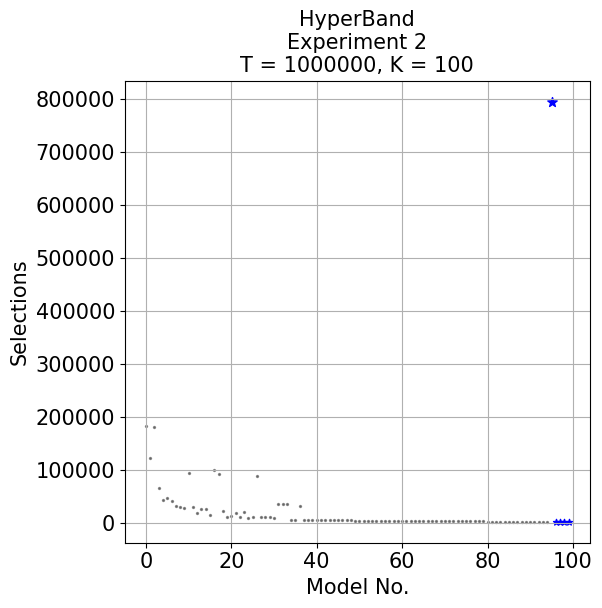

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 31.2658%
Time: 0.0086s
Number of HyperBand Rounds: 13
Average Epochs: [182409.92307692 122582.76923077 180439.69230769  66498.23076923
  43709.30769231  46558.61538462  40860.92307692  32313.92307692
  29622.23076923  27827.76923077  94334.53846154  28807.53846154
  18366.38461538  25015.07692308  25015.07692308  14569.76923077
 100039.84615385  91492.76923077  21217.53846154   9821.53846154
  12670.53846154  18368.53846154  10771.30769231  19318.30769231
   7922.30769231  10771.30769231  87357.92307692  10434.84615385
   9874.07692308   9874.07692308   9275.92307692  34916.92307692
  34916.92307692  34916.92307692   5803.84615385   5803.84615385
  31444.84615385   5803.84615385   5172.46153846   5172.46153846
   5172.46153846   5172.46153846   4539.69230769   4539.69230769
   4539.69230769   4539.69230769   4539.69230769   4539.69230769
   4539.69230769   3906.92307692   3906.92307692   3906.92307692
   3906.92307692   3906.92307692   3906.92307692   3906.92307692
   3906.92307692   3273.84615385   3273.84615385   3273.84615385
   3273.84615385   3273.84615385   3273.84615385   3273.84615385
   3273.84615385   3273.84615385   3273.84615385   3273.84615385
   3273.84615385   2324.23076923   2324.23076923   2324.23076923
   2324.23076923   2324.23076923   2324.23076923   2324.23076923
   2324.23076923   2324.23076923   2324.23076923   2324.23076923
   2212.07692308   2212.07692308   2212.07692308   2212.07692308
   2212.07692308   2212.07692308   2025.15384615   2025.15384615
   2025.15384615   2025.15384615   2025.15384615   2025.15384615
   2025.15384615   2025.15384615   1825.76923077 795553.
   1825.76923077   1825.76923077   1825.76923077   1825.76923077]
70.54011598840117 2.0997900210262266e-06
T = 1000000, K = 100, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 19.103 times more often than sub-optimal models on average


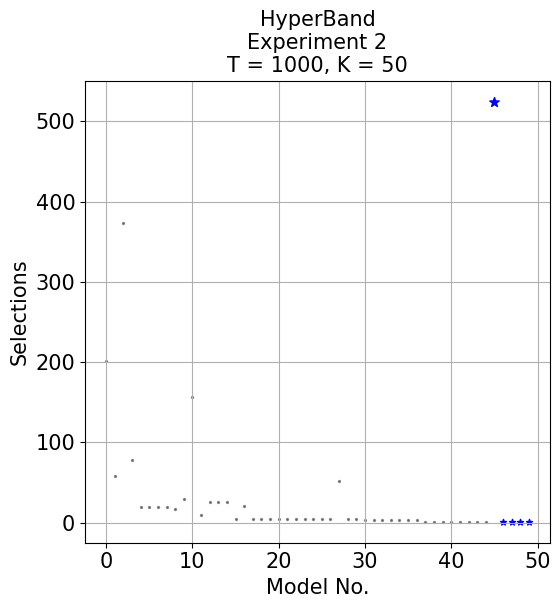

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 29.7328%
Time: 0.0011s
Number of HyperBand Rounds: 7
Average Epochs: [201.          58.28571429 373.42857143  77.57142857  19.42857143
  19.42857143  19.42857143  19.42857143  16.85714286  29.28571429
 156.28571429  10.          25.85714286  25.85714286  25.85714286
   4.71428571  20.57142857   4.71428571   4.71428571   4.71428571
   4.71428571   4.71428571   4.71428571   4.71428571   4.71428571
   4.71428571   3.85714286  51.42857143   3.85714286   3.85714286
   2.71428571   2.71428571   2.71428571   2.71428571   2.71428571
   2.71428571   2.71428571   1.           1.           1.
   1.           1.           1.           1.           1.
 524.57142857   1.           1.           1.           1.        ]
43.219047619047615 0.0052992105688546955
T = 1000, K = 50, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 19.145 times more often than sub-optimal models on average


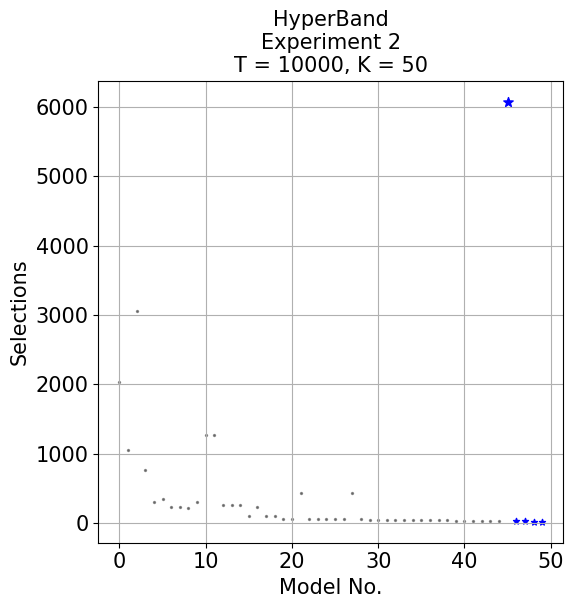

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 29.7143%
Time: 0.0080s
Number of HyperBand Rounds: 9
Average Epochs: [2033.         1045.66666667 3063.77777778  759.66666667  307.33333333
  348.55555556  225.11111111  225.11111111  207.11111111  306.55555556
 1268.22222222 1268.22222222  253.22222222  253.22222222  253.22222222
  102.44444444  225.88888889  102.44444444  102.44444444   61.33333333
   61.33333333  431.66666667   61.33333333   61.33333333   61.33333333
   61.33333333   55.33333333  425.66666667   55.33333333   47.33333333
   47.33333333   47.33333333   47.33333333   38.66666667   38.66666667
   38.66666667   38.66666667   38.66666667   38.66666667   29.55555556
   29.55555556   29.55555556   29.55555556   29.55555556   29.55555556
 6078.           29.55555556   29.55555556   15.88888889   15.88888889]
61.410945273631846 0.00021708879830120242
T = 10000, K = 50, Experiment: 2
'''
PlotHypSelections(input_string)

Optimal model recommended 20.721 times more often than sub-optimal models on average


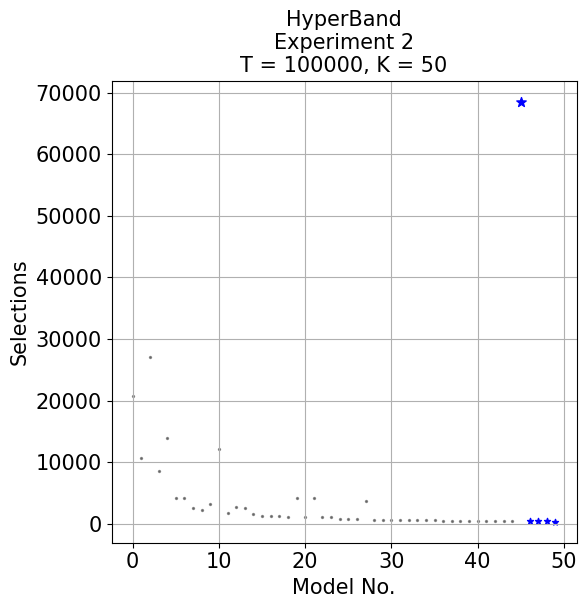

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 31.3121%
Time: 0.0024s
Number of HyperBand Rounds: 11
Average Epochs: [20745.81818182 10646.18181818 27104.81818182  8597.90909091
 13986.          4222.          4222.          2538.63636364
  2185.18181818  3195.27272727 12065.27272727  1743.36363636
  2753.45454545  2529.27272727  1519.18181818  1295.
  1295.          1295.          1070.63636364  4100.90909091
  1070.63636364  4100.90909091  1070.63636364  1070.63636364
   734.           734.           689.81818182  3720.09090909
   616.18181818   616.18181818   616.18181818   616.18181818
   542.54545455   542.54545455   542.54545455   542.54545455
   468.90909091   468.90909091   468.90909091   468.90909091
   468.90909091   394.18181818   394.18181818   394.18181818
   394.18181818 68543.18181818   394.18181818   394.18181818
   394.18181818   319.45454545]
70.17531234382808 1.4275718997563804e-05
T = 100000, K = 50, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 19.330 times more often than sub-optimal models on average


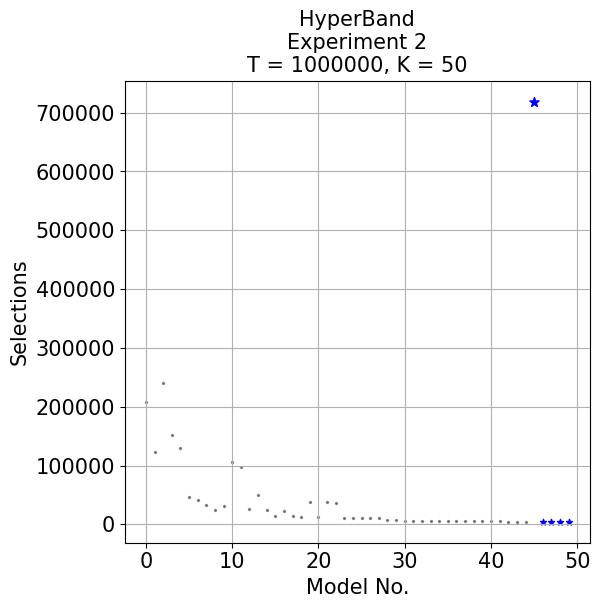

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 29.8215%
Time: 0.0037s
Number of HyperBand Rounds: 13
Average Epochs: [208050.92307692 122582.76923077 240268.69230769 151968.23076923
 129179.38461538  46558.61538462  40860.92307692  32313.92307692
  23924.23076923  30676.76923077 105730.61538462  97183.61538462
  26913.38461538  50656.07692308  25015.07692308  14569.76923077
  23116.76923077  14569.76923077  12670.53846154  38311.53846154
  12670.53846154  38311.53846154  36412.30769231  10771.30769231
  10771.30769231  10771.30769231  10434.84615385  10434.84615385
   7025.07692308   7025.07692308   6426.92307692   6426.92307692
   6426.92307692   6426.92307692   5803.84615385   5803.84615385
   5803.84615385   5803.84615385   5172.46153846   5172.46153846
   5172.46153846   5172.46153846   4539.69230769   4539.69230769
   4539.69230769 718629.92307692   4539.69230769   4539.69230769
   4539.69230769   4539.69230769]
72.8377181140943 3.3821377981723626e-06
T = 1000000, K = 50, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 10.022 times more often than sub-optimal models on average


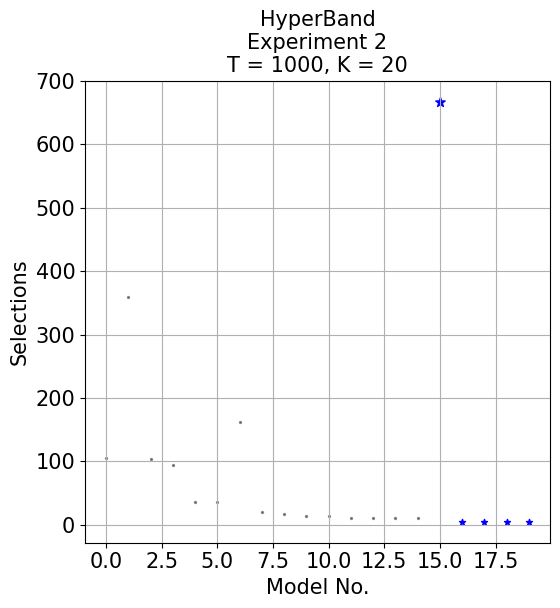

In [ ]:
input_string = '''
HyperBand
Optimal Pulls: 39.6049%
Time: 0.0015s
Number of HyperBand Rounds: 7
Average Epochs: [105.85714286 359.71428571 103.71428571  93.42857143  35.28571429
  35.28571429 162.28571429  19.42857143  16.85714286  13.42857143
  13.42857143  10.          10.          10.          10.
 667.28571429   4.71428571   4.71428571   4.71428571   4.71428571]
49.88235294117647 0.0028005601680560098
T = 1000, K = 20, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 9.319 times more often than sub-optimal models on average


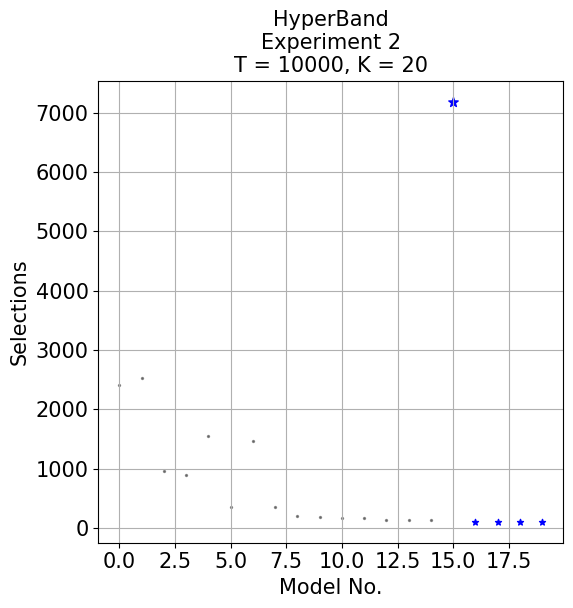

In [ ]:
input_string = '''
HyperBand
Optimal Pulls: 37.5015%
Time: 0.0016s
Number of HyperBand Rounds: 9
Average Epochs: [2403.33333333 2527.11111111  965.11111111  883.11111111 1541.88888889
  348.55555556 1459.66666667  348.55555556  207.11111111  183.11111111
  157.11111111  157.11111111  129.77777778  129.77777778  129.77777778
 7189.          102.44444444  102.44444444  102.44444444  102.44444444]
52.81437125748503 0.0003279775793444263
T = 10000, K = 20, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 10.358 times more often than sub-optimal models on average


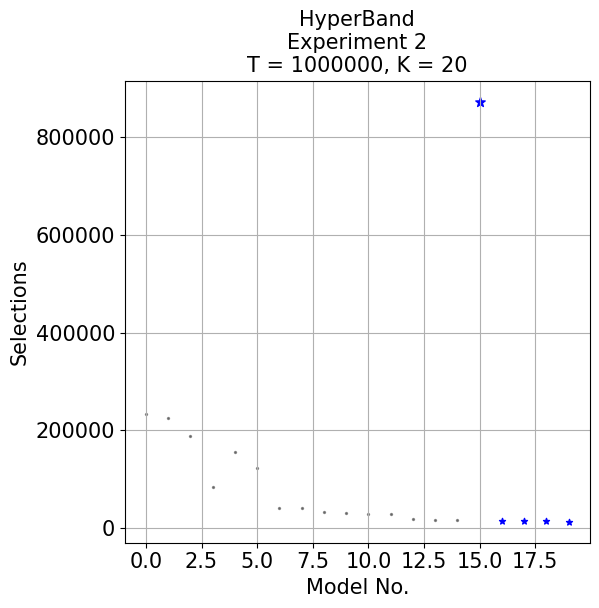

In [ ]:
input_string = '''
HyperBand
Optimal Pulls: 39.7961%
Time: 0.0024s
Number of HyperBand Rounds: 13
Average Epochs: [233691.92307692 225146.84615385 188986.69230769  83592.23076923
 154820.38461538 123481.69230769  40860.92307692  40860.92307692
  32471.23076923  30676.76923077  28807.53846154  28807.53846154
  18366.38461538  16468.07692308  16468.07692308 872475.92307692
  14569.76923077  14569.76923077  14569.76923077  12670.53846154]
81.15843683126339 4.898881507741099e-07
T = 1000000, K = 20, Experiment: 2'''
PlotHypSelections(input_string)

Optimal model recommended 11.939 times more often than sub-optimal models on average


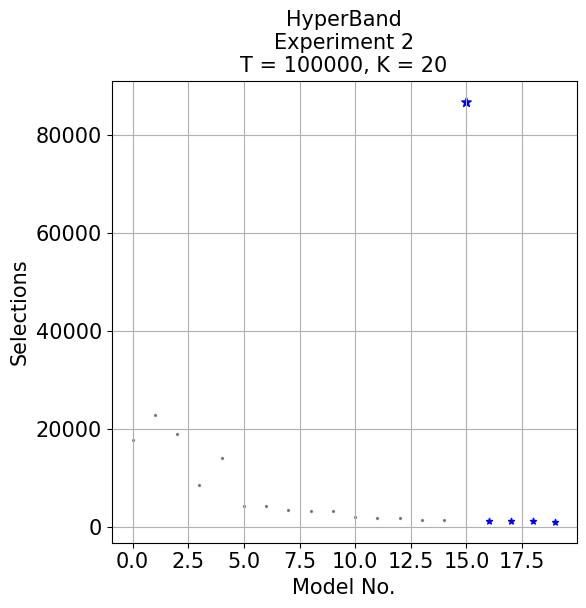

In [ ]:
input_string = '''HyperBand
Optimal Pulls: 43.2232%
Time: 0.0021s
Number of HyperBand Rounds: 11
Average Epochs: [17715.54545455 22767.36363636 19024.09090909  8597.90909091
 13986.          4222.          4222.          3548.72727273
  3195.27272727  3195.27272727  1964.27272727  1743.36363636
  1743.36363636  1519.18181818  1519.18181818 86724.81818182
  1295.          1295.          1295.          1070.63636364]
77.16396720655868 1.7432109352280677e-05
T = 100000, K = 20, Experiment: 2'''
PlotHypSelections(input_string)